In [ ]:
from google.colab import drive
drive.mount('/content/drive') 

Mounted at /content/drive


### Импорт

In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import cv2
import imutils
import tensorflow as tf
from keras import models
from google.colab.patches import cv2_imshow
from statistics import mode
from google.colab.patches import cv2_imshow
# import os

### Функции и модели

In [ ]:
rotation_model = tf.keras.models.load_model('/content/drive/MyDrive/scans/rotation_angle_model.h5')

In [ ]:
digit_model = tf.keras.models.load_model('/content/drive/MyDrive/scans/checkpoints/digit_written/numbers_model.h5')

In [ ]:
def automatic_brightness_and_contrast(image, clip_hist_percent=5):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Calculate grayscale histogram
    hist = cv2.calcHist([gray],[0],None,[256],[0,256])
    hist_size = len(hist)
    
    # Calculate cumulative distribution from the histogram
    accumulator = []
    accumulator.append(float(hist[0]))
    for index in range(1, hist_size):
        accumulator.append(accumulator[index -1] + float(hist[index]))
    
    # Locate points to clip
    maximum = accumulator[-1]
    clip_hist_percent *= (maximum/100.0)
    clip_hist_percent /= 2.0
    
    # Locate left cut
    minimum_gray = 0
    while accumulator[minimum_gray] < clip_hist_percent:
        minimum_gray += 1
    
    # Locate right cut
    maximum_gray = hist_size -1
    while accumulator[maximum_gray] >= (maximum - clip_hist_percent):
        maximum_gray -= 1
    
    # Calculate alpha and beta values
    alpha = 255 / (maximum_gray - minimum_gray)
    beta = -minimum_gray * alpha

    auto_result = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return auto_result

In [ ]:
def prepare_scan(img):
    """если скан вертикальный или перевернутый, то поворачиваем
    улучшаем контраст и яркость,
    возвращаем бинарное изобраажение"""
    resized = cv2.resize(img, (297, 210)) # Пропорции формата А4
    gray = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)
    res = rotation_model.predict(tf.expand_dims(gray, axis = 0)) #определяем угол поворота
    angle = res.argmax()
    # new_img = imutils.rotate_bound(img, angle)
    new_img = imutils.rotate_bound(img, 0)
    bright_image = tf.image.adjust_brightness(new_img, 0.2) 
    #понижаем немного яркость и повышаем контраст
    # contrast_image = tf.image.adjust_contrast(bright_image, 10.0)
    # contrast_image =  automatic_brightness_and_contrast(new_img)

    # Grayscale and thresholding
    frame = np.array(bright_image, dtype="uint8")
    img2 = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    # (thresh, img_bin) = cv2.threshold(img2, 250, 255,cv2.THRESH_BINARY_INV|cv2.THRESH_OTSU)
    # img_bin = cv2.adaptiveThreshold(img2,255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,21, 10)
    img_bin = cv2.adaptiveThreshold(img2, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 21, 10)
    kernel = np.ones((1,1),np.uint8)
    img_bin = cv2.morphologyEx(img_bin, cv2.MORPH_OPEN, kernel)
    img_bin = cv2.morphologyEx(img_bin, cv2.MORPH_CLOSE, kernel)
    
    return img_bin 

In [ ]:
def sort_contours(cnts):
  """
  сортируем полученные контуры сверху вниз и слева направо
  """
  boundingBoxes = [cv2.boundingRect(c) for c in cnts]
  centers_sum = [((boundingBoxes[i][0] + boundingBoxes[i][2])/2, (boundingBoxes[i][1] + boundingBoxes[i][3])/2) for i in range(len(boundingBoxes))]
  (cnts, boundingBoxes, centers) = zip(*sorted(zip(cnts, boundingBoxes, centers_sum), key=lambda b:b[1][1]))
  return (cnts, boundingBoxes, centers)

In [ ]:
def get_table_mask(img_bin):
  """функция получения маски таблицы на листе по линиям"""
  # detecting cells
  kernel_length = np.array(img_bin).shape[1]//150
  # vertical lines
  verticle_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, kernel_length))
  # horizontal lines
  horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel_length, 1))
  # crossing kernel?
  kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))

  # detecting vertical and horizontal lines
  img_temp1 = cv2.erode(img_bin, verticle_kernel, iterations=3)
  verticle_lines_img = cv2.dilate(img_temp1, verticle_kernel, iterations=3)
  img_temp2 = cv2.erode(img_bin, horizontal_kernel, iterations=3)
  horizontal_lines_img = cv2.dilate(img_temp2, horizontal_kernel, iterations=3)
  # дорисовать линии 
  kernel_add_h = np.ones((1,200), np.uint8)  # horizontal kernel
  d_im = cv2.dilate(horizontal_lines_img, kernel_add_h, iterations=3)
  horizontal_lines_img = cv2.erode(d_im, kernel_add_h, iterations=3) 
  kernel_add_v = np.ones((40,1), np.uint8)  # vertical kernel
  d_im = cv2.dilate(verticle_lines_img, kernel_add_v, iterations=3)
  verticle_lines_img = cv2.erode(d_im, kernel_add_v, iterations=3) 

  # getting mask from horizontal and vertical lines to detect cells
  alpha = 0.5
  beta = 1.0 - alpha
  # This function helps to add two image with specific weight parameter to get a third image as summation of two image.
  img_final_bin = cv2.addWeighted(verticle_lines_img, alpha, horizontal_lines_img, beta, 0.0)
  img_final_bin = cv2.erode(~img_final_bin, kernel, iterations=2)

  # kernel = np.ones((100,1), np.uint8)  # vetical kernel
  # d_im = cv2.dilate(img_final_bin, kernel, iterations=1)
  # e_im = cv2.erode(d_im, kernel, iterations=1) 

  # (thresh, img_final_bin) = cv2.threshold(img_final_bin, 128,255, cv2.THRESH_BINARY  | cv2.THRESH_OTSU)
  img_final_bin = cv2.adaptiveThreshold(img_final_bin, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 21, 10)

  return img_final_bin

In [ ]:
def get_number(contours_digit, img_bin):  
  """функция определения одной цифры из вырезанной части.
  на входе контуры и входное бинарное изображение,
  на выходе строка с полным числом(2..n - разрядным)"""
  m_heights = [cv2.boundingRect(c)[3] for c in contours_digit]

  idx = 0
  symbol = ''
   
  contours_digit, _ , _ = sort_contours(contours_digit)
  for c in reversed(contours_digit):
    x,y,w,h = cv2.boundingRect(c)
    new_img = img_bin[y:y+h, x:x+w]
    # расширяем границы
    top, bottom, left, right = [7]*4
    new_img = cv2.copyMakeBorder(new_img, top, bottom, left, right, cv2.BORDER_CONSTANT, value=[0,0,0])
    plt.imshow(new_img)
    plt.show()
    idx += 1
    # cv2.imwrite("/content/drive/MyDrive/scans/cut_imgs2/"+str(idx) + '.jpg', new_img)
    # (h < mode(m_heights)//2)&
    print('perimeter', cv2.arcLength(c, True))
    # если шум
    if (cv2.arcLength(c, True) < 30)&(cv2.arcLength(c, True) > 200):
      print('here noise')
      # symbol += ''
     # если минус &('-' not in symbol)
    elif (h < w)&(cv2.arcLength(c, True) > 30)&(cv2.arcLength(c, True) < 100):  # проверяем на минус(если меньше половины средней высоты)
      print('here minus')
      symbol += '-'
    else:
      resized = cv2.resize(new_img, (28, 28))
      # gray = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)
      resized = resized.reshape(784)
      resized = resized.astype('float32')
      res = digit_model.predict(tf.expand_dims(resized, axis = 0))
      new_number = np.argmax(res)
      symbol += str(new_number)
      print('symbol', symbol)

  try:
    symbol = int(symbol)
  except:
    symbol = 0

  return symbol

In [ ]:
def get_real_sums(new_img): #new version
  """функция определения суммы чисел в ячейке.
  разбиваем ячейку на строки, далее определяем контуры(разбиваем на числа),
  предсказываем числа,
  считаем сумму всех строк в ячейке"""
  sell_sum = [] # Список для расчета суммы в ячейке
  
  img_height, img_width = new_img.shape[:2]

  # определяем строки внутри ячейки
  count = np.count_nonzero(new_img == 0, axis=1)   # считаем белые пиксели в каждой строке
  count_thresh = count.copy()    # создаем маску
  count_thresh[count==img_width] = 255
  count_thresh[count<img_width] = 0
  # добавляем пустую строку внизу, чтобы строка распозналась. из-за того что заезжают в рукописной части
  top, bottom, left, right = 0, 2, 0, 0
  count_thresh = cv2.copyMakeBorder(count_thresh, top, bottom, left, right, cv2.BORDER_CONSTANT, value=255)
  count_thresh = count_thresh.astype(np.uint8)

  # получаем контуры по каждой строке
  contours, _ = cv2.findContours(count_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)   # находим контуры

  x,y,w,h = cv2.boundingRect(contours[-1])
  ycenter1 = y+h//2
  # разбиваем строки на отдельные изображения
  for cntr in reversed(contours[:-1]):
    x,y,w,h = cv2.boundingRect(cntr)
    ycenter2 = y+h//2
    new_img2 = new_img[ycenter1:ycenter2, :]
    ycenter1 = ycenter2    
    contours_digit, _ = cv2.findContours(new_img2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # получение предсказания символа 
    sum = get_number(contours_digit, new_img2)
    sell_sum.append(int(sum))

  return sell_sum

In [ ]:
def get_written_sums(new_img):
  """функция определения написанного ответа"""
  # получаем контуры цифр
  # gray = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)
  # (thresh, img_bin) = cv2.threshold(gray, 0, 255,cv2.THRESH_BINARY_INV|cv2.THRESH_OTSU)
  contours, _ = cv2.findContours(new_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  # x,y,w,h = cv2.boundingRect(contours[-1])
  # ycenter1 = y+h//2
  written_answer = get_number(contours, new_img)
  plt.imshow(new_img)
  plt.show()
  print('written_answer', written_answer)

  return written_answer


### Getting result from scan

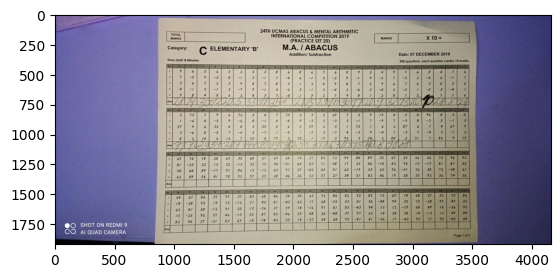

1/1 [==============================] - 0s 81ms/step


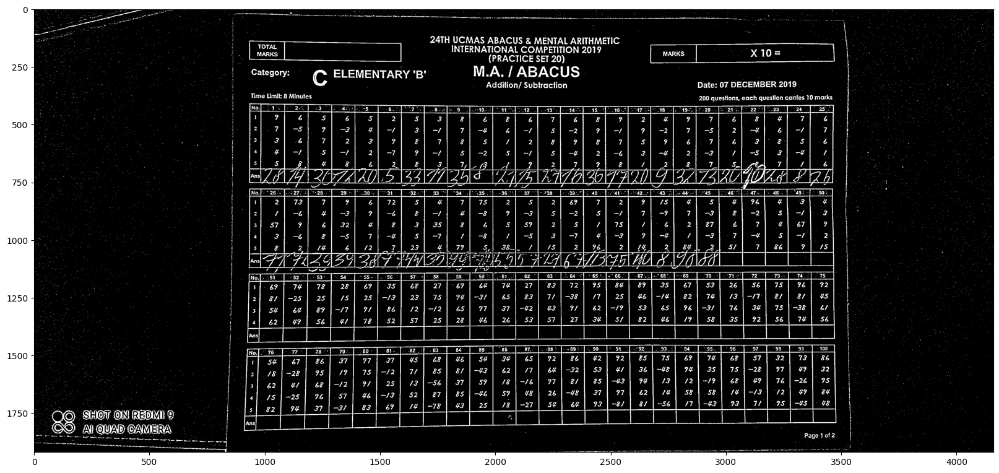

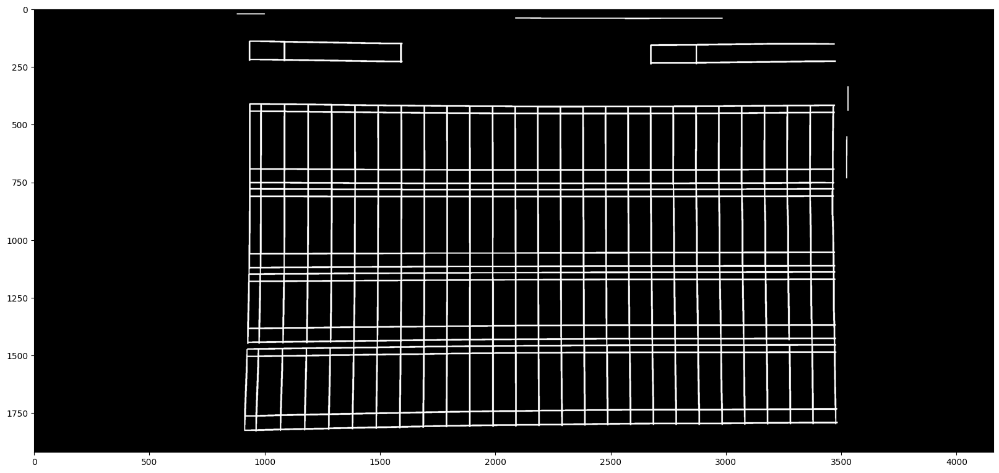

In [ ]:
img = cv2.imread('/content/drive/MyDrive/scans/IMG_20230426_203101.jpg')
plt.imshow(img)
plt.show()
img_rotated = prepare_scan(img) # получаем развернутое горизонтально черно-белое изображение
img_final_bin = get_table_mask(img_rotated) # получаем маску для таблицы

plt.figure(figsize=(20,10))
plt.imshow(img_rotated, cmap = 'gray')
plt.show()
plt.figure(figsize=(20,10))
plt.imshow(img_final_bin, cmap = 'gray')
plt.show()

In [ ]:
contours, hierarchy = cv2.findContours(img_final_bin, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
# cells = [contours[i] for i in range(len(contours)) if (hierarchy[0][i][-1] == -1)&(hierarchy[0][i][-2] == -1)]
# rows = [contours[i] for i in range(len(contours)) if (hierarchy[0][i][-2] == -1)&(hierarchy[0][i][-1] != -1)]
# num_rows = len(rows)
# contours, boundingBoxes, centers = sort_contours(cells)
contours, boundingBoxes, centers = sort_contours(contours)

widths = [boundingBoxes[c][2] for c in range(len(boundingBoxes))]
heights = [boundingBoxes[c][3] for c in range(len(boundingBoxes))]

In [ ]:
cells = []
for c in contours:
  x, y, w, h = cv2.boundingRect(c) 
  count_black = np.sum(img_rotated[y:y+h, x:x+w] == 0)# считаем белые пиксели в ячейке
  # по ширине, по высоте, белый фон
  if ((w > mode(widths)-20)&(w < mode(widths)+20))&(h > mode(heights) + 8)&(count_black > 20):
    cells.append(c)

# на какое число делится без остатка (количество строк)
# предполагается что на листе от 3 до 5 строк
for j in range(3,5):
  while False:
    len(cells)%j == 0
  num_rows = j

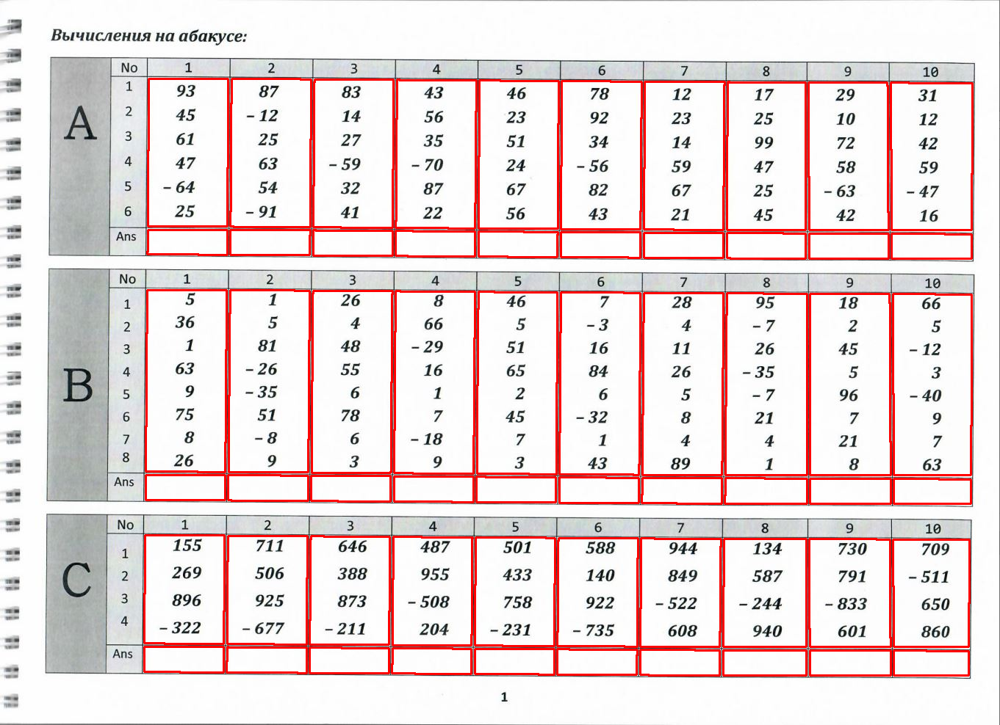

In [ ]:
cv2.drawContours(img, cells, -1, (0,0,255), 2)
cv2_imshow(img) # выводим итоговое изображение в окно

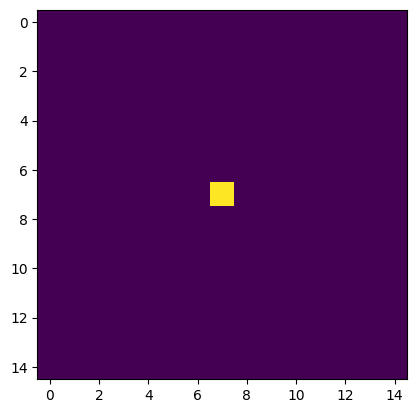

perimeter 0.0
here noise


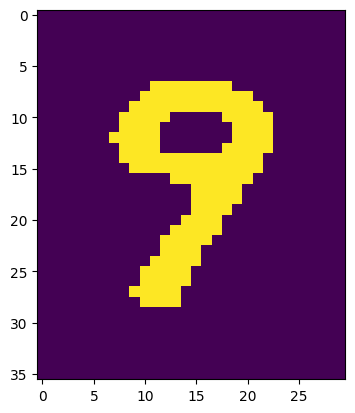

perimeter 68.18376529216766
1/1 [==============================] - 0s 42ms/step
symbol 9


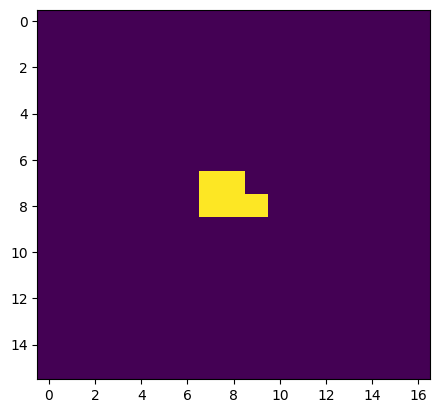

perimeter 5.414213538169861
here noise


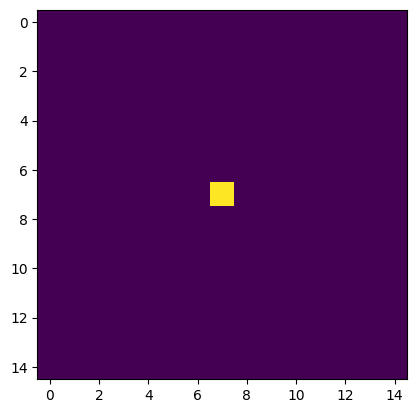

perimeter 0.0
here noise


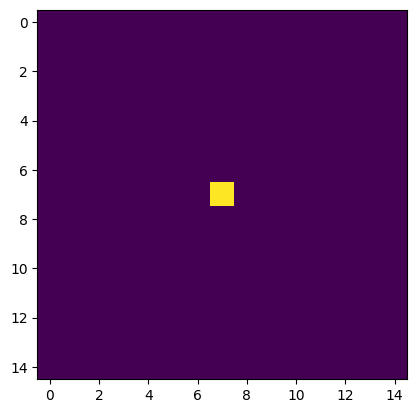

perimeter 0.0
here noise


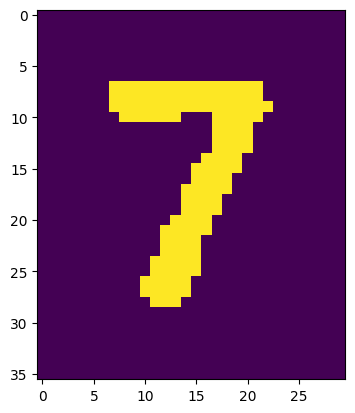

perimeter 75.69848430156708
1/1 [==============================] - 0s 38ms/step
symbol 7


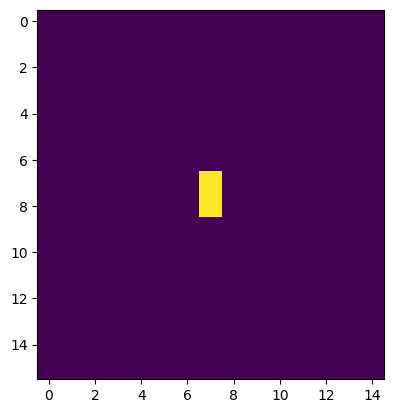

perimeter 2.0
here noise


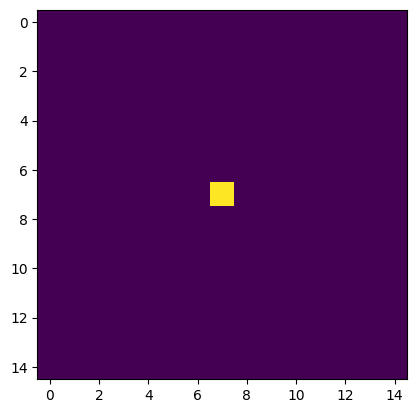

perimeter 0.0
here noise


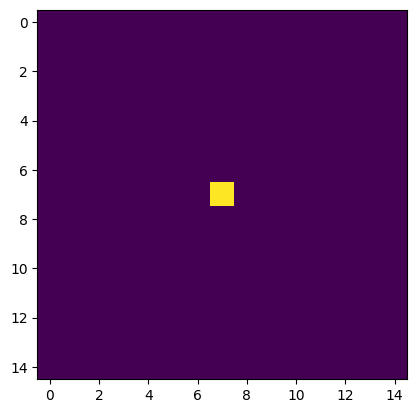

perimeter 0.0
here noise


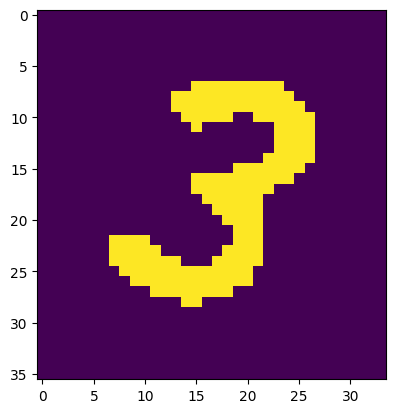

perimeter 98.08326005935669
1/1 [==============================] - 0s 30ms/step
symbol 3


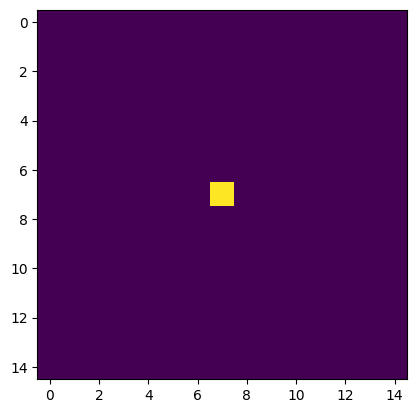

perimeter 0.0
here noise


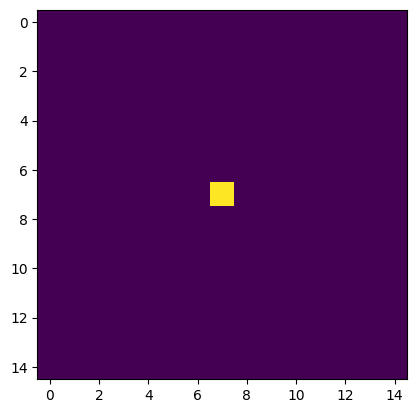

perimeter 0.0
here noise


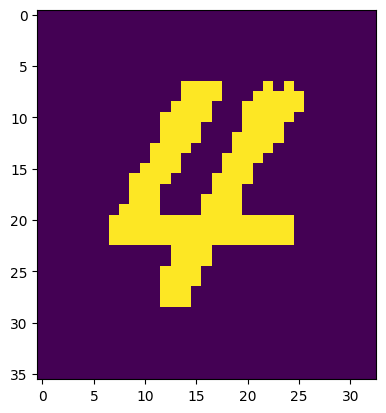

perimeter 108.9116872549057
1/1 [==============================] - 0s 29ms/step
symbol 4


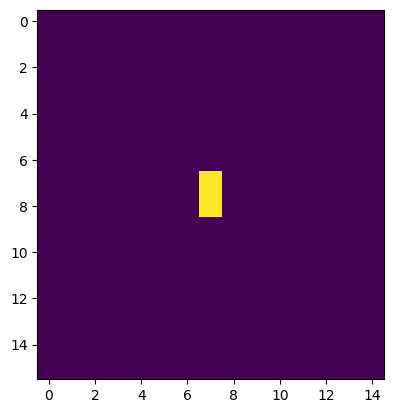

perimeter 2.0
here noise


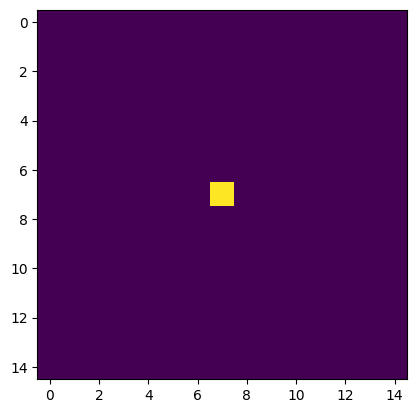

perimeter 0.0
here noise


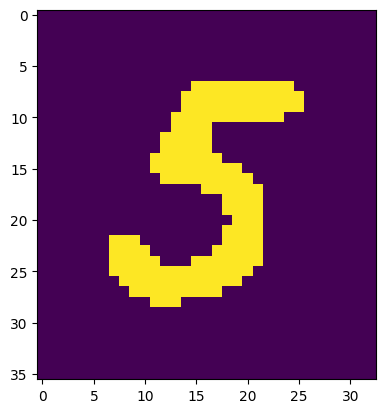

perimeter 93.01219248771667
1/1 [==============================] - 0s 25ms/step
symbol 5


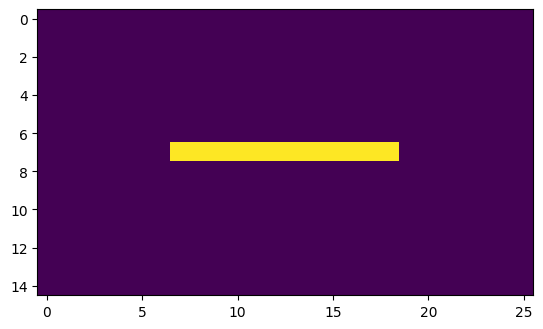

perimeter 22.0
here noise


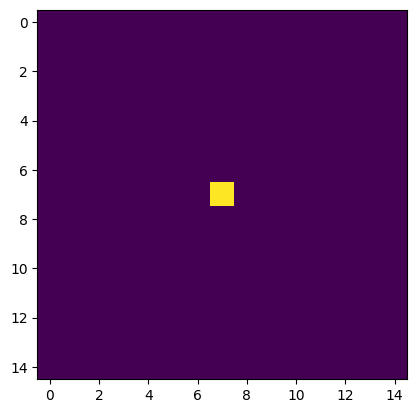

perimeter 0.0
here noise


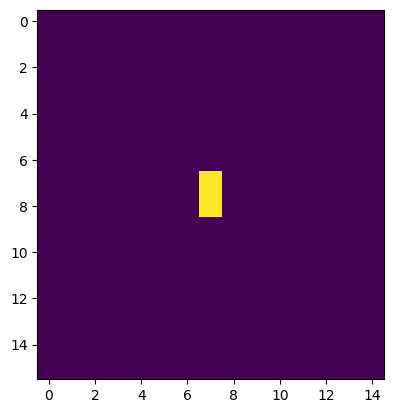

perimeter 2.0
here noise
[9, 7, 0, 3, 0, 4, 0, 5, 0]


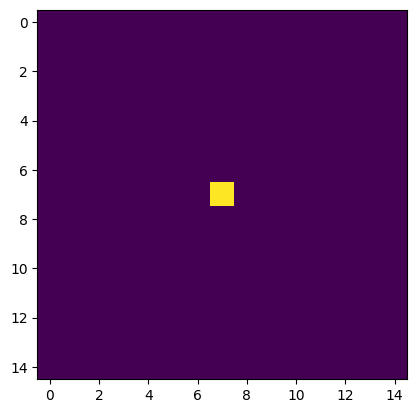

perimeter 0.0
here noise


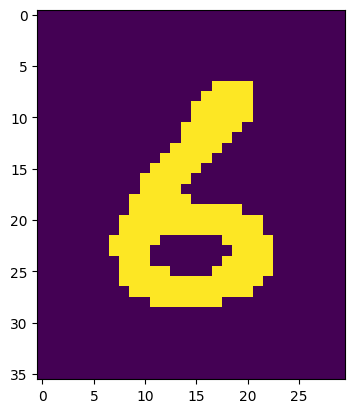

perimeter 70.18376588821411
1/1 [==============================] - 0s 28ms/step
symbol 6


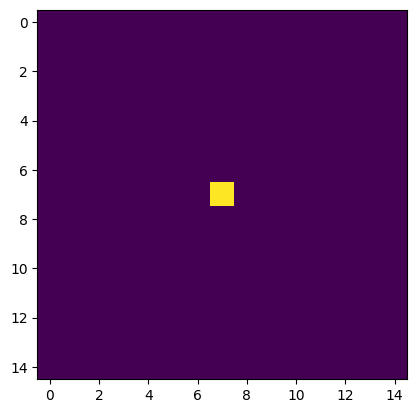

perimeter 0.0
here noise


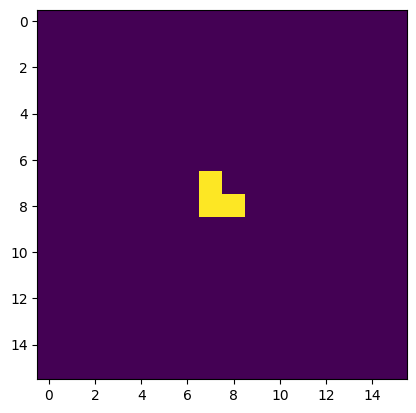

perimeter 3.414213538169861
here noise


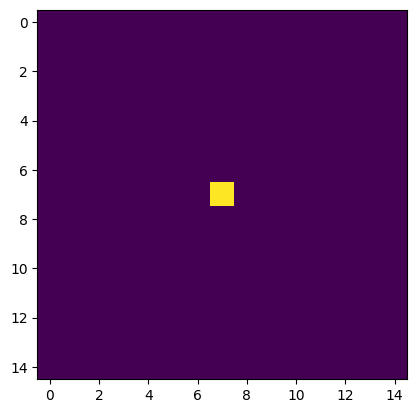

perimeter 0.0
here noise


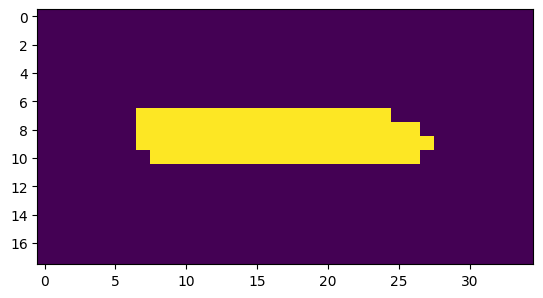

perimeter 43.65685415267944
here minus


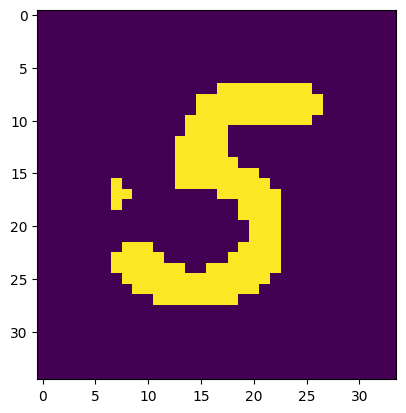

perimeter 92.18376541137695
1/1 [==============================] - 0s 24ms/step
symbol -5


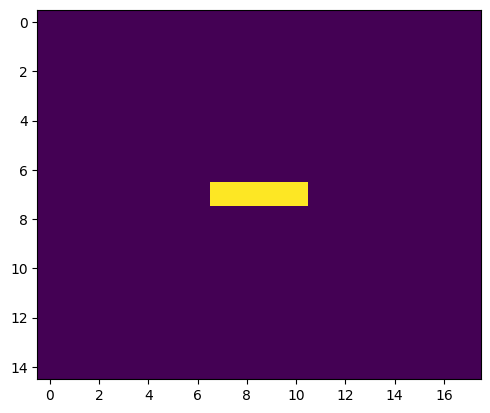

perimeter 6.0
here noise


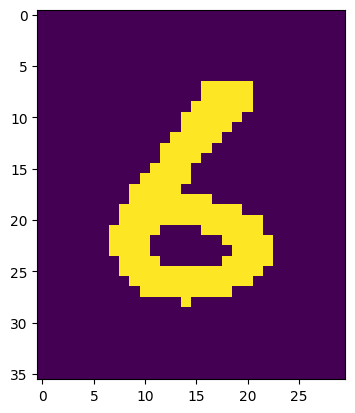

perimeter 69.59797871112823
1/1 [==============================] - 0s 24ms/step
symbol 6


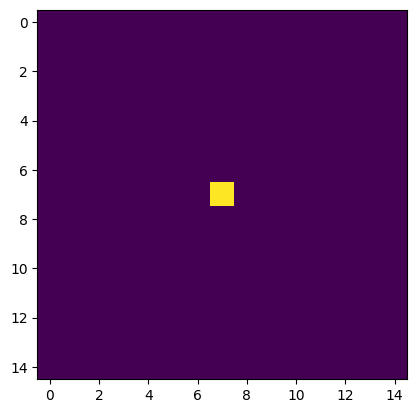

perimeter 0.0
here noise


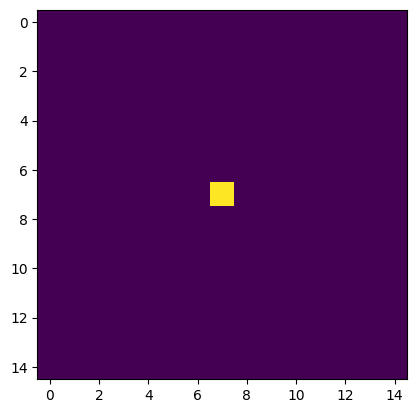

perimeter 0.0
here noise


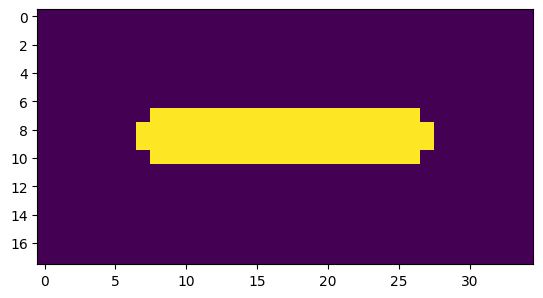

perimeter 43.65685415267944
here minus


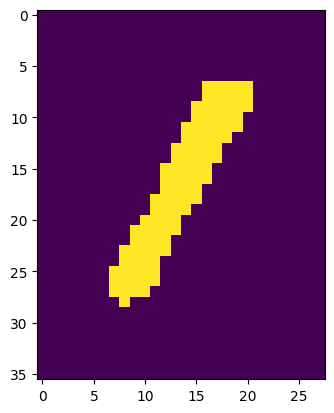

perimeter 55.69848430156708
1/1 [==============================] - 0s 24ms/step
symbol -1


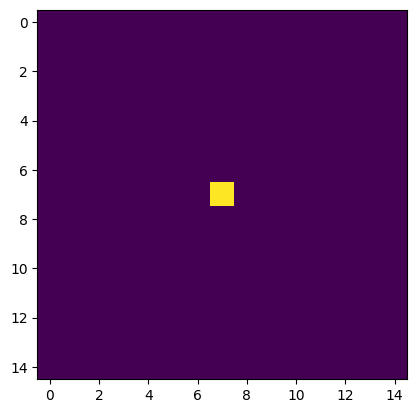

perimeter 0.0
here noise


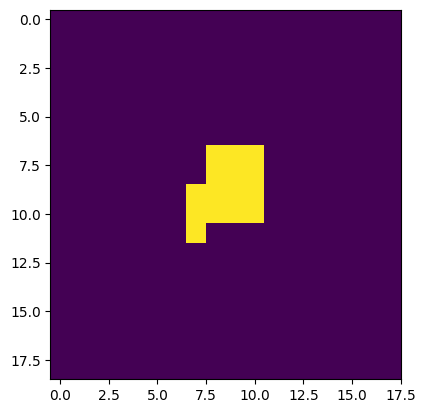

perimeter 12.828427076339722
here noise


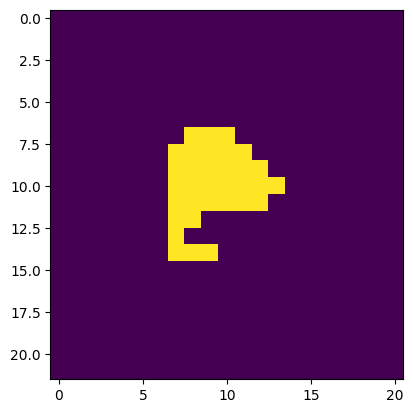

perimeter 25.313708186149597
here noise


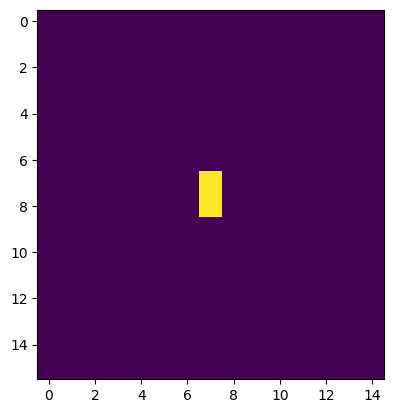

perimeter 2.0
here noise


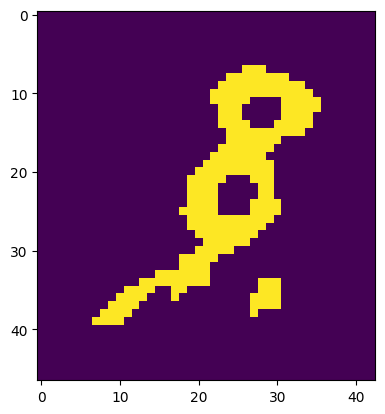

perimeter 109.29646348953247
1/1 [==============================] - 0s 23ms/step
symbol 3
[0, 6, 0, 0, -5, 6, 0, 0, -1, 0, 3]


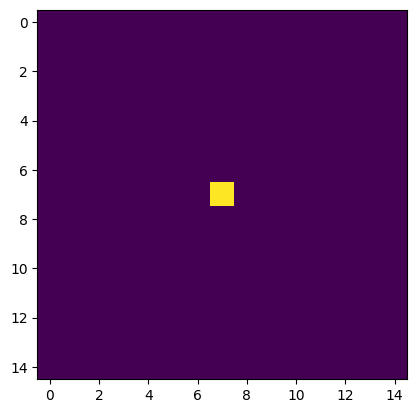

perimeter 0.0
here noise


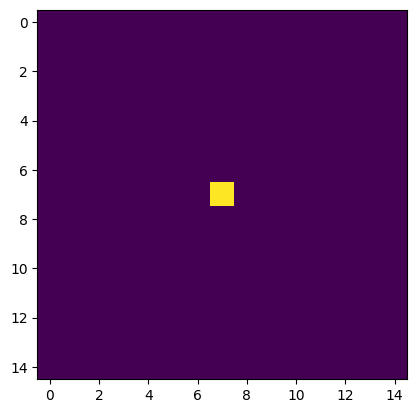

perimeter 0.0
here noise


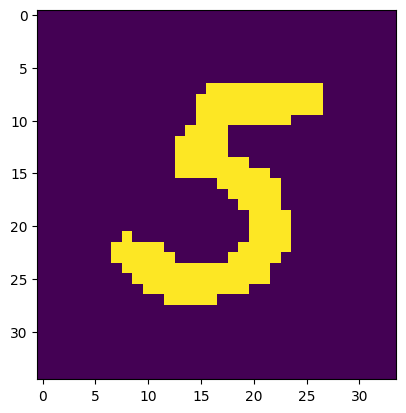

perimeter 93.59797883033752
1/1 [==============================] - 0s 25ms/step
symbol 5


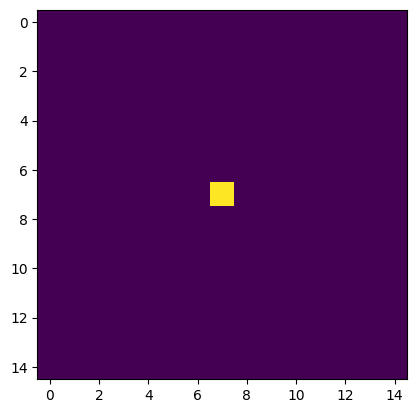

perimeter 0.0
here noise


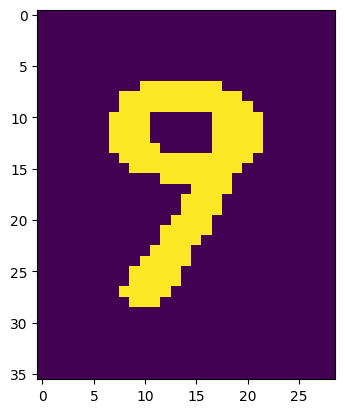

perimeter 68.18376529216766
1/1 [==============================] - 0s 28ms/step
symbol 8


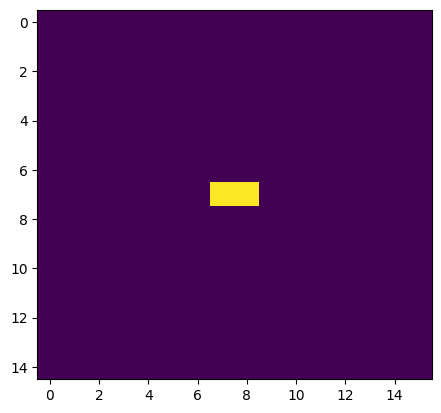

perimeter 2.0
here noise


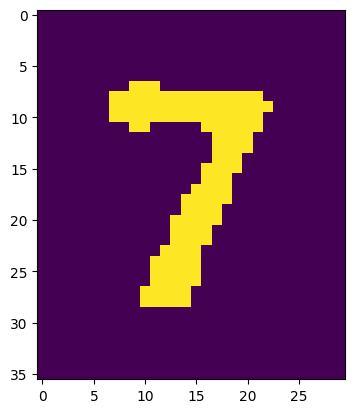

perimeter 75.11269783973694
1/1 [==============================] - 0s 24ms/step
symbol 7


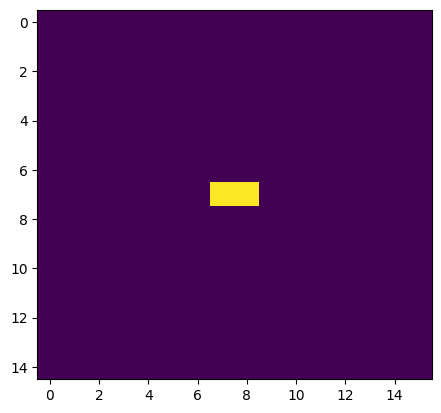

perimeter 2.0
here noise


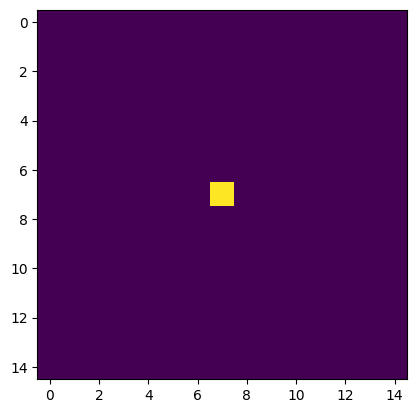

perimeter 0.0
here noise


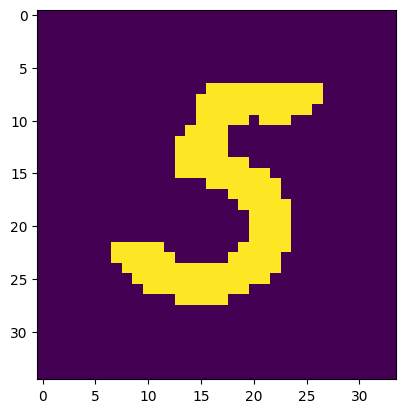

perimeter 93.0121922492981
1/1 [==============================] - 0s 25ms/step
symbol 5


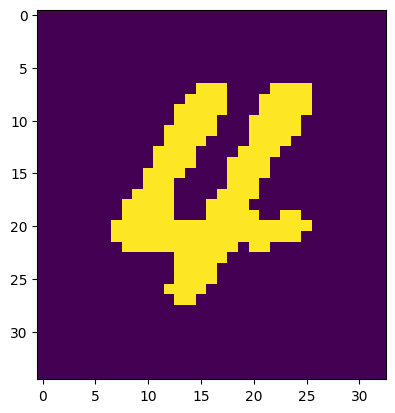

perimeter 104.81118190288544
1/1 [==============================] - 0s 36ms/step
symbol 4
[5, 0, 8, 0, 7, 0, 0, 5, 4]


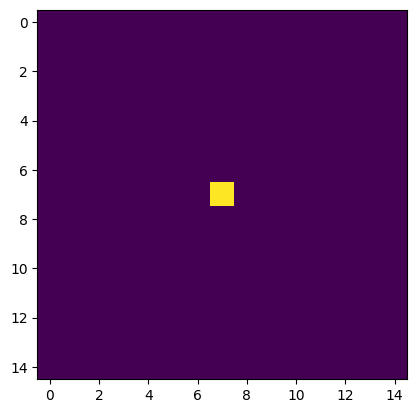

perimeter 0.0
here noise


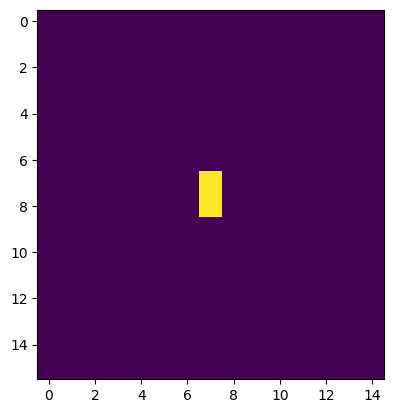

perimeter 2.0
here noise


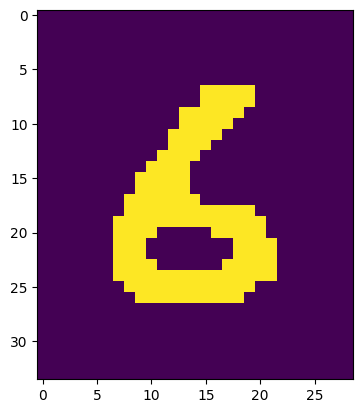

perimeter 65.69848394393921
1/1 [==============================] - 0s 49ms/step
symbol 6


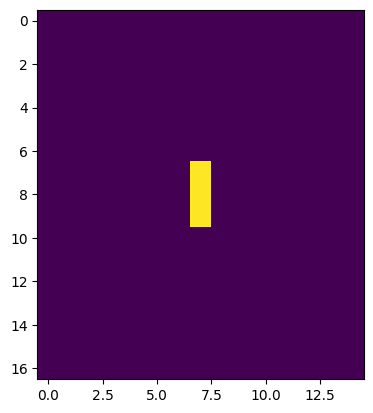

perimeter 4.0
here noise


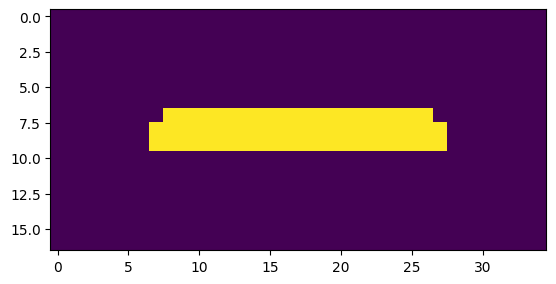

perimeter 42.82842707633972
here minus


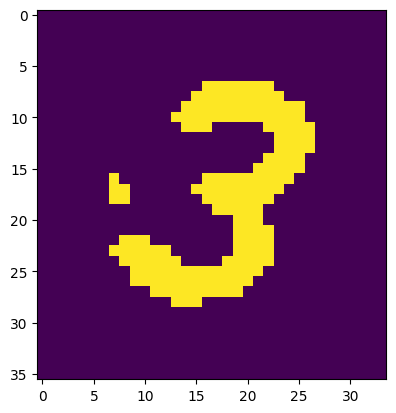

perimeter 96.32590055465698
1/1 [==============================] - 0s 44ms/step
symbol -3


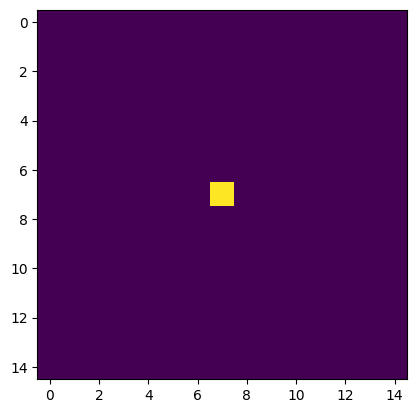

perimeter 0.0
here noise


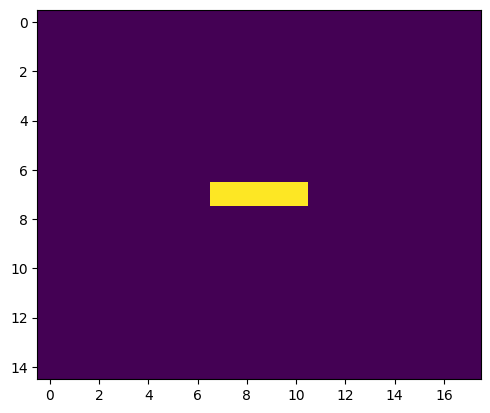

perimeter 6.0
here noise


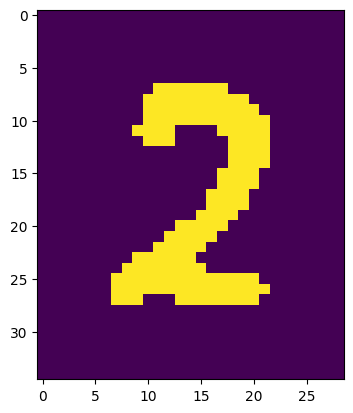

perimeter 87.84061968326569
1/1 [==============================] - 0s 39ms/step
symbol 2


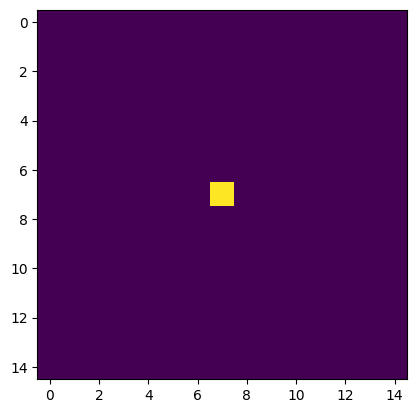

perimeter 0.0
here noise


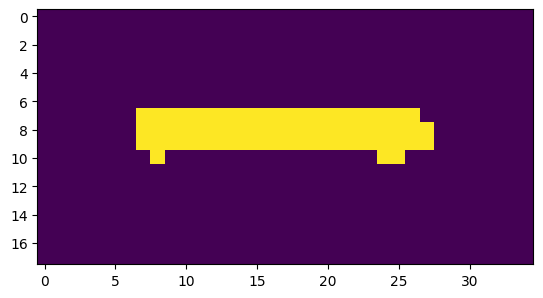

perimeter 45.071067690849304
here minus


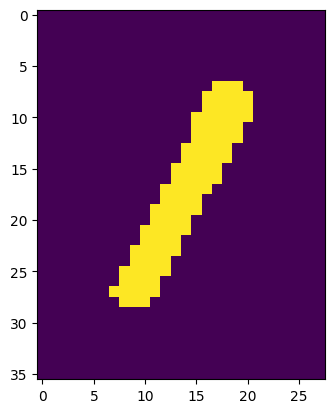

perimeter 55.11269783973694
1/1 [==============================] - 0s 24ms/step
symbol -1


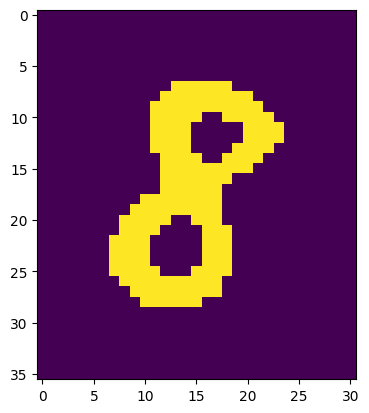

perimeter 65.11269748210907
1/1 [==============================] - 0s 25ms/step
symbol 8


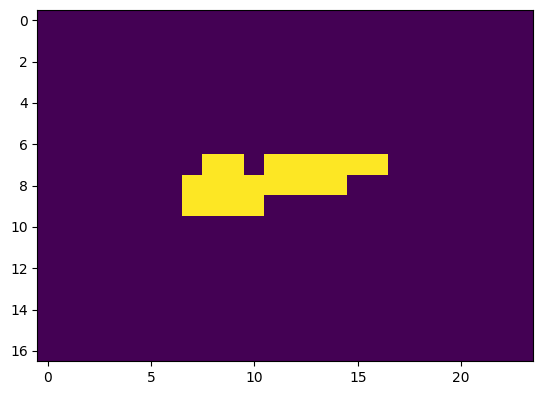

perimeter 21.071067690849304
here noise
[6, -3, 0, 0, 2, 0, -1, 8, 0]


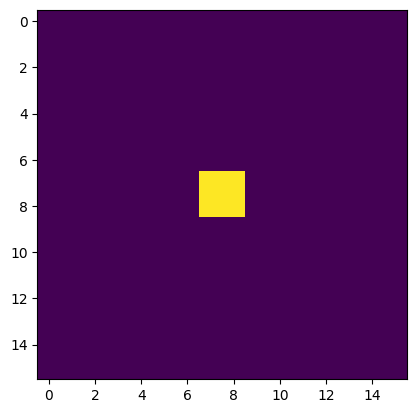

perimeter 4.0
here noise


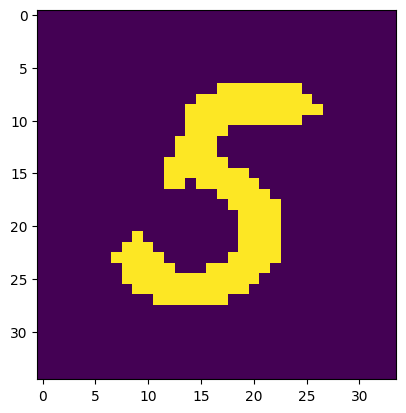

perimeter 93.49747347831726
1/1 [==============================] - 0s 24ms/step
symbol 5


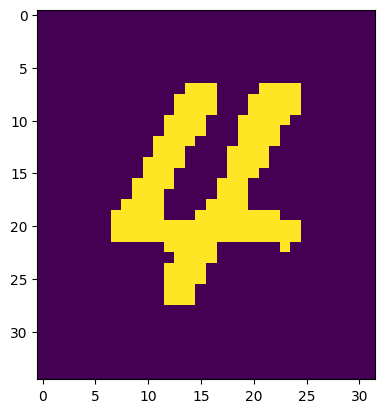

perimeter 103.49747371673584
1/1 [==============================] - 0s 23ms/step
symbol 4


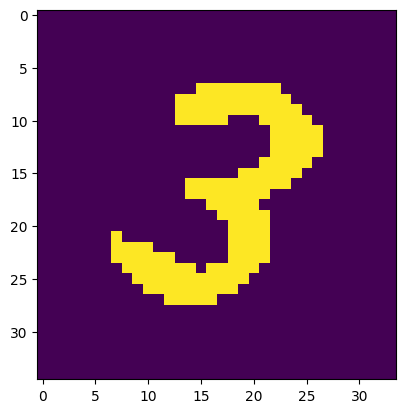

perimeter 96.08325982093811
1/1 [==============================] - 0s 26ms/step
symbol 3


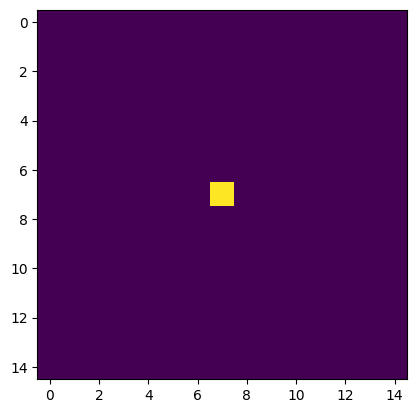

perimeter 0.0
here noise


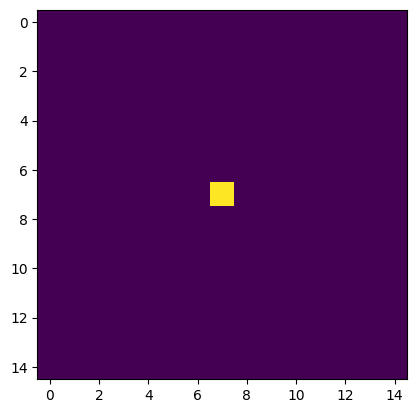

perimeter 0.0
here noise


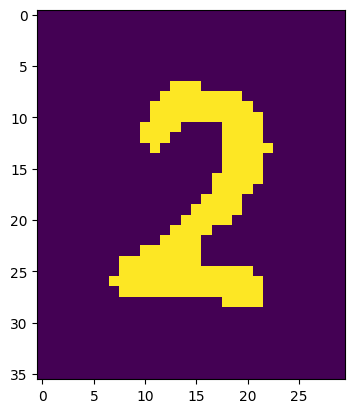

perimeter 87.84061932563782
1/1 [==============================] - 0s 26ms/step
symbol 2


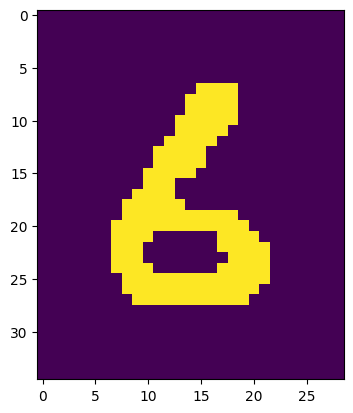

perimeter 67.11269760131836
1/1 [==============================] - 0s 23ms/step
symbol 6


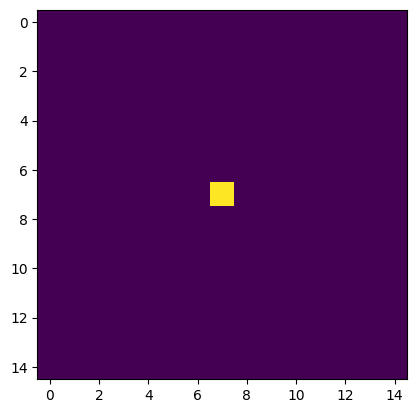

perimeter 0.0
here noise


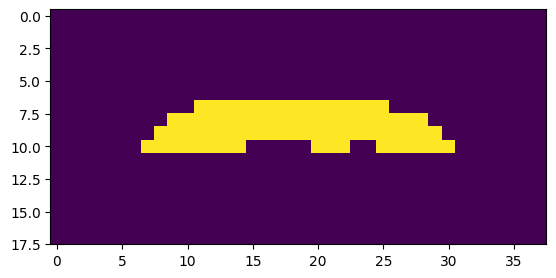

perimeter 50.14213538169861
here minus
[5, 4, 3, 0, 2, 6, 0, 0]


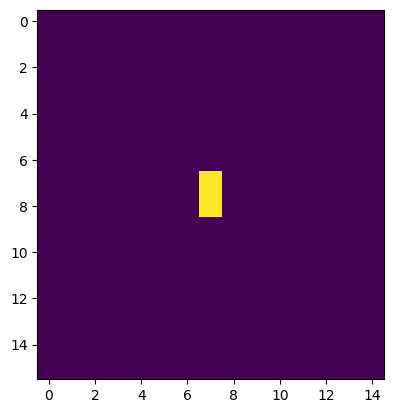

perimeter 2.0
here noise


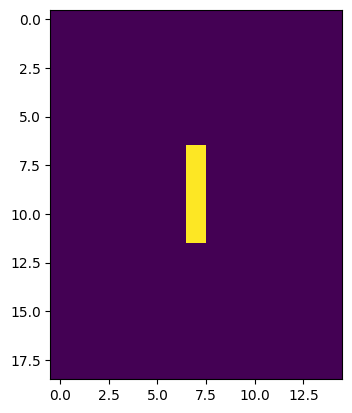

perimeter 8.0
here noise


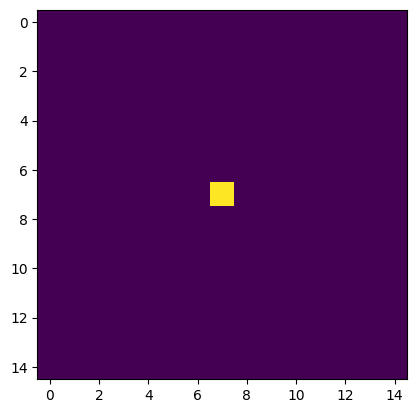

perimeter 0.0
here noise


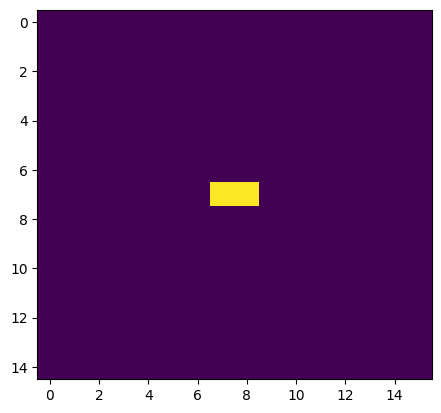

perimeter 2.0
here noise


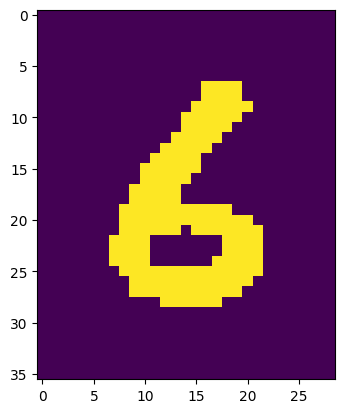

perimeter 68.76955211162567
1/1 [==============================] - 0s 25ms/step
symbol 6


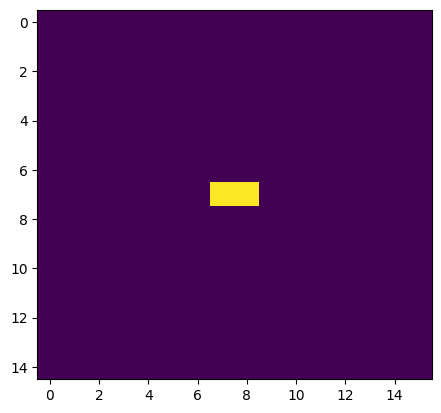

perimeter 2.0
here noise


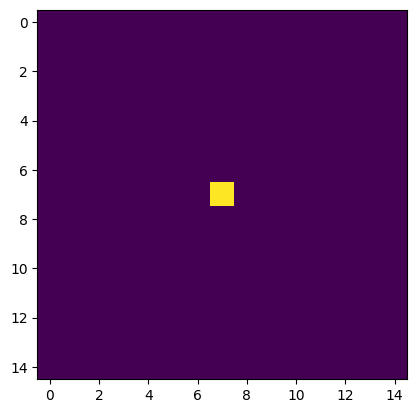

perimeter 0.0
here noise


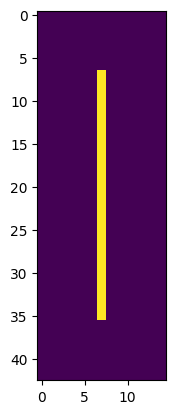

perimeter 56.0
1/1 [==============================] - 0s 24ms/step
symbol 61


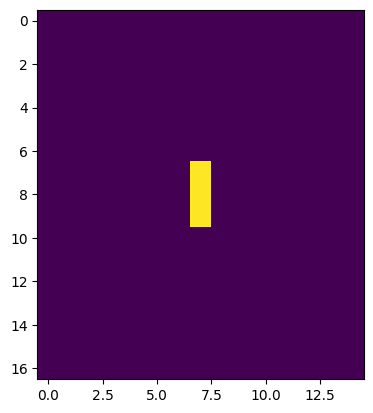

perimeter 4.0
here noise


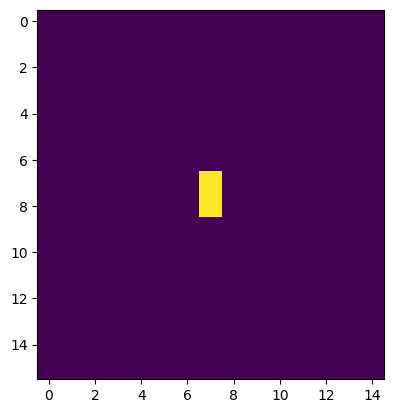

perimeter 2.0
here noise


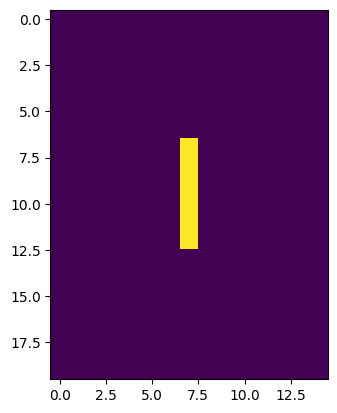

perimeter 10.0
here noise


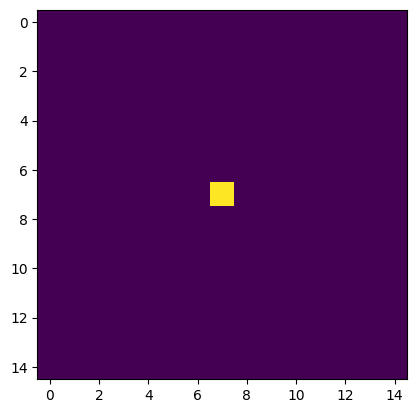

perimeter 0.0
here noise


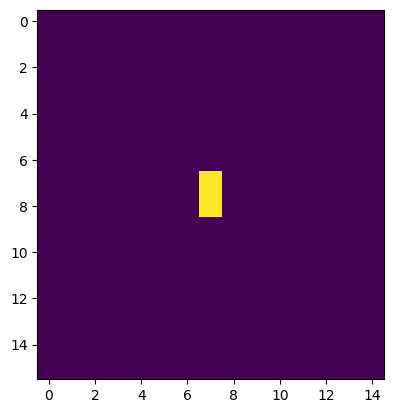

perimeter 2.0
here noise


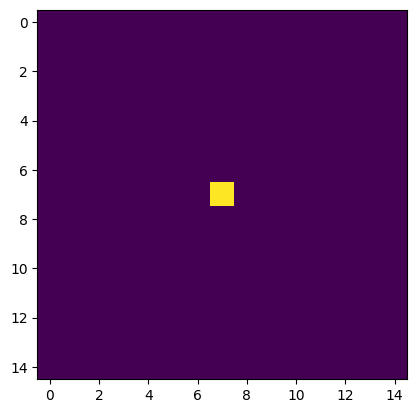

perimeter 0.0
here noise


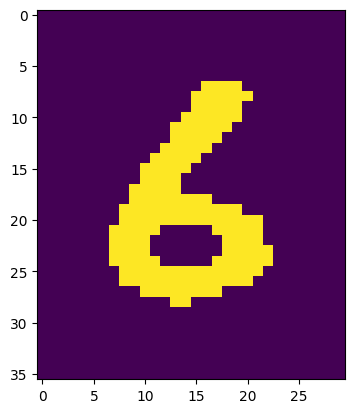

perimeter 69.59797871112823
1/1 [==============================] - 0s 24ms/step
symbol 6


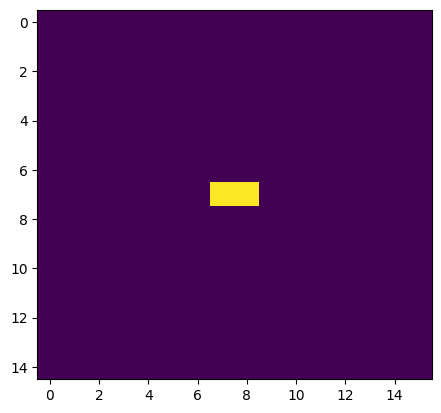

perimeter 2.0
here noise


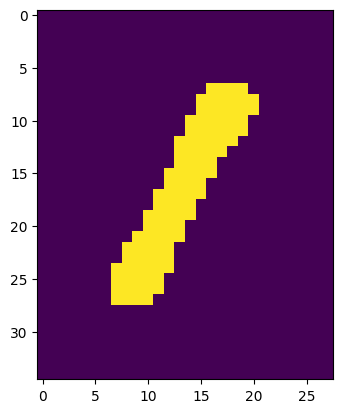

perimeter 54.28427064418793
1/1 [==============================] - 0s 25ms/step
symbol 61


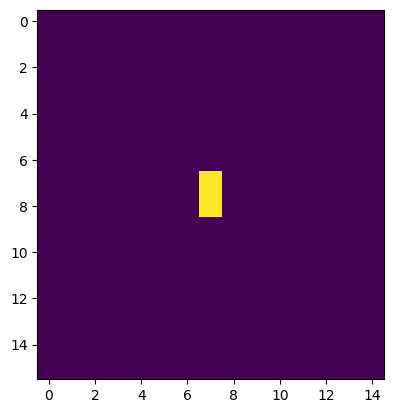

perimeter 2.0
here noise


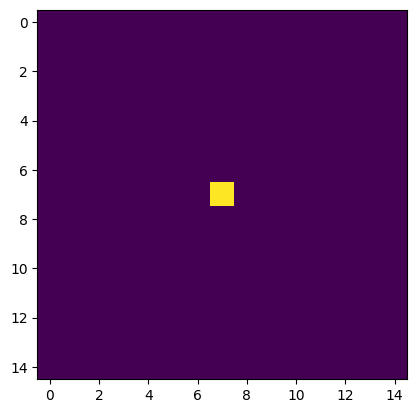

perimeter 0.0
here noise


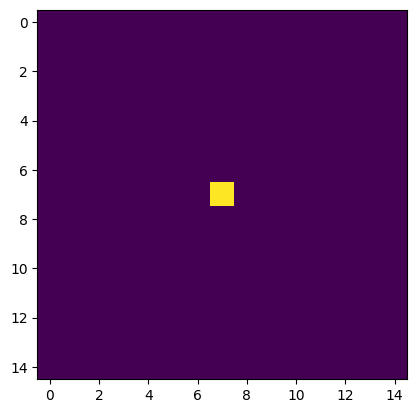

perimeter 0.0
here noise


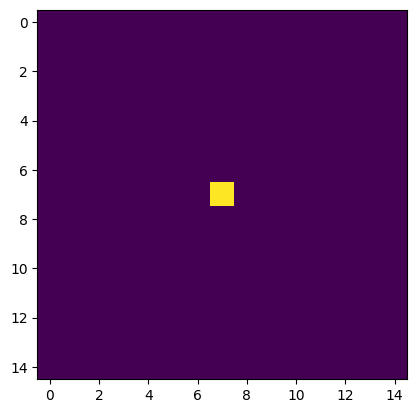

perimeter 0.0
here noise


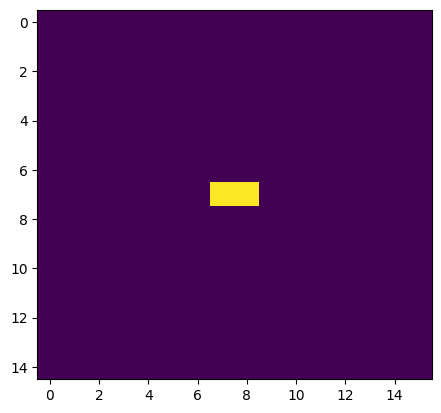

perimeter 2.0
here noise


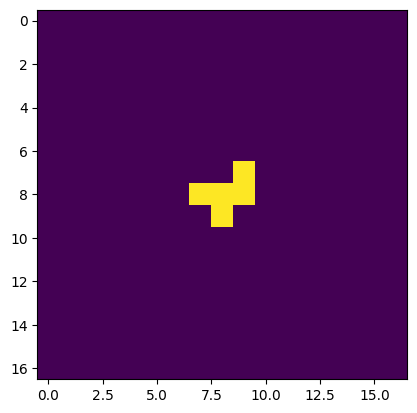

perimeter 6.2426406145095825
here noise


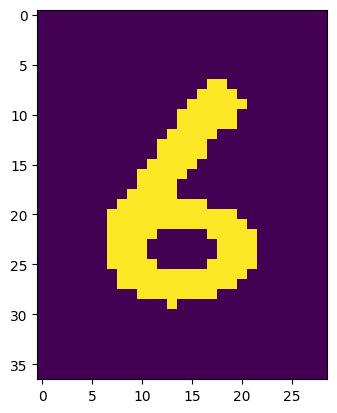

perimeter 69.0121922492981
1/1 [==============================] - 0s 31ms/step
symbol 616


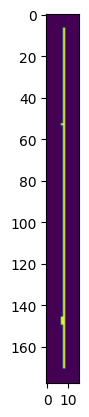

perimeter 327.65685415267944
1/1 [==============================] - 0s 39ms/step
symbol 6161


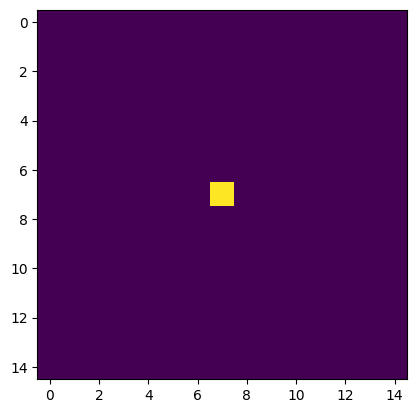

perimeter 0.0
here noise


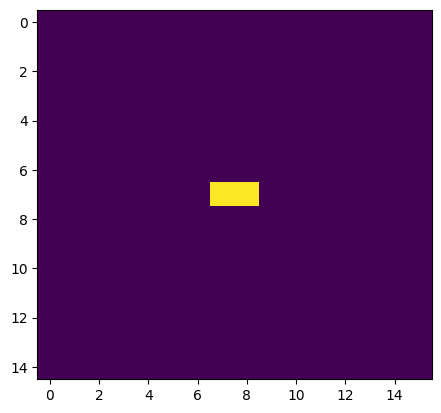

perimeter 2.0
here noise


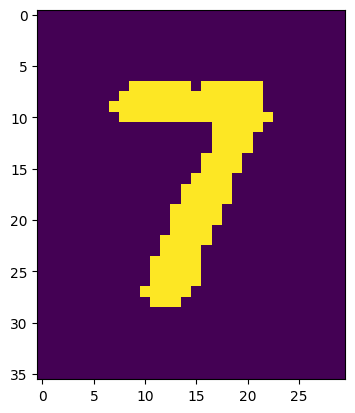

perimeter 73.94112491607666
1/1 [==============================] - 0s 43ms/step
symbol 61617
[61, 0, 0, 0, 0, 61617]


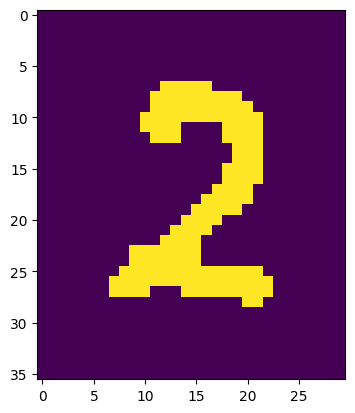

perimeter 90.4264063835144
1/1 [==============================] - 0s 44ms/step
symbol 2


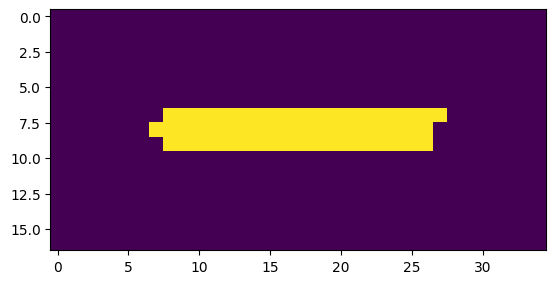

perimeter 42.24264061450958
here minus


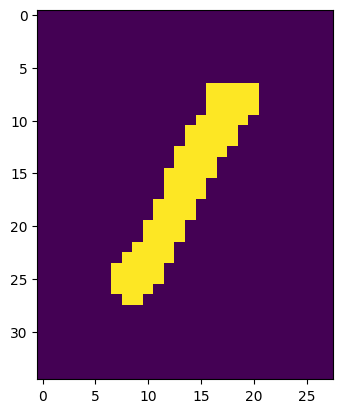

perimeter 53.69848418235779
1/1 [==============================] - 0s 41ms/step
symbol -1


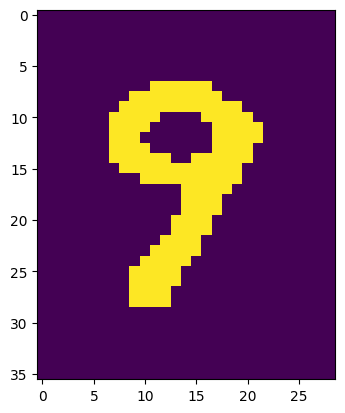

perimeter 65.94112491607666
1/1 [==============================] - 0s 43ms/step
symbol 8


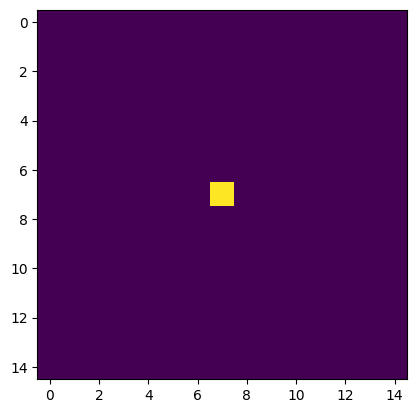

perimeter 0.0
here noise


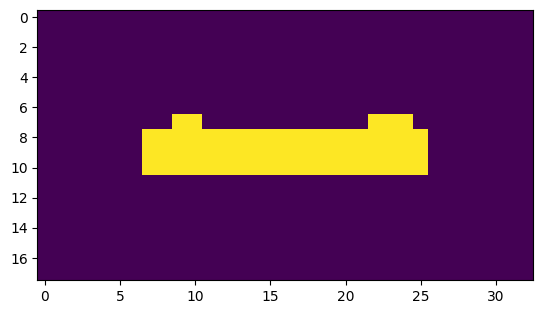

perimeter 41.65685415267944
here minus


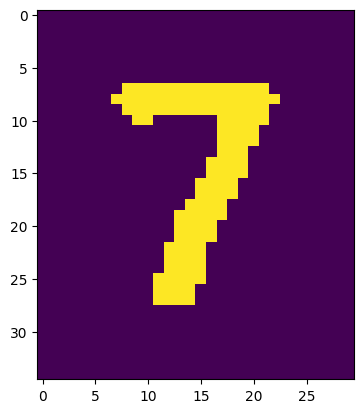

perimeter 72.28427076339722
1/1 [==============================] - 0s 39ms/step
symbol -7


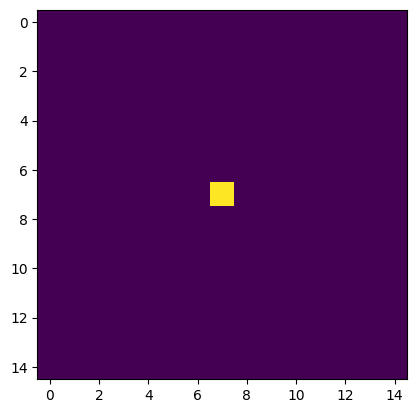

perimeter 0.0
here noise


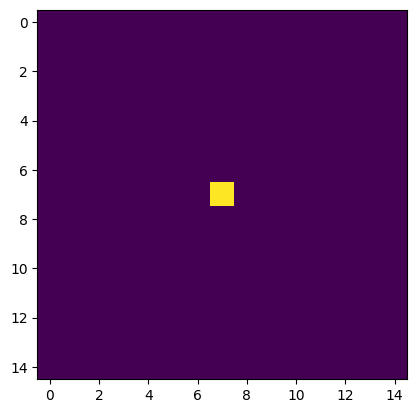

perimeter 0.0
here noise


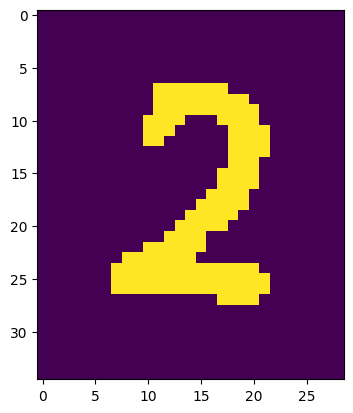

perimeter 87.59797871112823
1/1 [==============================] - 0s 24ms/step
symbol 2


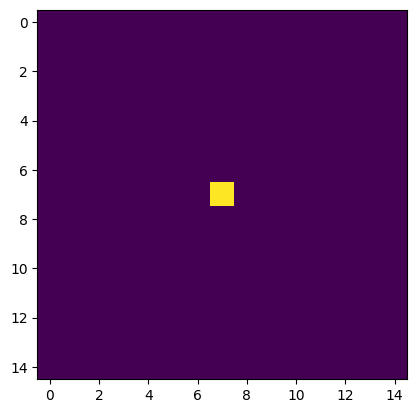

perimeter 0.0
here noise


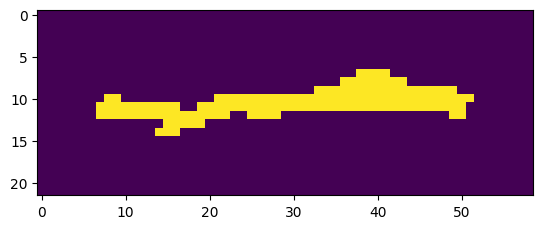

perimeter 100.28427076339722
here minus
[2, -1, 8, 0, -7, 0, 0, 2, 0]


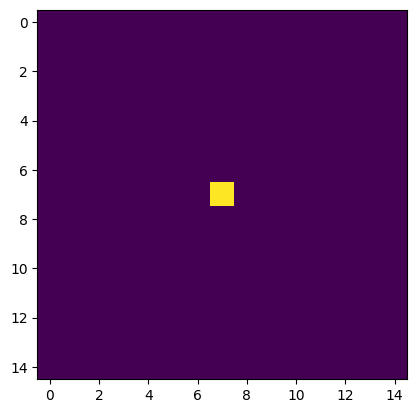

perimeter 0.0
here noise


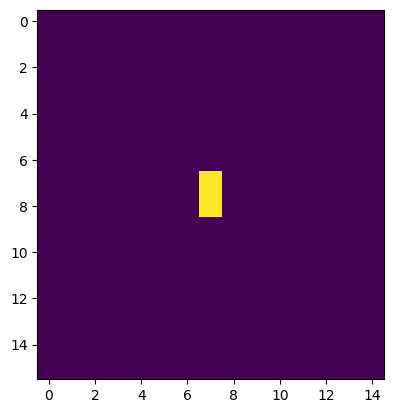

perimeter 2.0
here noise


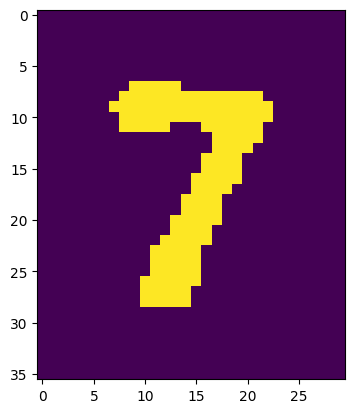

perimeter 74.5269113779068
1/1 [==============================] - 0s 31ms/step
symbol 7


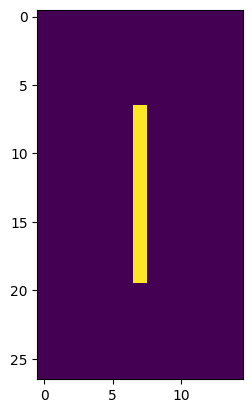

perimeter 24.0
here noise


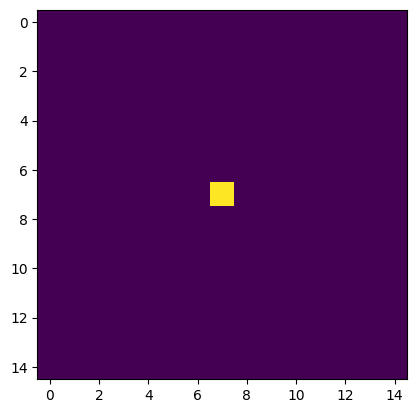

perimeter 0.0
here noise


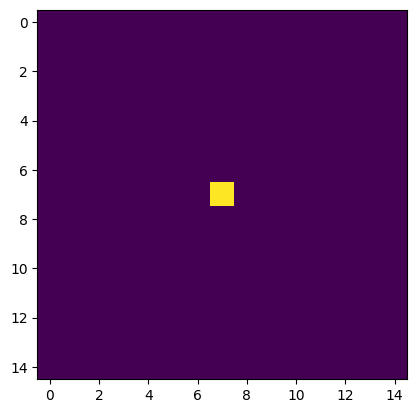

perimeter 0.0
here noise


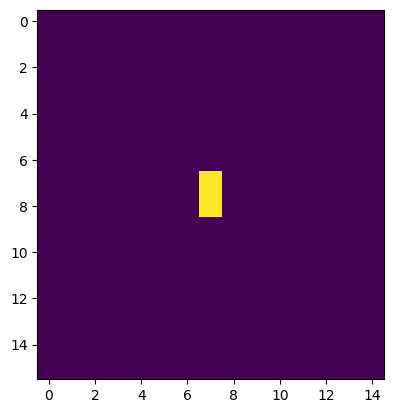

perimeter 2.0
here noise


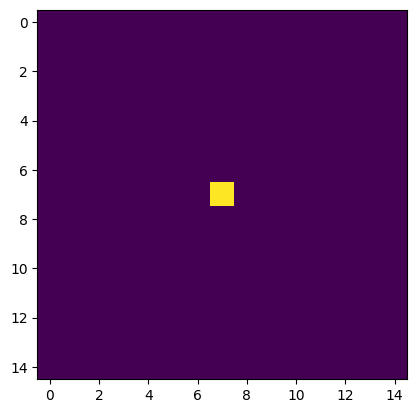

perimeter 0.0
here noise


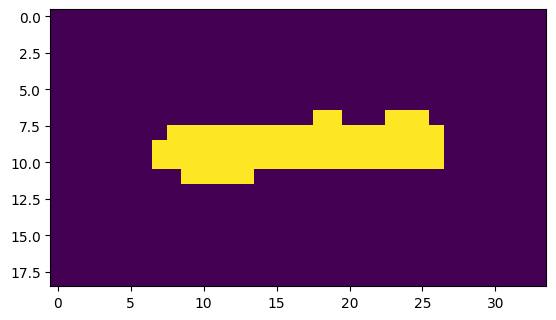

perimeter 43.899494767189026
here minus


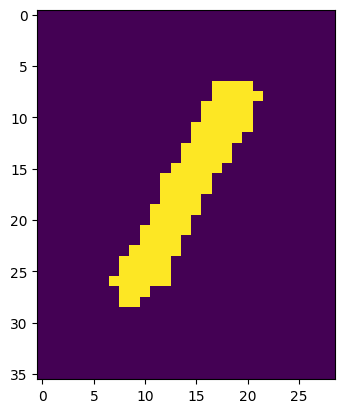

perimeter 56.5269113779068
1/1 [==============================] - 0s 26ms/step
symbol -1


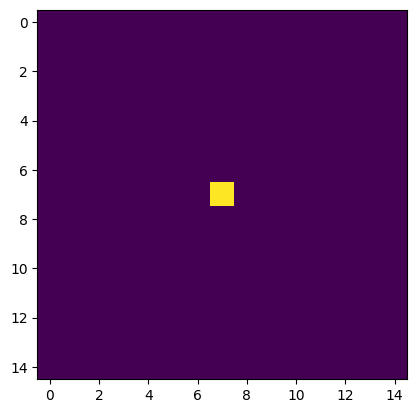

perimeter 0.0
here noise


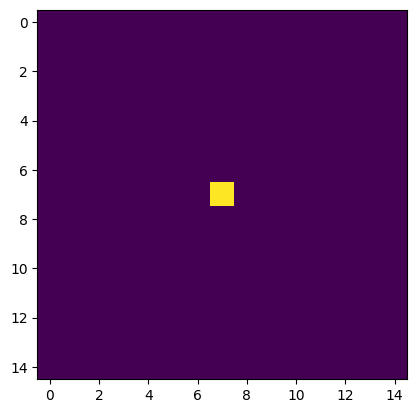

perimeter 0.0
here noise


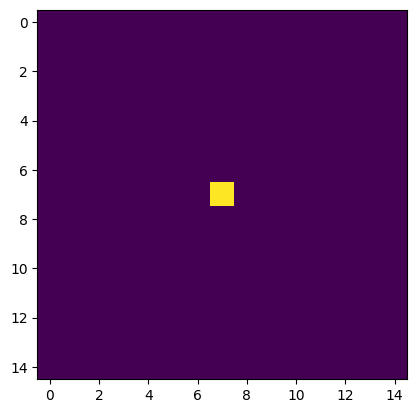

perimeter 0.0
here noise


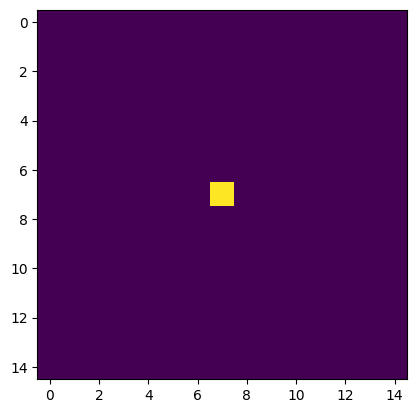

perimeter 0.0
here noise


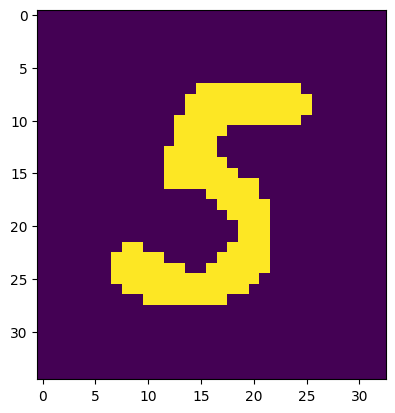

perimeter 89.59797894954681
1/1 [==============================] - 0s 23ms/step
symbol 5


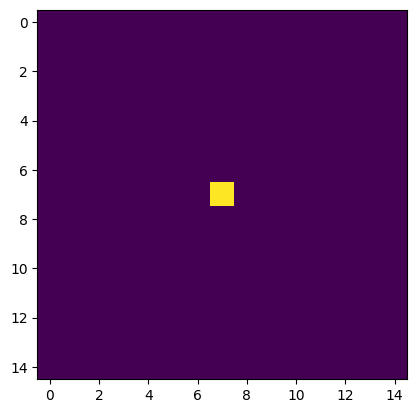

perimeter 0.0
here noise


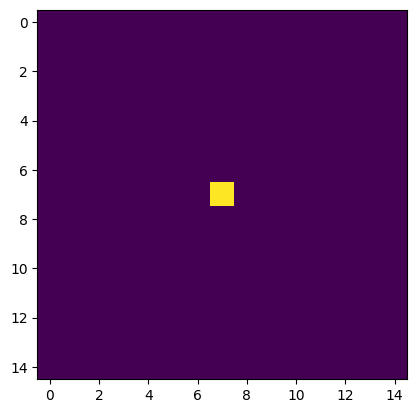

perimeter 0.0
here noise


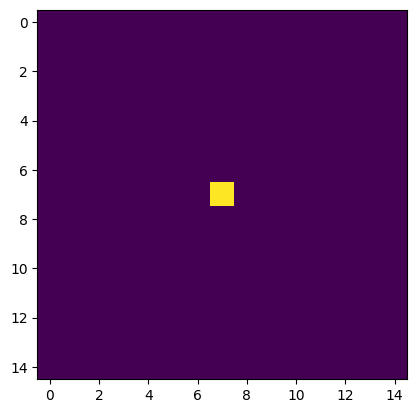

perimeter 0.0
here noise


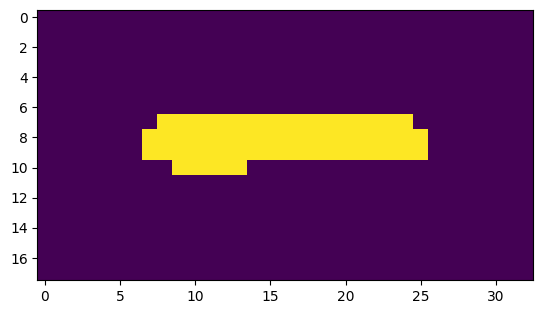

perimeter 39.65685415267944
here minus


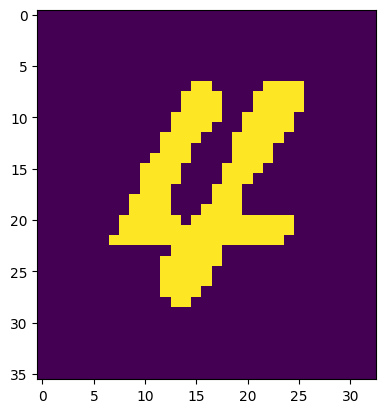

perimeter 105.1543276309967
1/1 [==============================] - 0s 27ms/step
symbol -4


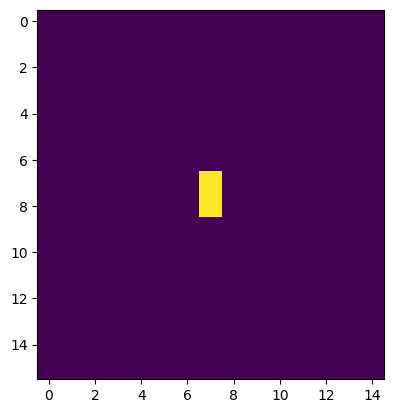

perimeter 2.0
here noise


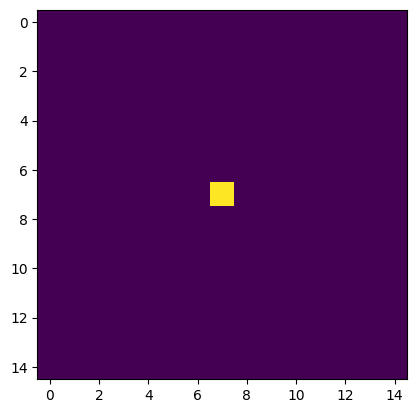

perimeter 0.0
here noise


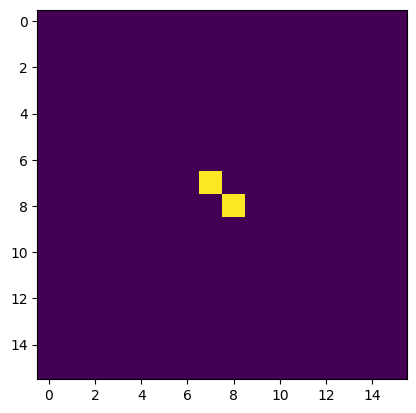

perimeter 2.8284270763397217
here noise


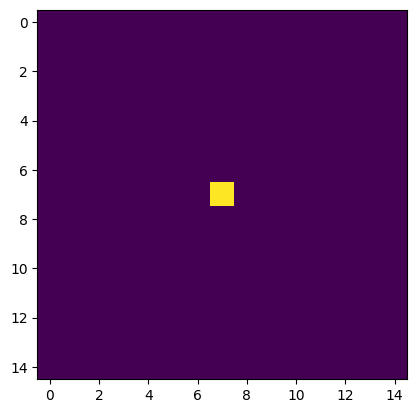

perimeter 0.0
here noise


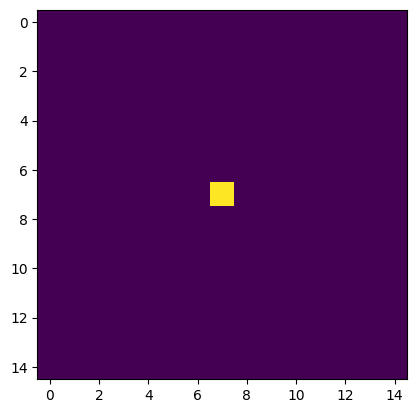

perimeter 0.0
here noise


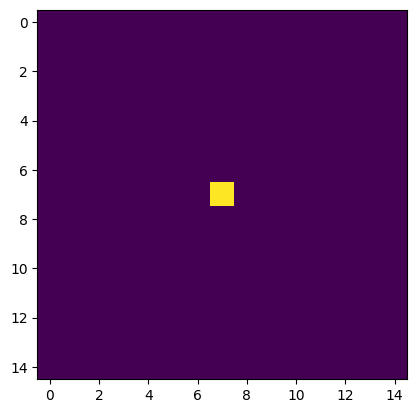

perimeter 0.0
here noise


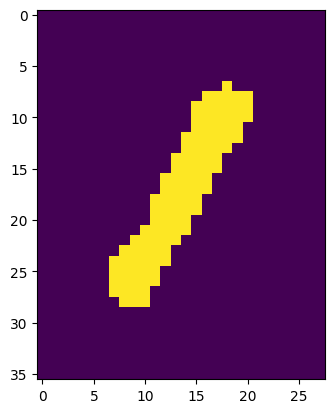

perimeter 55.11269783973694
1/1 [==============================] - 0s 26ms/step
symbol 1


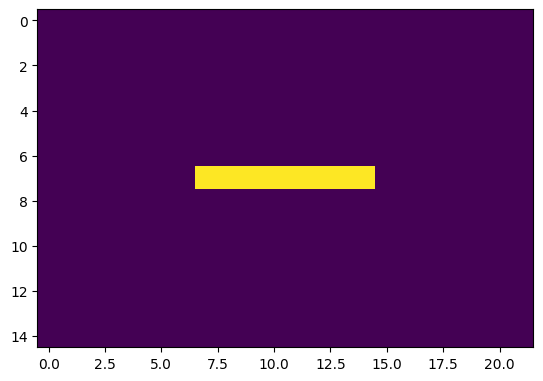

perimeter 14.0
here noise
[0, 7, 0, -1, 0, 0, 5, 0, 0, 0, -4, 0, 0, 0, 0, 1, 0]


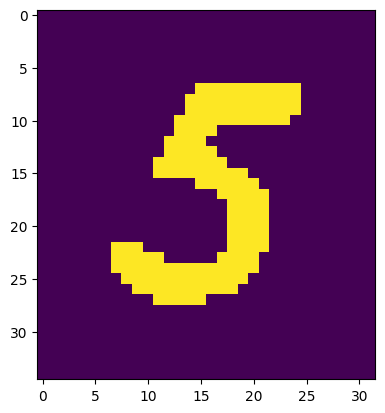

perimeter 88.76955187320709
1/1 [==============================] - 0s 27ms/step
symbol 5


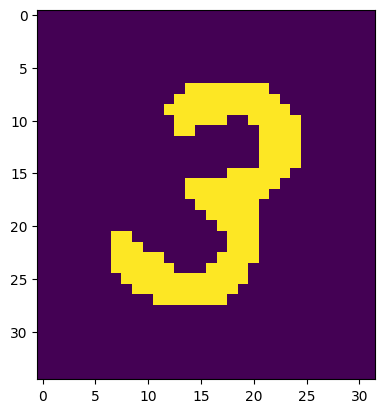

perimeter 92.66904652118683
1/1 [==============================] - 0s 24ms/step
symbol 3


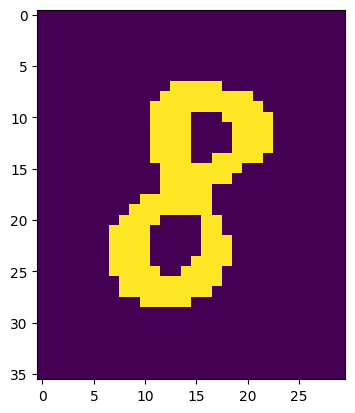

perimeter 65.69848418235779
1/1 [==============================] - 0s 26ms/step
symbol 8


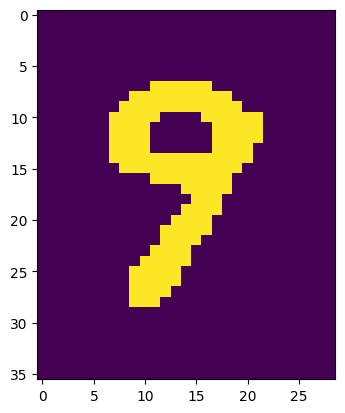

perimeter 66.7695517539978
1/1 [==============================] - 0s 31ms/step
symbol 8


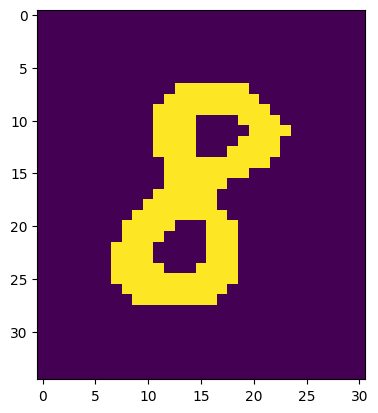

perimeter 64.5269113779068
1/1 [==============================] - 0s 58ms/step
symbol 8


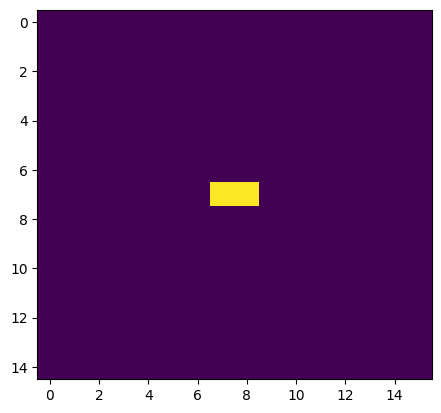

perimeter 2.0
here noise


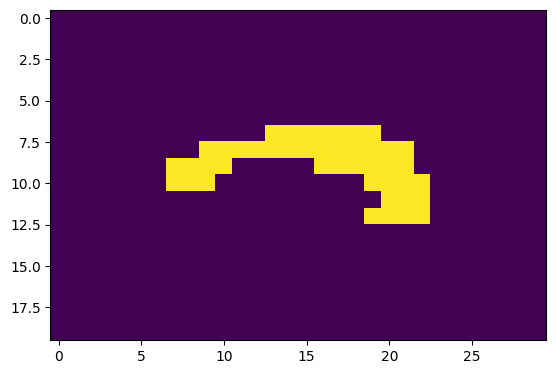

perimeter 40.14213538169861
here minus
[5, 3, 8, 8, 8, 0]


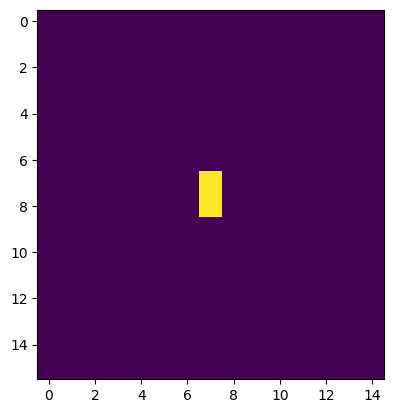

perimeter 2.0
here noise


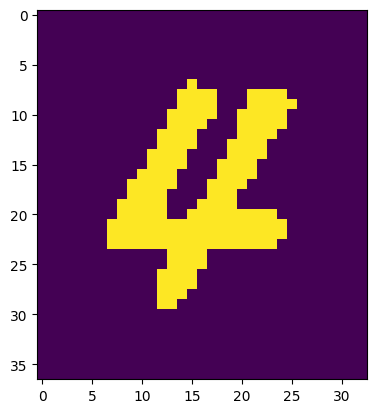

perimeter 105.74011433124542
1/1 [==============================] - 0s 45ms/step
symbol 4


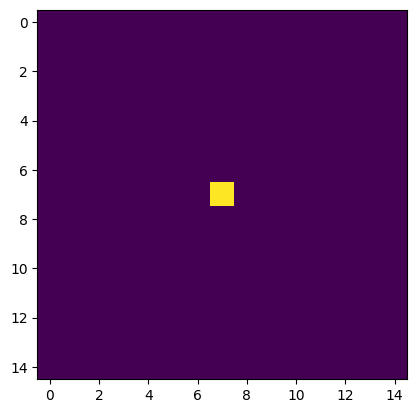

perimeter 0.0
here noise


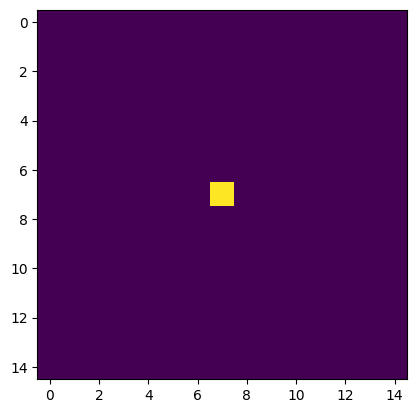

perimeter 0.0
here noise


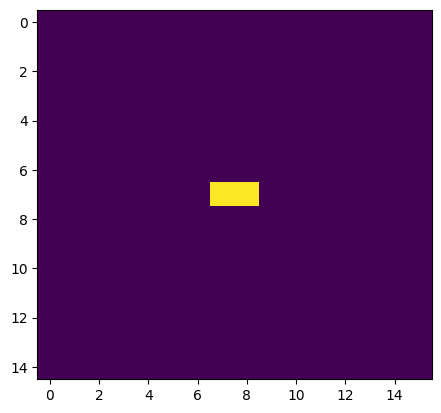

perimeter 2.0
here noise


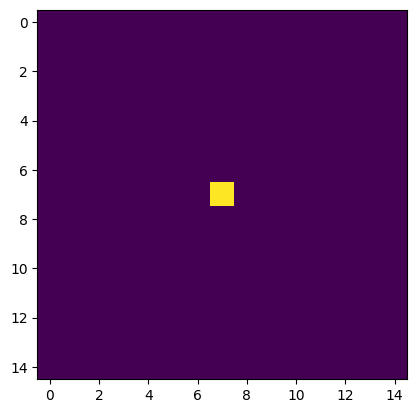

perimeter 0.0
here noise


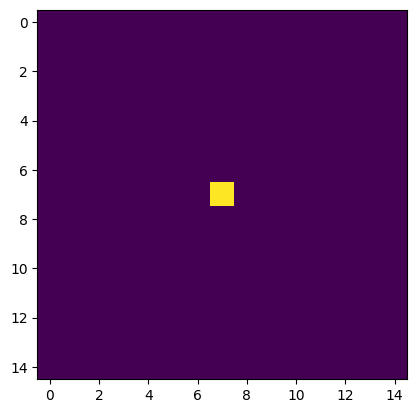

perimeter 0.0
here noise


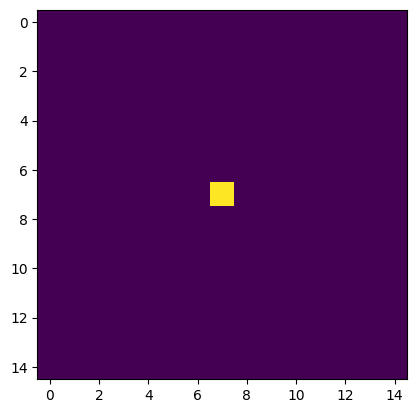

perimeter 0.0
here noise


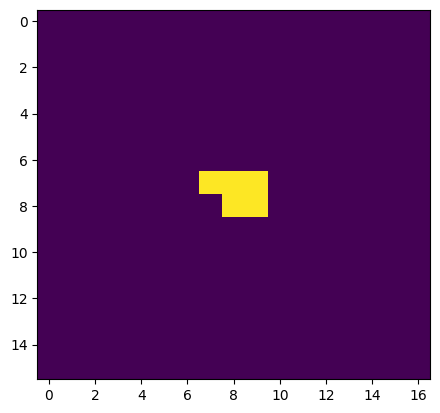

perimeter 5.414213538169861
here noise


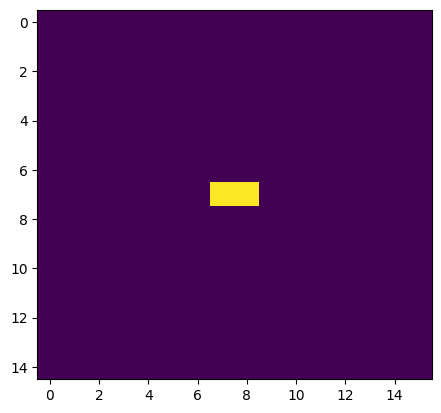

perimeter 2.0
here noise


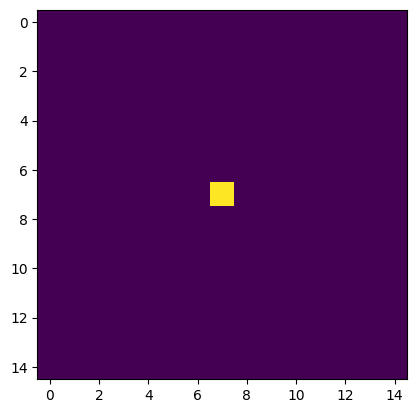

perimeter 0.0
here noise


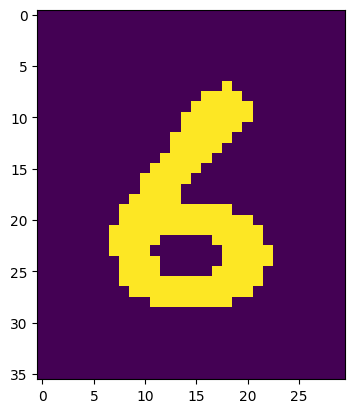

perimeter 69.01219284534454
1/1 [==============================] - 0s 35ms/step
symbol 6


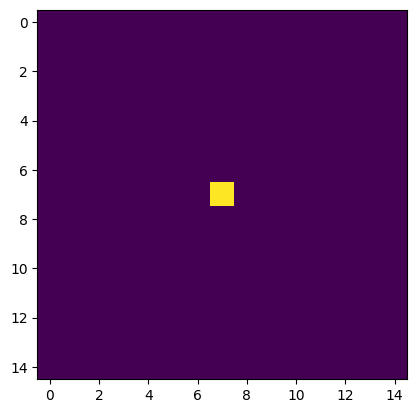

perimeter 0.0
here noise


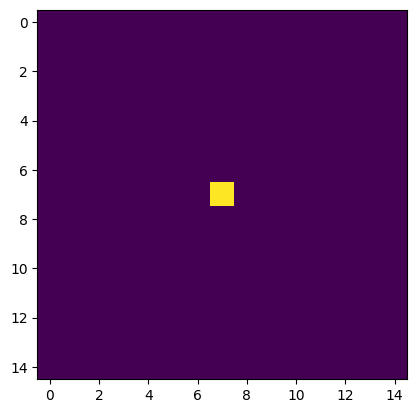

perimeter 0.0
here noise


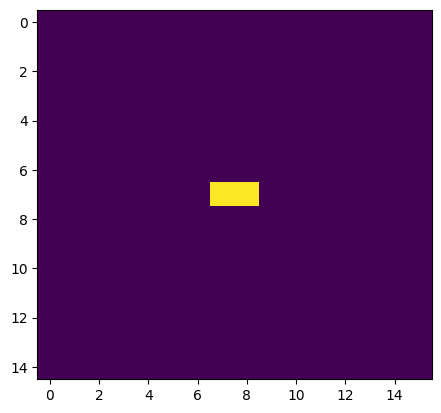

perimeter 2.0
here noise


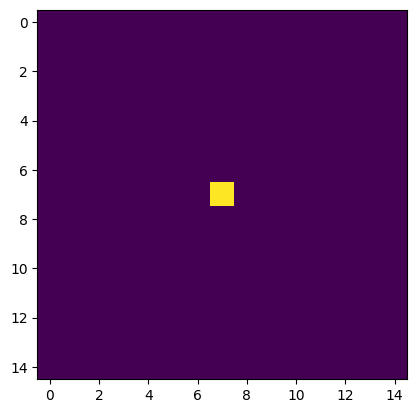

perimeter 0.0
here noise


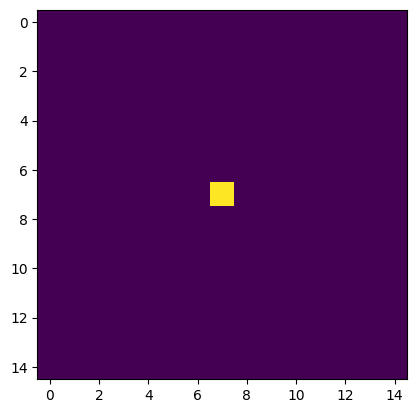

perimeter 0.0
here noise


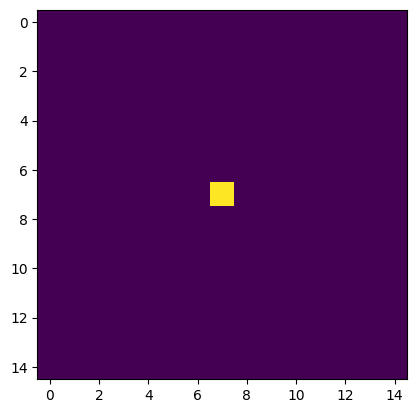

perimeter 0.0
here noise


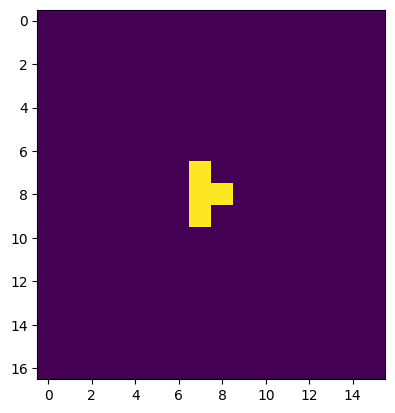

perimeter 4.828427076339722
here noise


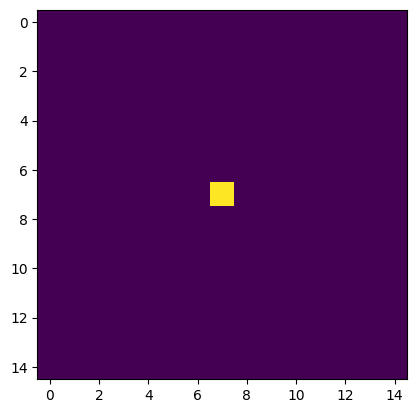

perimeter 0.0
here noise


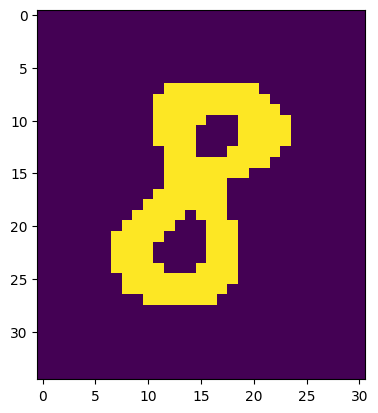

perimeter 64.87005722522736
1/1 [==============================] - 0s 24ms/step
symbol 8


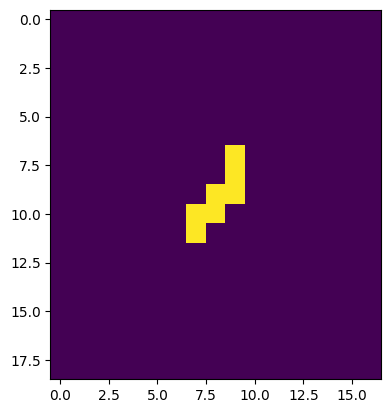

perimeter 9.656854152679443
here noise


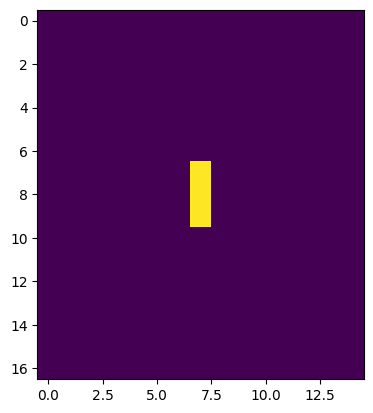

perimeter 4.0
here noise


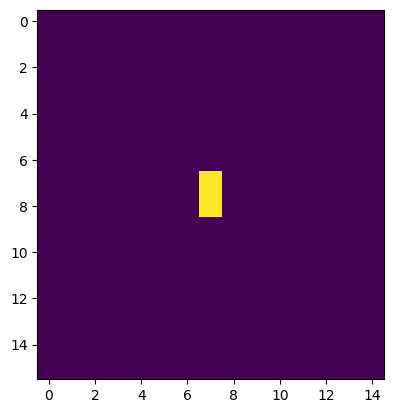

perimeter 2.0
here noise


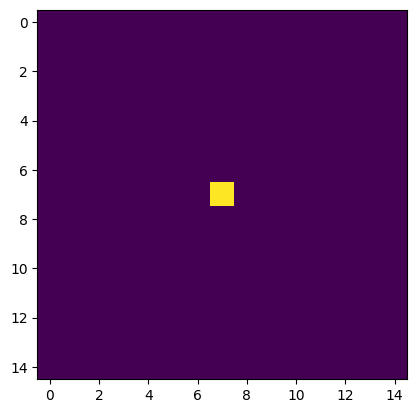

perimeter 0.0
here noise


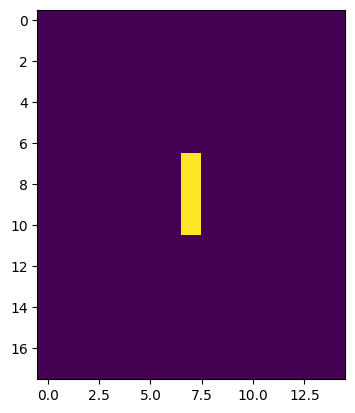

perimeter 6.0
here noise


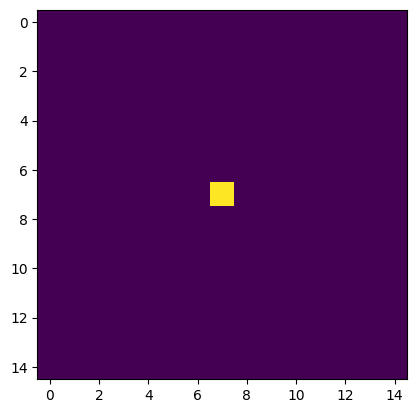

perimeter 0.0
here noise


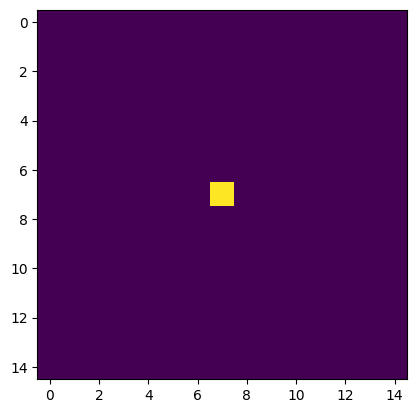

perimeter 0.0
here noise


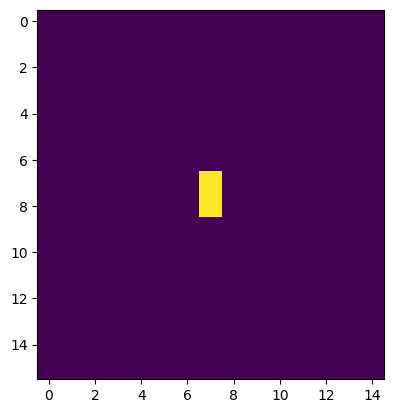

perimeter 2.0
here noise


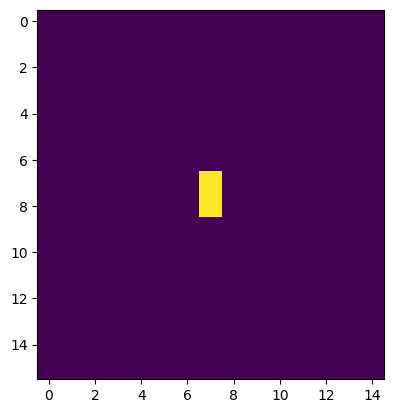

perimeter 2.0
here noise


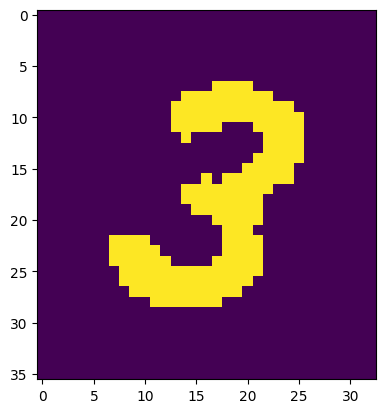

perimeter 97.49747359752655
1/1 [==============================] - 0s 28ms/step
symbol 3


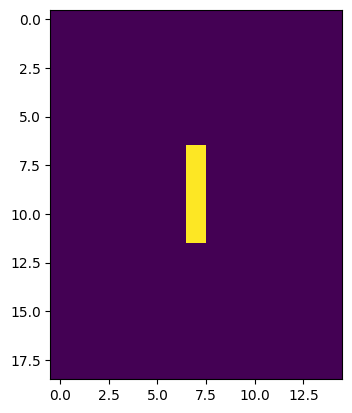

perimeter 8.0
here noise


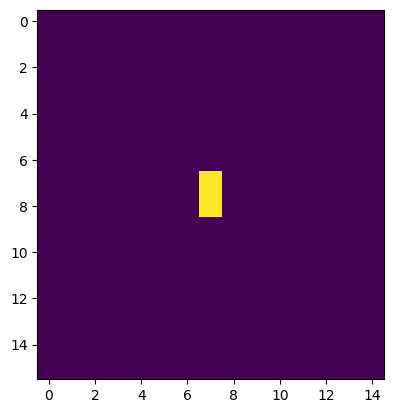

perimeter 2.0
here noise


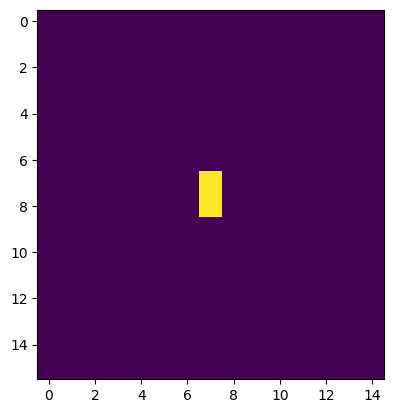

perimeter 2.0
here noise


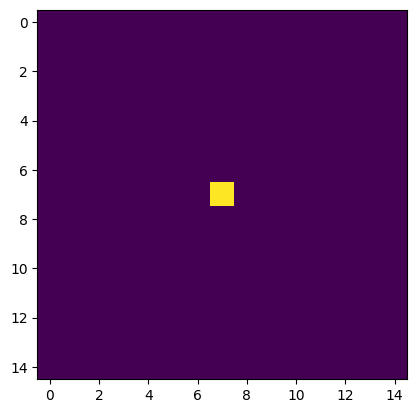

perimeter 0.0
here noise


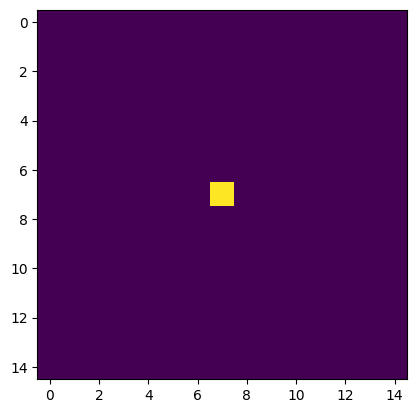

perimeter 0.0
here noise


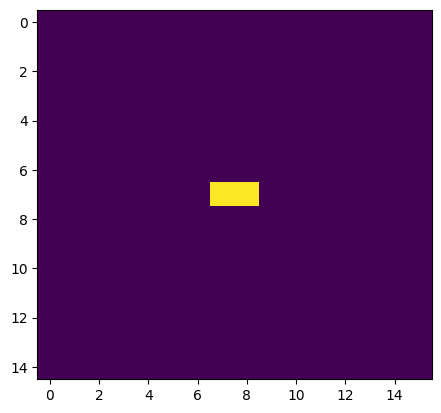

perimeter 2.0
here noise


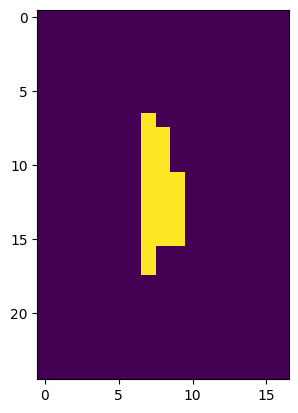

perimeter 22.242640614509583
here noise


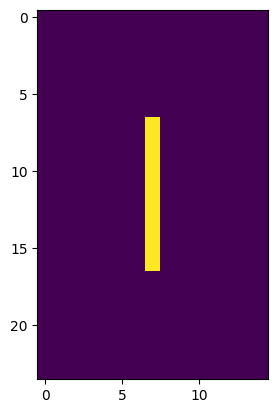

perimeter 18.0
here noise


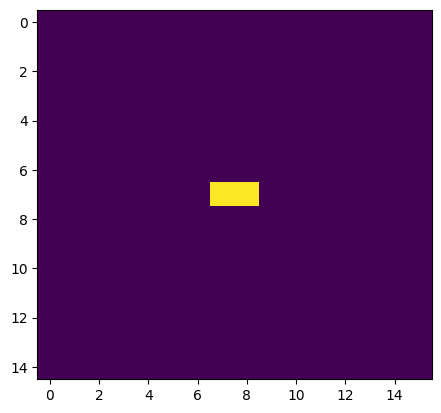

perimeter 2.0
here noise


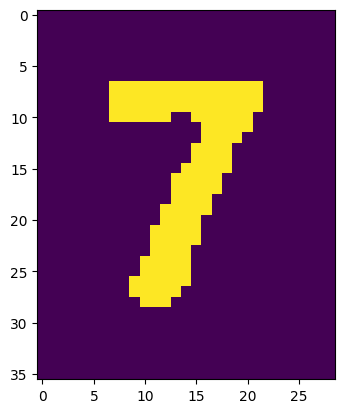

perimeter 74.28427076339722
1/1 [==============================] - 0s 34ms/step
symbol 7


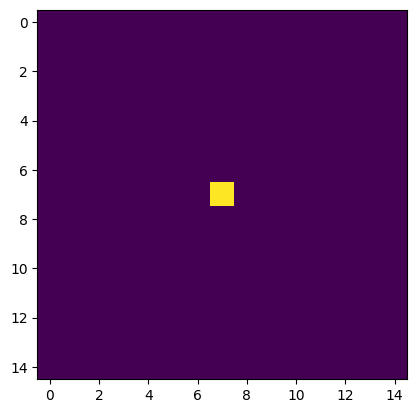

perimeter 0.0
here noise


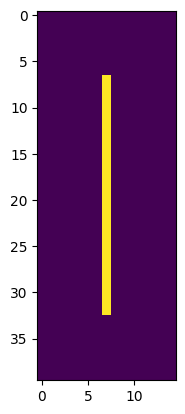

perimeter 50.0
1/1 [==============================] - 0s 38ms/step
symbol 71
[4, 0, 6, 0, 0, 8, 0, 0, 0, 0, 3, 0, 0, 0, 71]


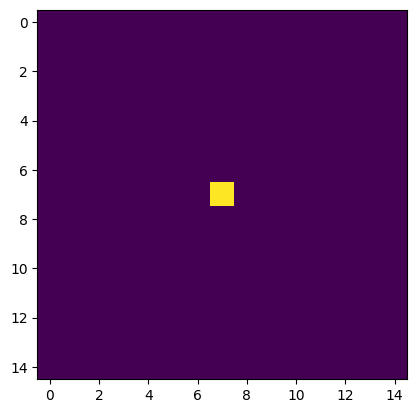

perimeter 0.0
here noise


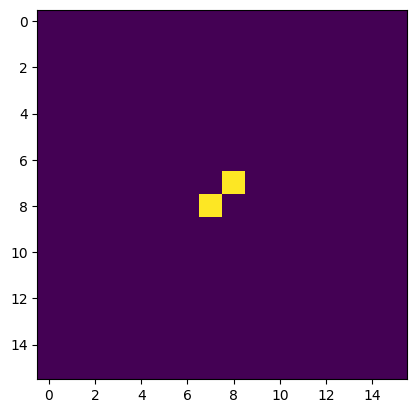

perimeter 2.8284270763397217
here noise


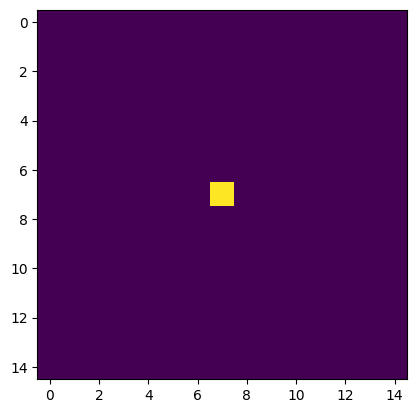

perimeter 0.0
here noise


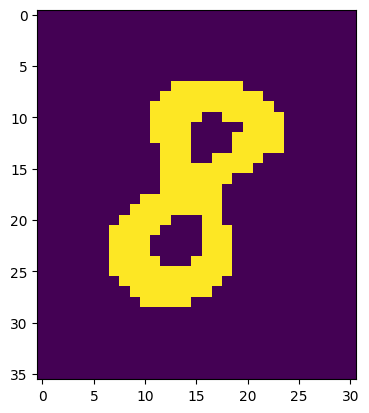

perimeter 65.6984840631485
1/1 [==============================] - 0s 28ms/step
symbol 8


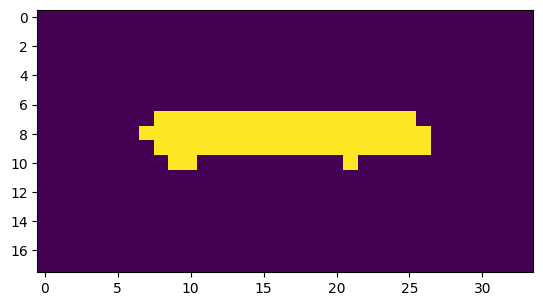

perimeter 41.899494767189026
here minus


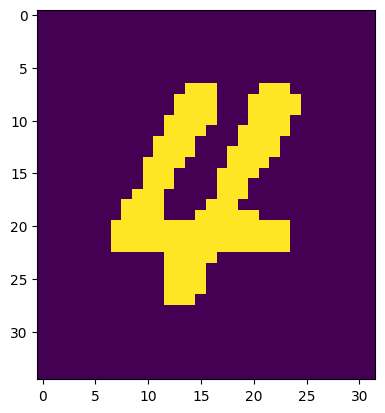

perimeter 100.66904652118683
1/1 [==============================] - 0s 41ms/step
symbol -4


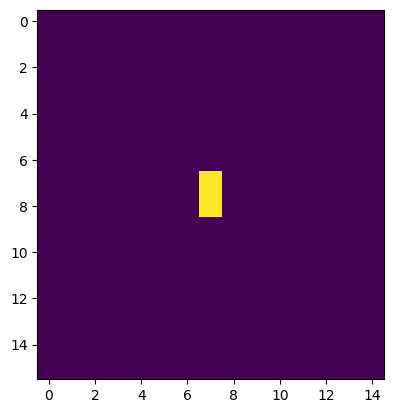

perimeter 2.0
here noise


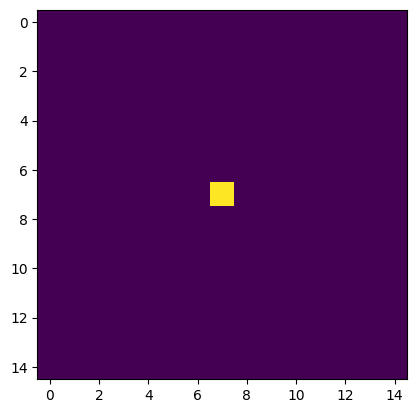

perimeter 0.0
here noise


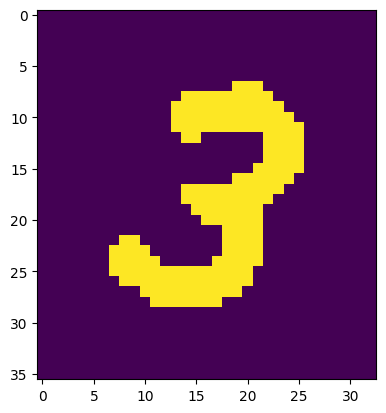

perimeter 93.8406195640564
1/1 [==============================] - 0s 43ms/step
symbol 3


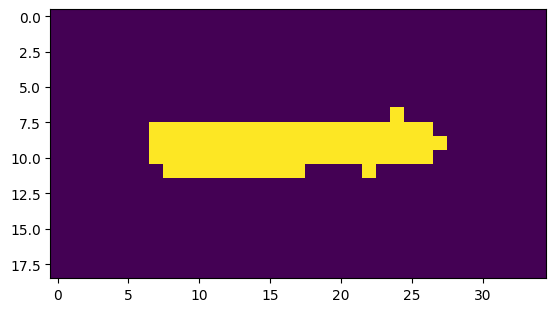

perimeter 45.31370830535889
here minus


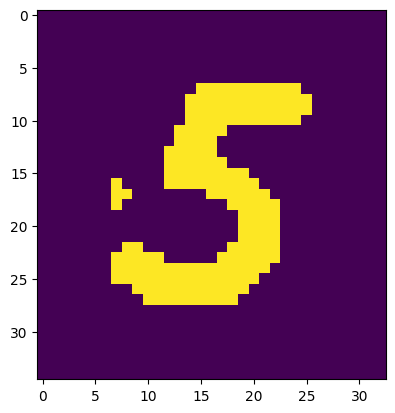

perimeter 90.18376529216766
1/1 [==============================] - 0s 35ms/step
symbol -5


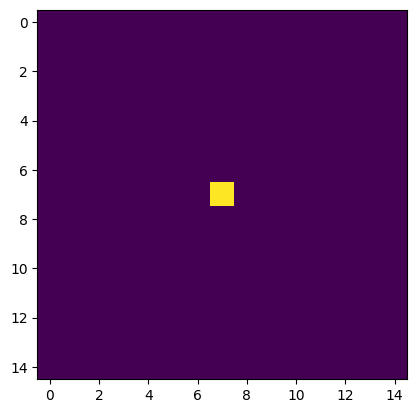

perimeter 0.0
here noise


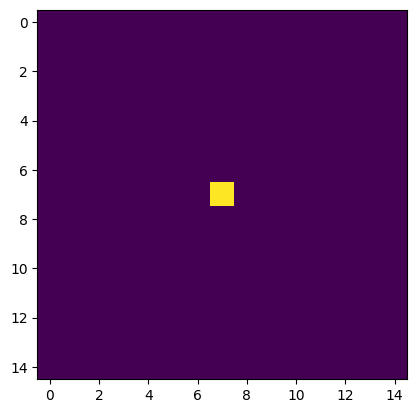

perimeter 0.0
here noise


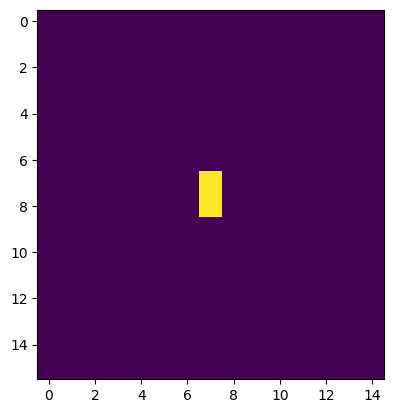

perimeter 2.0
here noise


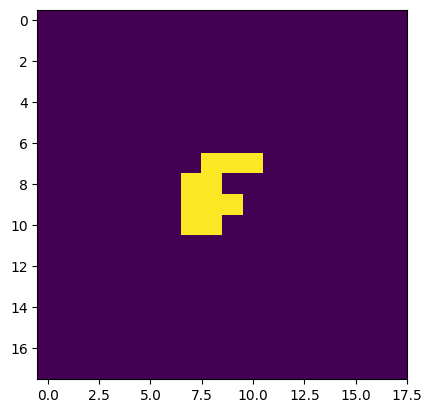

perimeter 11.656854152679443
here noise


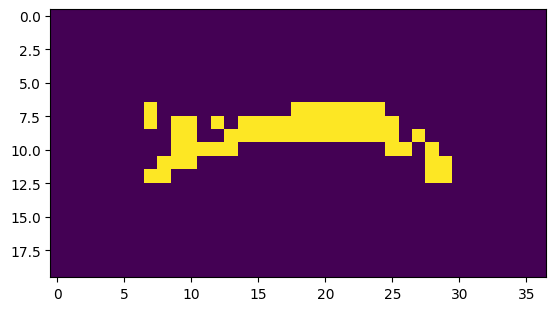

perimeter 60.870057225227356
here minus


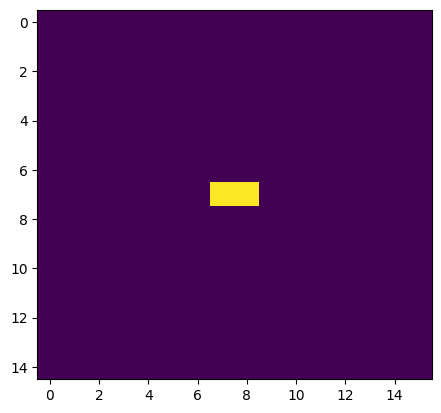

perimeter 2.0
here noise


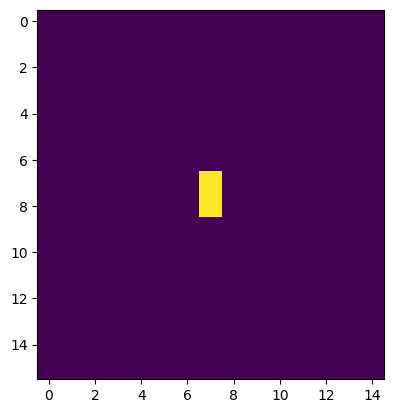

perimeter 2.0
here noise


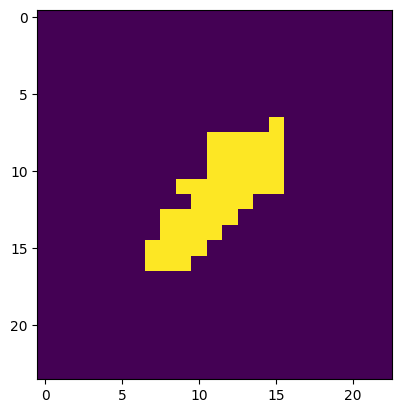

perimeter 30.142135500907898
1/1 [==============================] - 0s 35ms/step
symbol -1


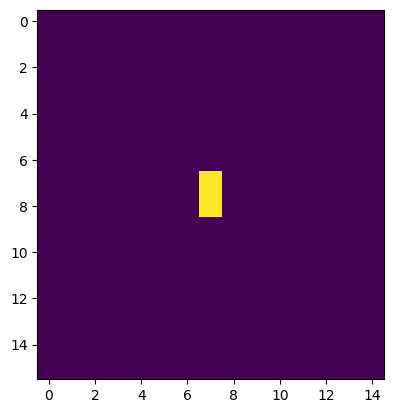

perimeter 2.0
here noise


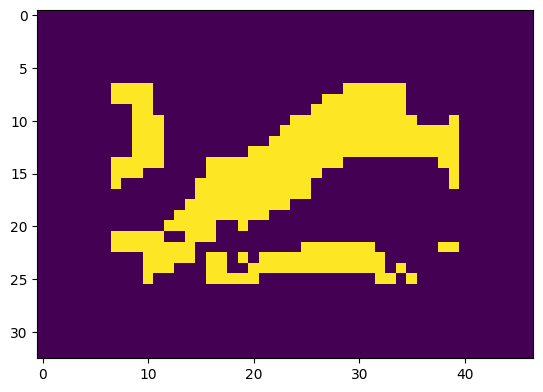

perimeter 93.01219248771667
here minus


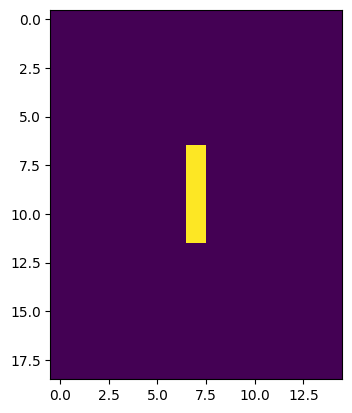

perimeter 8.0
here noise


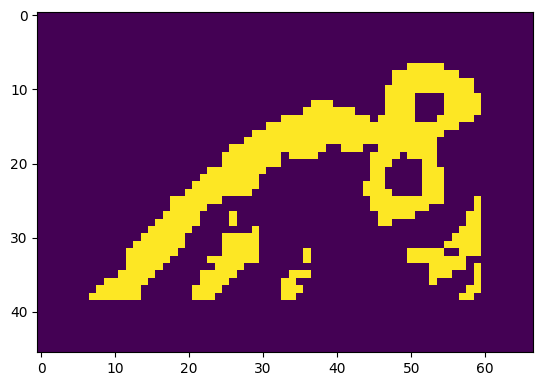

perimeter 165.9238795042038
here minus
[8, -4, 0, 0, 3, -5, 0, 0, 0]


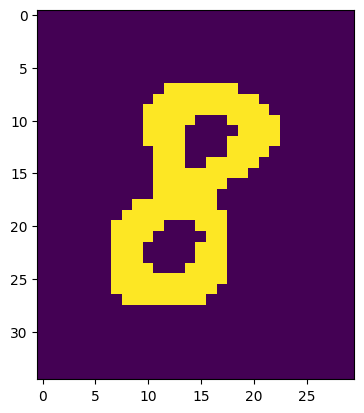

perimeter 63.455843567848206
1/1 [==============================] - 0s 26ms/step
symbol 8


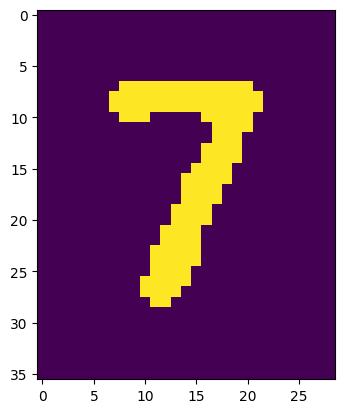

perimeter 72.5269113779068
1/1 [==============================] - 0s 26ms/step
symbol 7


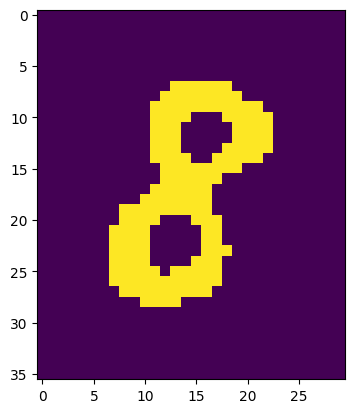

perimeter 65.69848418235779
1/1 [==============================] - 0s 26ms/step
symbol 8


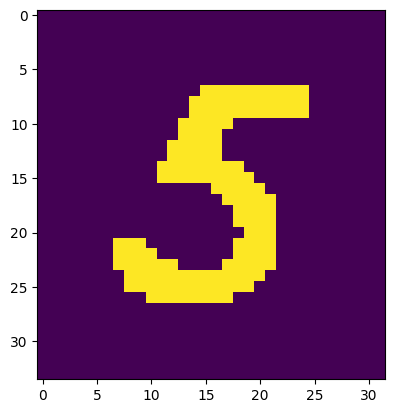

perimeter 89.35533821582794
1/1 [==============================] - 0s 30ms/step
symbol 5


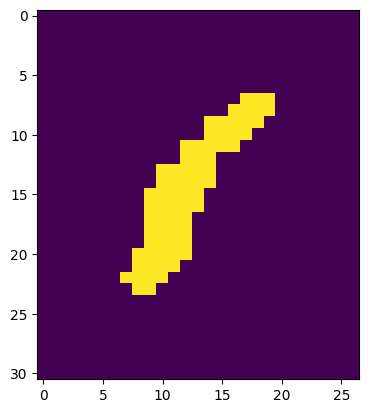

perimeter 46.041629910469055
1/1 [==============================] - 0s 26ms/step
symbol 6


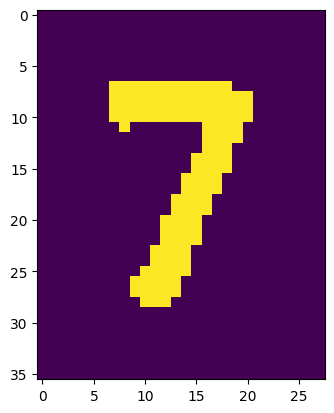

perimeter 72.28427076339722
1/1 [==============================] - 0s 26ms/step
symbol 67


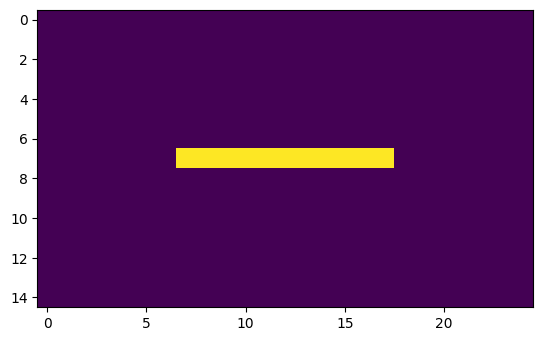

perimeter 20.0
here noise


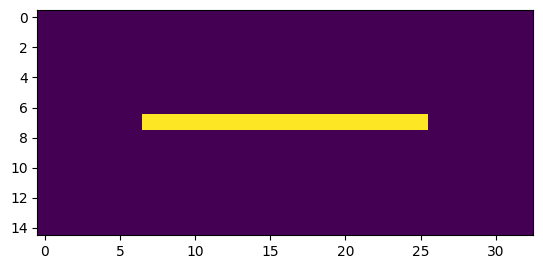

perimeter 36.0
here minus
[8, 7, 8, 5, 67, 0]


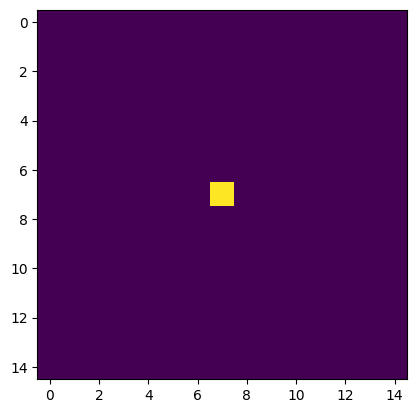

perimeter 0.0
here noise


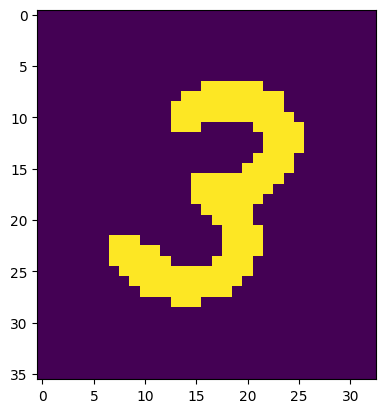

perimeter 92.66904640197754
1/1 [==============================] - 0s 27ms/step
symbol 3


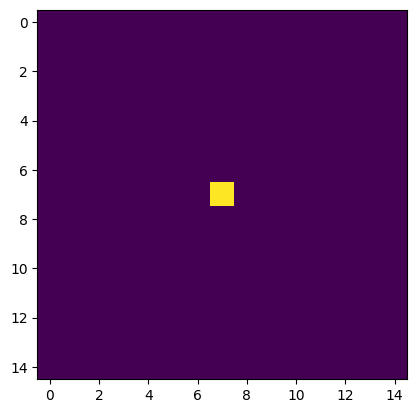

perimeter 0.0
here noise


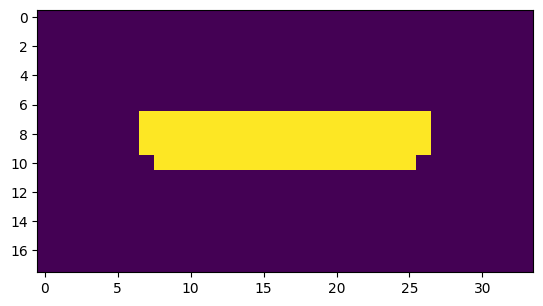

perimeter 42.82842707633972
here minus


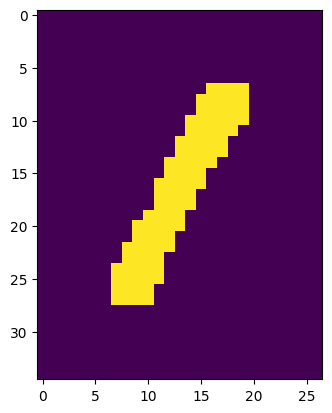

perimeter 53.455843687057495
1/1 [==============================] - 0s 24ms/step
symbol -1


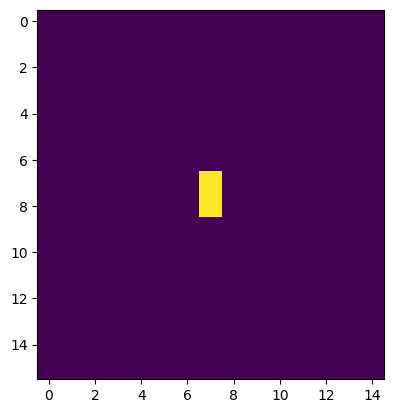

perimeter 2.0
here noise


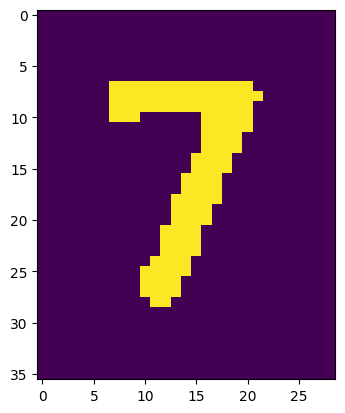

perimeter 72.87005722522736
1/1 [==============================] - 0s 26ms/step
symbol 7


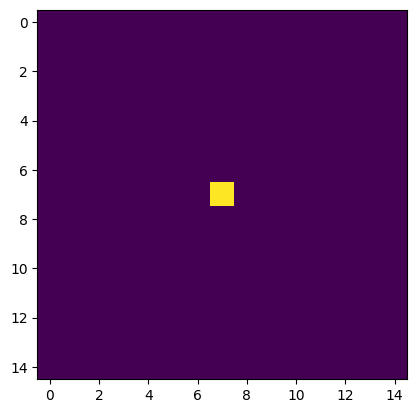

perimeter 0.0
here noise


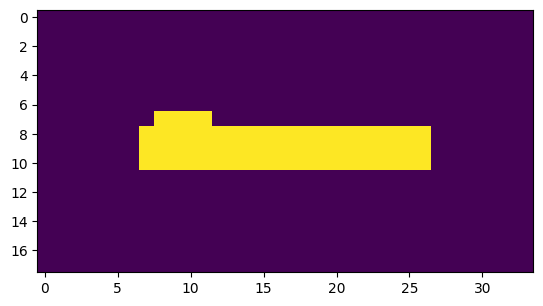

perimeter 42.82842707633972
here minus


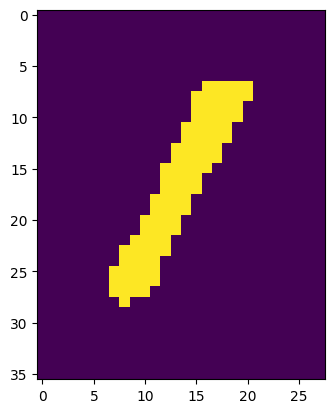

perimeter 55.69848430156708
1/1 [==============================] - 0s 26ms/step
symbol -1


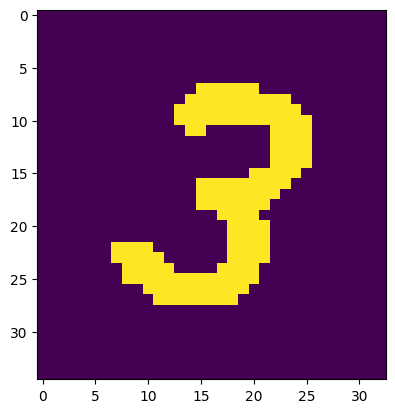

perimeter 93.01219260692596
1/1 [==============================] - 0s 27ms/step
symbol 3


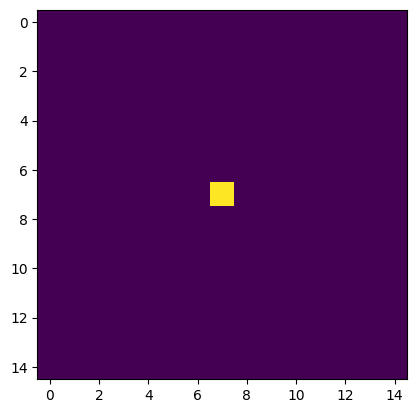

perimeter 0.0
here noise


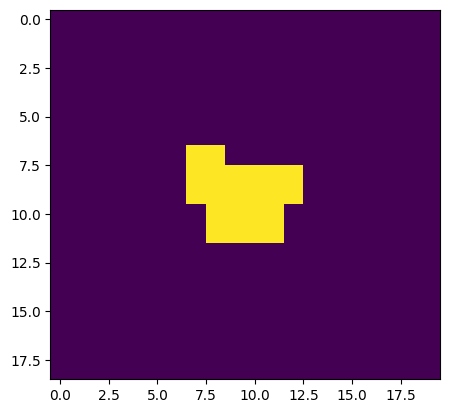

perimeter 16.242640614509583
here noise


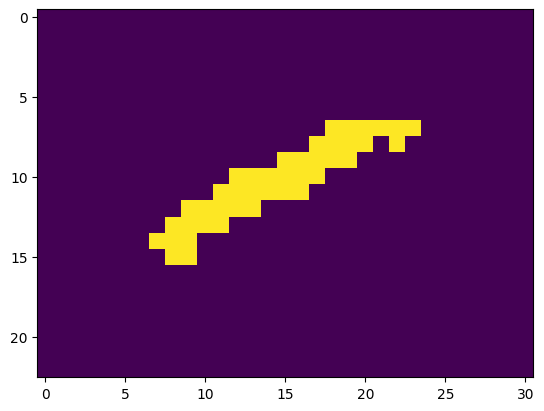

perimeter 40.041630148887634
here minus
[3, 0, -1, 0, 7, 0, -1, 3, 0]


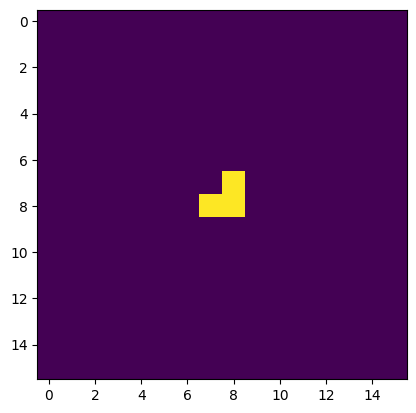

perimeter 3.414213538169861
here noise


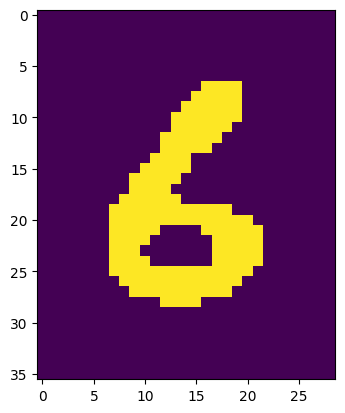

perimeter 68.76955151557922
1/1 [==============================] - 0s 51ms/step
symbol 6


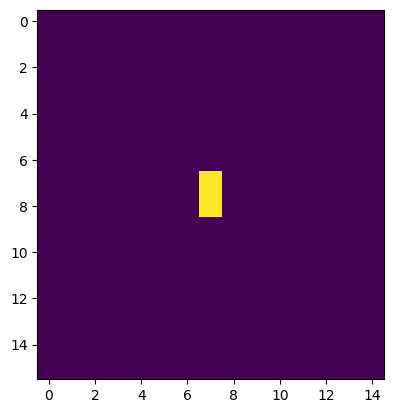

perimeter 2.0
here noise


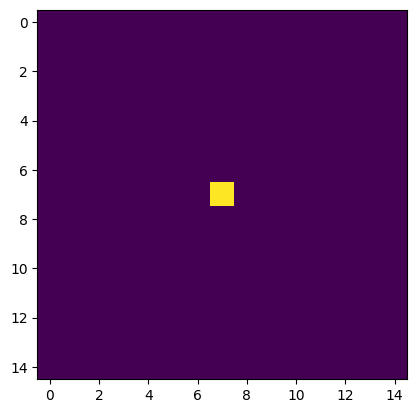

perimeter 0.0
here noise


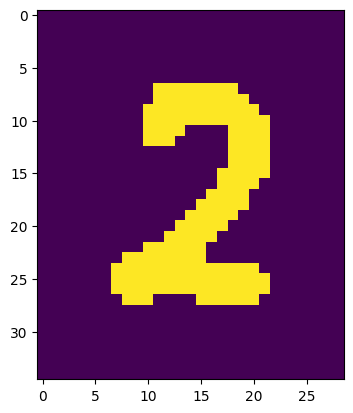

perimeter 85.59797871112823
1/1 [==============================] - 0s 34ms/step
symbol 2


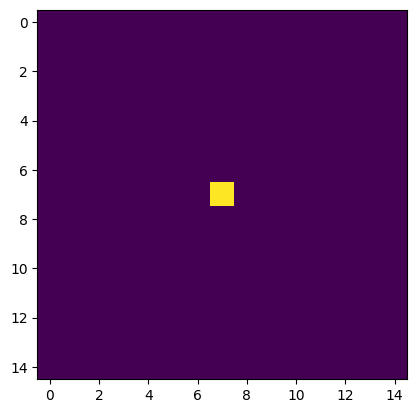

perimeter 0.0
here noise


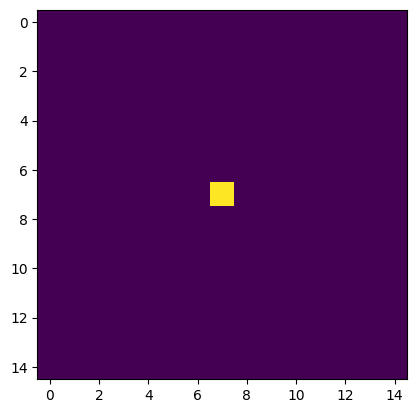

perimeter 0.0
here noise


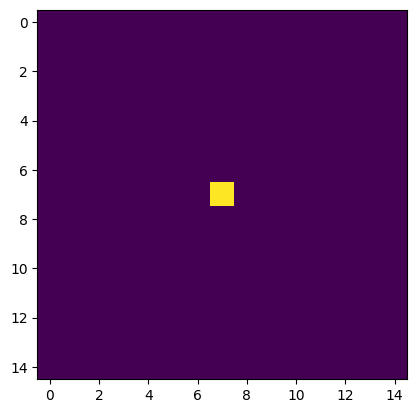

perimeter 0.0
here noise


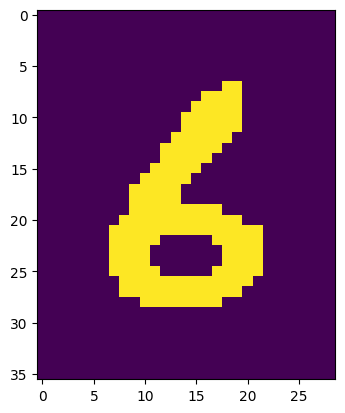

perimeter 67.94112455844879
1/1 [==============================] - 0s 36ms/step
symbol 6


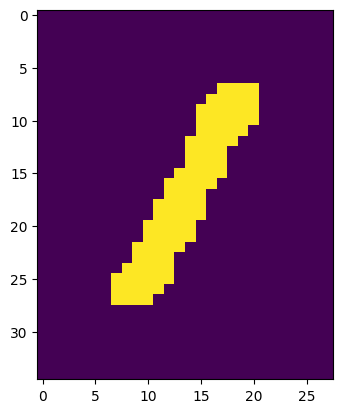

perimeter 54.28427064418793
1/1 [==============================] - 0s 38ms/step
symbol 1


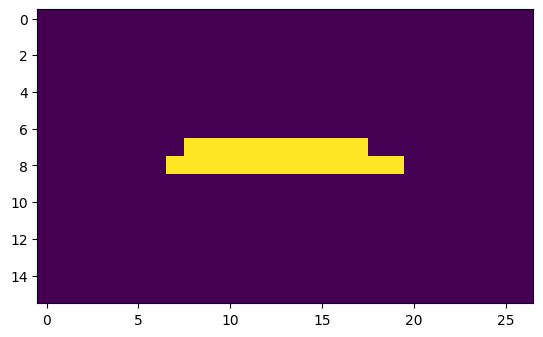

perimeter 24.82842707633972
here noise


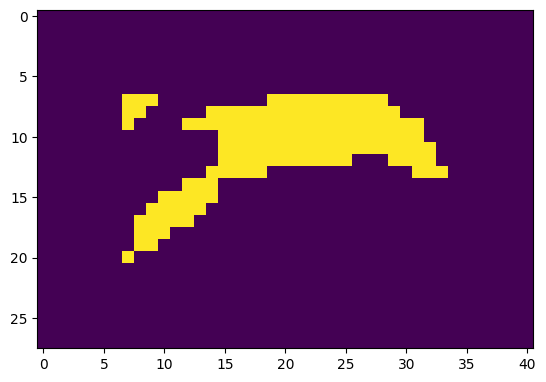

perimeter 74.5269113779068
here minus


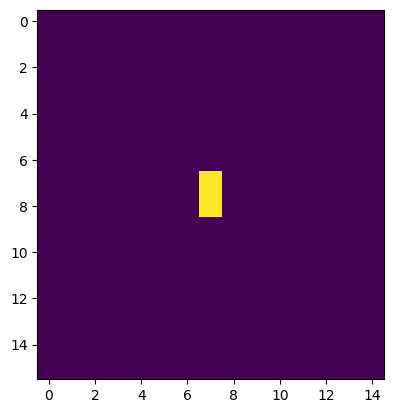

perimeter 2.0
here noise


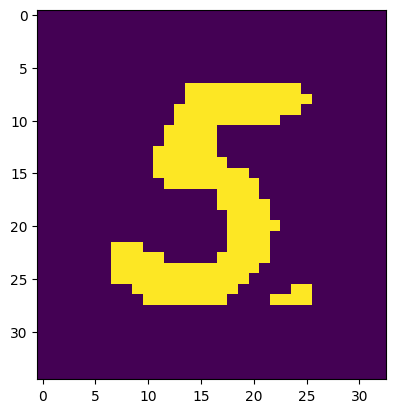

perimeter 90.76955199241638
1/1 [==============================] - 0s 52ms/step
symbol -5


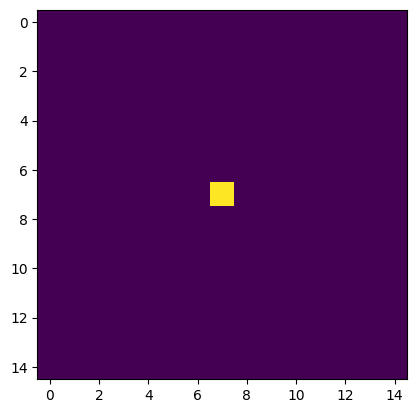

perimeter 0.0
here noise
[0, 6, 0, 0, 2, 6, 1, -5]


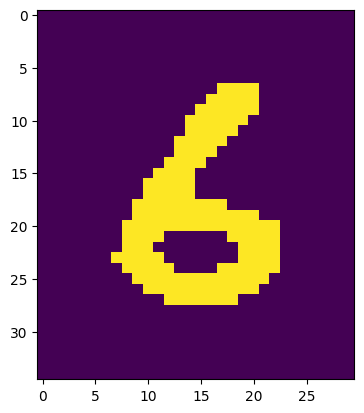

perimeter 66.76955139636993
1/1 [==============================] - 0s 68ms/step
symbol 6


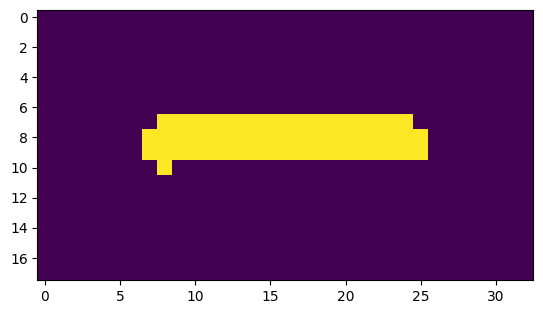

perimeter 39.65685415267944
here minus


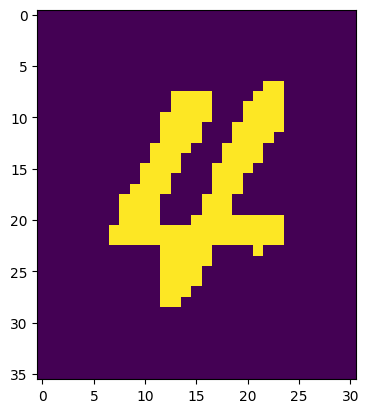

perimeter 102.66904675960541
1/1 [==============================] - 0s 44ms/step
symbol -4


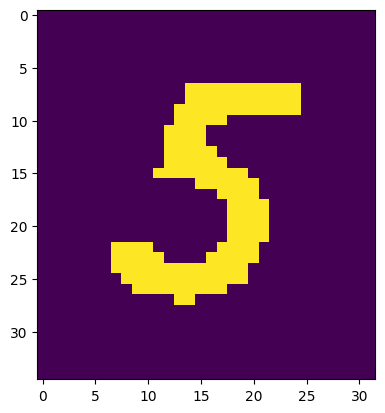

perimeter 89.35533821582794
1/1 [==============================] - 0s 43ms/step
symbol 5


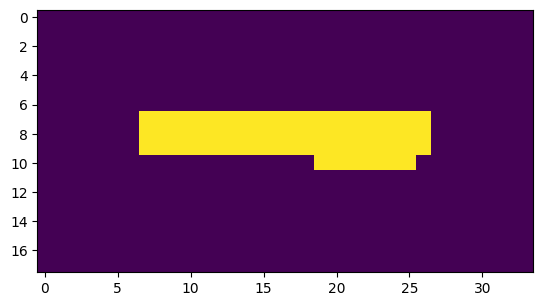

perimeter 42.82842707633972
here minus


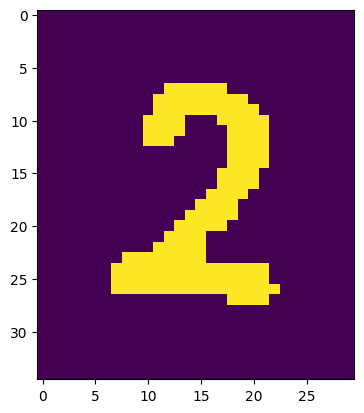

perimeter 88.18376588821411
1/1 [==============================] - 0s 66ms/step
symbol -2


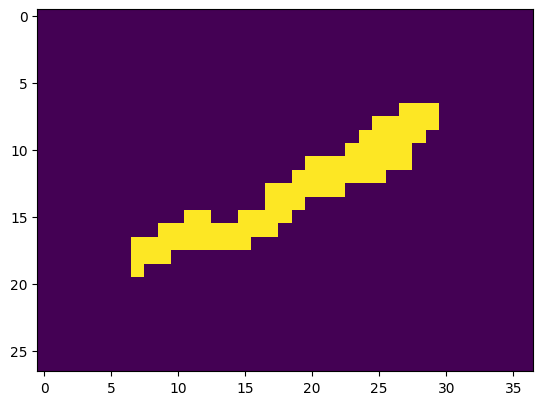

perimeter 57.6984840631485
here minus


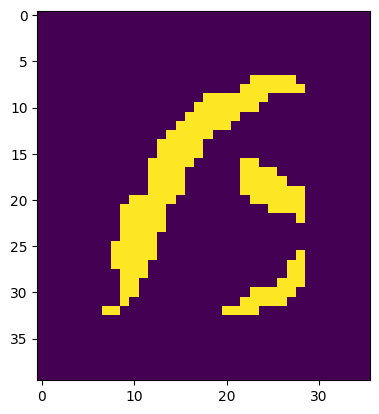

perimeter 77.01219272613525
1/1 [==============================] - 0s 57ms/step
symbol -0


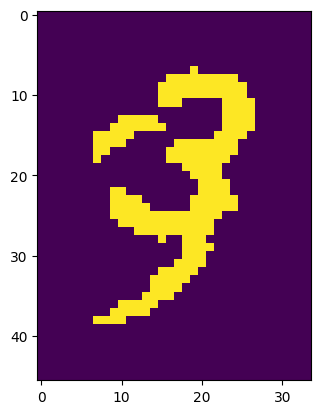

perimeter 129.88224971294403
1/1 [==============================] - 0s 40ms/step
symbol -09
[6, -4, 5, -2, -9]


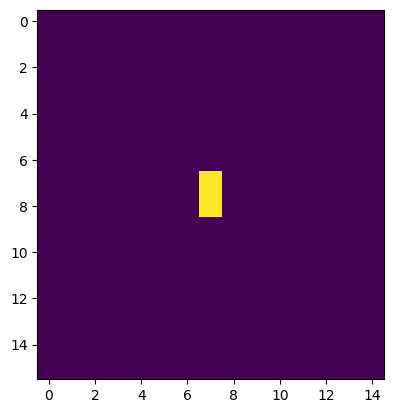

perimeter 2.0
here noise


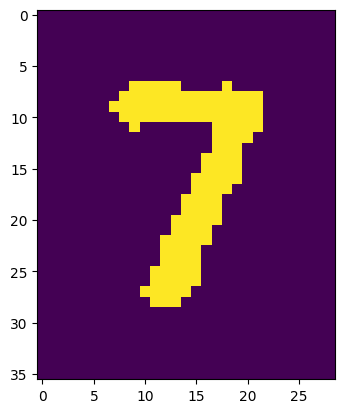

perimeter 73.35533845424652
1/1 [==============================] - 0s 42ms/step
symbol 7


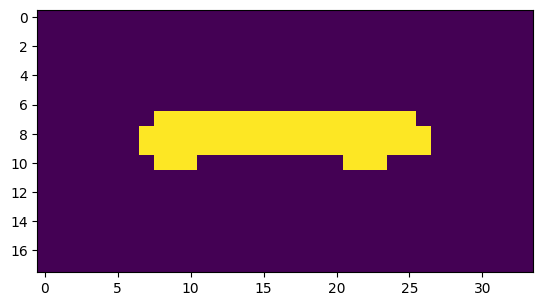

perimeter 42.485281229019165
here minus


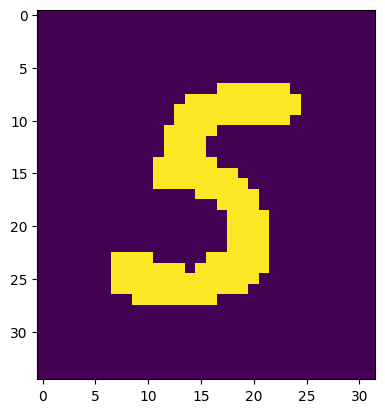

perimeter 89.35533845424652
1/1 [==============================] - 0s 42ms/step
symbol -5


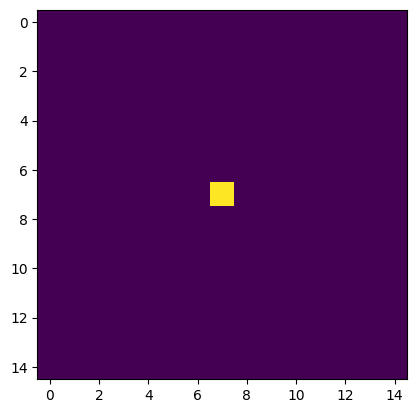

perimeter 0.0
here noise


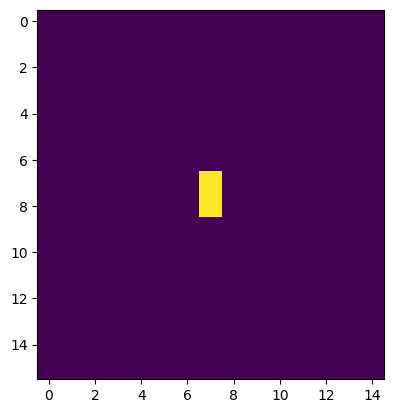

perimeter 2.0
here noise


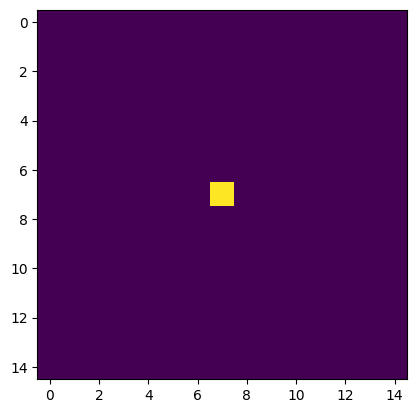

perimeter 0.0
here noise


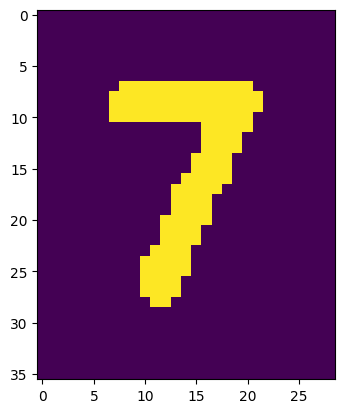

perimeter 70.87005722522736
1/1 [==============================] - 0s 28ms/step
symbol 7


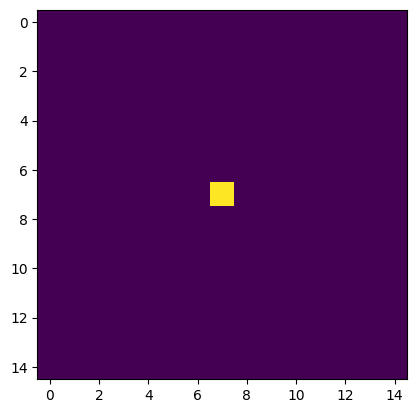

perimeter 0.0
here noise


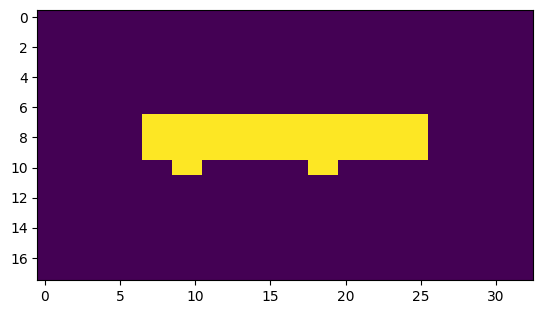

perimeter 41.65685415267944
here minus


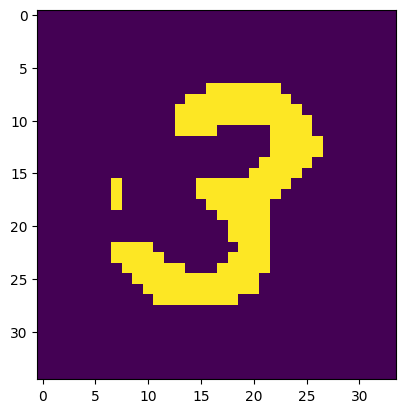

perimeter 93.25483286380768
1/1 [==============================] - 0s 47ms/step
symbol -3


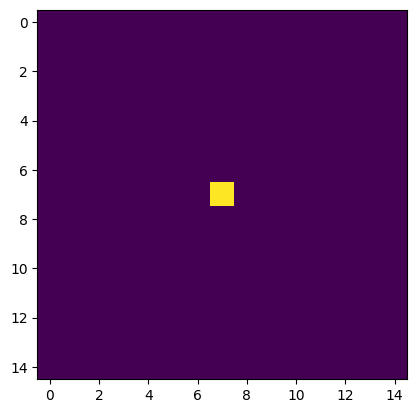

perimeter 0.0
here noise


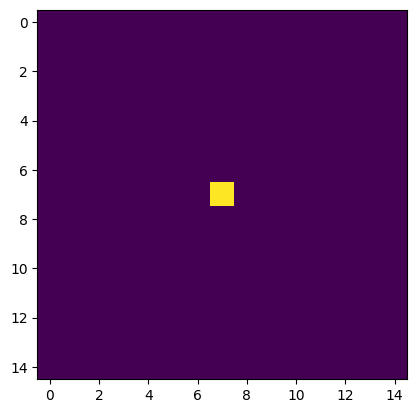

perimeter 0.0
here noise


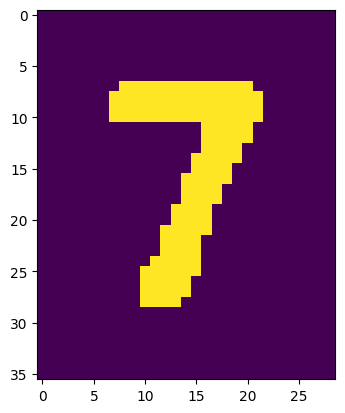

perimeter 72.04163014888763
1/1 [==============================] - 0s 38ms/step
symbol 7


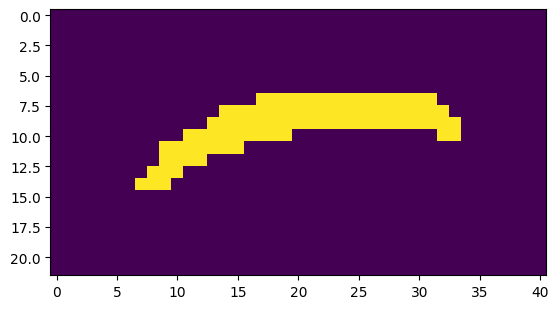

perimeter 59.79898953437805
here minus
[7, -5, 0, 7, 0, -3, 0, 7, 0]


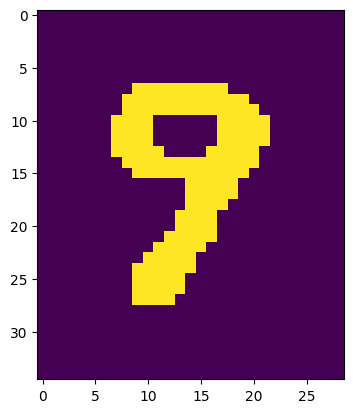

perimeter 65.11269783973694
1/1 [==============================] - 0s 33ms/step
symbol 8


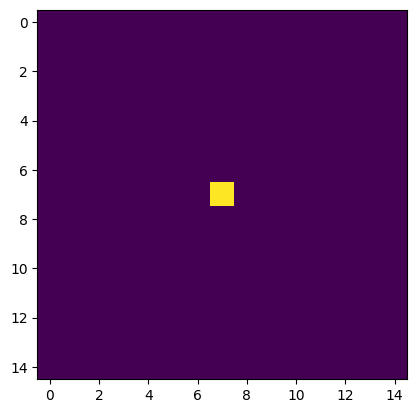

perimeter 0.0
here noise


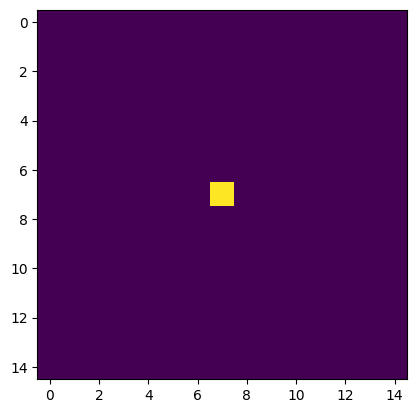

perimeter 0.0
here noise


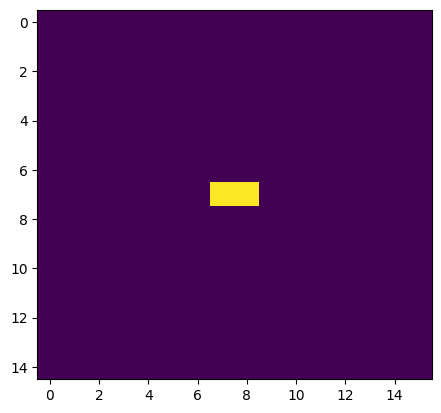

perimeter 2.0
here noise


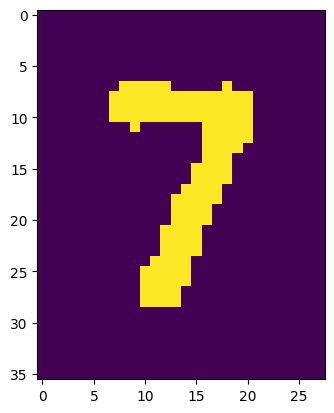

perimeter 72.28427076339722
1/1 [==============================] - 0s 27ms/step
symbol 7


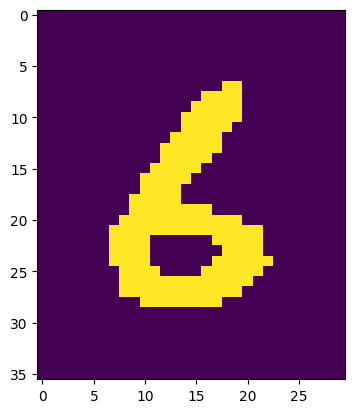

perimeter 68.76955187320709
1/1 [==============================] - 0s 25ms/step
symbol 6


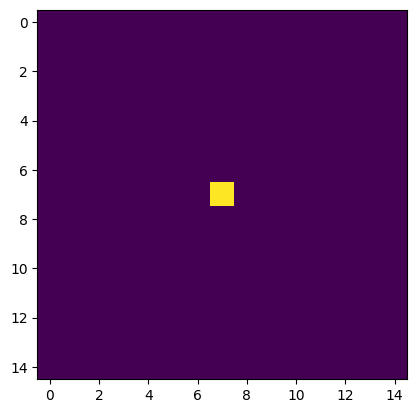

perimeter 0.0
here noise


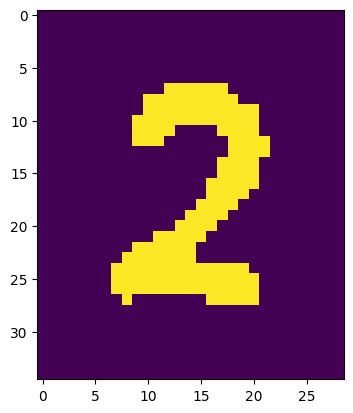

perimeter 86.42640590667725
1/1 [==============================] - 0s 28ms/step
symbol 2


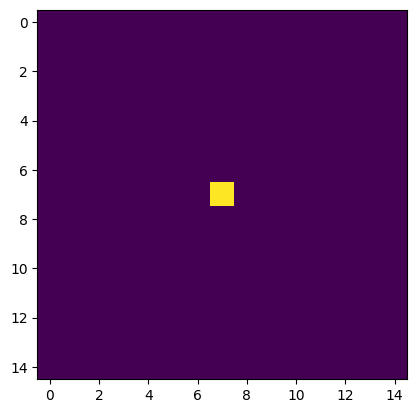

perimeter 0.0
here noise


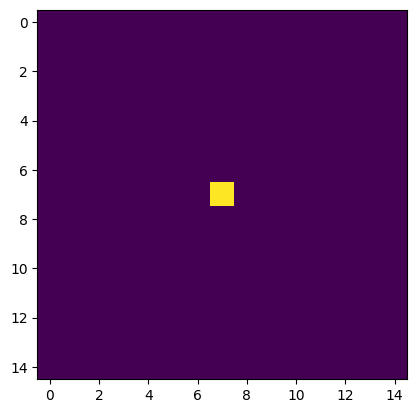

perimeter 0.0
here noise


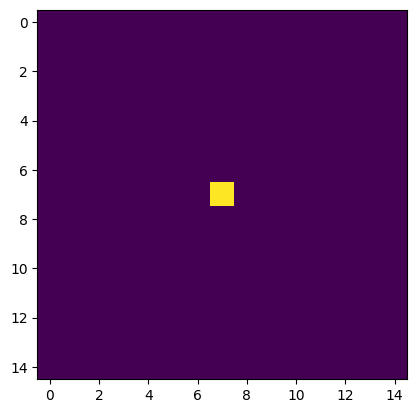

perimeter 0.0
here noise


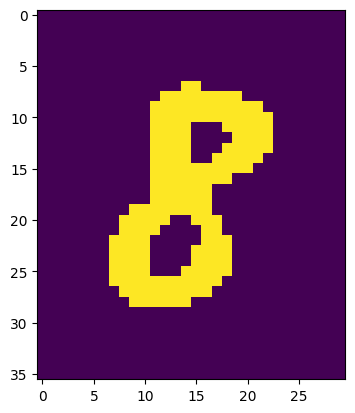

perimeter 64.87005722522736
1/1 [==============================] - 0s 36ms/step
symbol 8


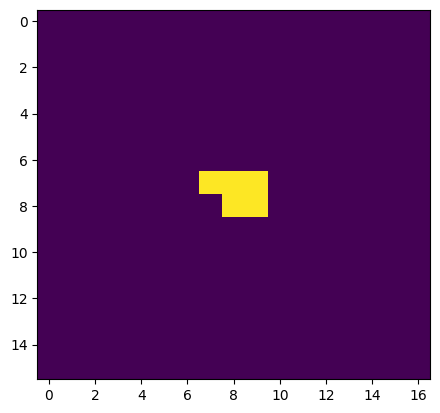

perimeter 5.414213538169861
here noise


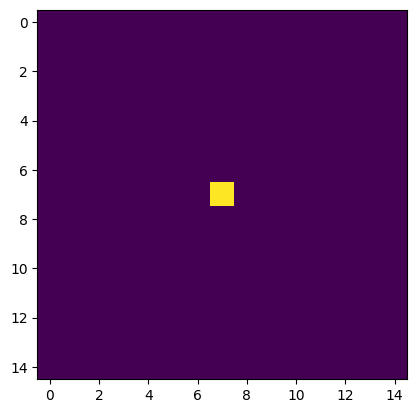

perimeter 0.0
here noise


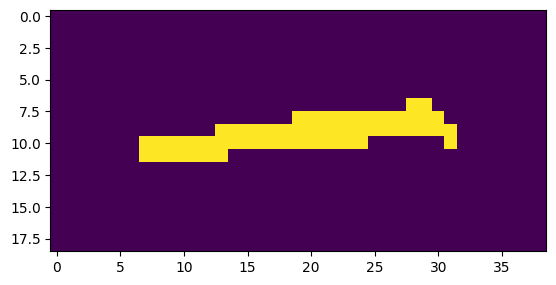

perimeter 53.31370830535889
here minus


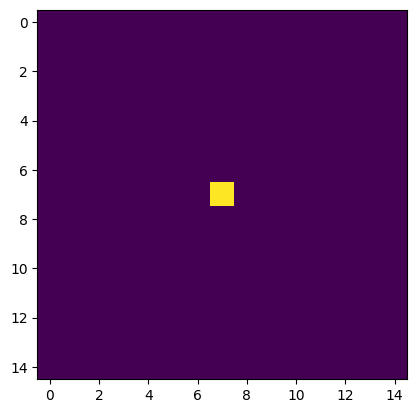

perimeter 0.0
here noise
[8, 0, 0, 7, 6, 0, 2, 0, 8, 0, 0]


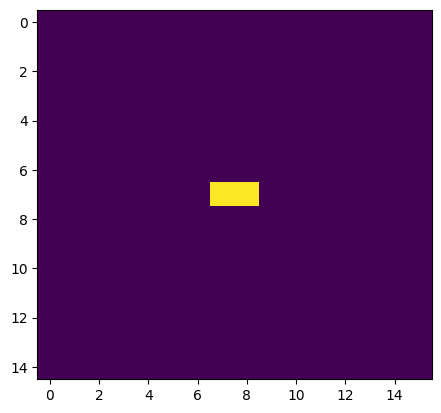

perimeter 2.0
here noise


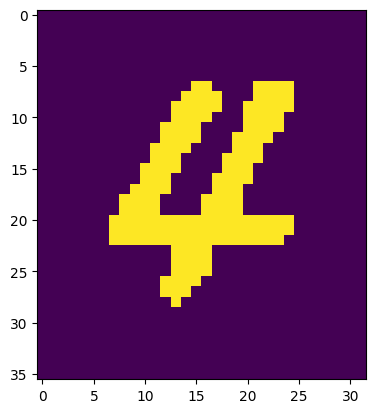

perimeter 104.9116872549057
1/1 [==============================] - 0s 42ms/step
symbol 4


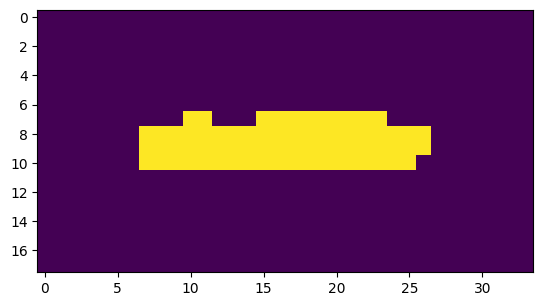

perimeter 43.071067690849304
here minus


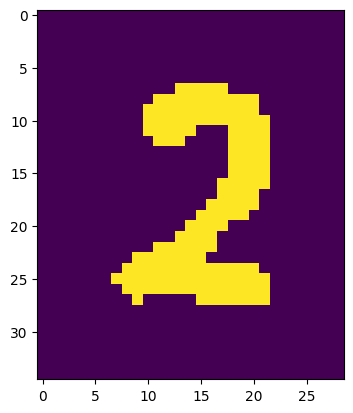

perimeter 85.5979791879654
1/1 [==============================] - 0s 41ms/step
symbol -2


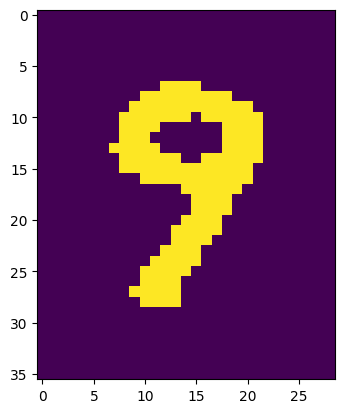

perimeter 66.76955187320709
1/1 [==============================] - 0s 37ms/step
symbol 9


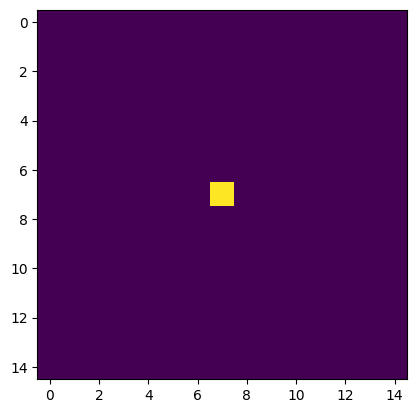

perimeter 0.0
here noise


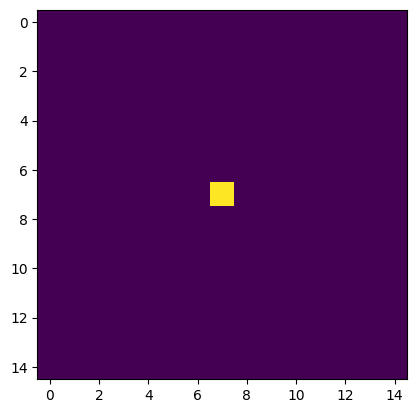

perimeter 0.0
here noise


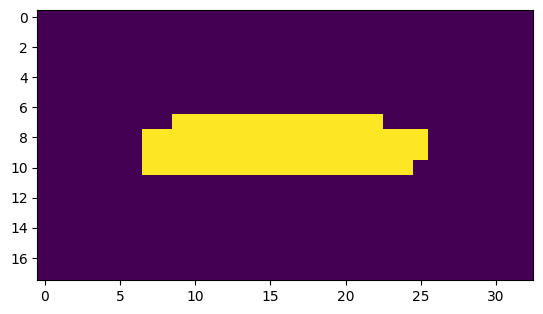

perimeter 40.24264061450958
here minus


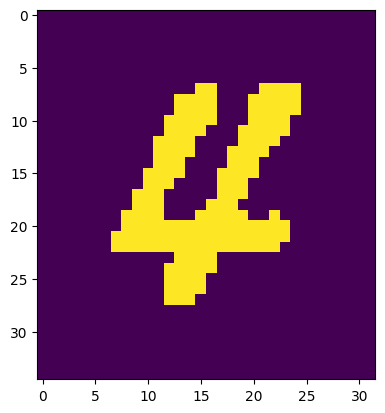

perimeter 102.91168713569641
1/1 [==============================] - 0s 39ms/step
symbol -4


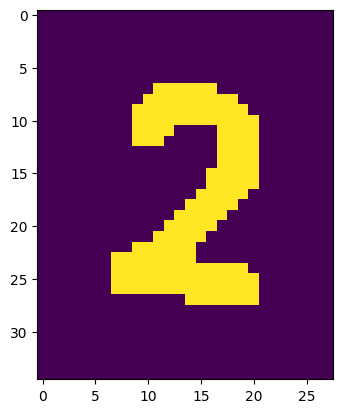

perimeter 83.35533797740936
1/1 [==============================] - 0s 34ms/step
symbol 2


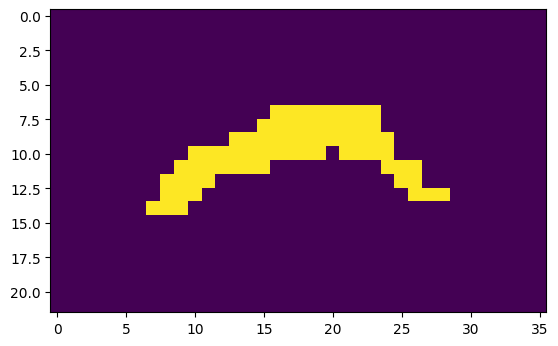

perimeter 53.455843448638916
here minus
[4, -2, 9, 0, -4, 2, 0]


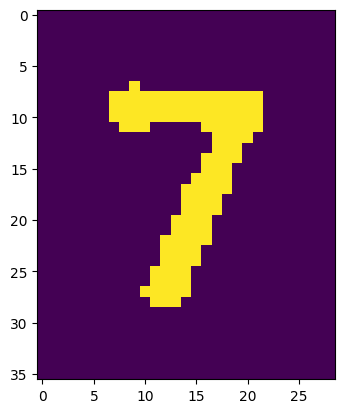

perimeter 73.11269783973694
1/1 [==============================] - 0s 33ms/step
symbol 7


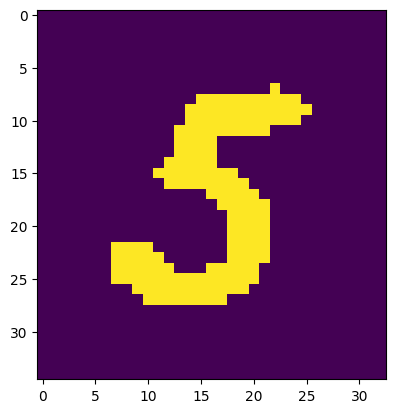

perimeter 89.59797871112823
1/1 [==============================] - 0s 45ms/step
symbol 5


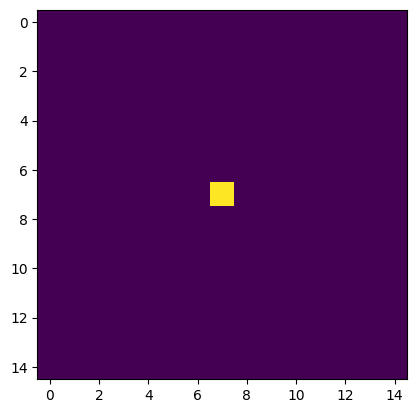

perimeter 0.0
here noise


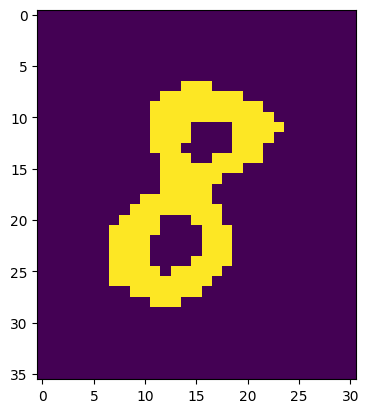

perimeter 65.94112467765808
1/1 [==============================] - 0s 51ms/step
symbol 8


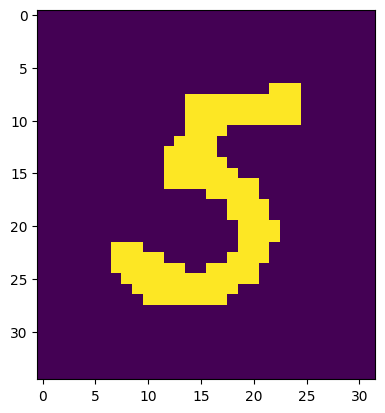

perimeter 90.7695517539978
1/1 [==============================] - 0s 58ms/step
symbol 5


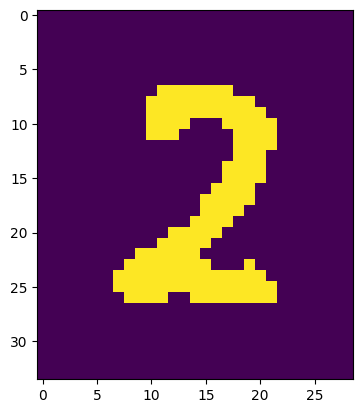

perimeter 85.25483334064484
1/1 [==============================] - 0s 31ms/step
symbol 2


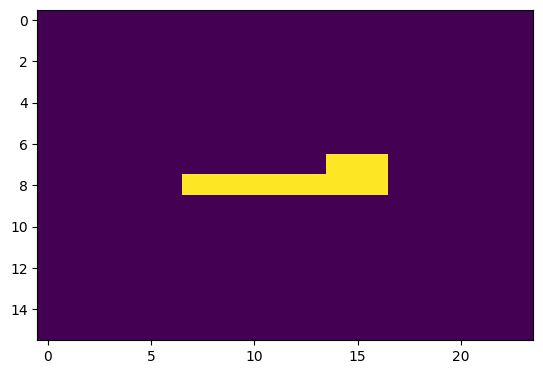

perimeter 19.41421353816986
here noise


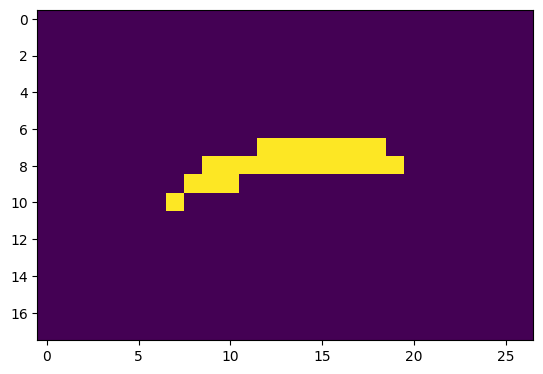

perimeter 26.485281229019165
here noise
[7, 5, 8, 5, 2, 0]


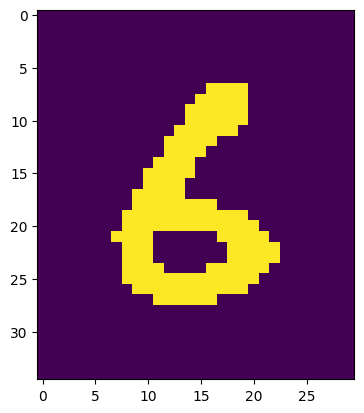

perimeter 66.76955163478851
1/1 [==============================] - 0s 33ms/step
symbol 6


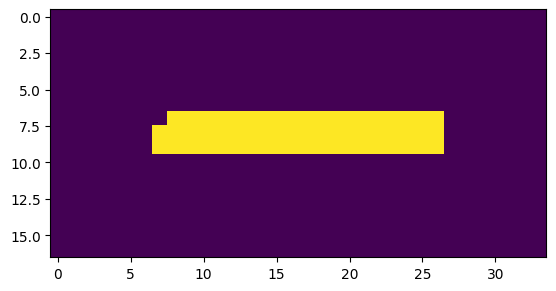

perimeter 41.41421353816986
here minus


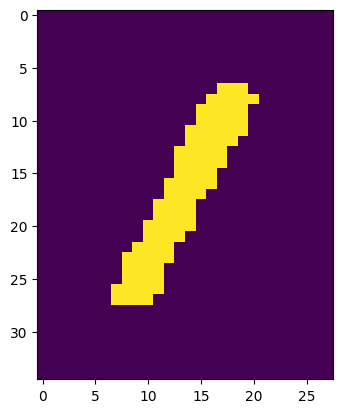

perimeter 53.69848430156708
1/1 [==============================] - 0s 26ms/step
symbol -1


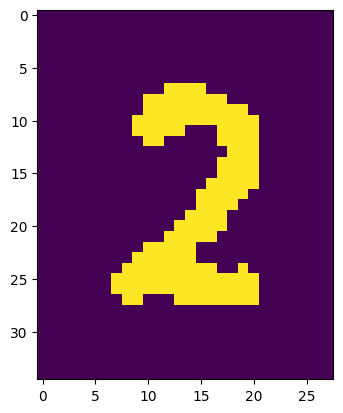

perimeter 85.25483298301697
1/1 [==============================] - 0s 38ms/step
symbol 2


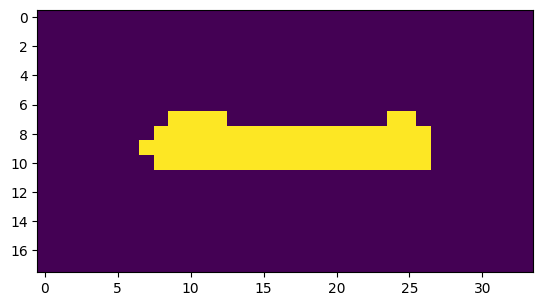

perimeter 42.485281229019165
here minus


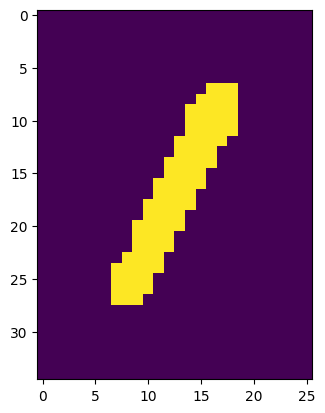

perimeter 51.455843687057495
1/1 [==============================] - 0s 32ms/step
symbol -1


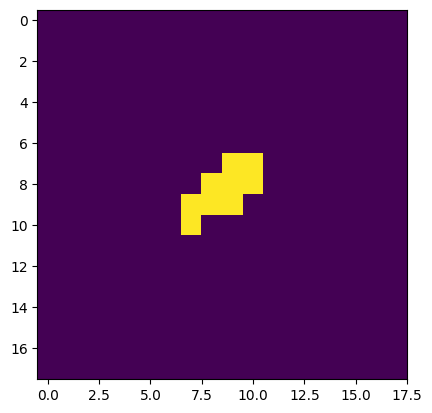

perimeter 9.656854152679443
here noise


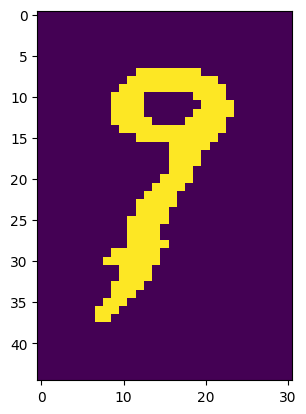

perimeter 90.32590079307556
1/1 [==============================] - 0s 23ms/step
symbol 2
[6, -1, 2, -1, 2]


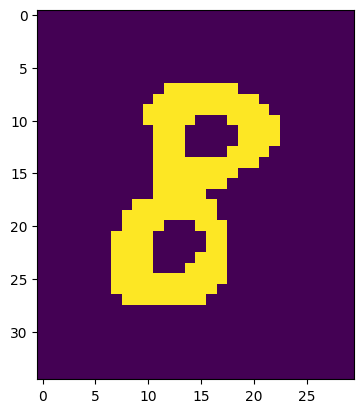

perimeter 64.87005722522736
1/1 [==============================] - 0s 58ms/step
symbol 8


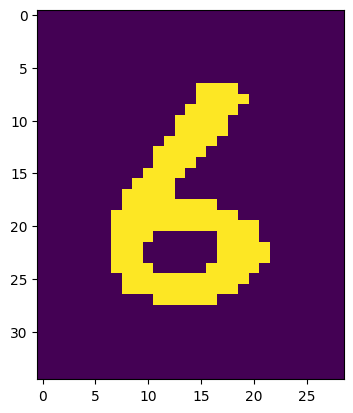

perimeter 66.76955187320709
1/1 [==============================] - 0s 151ms/step
symbol 6


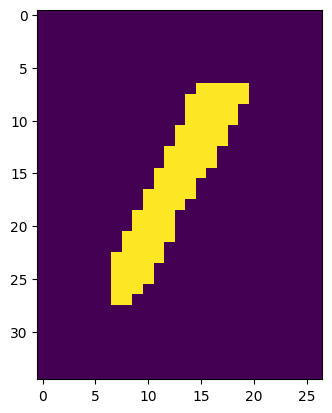

perimeter 52.870057225227356
1/1 [==============================] - 0s 29ms/step
symbol 1


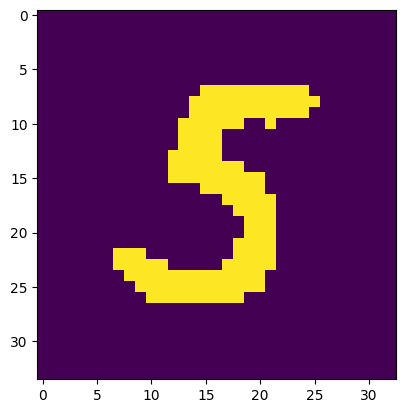

perimeter 88.7695517539978
1/1 [==============================] - 0s 27ms/step
symbol 5


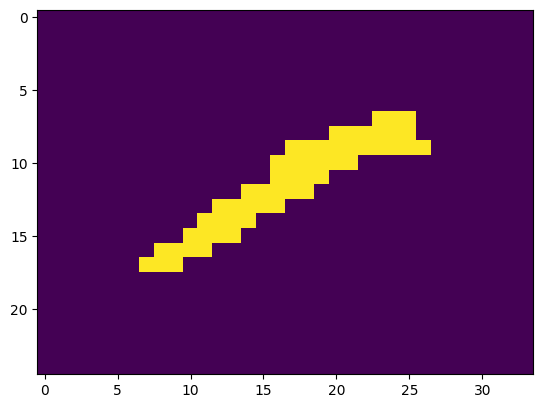

perimeter 47.455843567848206
here minus


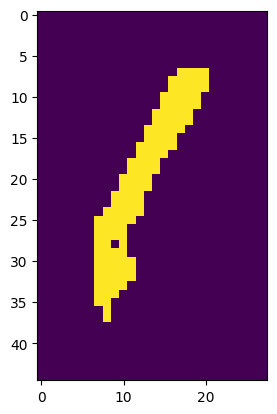

perimeter 73.35533833503723
1/1 [==============================] - 0s 33ms/step
symbol -0
[8, 6, 1, 5, 0]


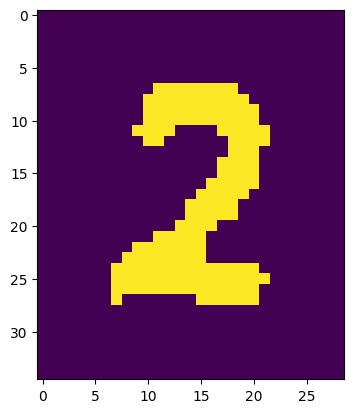

perimeter 87.01219248771667
1/1 [==============================] - 0s 28ms/step
symbol 2


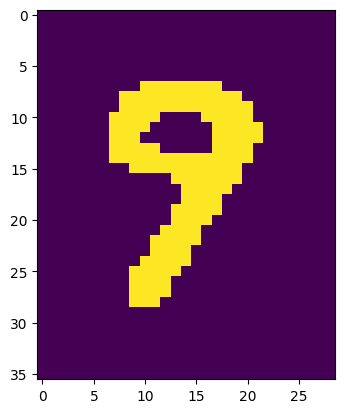

perimeter 66.5269113779068
1/1 [==============================] - 0s 28ms/step
symbol 8


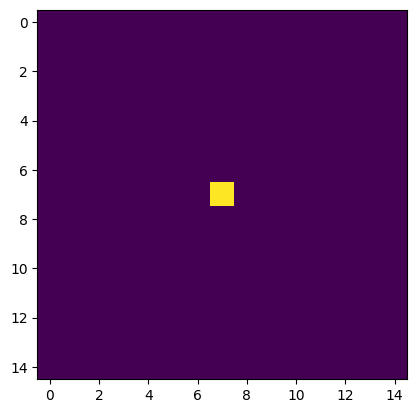

perimeter 0.0
here noise


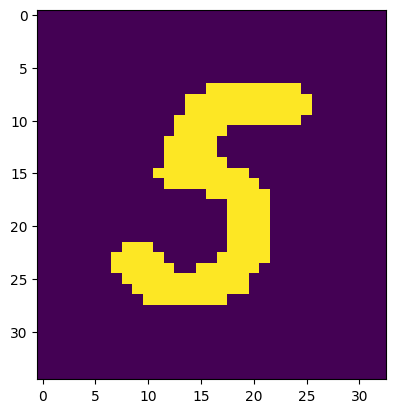

perimeter 89.59797883033752
1/1 [==============================] - 0s 26ms/step
symbol 5


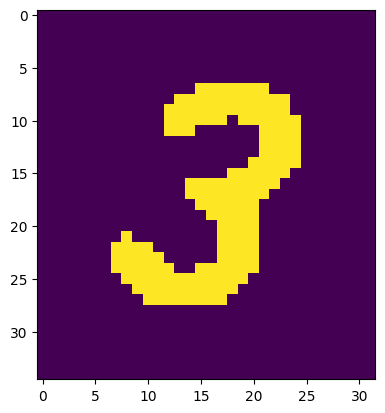

perimeter 91.84061920642853
1/1 [==============================] - 0s 27ms/step
symbol 3


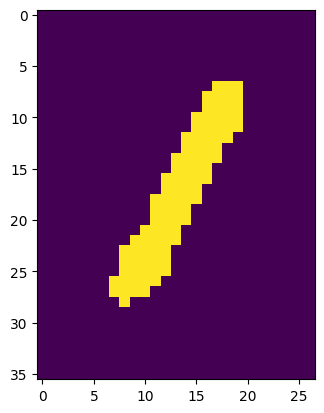

perimeter 53.69848418235779
1/1 [==============================] - 0s 24ms/step
symbol 1


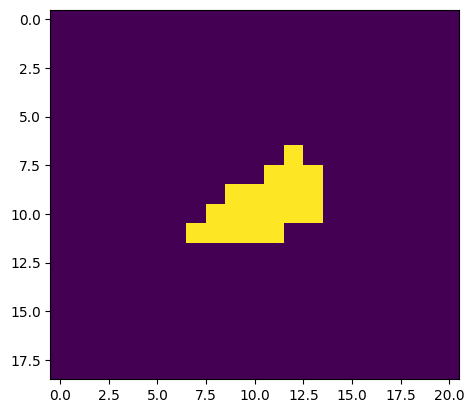

perimeter 16.485281229019165
here noise
[2, 8, 0, 5, 3, 1, 0]


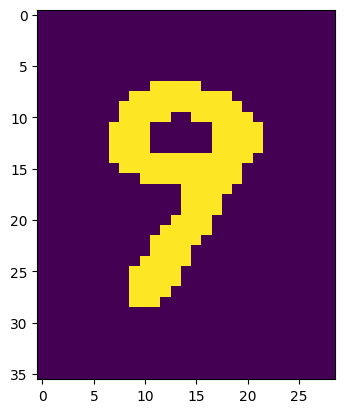

perimeter 65.35533821582794
1/1 [==============================] - 0s 36ms/step
symbol 8


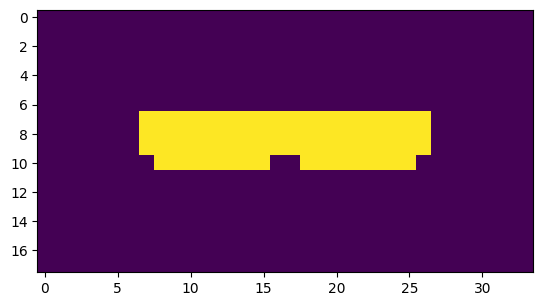

perimeter 43.65685415267944
here minus


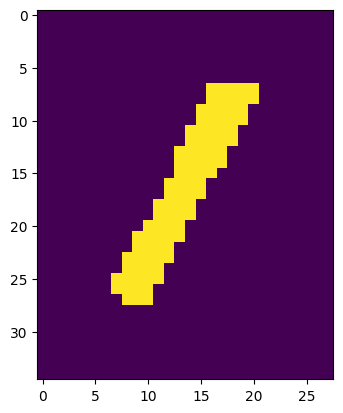

perimeter 54.28427076339722
1/1 [==============================] - 0s 56ms/step
symbol -1


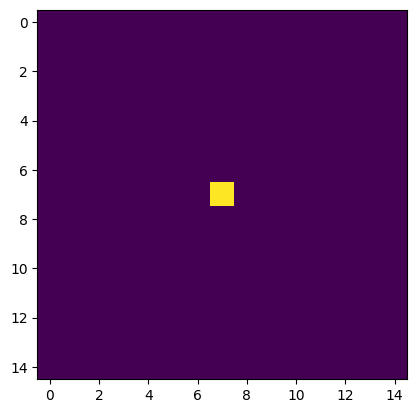

perimeter 0.0
here noise


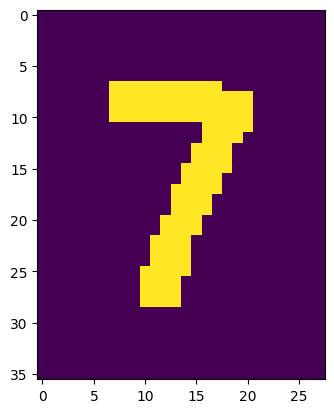

perimeter 71.21320307254791
1/1 [==============================] - 0s 43ms/step
symbol 7


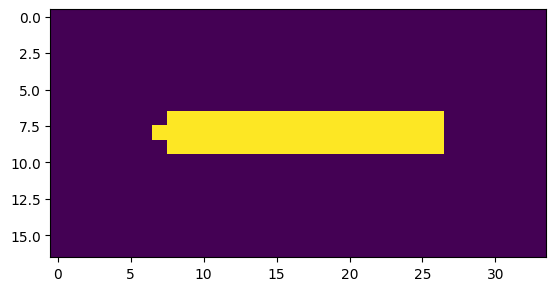

perimeter 40.82842707633972
here minus


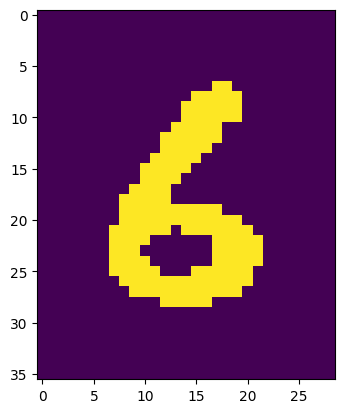

perimeter 68.76955211162567
1/1 [==============================] - 0s 35ms/step
symbol -6


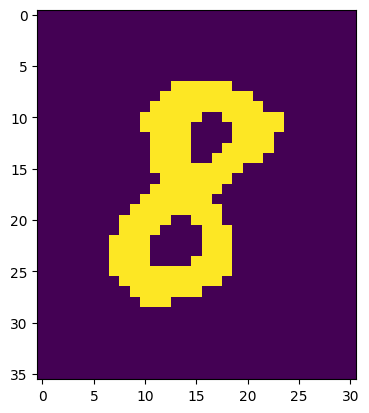

perimeter 66.18376529216766
1/1 [==============================] - 0s 46ms/step
symbol 8
[8, -1, 0, 7, -6, 8]


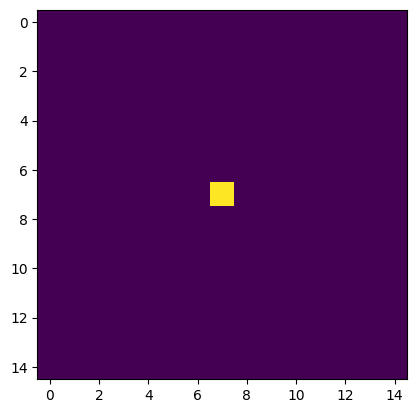

perimeter 0.0
here noise


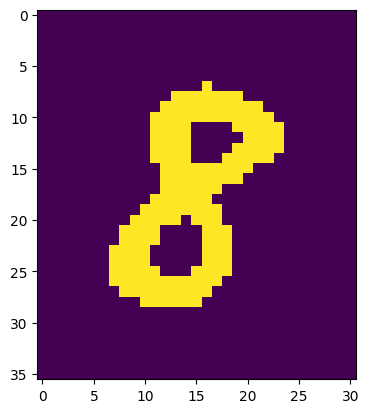

perimeter 65.35533833503723
1/1 [==============================] - 0s 36ms/step
symbol 8


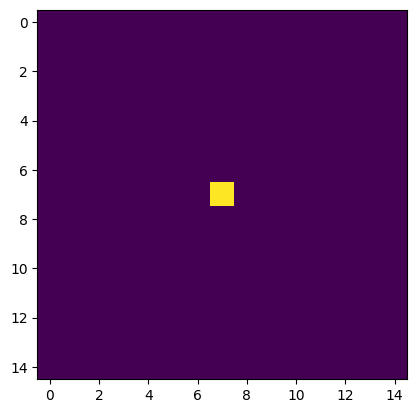

perimeter 0.0
here noise


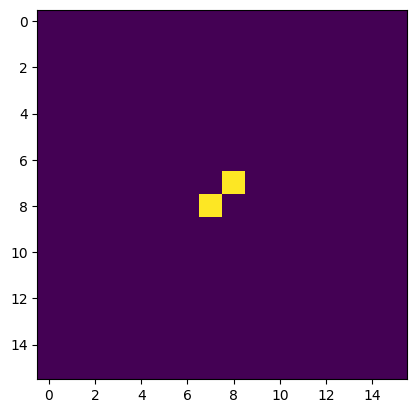

perimeter 2.8284270763397217
here noise


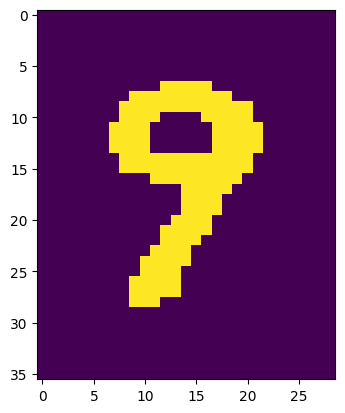

perimeter 66.52691125869751
1/1 [==============================] - 0s 45ms/step
symbol 8


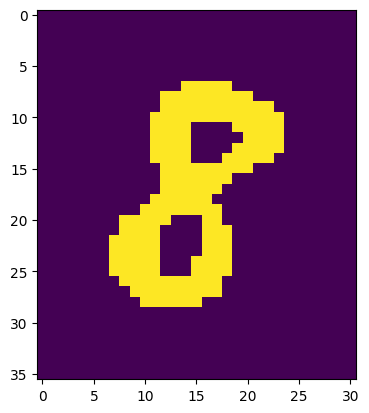

perimeter 67.11269748210907
1/1 [==============================] - 0s 45ms/step
symbol 8


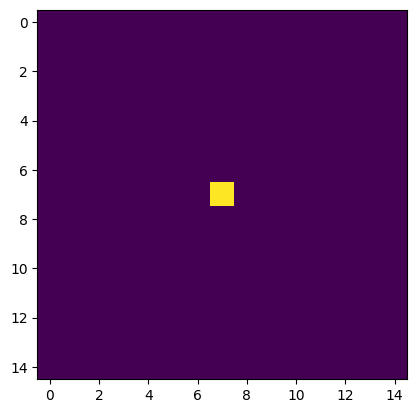

perimeter 0.0
here noise


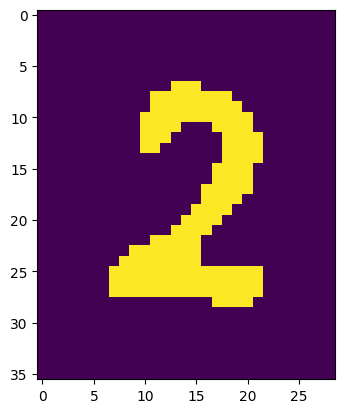

perimeter 87.01219260692596
1/1 [==============================] - 0s 46ms/step
symbol 2


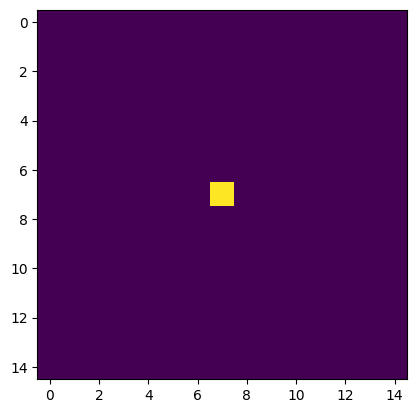

perimeter 0.0
here noise


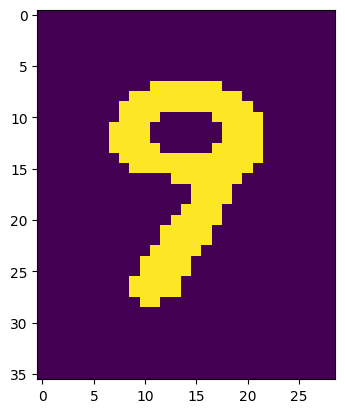

perimeter 66.7695517539978
1/1 [==============================] - 0s 74ms/step
symbol 8


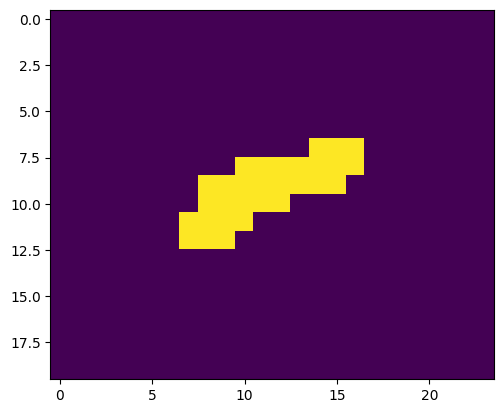

perimeter 23.899494767189026
here noise
[8, 0, 8, 8, 2, 8, 0]


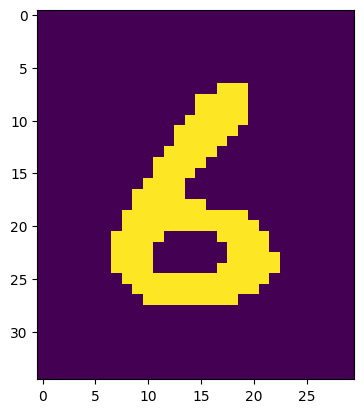

perimeter 66.76955163478851
1/1 [==============================] - 0s 54ms/step
symbol 6


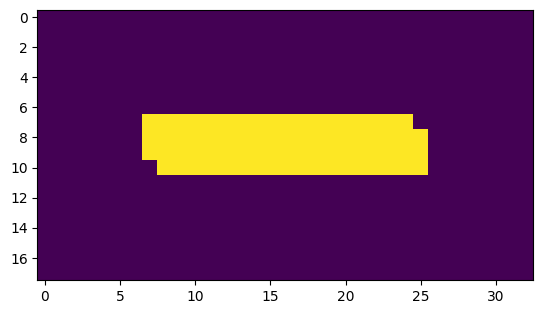

perimeter 40.82842707633972
here minus


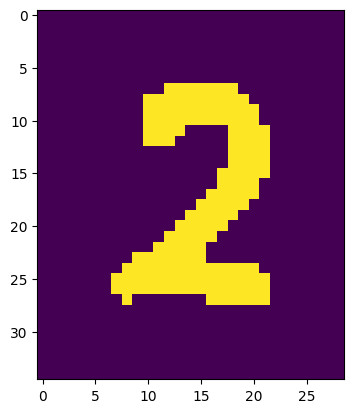

perimeter 85.59797954559326
1/1 [==============================] - 0s 51ms/step
symbol -2


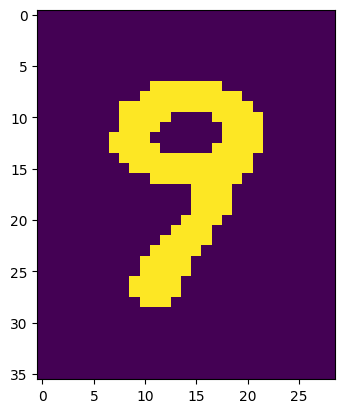

perimeter 66.76955211162567
1/1 [==============================] - 0s 36ms/step
symbol 9


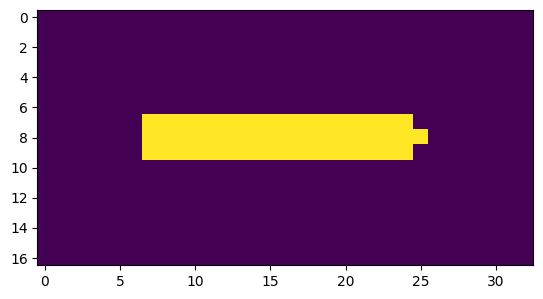

perimeter 38.82842707633972
here minus


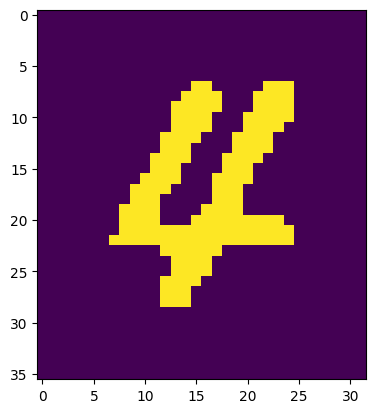

perimeter 105.74011433124542
1/1 [==============================] - 0s 52ms/step
symbol -4


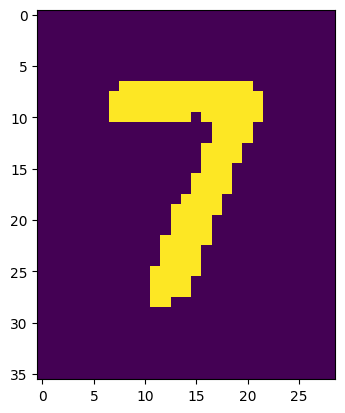

perimeter 72.87005722522736
1/1 [==============================] - 0s 36ms/step
symbol 7


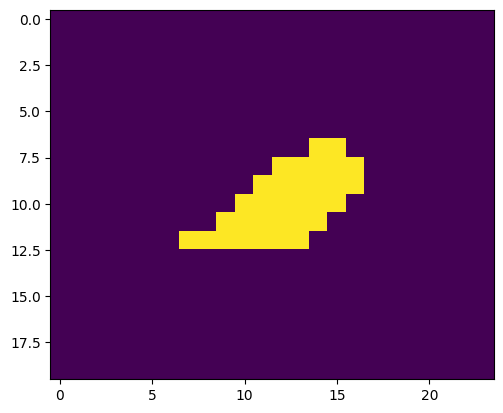

perimeter 22.727921724319458
here noise


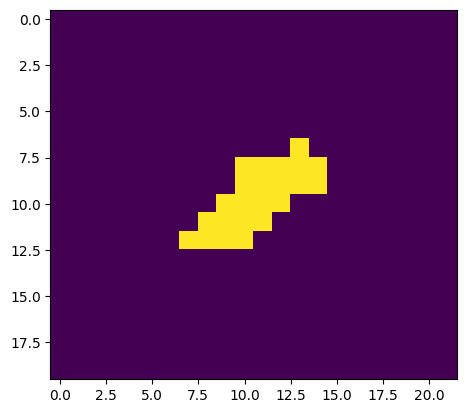

perimeter 19.313708066940308
here noise
[6, -2, 9, -4, 7, 0]


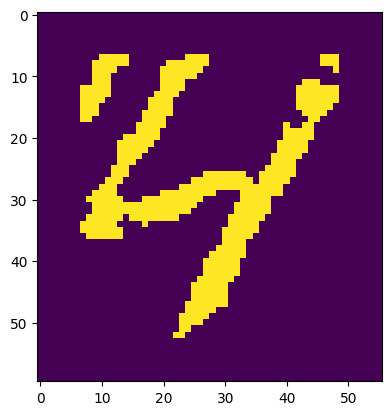

perimeter 241.17871296405792
1/1 [==============================] - 0s 30ms/step
symbol 4


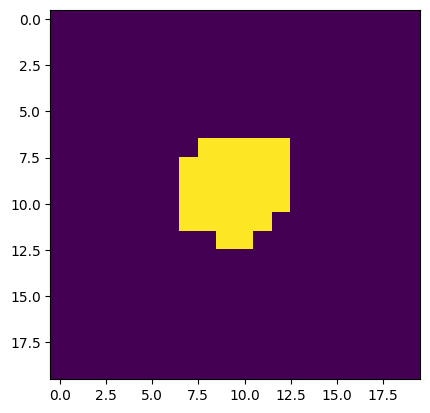

perimeter 17.656854152679443
here noise


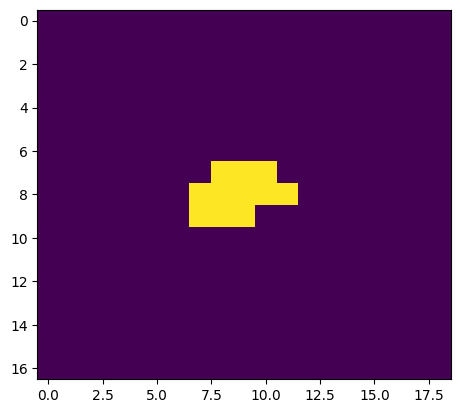

perimeter 10.242640614509583
here noise


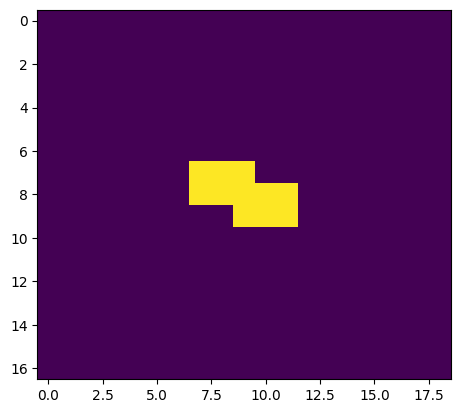

perimeter 10.828427076339722
here noise


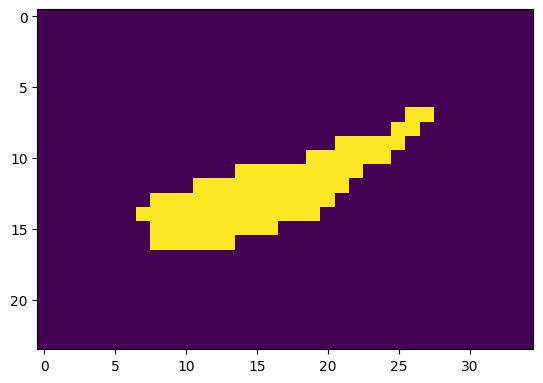

perimeter 48.041630029678345
here minus


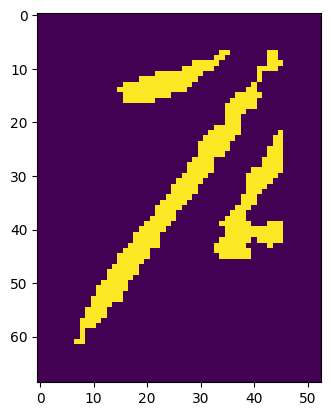

perimeter 147.3380926847458
1/1 [==============================] - 0s 45ms/step
symbol 4-2


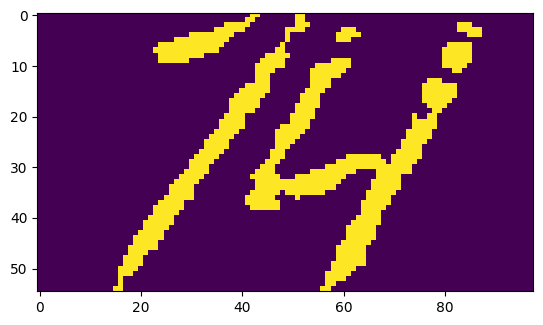

written_answer 0


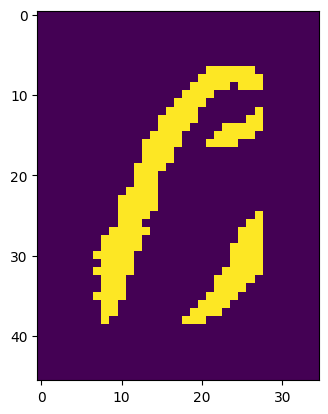

perimeter 87.74011409282684
1/1 [==============================] - 0s 37ms/step
symbol 6


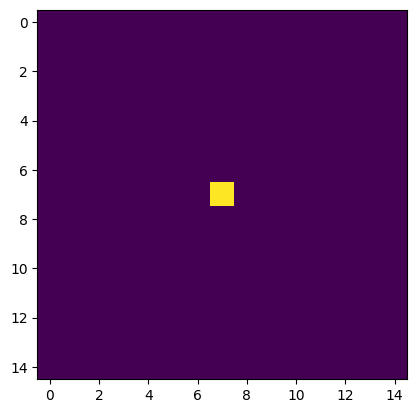

perimeter 0.0
here noise


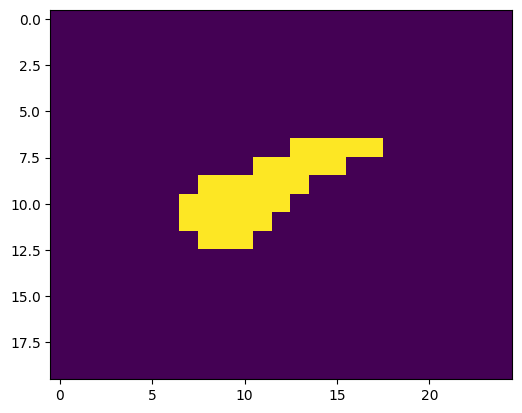

perimeter 24.727921843528748
here noise


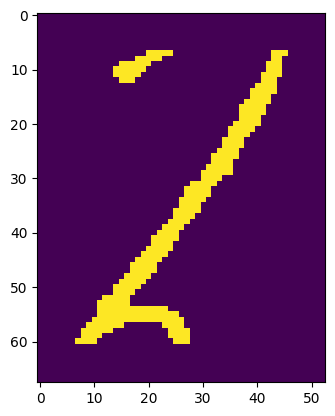

perimeter 169.23758780956268
1/1 [==============================] - 0s 54ms/step
symbol 61


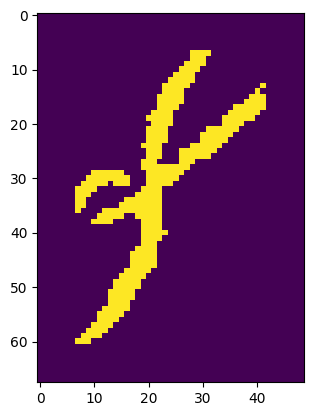

perimeter 203.27921879291534
1/1 [==============================] - 0s 45ms/step
symbol 615


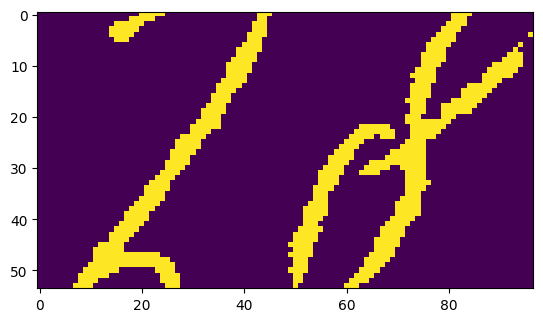

written_answer 615


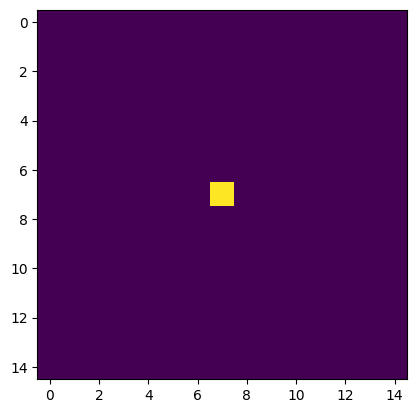

perimeter 0.0
here noise


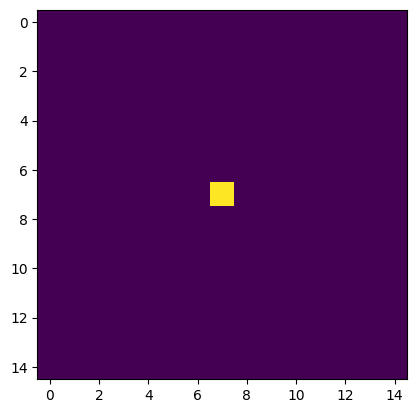

perimeter 0.0
here noise


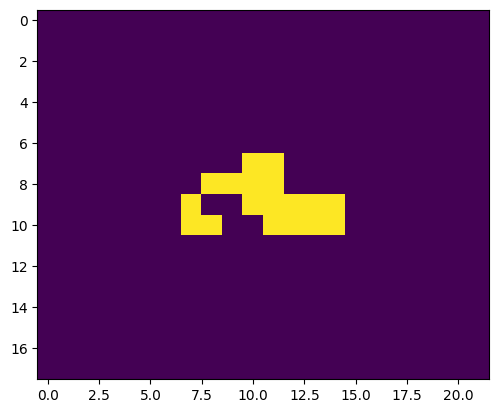

perimeter 21.899494767189026
here noise


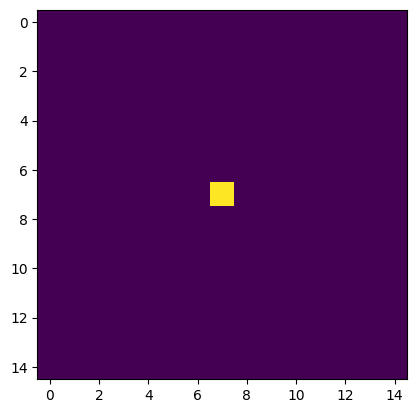

perimeter 0.0
here noise


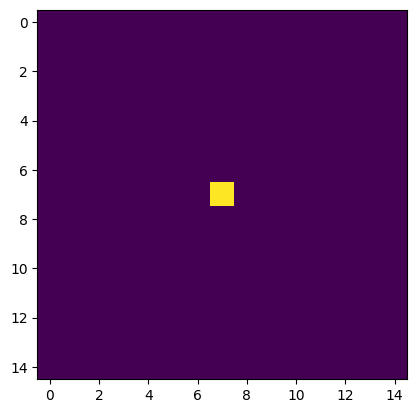

perimeter 0.0
here noise


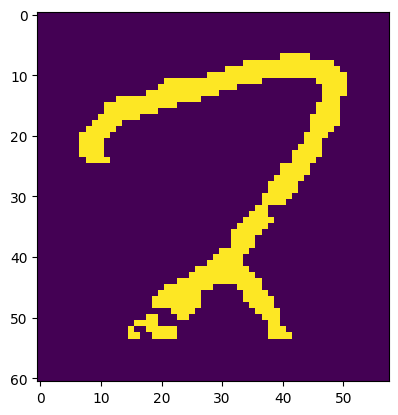

perimeter 241.2792180776596
1/1 [==============================] - 0s 64ms/step
symbol 2


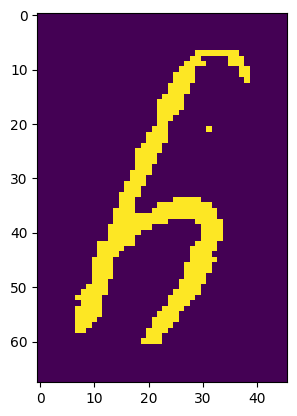

perimeter 235.03657710552216
1/1 [==============================] - 0s 47ms/step
symbol 26


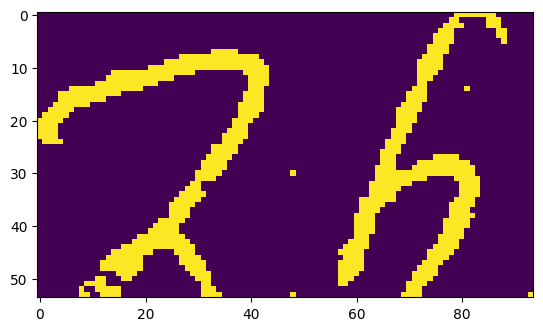

written_answer 26


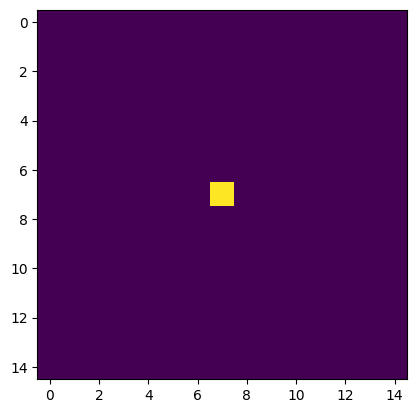

perimeter 0.0
here noise


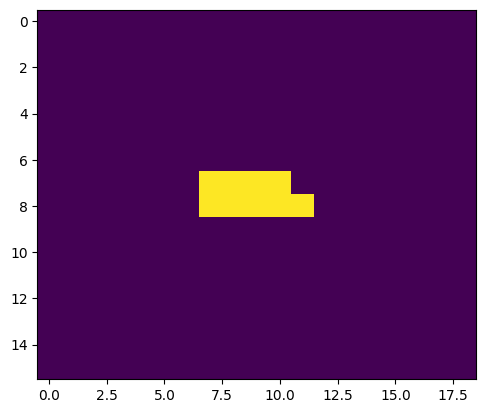

perimeter 9.41421353816986
here noise


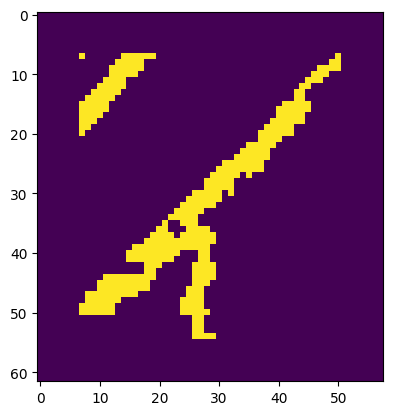

perimeter 189.4802290201187
1/1 [==============================] - 0s 34ms/step
symbol 1


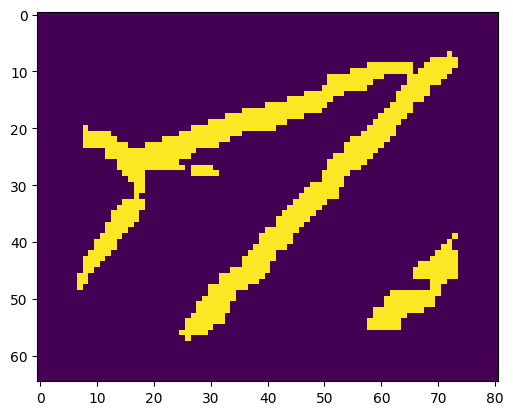

perimeter 339.4041085243225
here minus


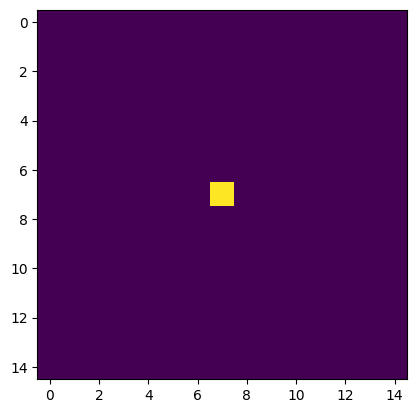

perimeter 0.0
here noise


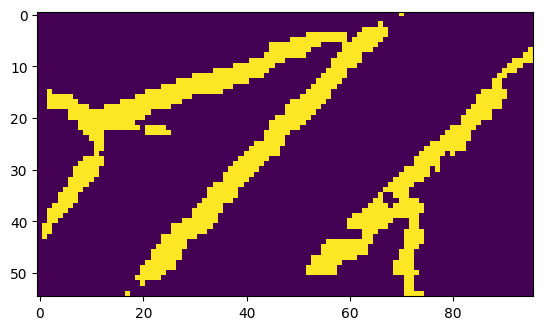

written_answer 0


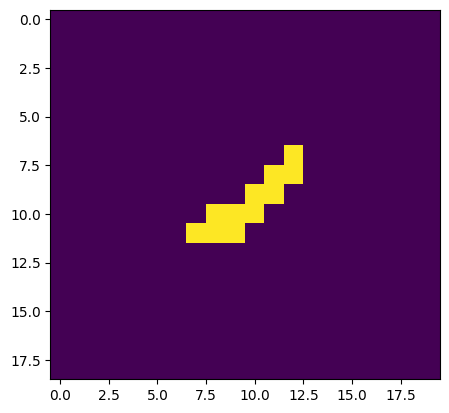

perimeter 13.899494528770447
here noise


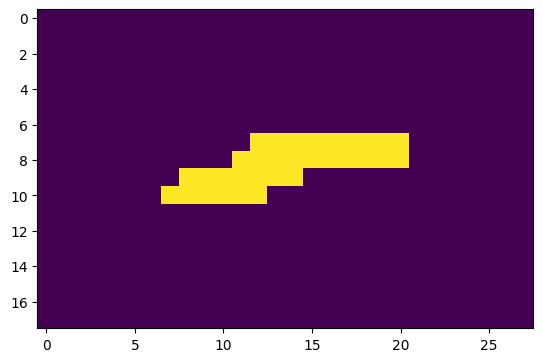

perimeter 29.071067690849304
here noise


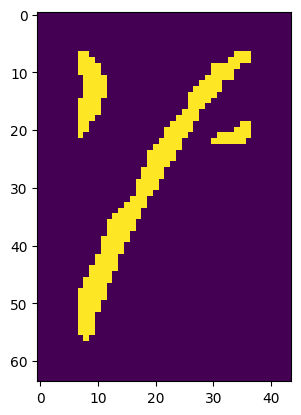

perimeter 125.53910398483276
1/1 [==============================] - 0s 41ms/step
symbol 0


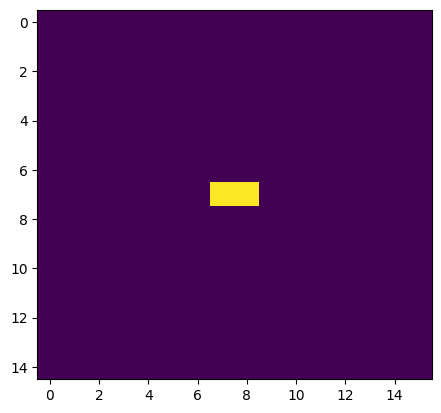

perimeter 2.0
here noise


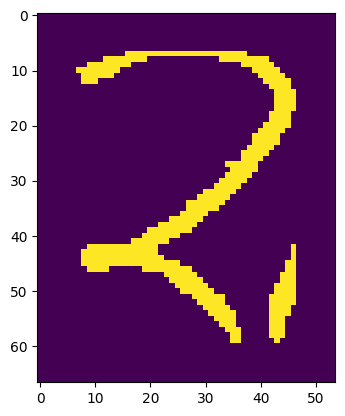

perimeter 242.6934324502945
1/1 [==============================] - 0s 42ms/step
symbol 02


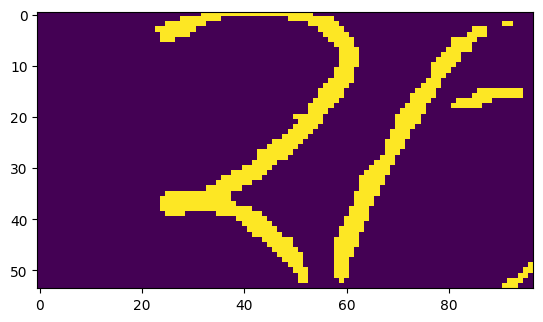

written_answer 2


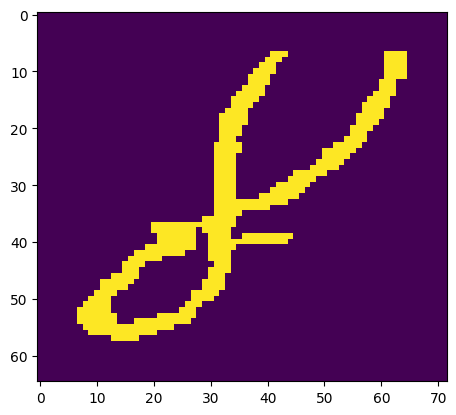

perimeter 259.2792179584503
here minus


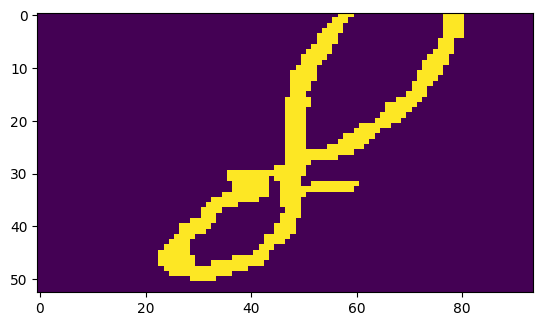

written_answer 0


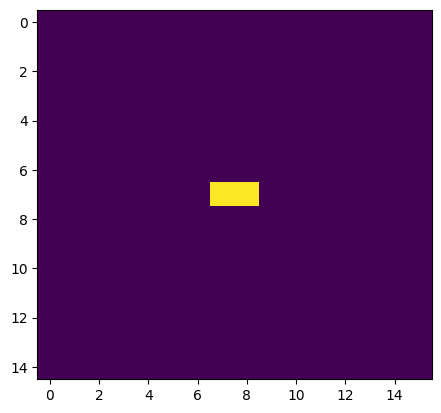

perimeter 2.0
here noise


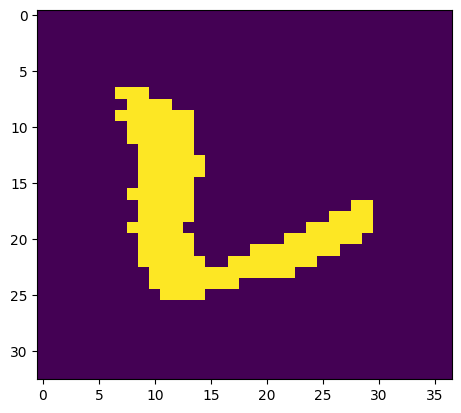

perimeter 84.42640614509583
here minus


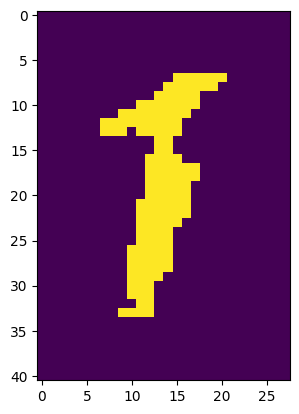

perimeter 81.35533833503723
1/1 [==============================] - 0s 46ms/step
symbol -7


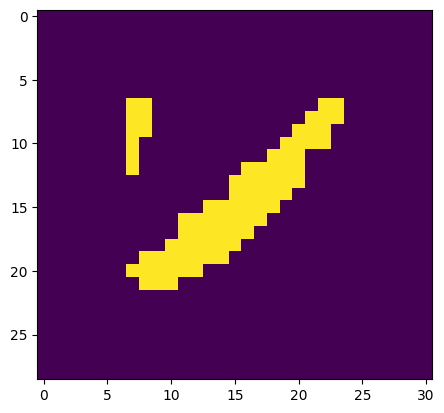

perimeter 47.11269772052765
here minus


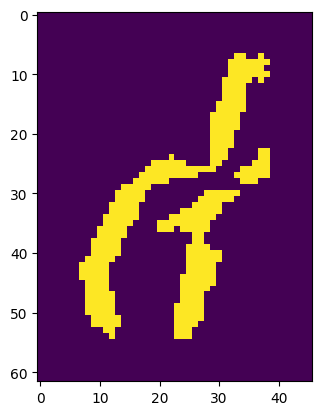

perimeter 140.71067690849304
1/1 [==============================] - 0s 67ms/step
symbol -7-4


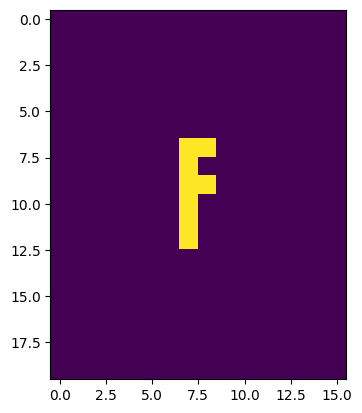

perimeter 12.242640614509583
here noise


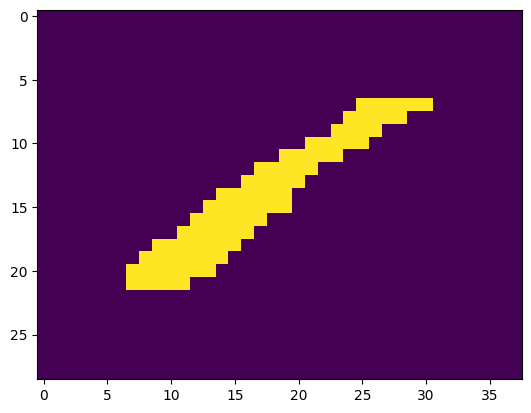

perimeter 58.76955187320709
here minus


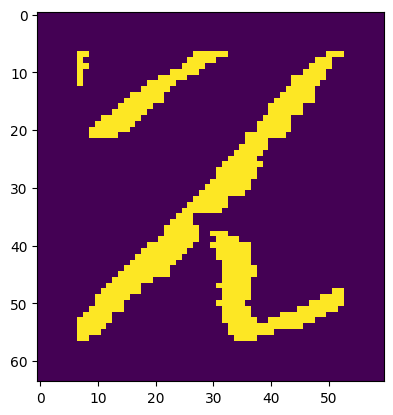

perimeter 150.99494886398315
1/1 [==============================] - 0s 69ms/step
symbol -7-4-1


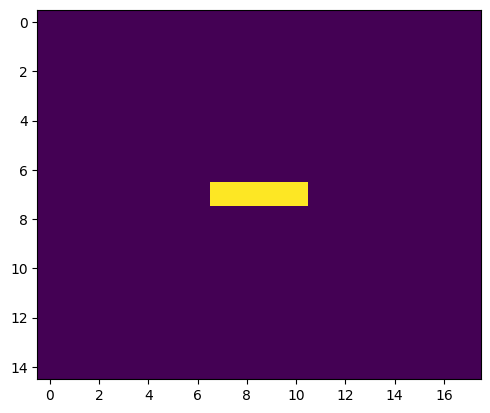

perimeter 6.0
here noise


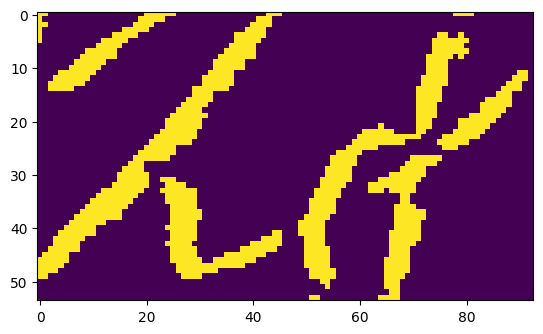

written_answer 0


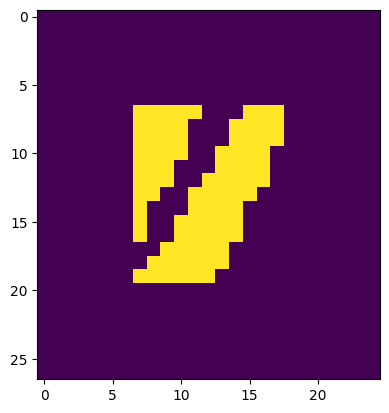

perimeter 36.3847758769989
1/1 [==============================] - 0s 60ms/step
symbol 4


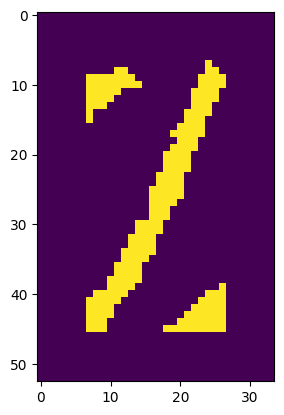

perimeter 94.91168737411499
1/1 [==============================] - 0s 56ms/step
symbol 41


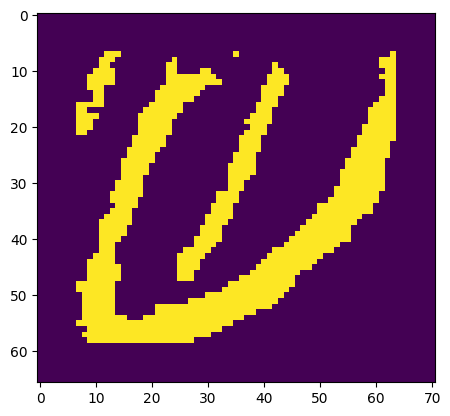

perimeter 298.4924212694168
here minus


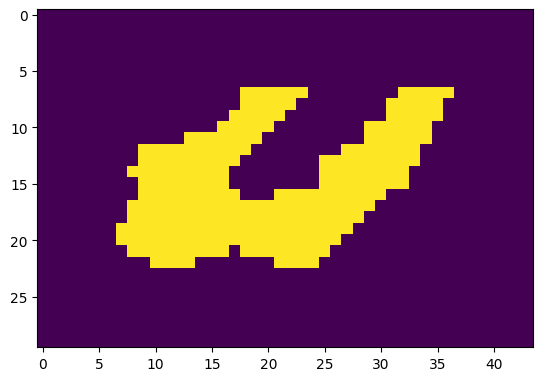

perimeter 104.56854212284088
here minus


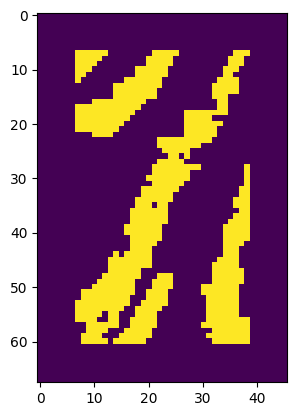

perimeter 162.02438509464264
1/1 [==============================] - 0s 149ms/step
symbol 41--2


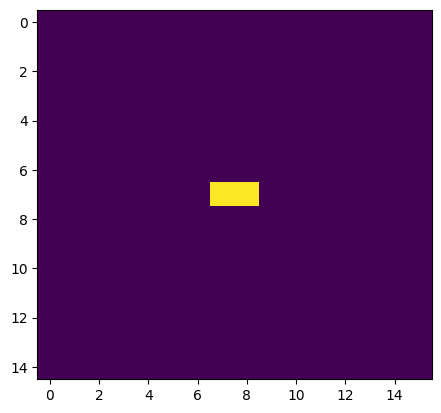

perimeter 2.0
here noise


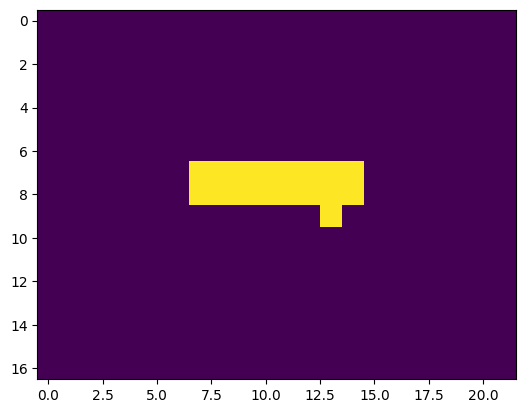

perimeter 16.82842707633972
here noise


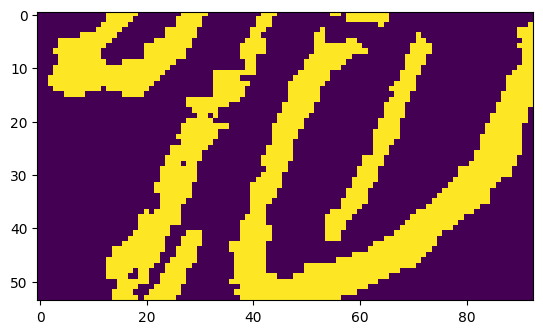

written_answer 0


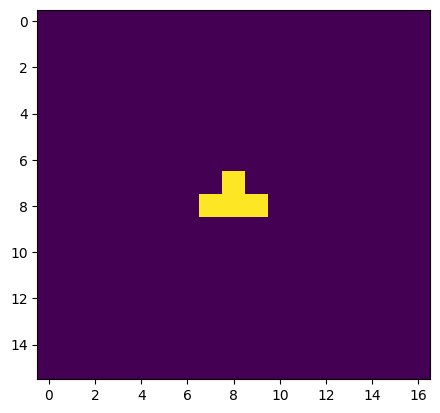

perimeter 4.828427076339722
here noise


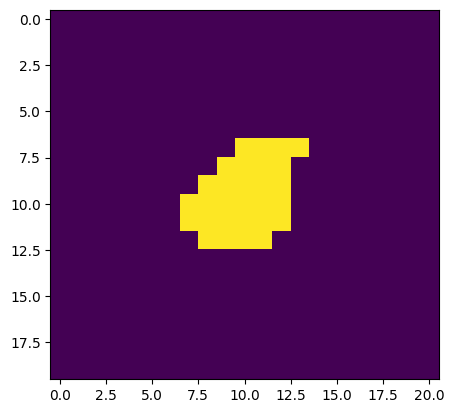

perimeter 18.485281109809875
here noise


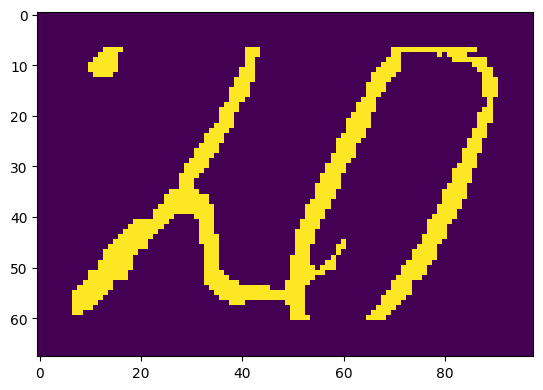

perimeter 513.8721437454224
here minus


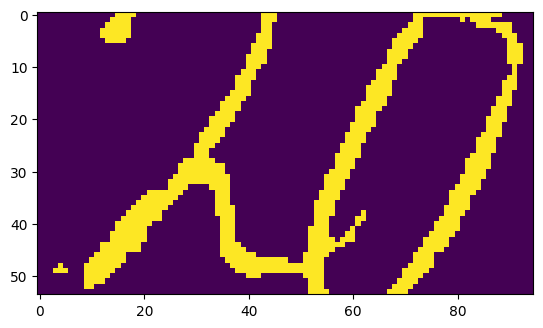

written_answer 0


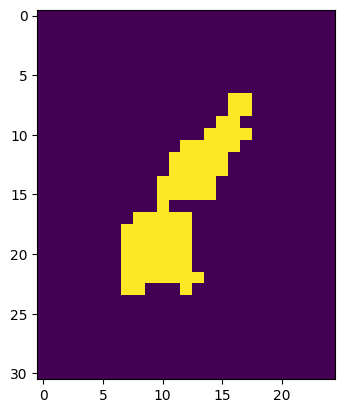

perimeter 51.455843567848206
1/1 [==============================] - 0s 29ms/step
symbol 1


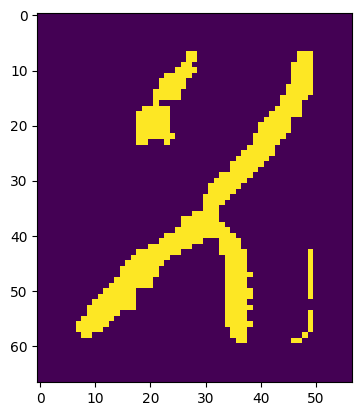

perimeter 194.55129623413086
1/1 [==============================] - 0s 29ms/step
symbol 12


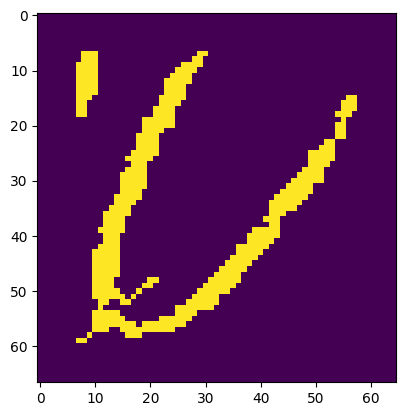

perimeter 293.94826555252075
1/1 [==============================] - 0s 36ms/step
symbol 120


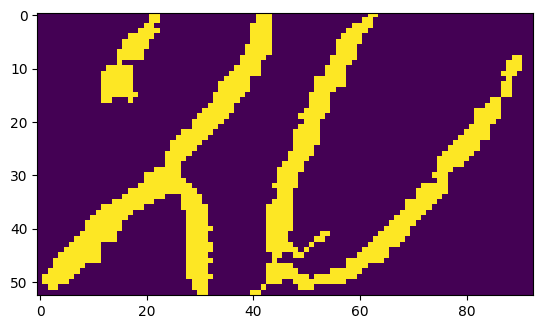

written_answer 120


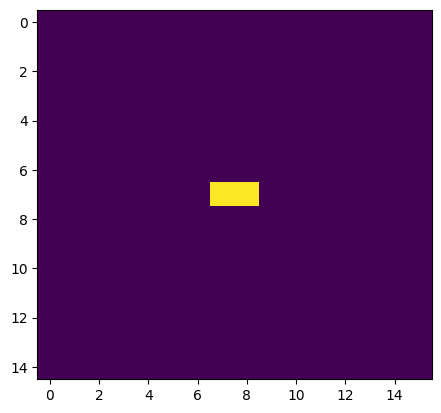

perimeter 2.0
here noise


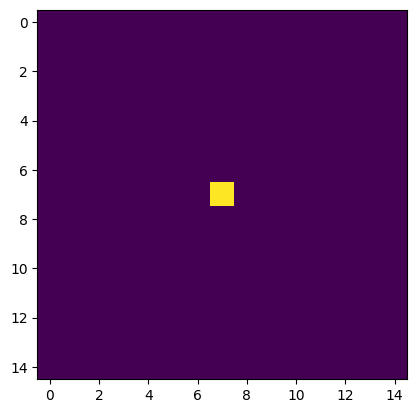

perimeter 0.0
here noise


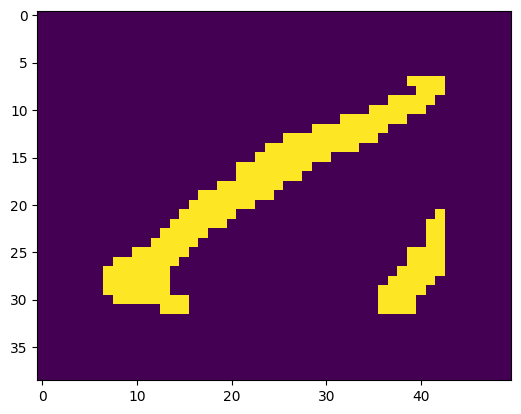

perimeter 99.982754945755
here minus


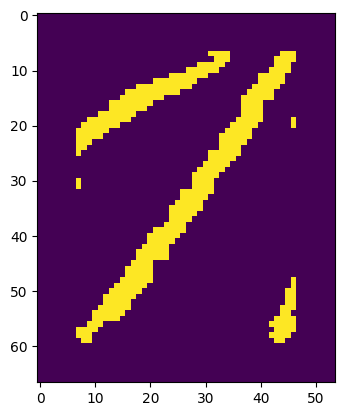

perimeter 143.9238795042038
1/1 [==============================] - 0s 34ms/step
symbol -1


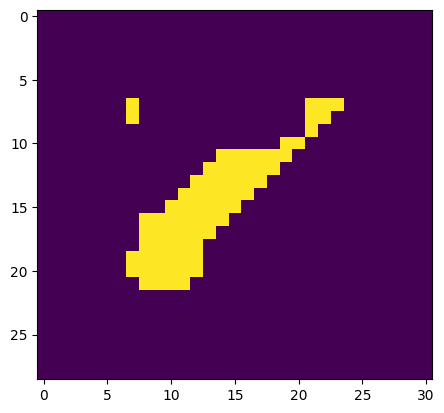

perimeter 47.69848430156708
here minus


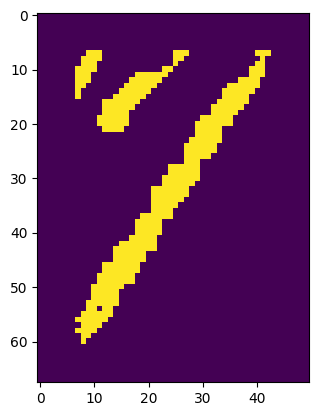

perimeter 146.02438509464264
1/1 [==============================] - 0s 34ms/step
symbol -1-1


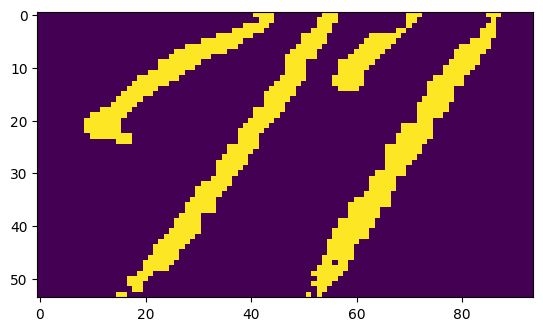

written_answer 0


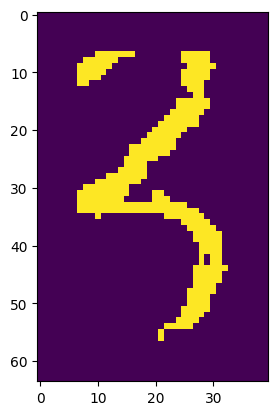

perimeter 171.09545290470123
1/1 [==============================] - 0s 34ms/step
symbol 3


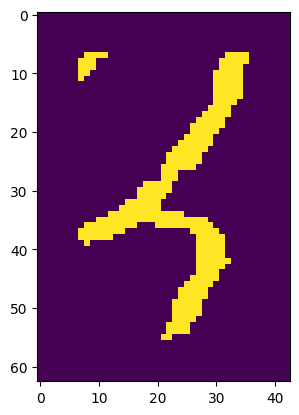

perimeter 160.85281205177307
1/1 [==============================] - 0s 37ms/step
symbol 33


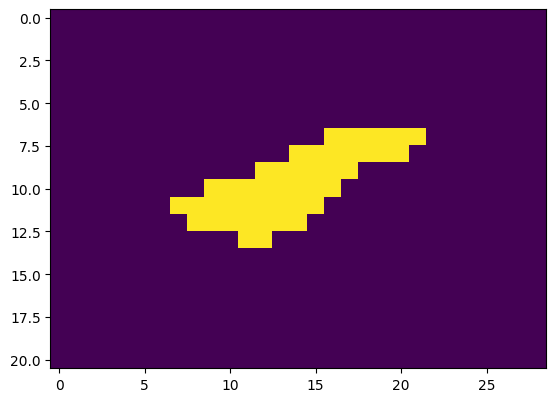

perimeter 32.97056245803833
here minus


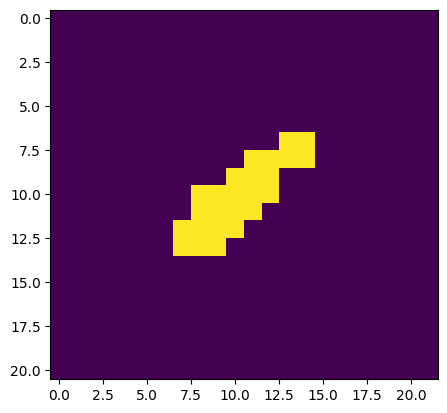

perimeter 21.313708186149597
here noise


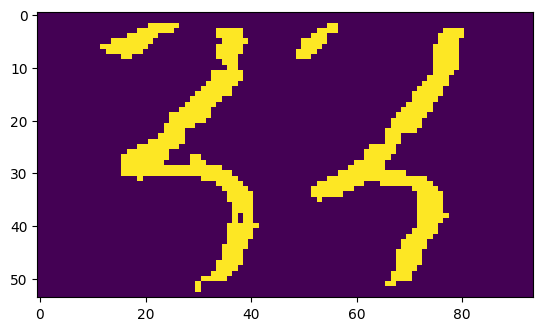

written_answer 0


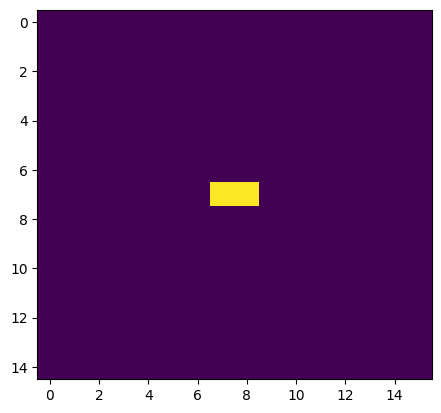

perimeter 2.0
here noise


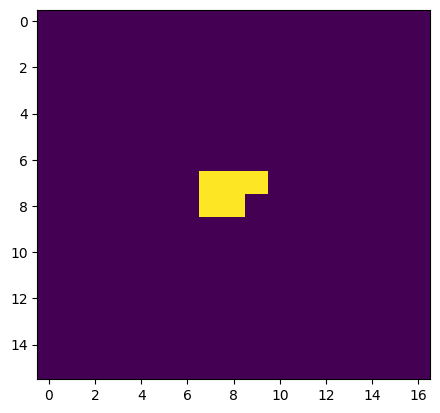

perimeter 5.414213538169861
here noise


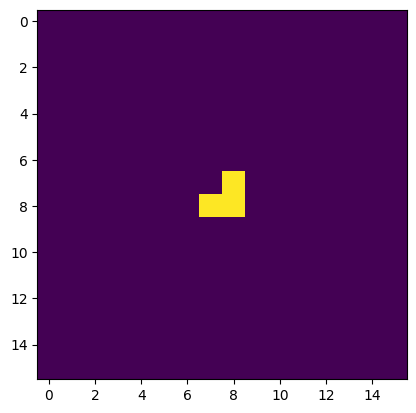

perimeter 3.414213538169861
here noise


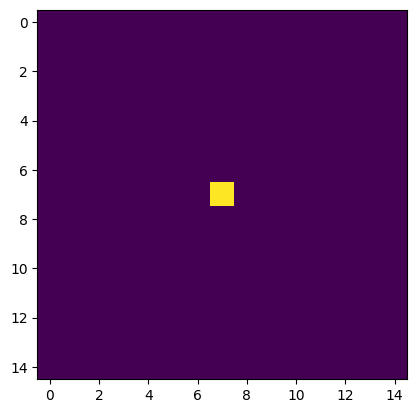

perimeter 0.0
here noise


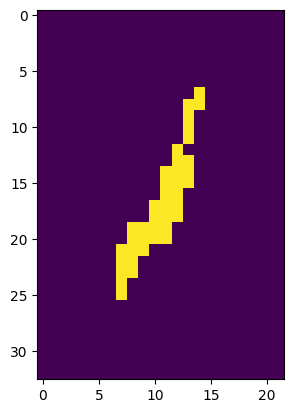

perimeter 43.79898953437805
1/1 [==============================] - 0s 61ms/step
symbol 1


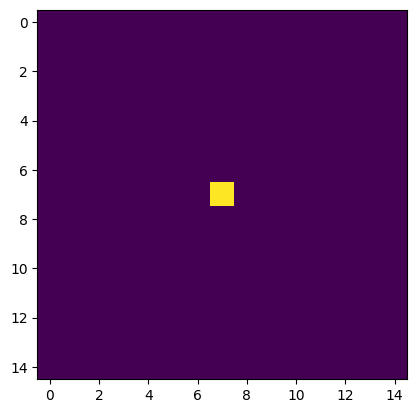

perimeter 0.0
here noise


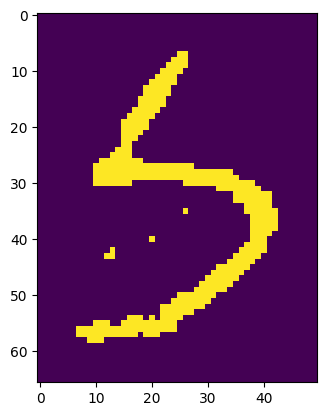

perimeter 212.30865573883057
1/1 [==============================] - 0s 47ms/step
symbol 15


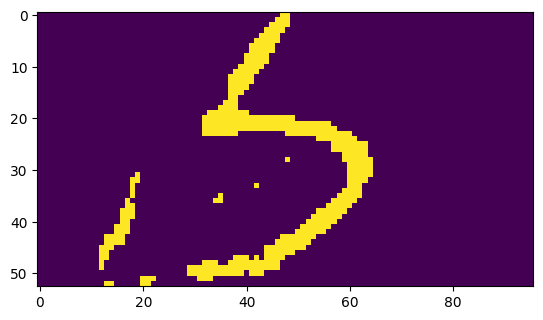

written_answer 15


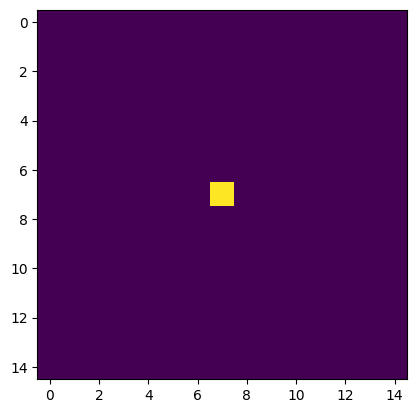

perimeter 0.0
here noise


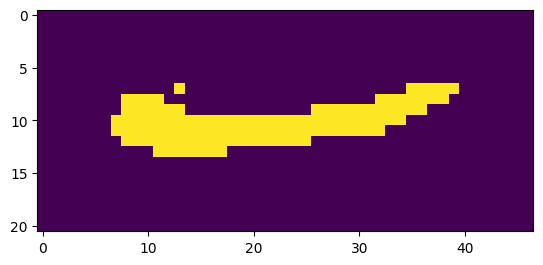

perimeter 71.79898953437805
here minus


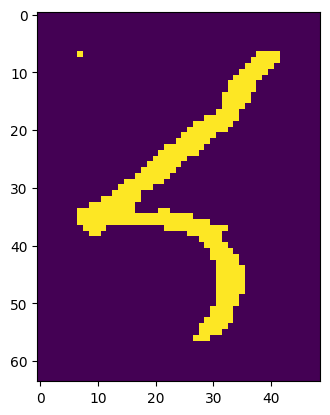

perimeter 176.65180146694183
1/1 [==============================] - 0s 41ms/step
symbol -5


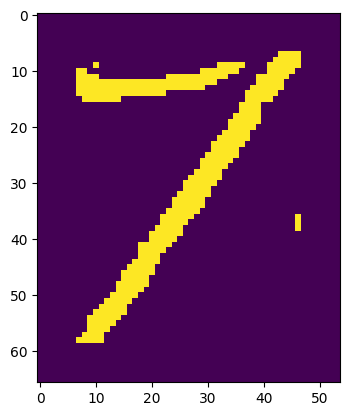

perimeter 140.16652011871338
1/1 [==============================] - 0s 45ms/step
symbol -51


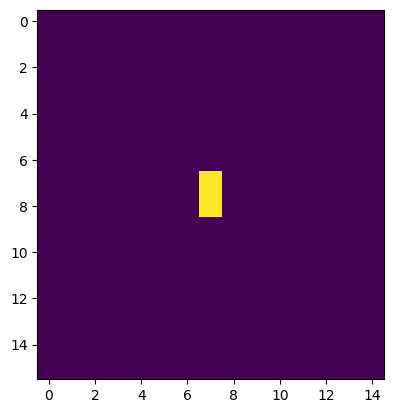

perimeter 2.0
here noise


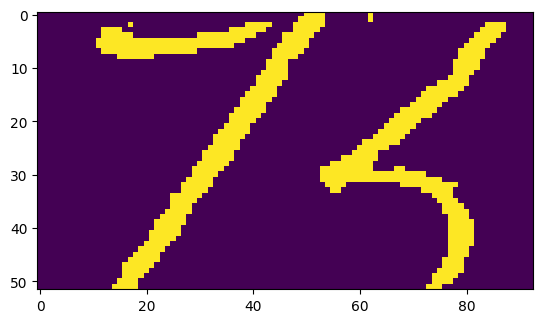

written_answer -51


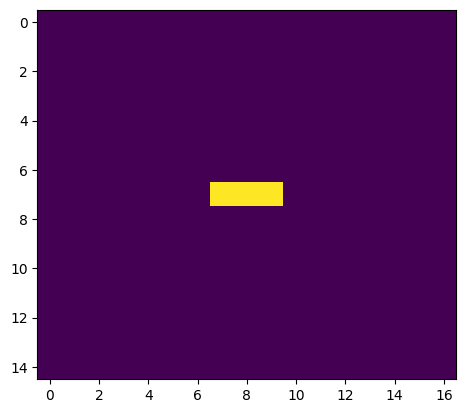

perimeter 4.0
here noise


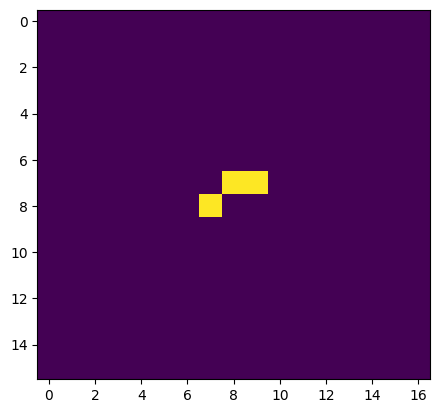

perimeter 4.828427076339722
here noise


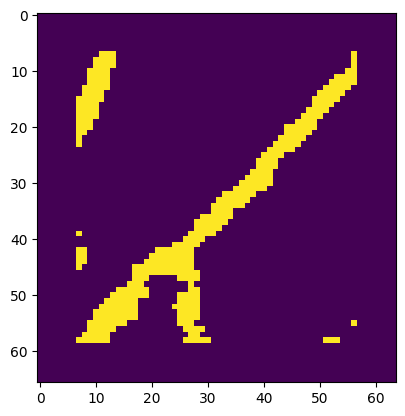

perimeter 195.0365778207779
1/1 [==============================] - 0s 44ms/step
symbol 1


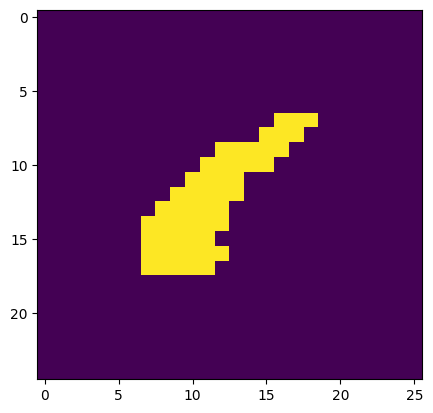

perimeter 35.21320307254791
here minus


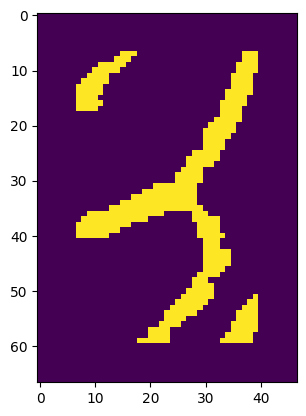

perimeter 181.09545266628265
1/1 [==============================] - 0s 47ms/step
symbol 1-1


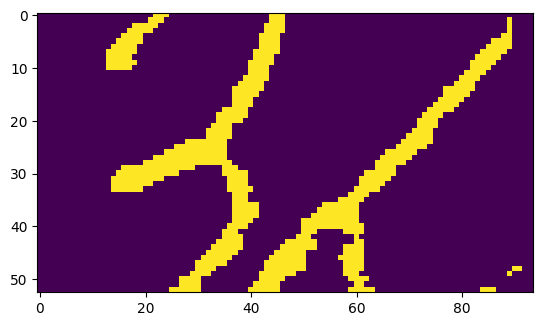

written_answer 0


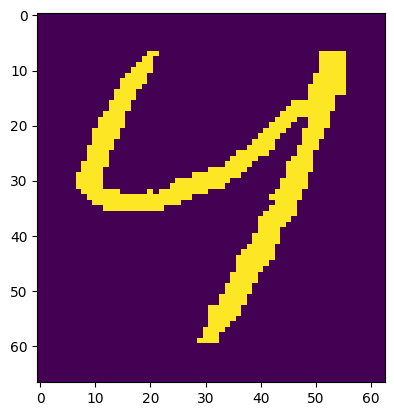

perimeter 284.97770285606384
1/1 [==============================] - 0s 45ms/step
symbol 4


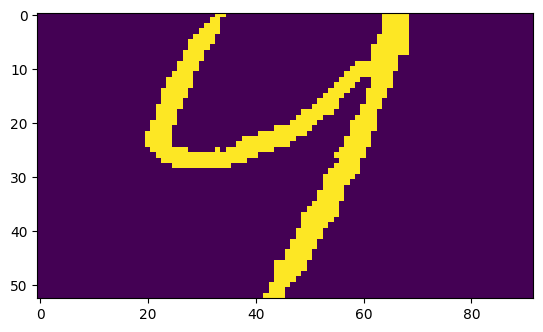

written_answer 4


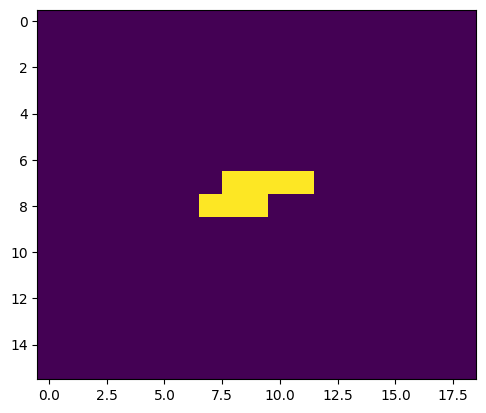

perimeter 8.828427076339722
here noise


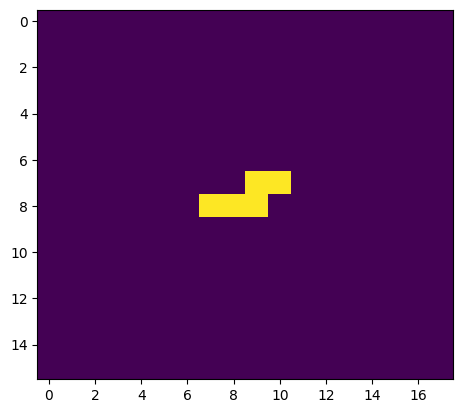

perimeter 6.828427076339722
here noise


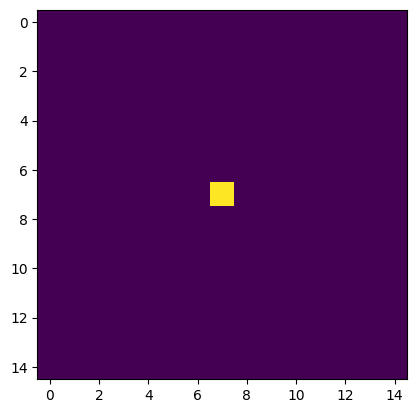

perimeter 0.0
here noise


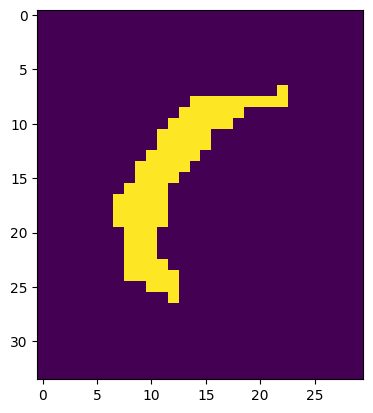

perimeter 59.69848418235779
1/1 [==============================] - 0s 38ms/step
symbol 0


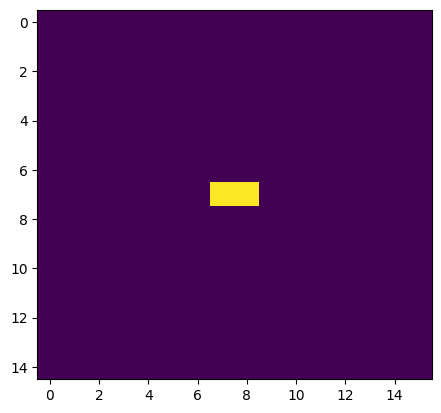

perimeter 2.0
here noise


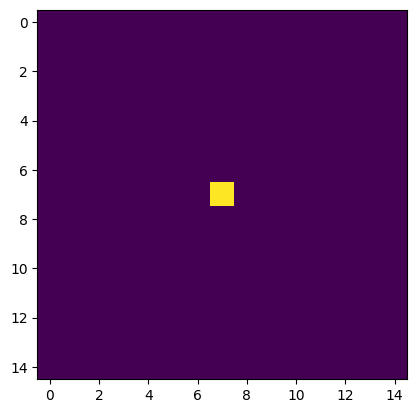

perimeter 0.0
here noise


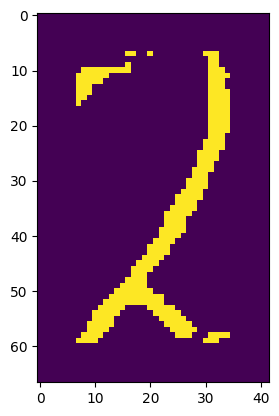

perimeter 154.50966608524323
1/1 [==============================] - 0s 34ms/step
symbol 02


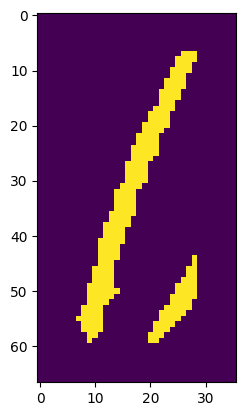

perimeter 123.39696848392487
1/1 [==============================] - 0s 34ms/step
symbol 021


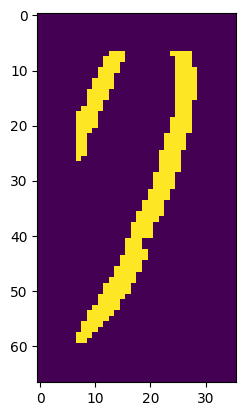

perimeter 125.98275482654572
1/1 [==============================] - 0s 38ms/step
symbol 0217


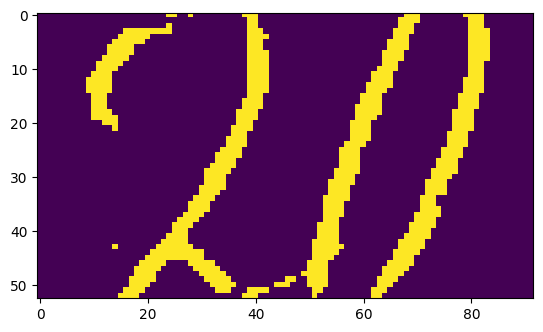

written_answer 217


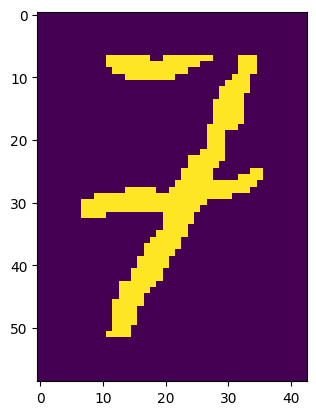

perimeter 155.29646277427673
1/1 [==============================] - 0s 40ms/step
symbol 1


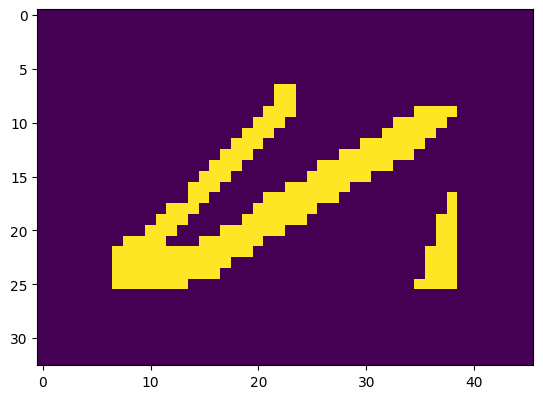

perimeter 115.78174388408661
here minus


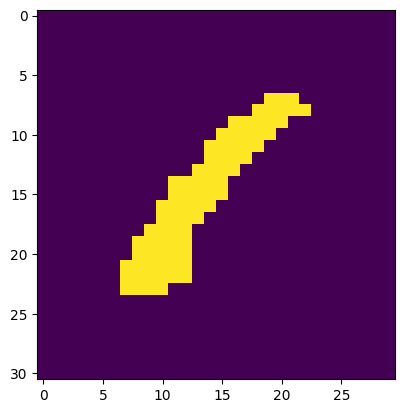

perimeter 49.69848394393921
1/1 [==============================] - 0s 33ms/step
symbol 1-0


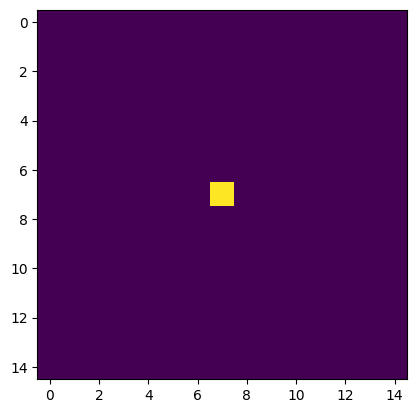

perimeter 0.0
here noise


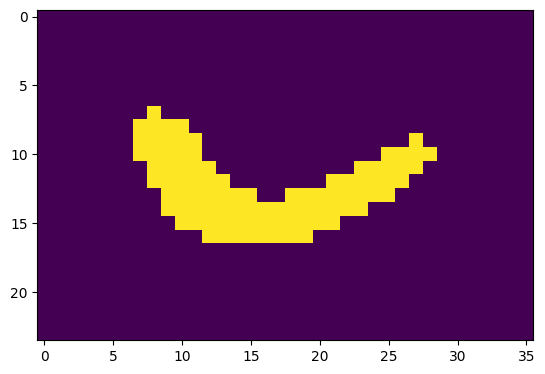

perimeter 56.52691113948822
here minus


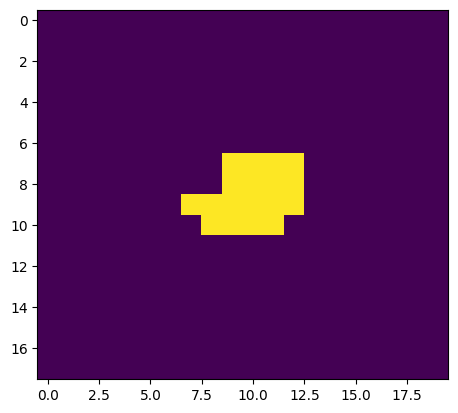

perimeter 14.242640614509583
here noise


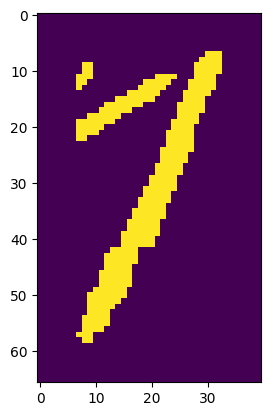

perimeter 126.81118202209473
1/1 [==============================] - 0s 48ms/step
symbol 1-0-1


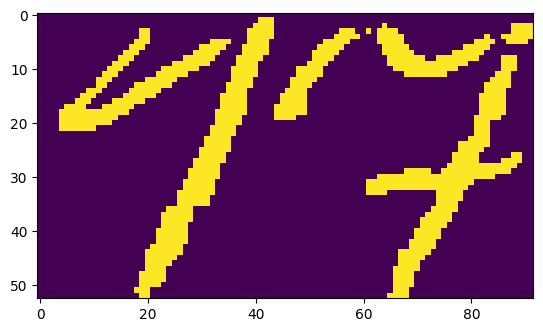

written_answer 0


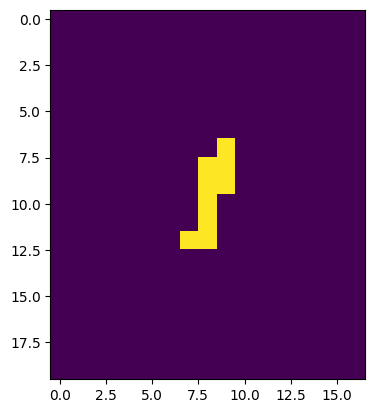

perimeter 12.242640614509583
here noise


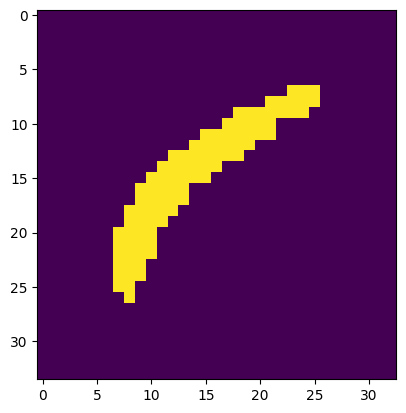

perimeter 59.94112467765808
1/1 [==============================] - 0s 33ms/step
symbol 0


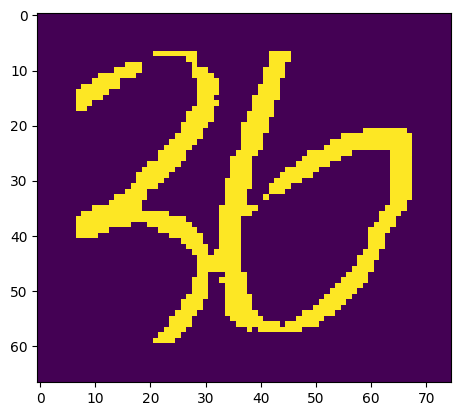

perimeter 454.51680624485016
here minus


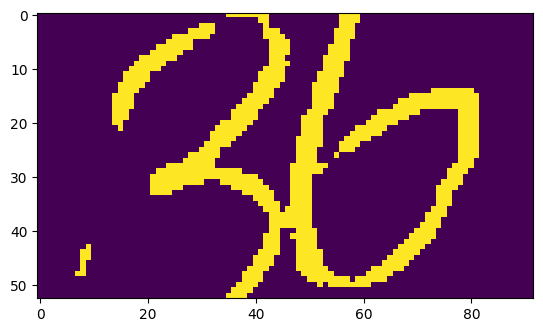

written_answer 0


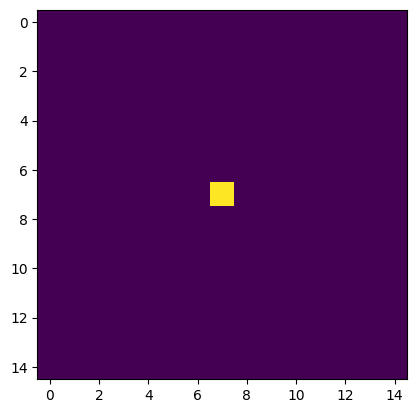

perimeter 0.0
here noise


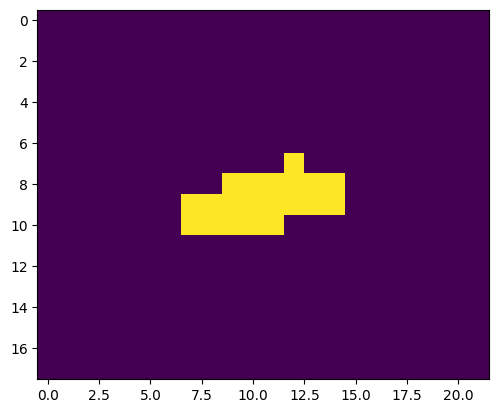

perimeter 17.656854152679443
here noise


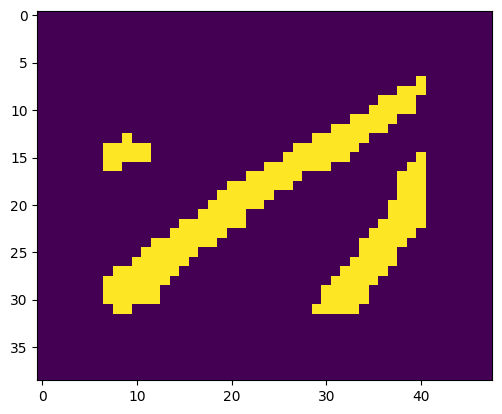

perimeter 89.39696848392487
here minus


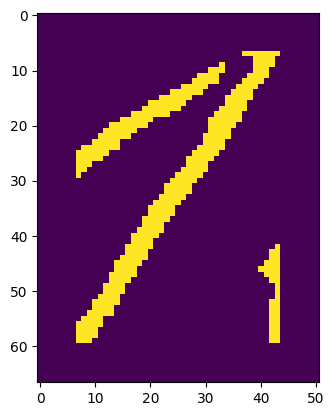

perimeter 141.3380926847458
1/1 [==============================] - 0s 35ms/step
symbol -2


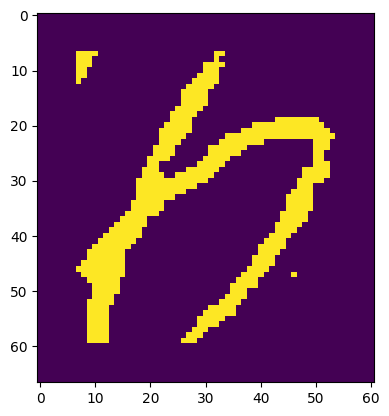

perimeter 297.9482640028
1/1 [==============================] - 0s 37ms/step
symbol -20


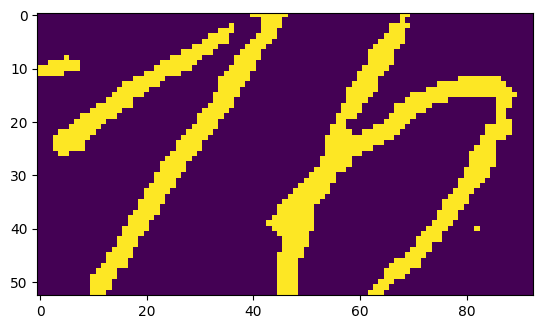

written_answer -20


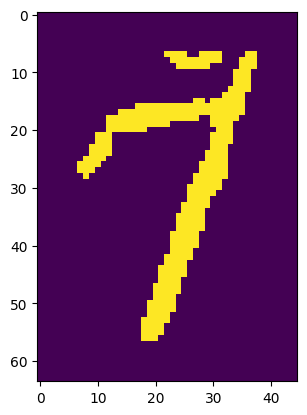

perimeter 175.78174448013306
1/1 [==============================] - 0s 37ms/step
symbol 7


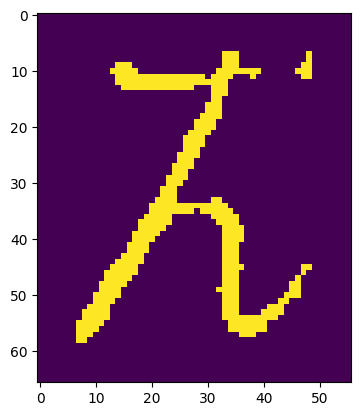

perimeter 274.5929261445999
1/1 [==============================] - 0s 32ms/step
symbol 72


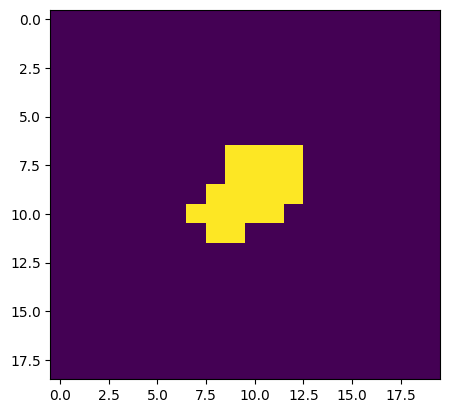

perimeter 15.071067690849304
here noise


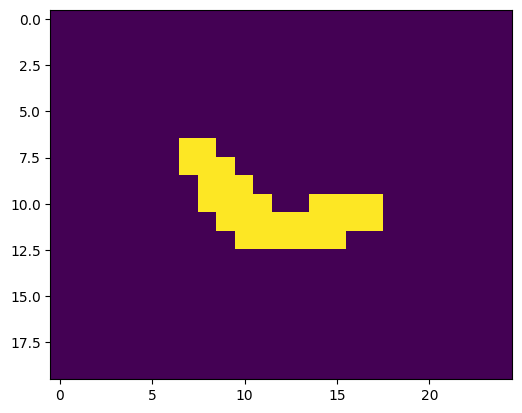

perimeter 26.727921843528748
here noise


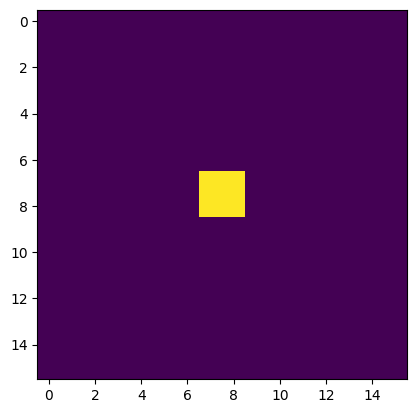

perimeter 4.0
here noise


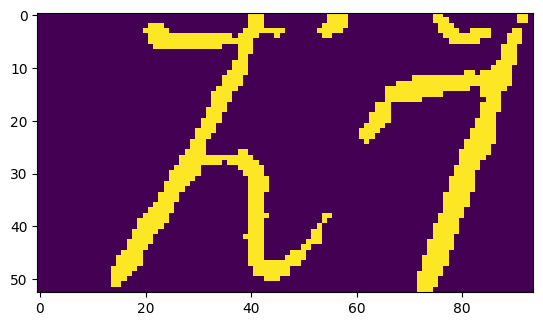

written_answer 72


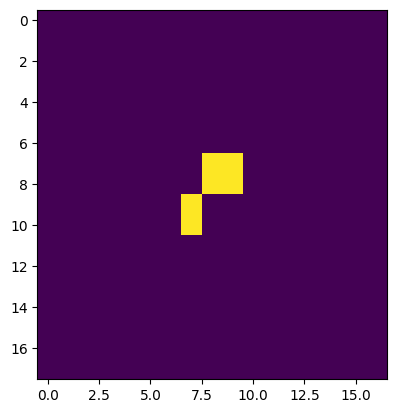

perimeter 8.828427076339722
here noise


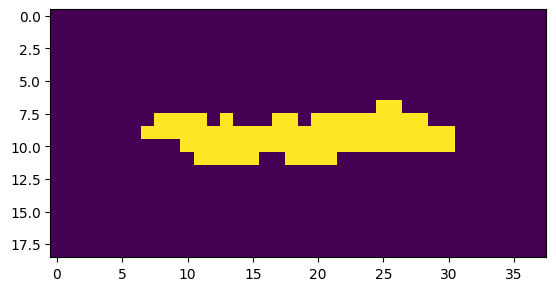

perimeter 53.21320307254791
here minus


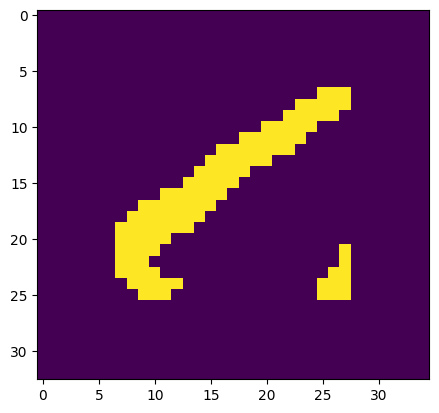

perimeter 63.84061920642853
here minus


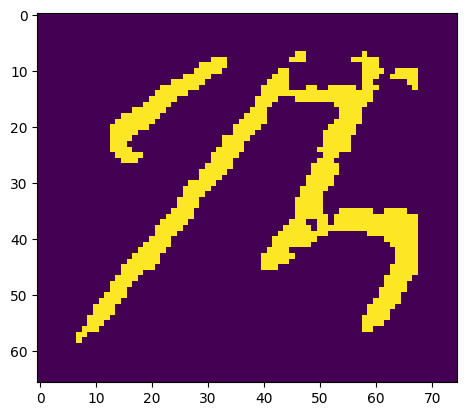

perimeter 330.81832122802734
here minus


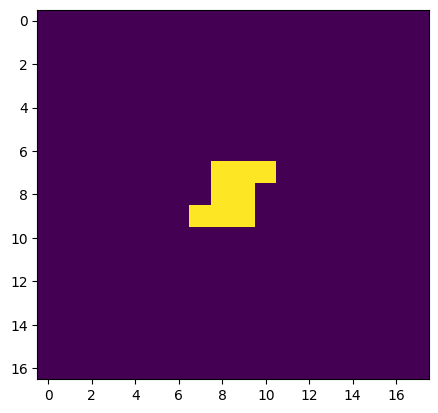

perimeter 8.828427076339722
here noise


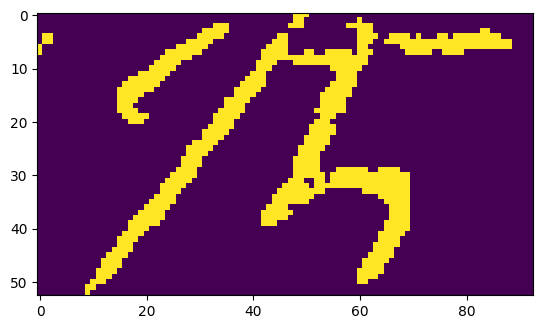

written_answer 0


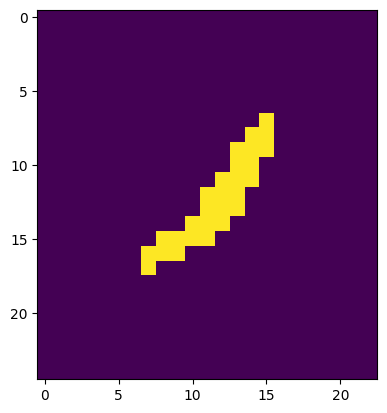

perimeter 28.38477599620819
here noise


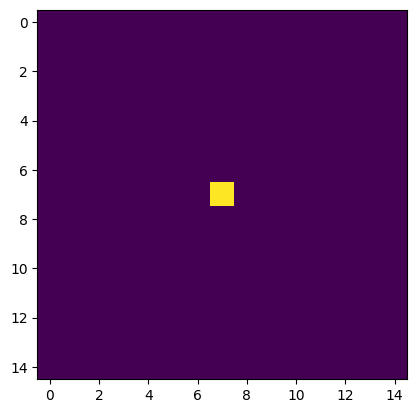

perimeter 0.0
here noise


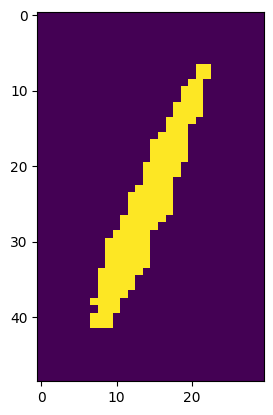

perimeter 83.01219248771667
1/1 [==============================] - 0s 52ms/step
symbol 1


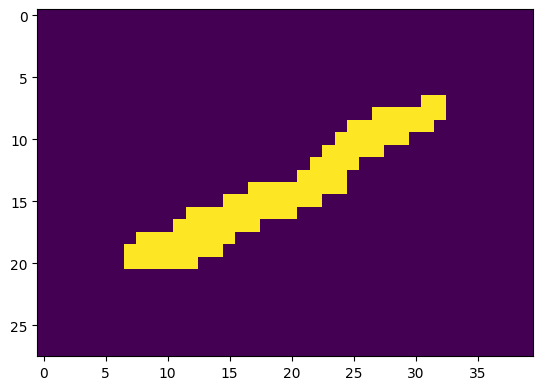

perimeter 62.52691149711609
here minus


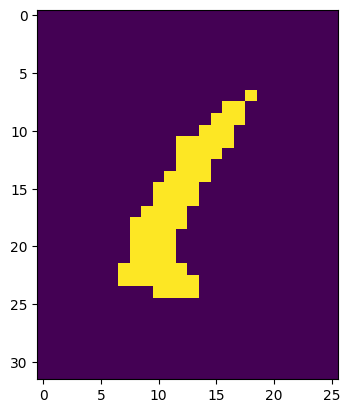

perimeter 48.870057106018066
1/1 [==============================] - 0s 44ms/step
symbol 1-1


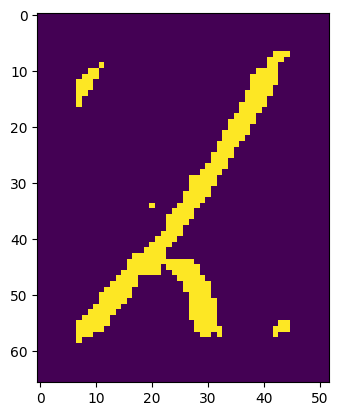

perimeter 177.72286915779114
1/1 [==============================] - 0s 46ms/step
symbol 1-11


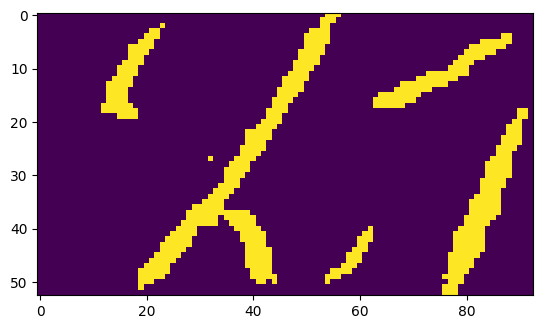

written_answer 0


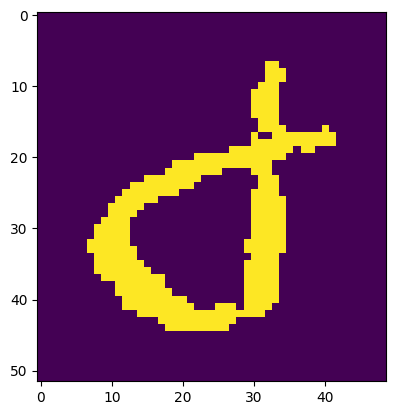

perimeter 129.982754945755
1/1 [==============================] - 0s 50ms/step
symbol 0


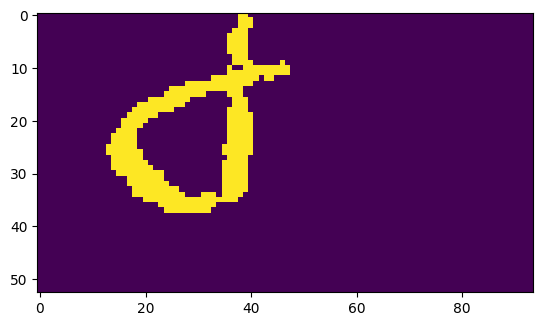

written_answer 0


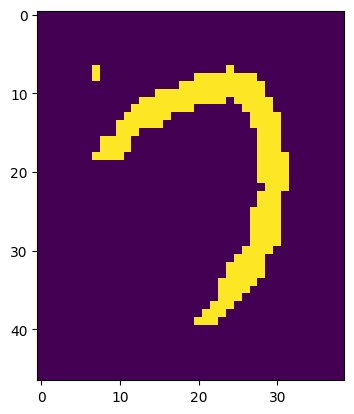

perimeter 120.22539496421814
1/1 [==============================] - 0s 60ms/step
symbol 2


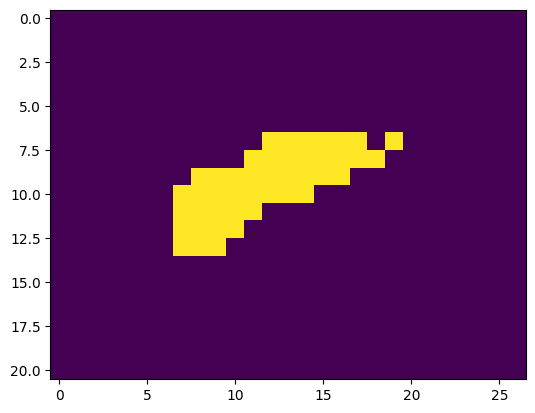

perimeter 31.55634880065918
here minus


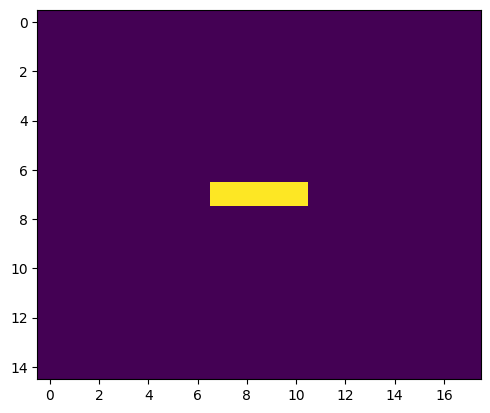

perimeter 6.0
here noise


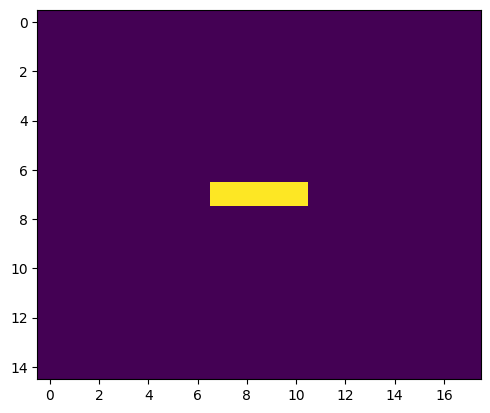

perimeter 6.0
here noise


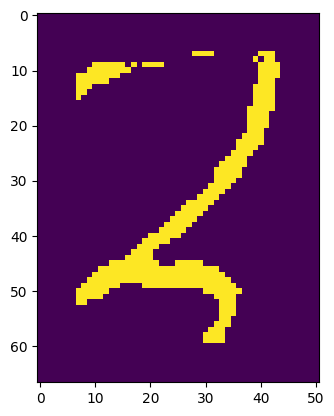

perimeter 182.65180134773254
1/1 [==============================] - 0s 43ms/step
symbol 2-2


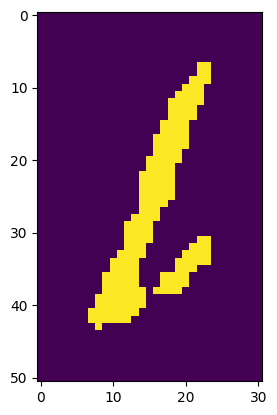

perimeter 88.42640614509583
1/1 [==============================] - 0s 45ms/step
symbol 2-21


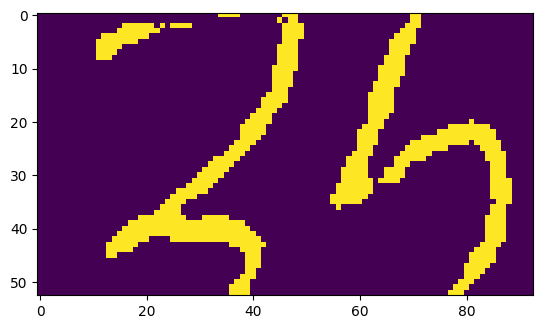

written_answer 0
[]
[]
[]
[]
[]


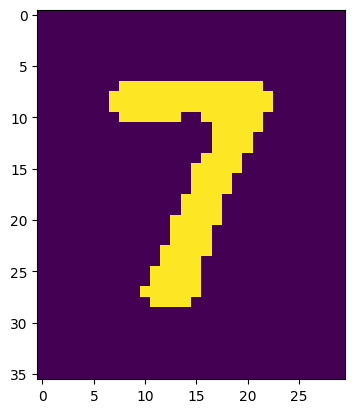

perimeter 75.11269783973694
1/1 [==============================] - 0s 38ms/step
symbol 7


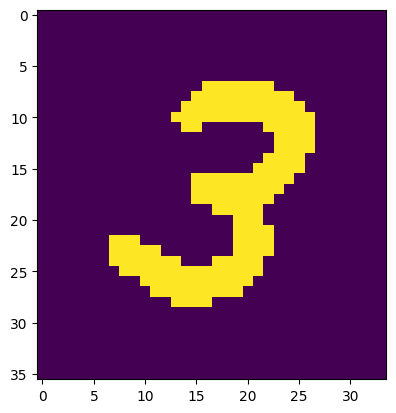

perimeter 98.08326005935669
1/1 [==============================] - 0s 35ms/step
symbol 73


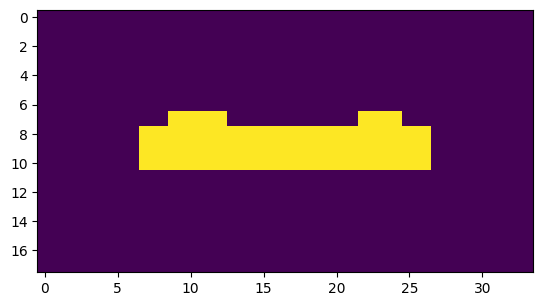

perimeter 43.65685415267944
here minus


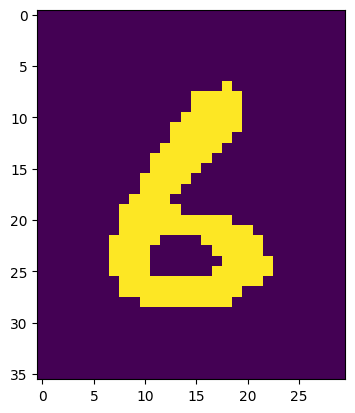

perimeter 70.18376588821411
1/1 [==============================] - 0s 46ms/step
symbol -6


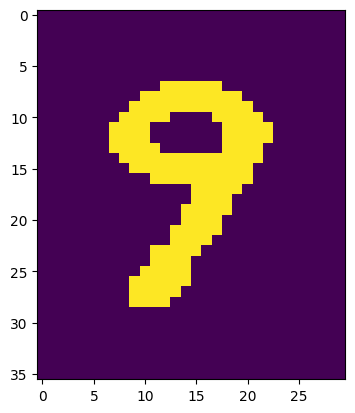

perimeter 68.18376517295837
1/1 [==============================] - 0s 37ms/step
symbol 8


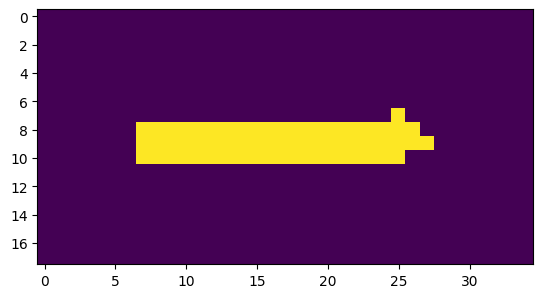

perimeter 43.65685415267944
here minus


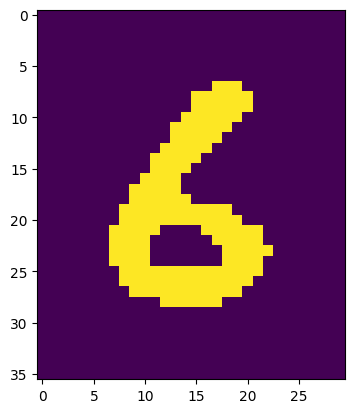

perimeter 69.01219296455383
1/1 [==============================] - 0s 39ms/step
symbol -6


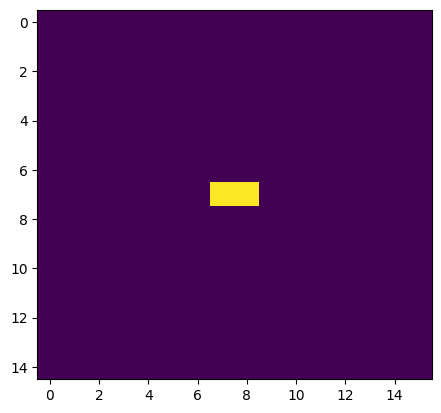

perimeter 2.0
here noise


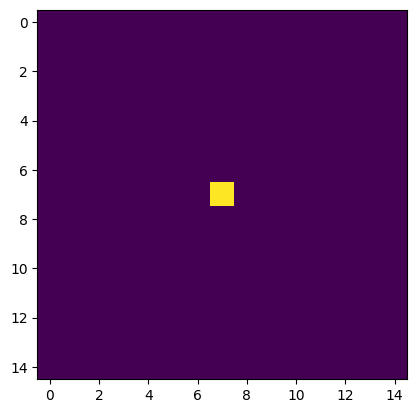

perimeter 0.0
here noise


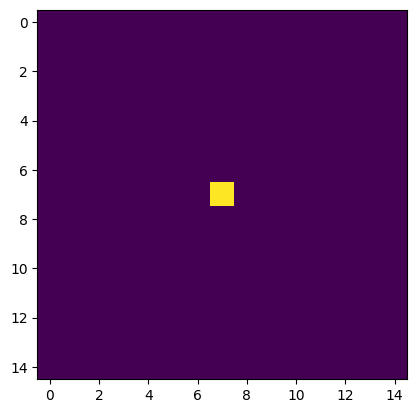

perimeter 0.0
here noise


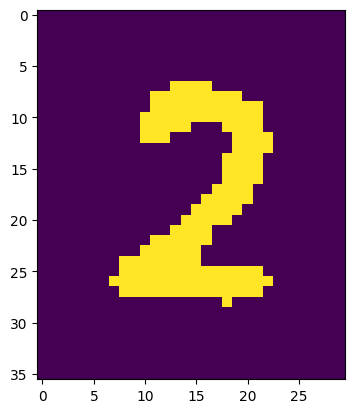

perimeter 89.8406194448471
1/1 [==============================] - 0s 34ms/step
symbol 2


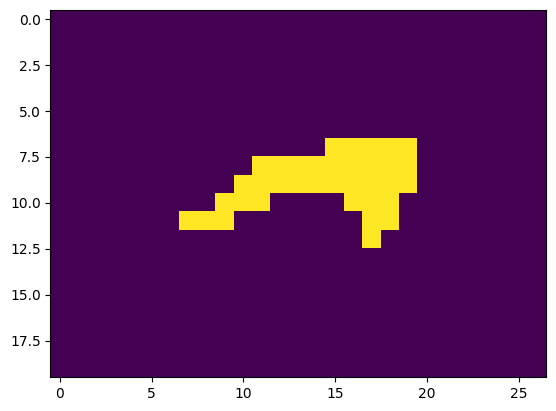

perimeter 32.14213526248932
here minus


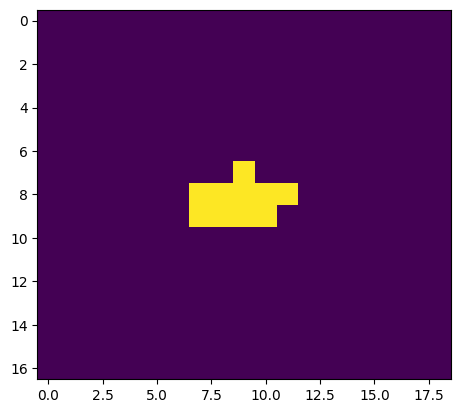

perimeter 10.242640614509583
here noise


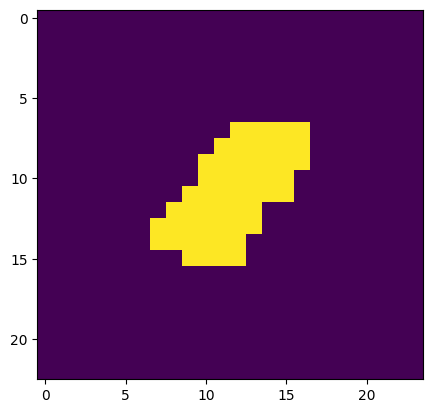

perimeter 28.727921724319458
here noise
[73, -6, 8, -6, 0, 0, 2, 0]


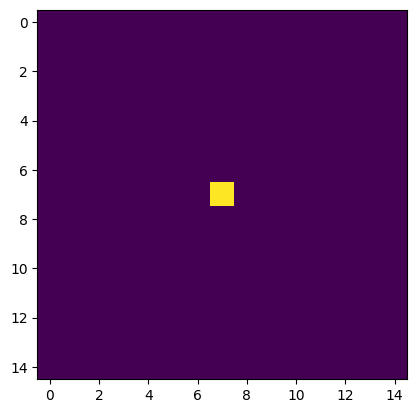

perimeter 0.0
here noise


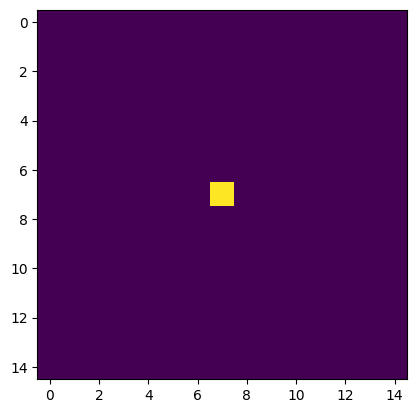

perimeter 0.0
here noise


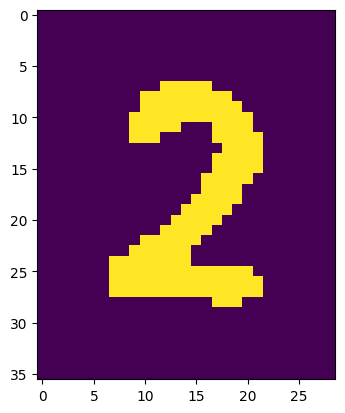

perimeter 88.4264063835144
1/1 [==============================] - 0s 34ms/step
symbol 2


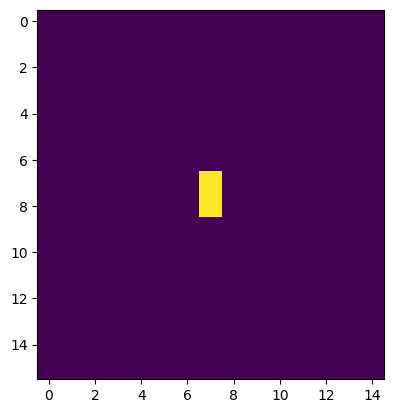

perimeter 2.0
here noise


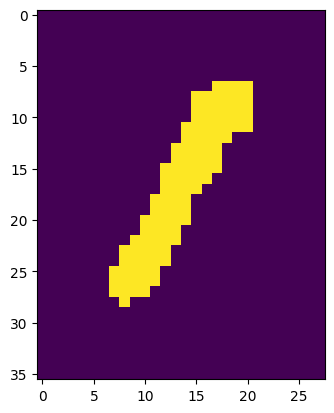

perimeter 56.28427064418793
1/1 [==============================] - 0s 33ms/step
symbol 1


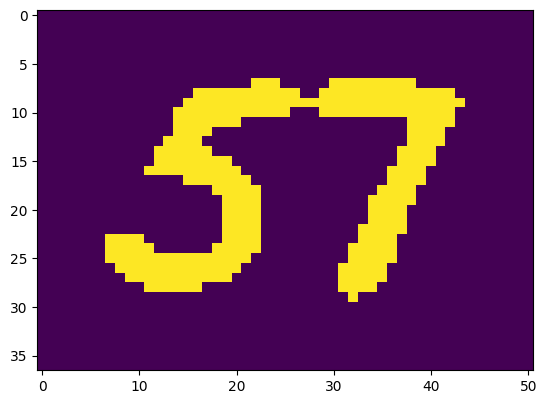

perimeter 171.78174436092377
here minus


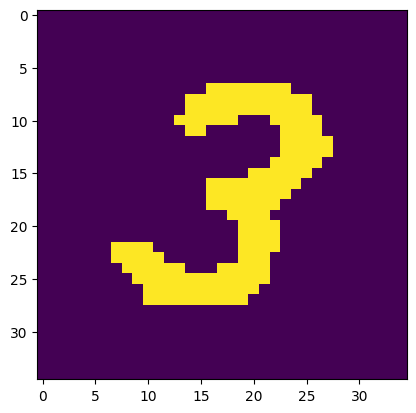

perimeter 98.66904640197754
1/1 [==============================] - 0s 32ms/step
symbol 3


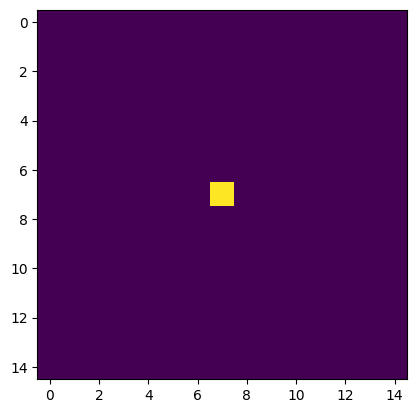

perimeter 0.0
here noise


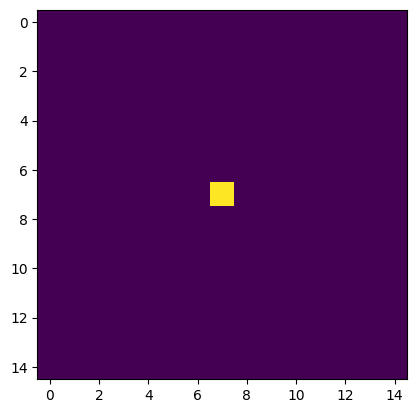

perimeter 0.0
here noise


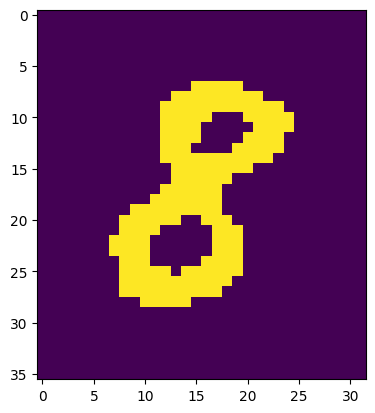

perimeter 68.52691125869751
1/1 [==============================] - 0s 35ms/step
symbol 8


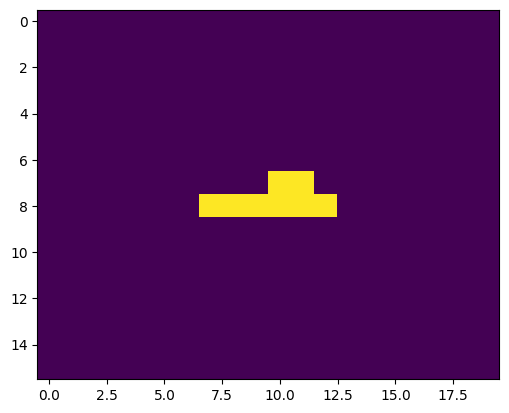

perimeter 10.828427076339722
here noise
[0, 0, 2, 1, 0, 3, 0, 8, 0]
[]
[]


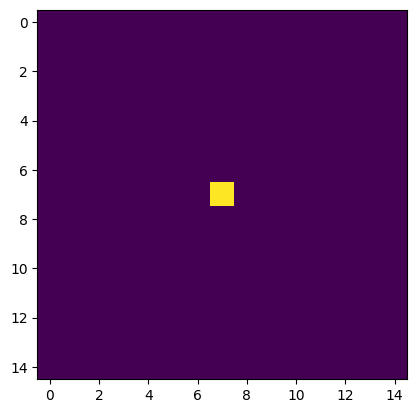

perimeter 0.0
here noise


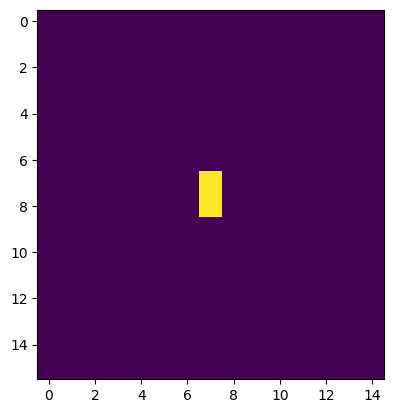

perimeter 2.0
here noise


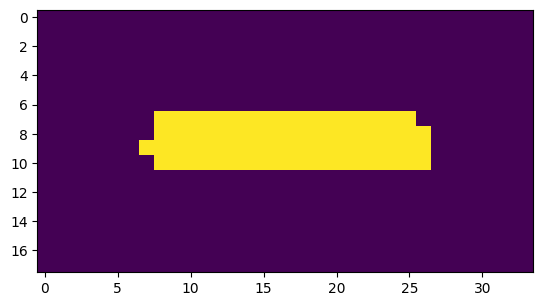

perimeter 42.24264061450958
here minus


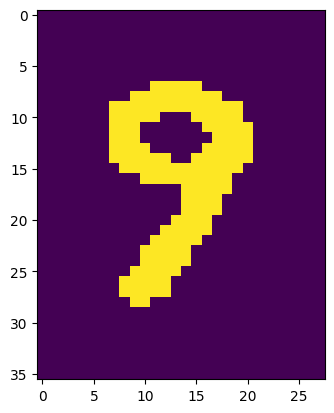

perimeter 65.94112491607666
1/1 [==============================] - 0s 39ms/step
symbol -7


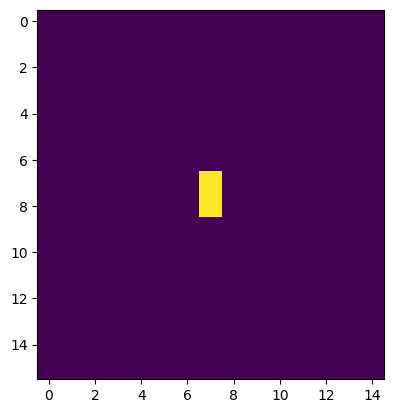

perimeter 2.0
here noise


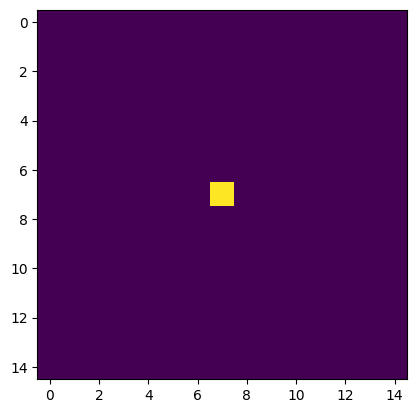

perimeter 0.0
here noise


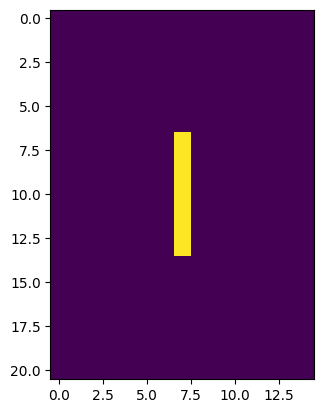

perimeter 12.0
here noise


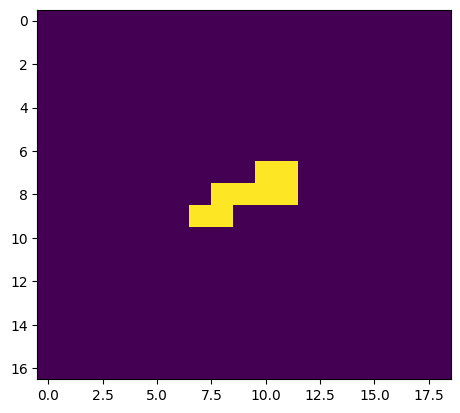

perimeter 10.242640614509583
here noise


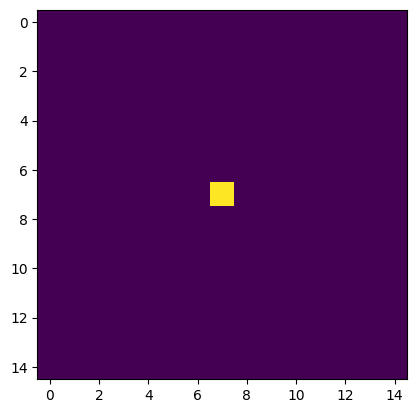

perimeter 0.0
here noise


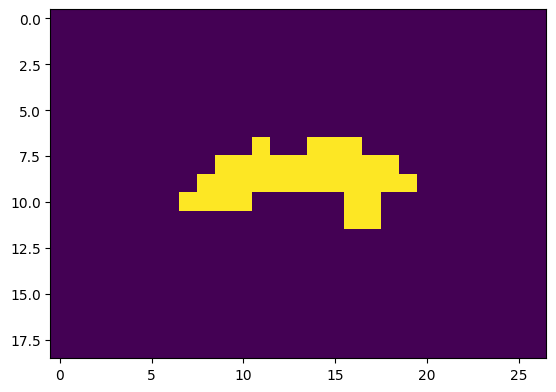

perimeter 30.14213538169861
here minus


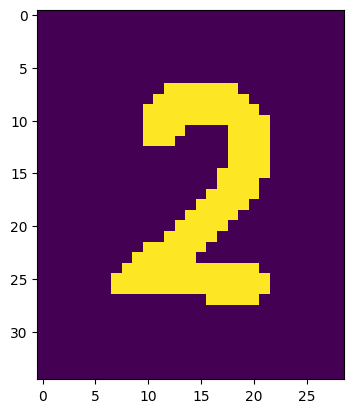

perimeter 85.01219189167023
1/1 [==============================] - 0s 37ms/step
symbol -2


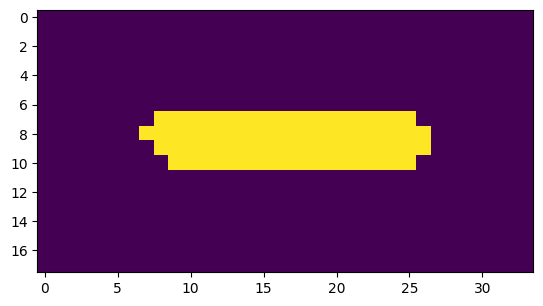

perimeter 41.071067690849304
here minus


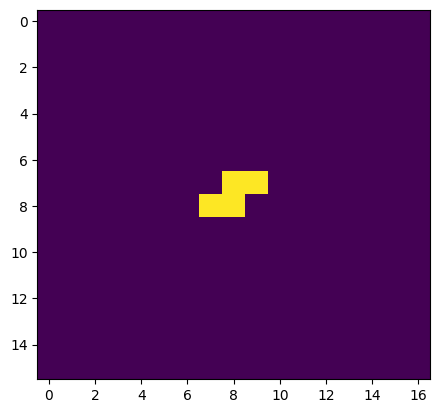

perimeter 4.828427076339722
here noise


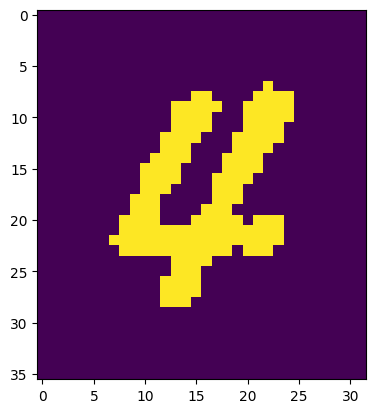

perimeter 105.39696848392487
1/1 [==============================] - 0s 40ms/step
symbol -2-4


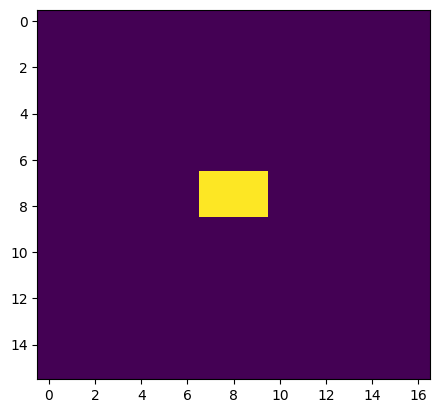

perimeter 6.0
here noise


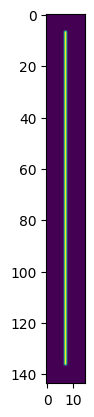

perimeter 258.0
1/1 [==============================] - 0s 38ms/step
symbol -2-41


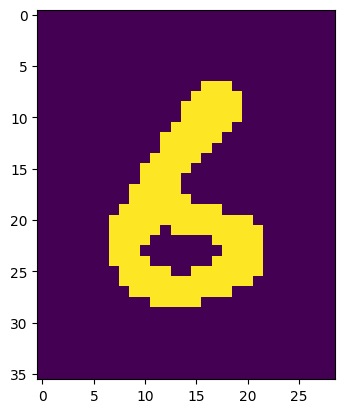

perimeter 66.7695517539978
1/1 [==============================] - 0s 102ms/step
symbol -2-416
[0, 0, -7, 0, 0, 0, 0]


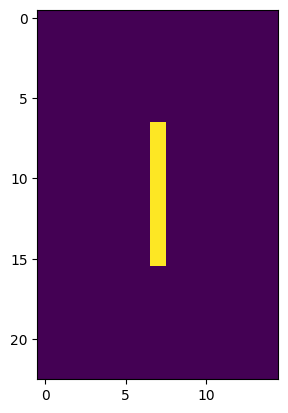

perimeter 16.0
here noise


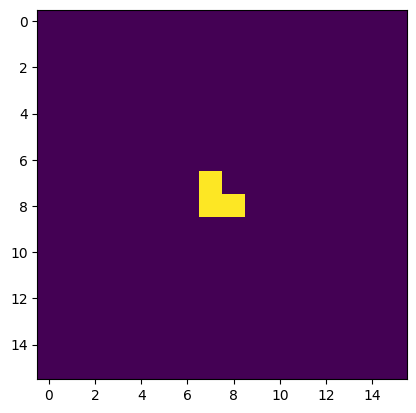

perimeter 3.414213538169861
here noise


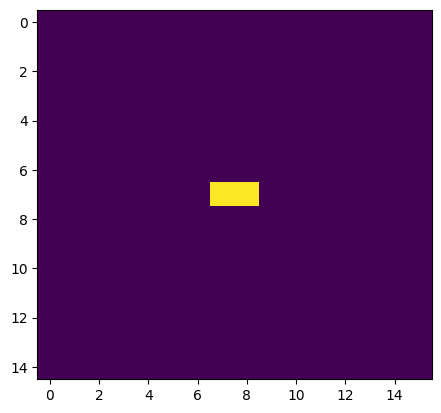

perimeter 2.0
here noise


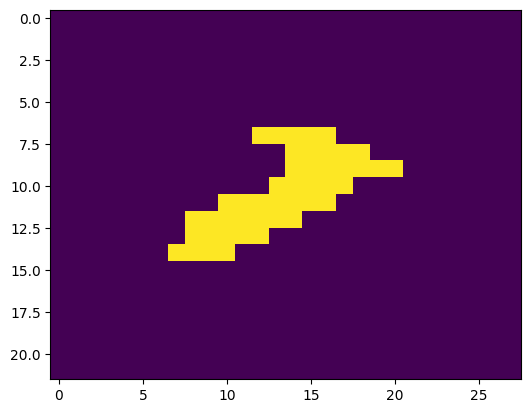

perimeter 36.97056245803833
here minus


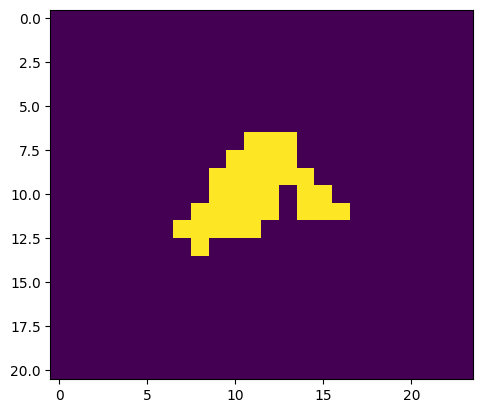

perimeter 26.97056233882904
here noise


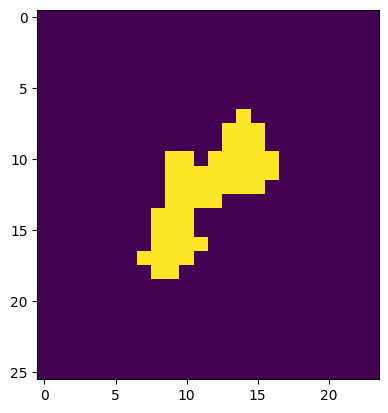

perimeter 35.21320307254791
1/1 [==============================] - 0s 51ms/step
symbol -5


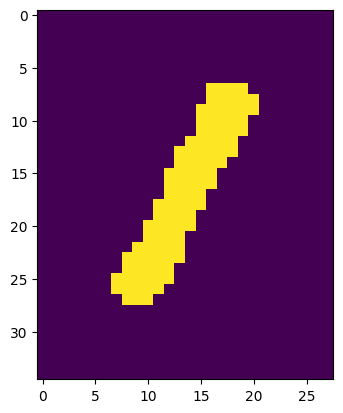

perimeter 53.69848430156708
1/1 [==============================] - 0s 36ms/step
symbol -51


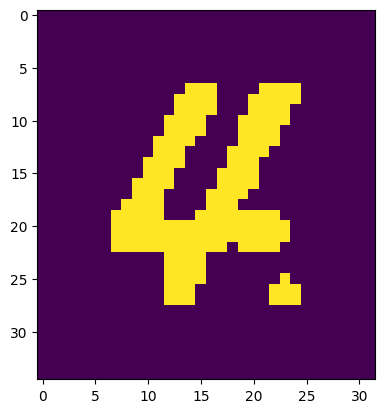

perimeter 102.08326029777527
1/1 [==============================] - 0s 41ms/step
symbol -514


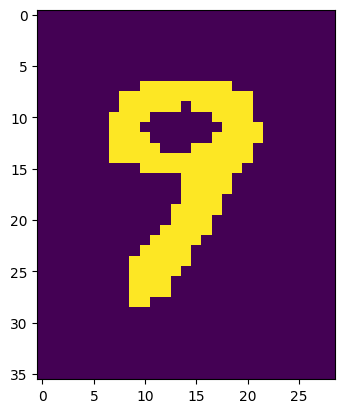

perimeter 67.69848430156708
1/1 [==============================] - 0s 42ms/step
symbol -5148


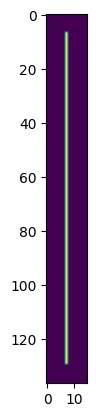

perimeter 244.0
1/1 [==============================] - 0s 36ms/step
symbol -51481


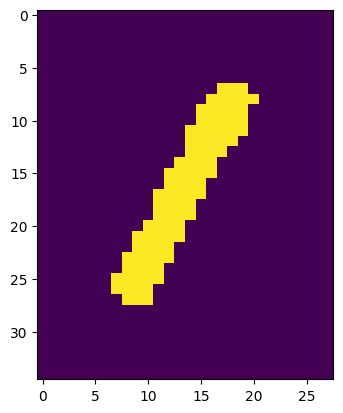

perimeter 53.11269772052765
1/1 [==============================] - 0s 33ms/step
symbol -514811


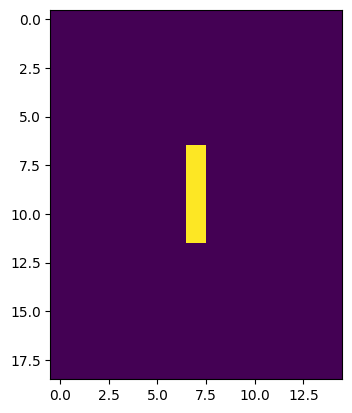

perimeter 8.0
here noise
[0, -514811]


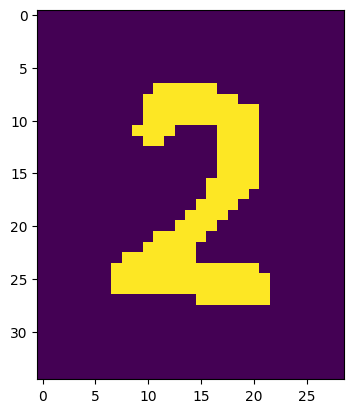

perimeter 85.35533821582794
1/1 [==============================] - 0s 39ms/step
symbol 2


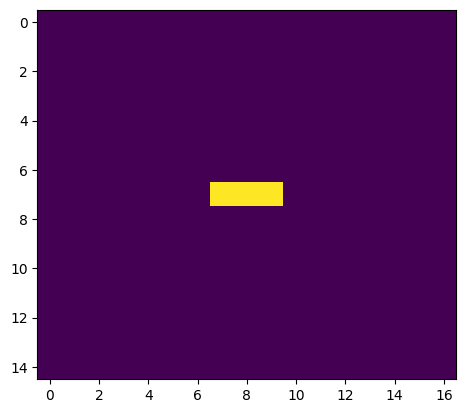

perimeter 4.0
here noise


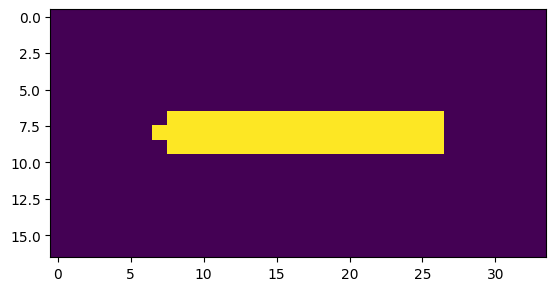

perimeter 40.82842707633972
here minus


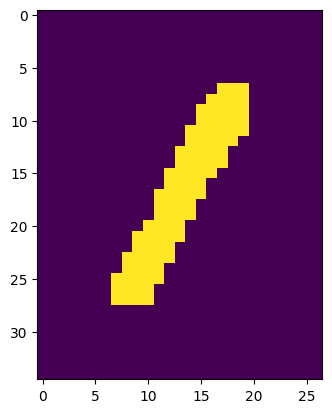

perimeter 52.870057225227356
1/1 [==============================] - 0s 38ms/step
symbol -1


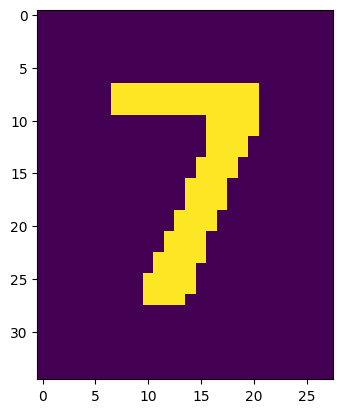

perimeter 69.79898953437805
1/1 [==============================] - 0s 33ms/step
symbol 7


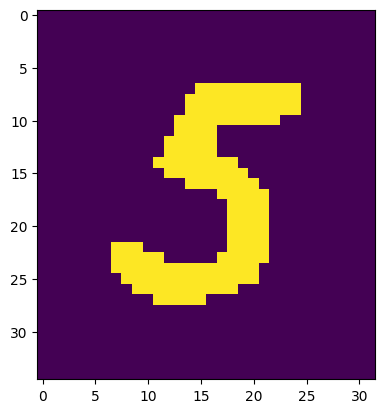

perimeter 87.94112479686737
1/1 [==============================] - 0s 35ms/step
symbol 75


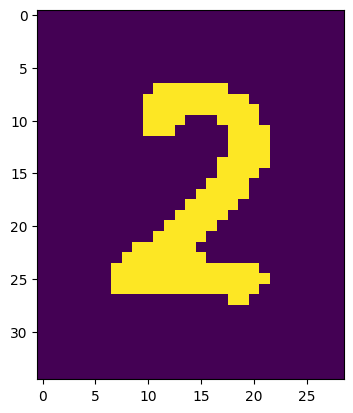

perimeter 83.84062016010284
1/1 [==============================] - 0s 35ms/step
symbol 2


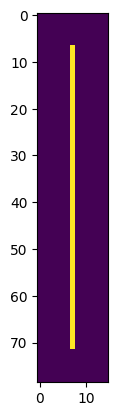

perimeter 128.0
1/1 [==============================] - 0s 33ms/step
symbol 21


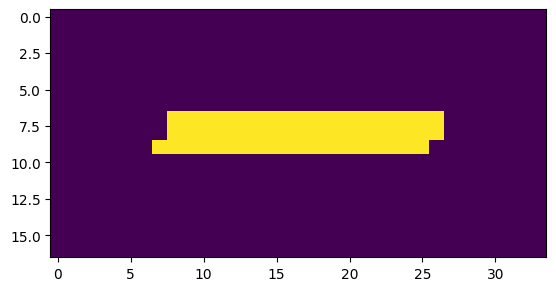

perimeter 40.82842707633972
here minus


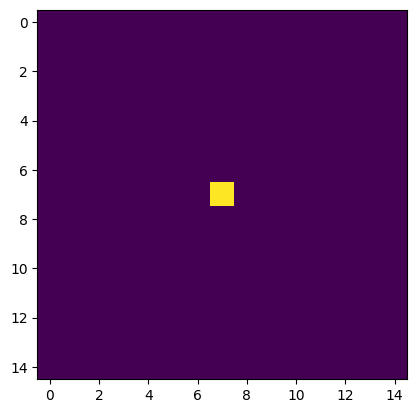

perimeter 0.0
here noise


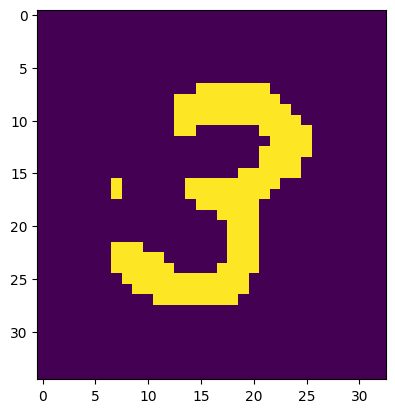

perimeter 93.59797894954681
1/1 [==============================] - 0s 56ms/step
symbol 21-3


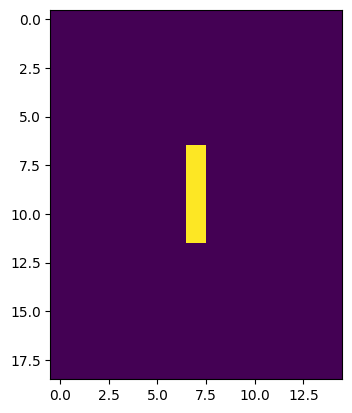

perimeter 8.0
here noise
[2, -1, 75, 0, 0]


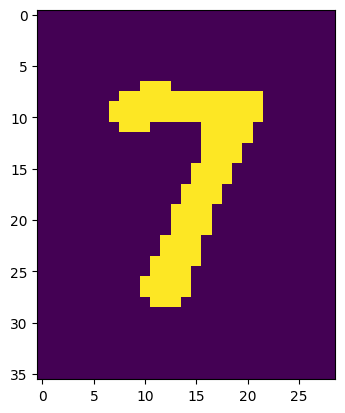

perimeter 71.69848430156708
1/1 [==============================] - 0s 37ms/step
symbol 7


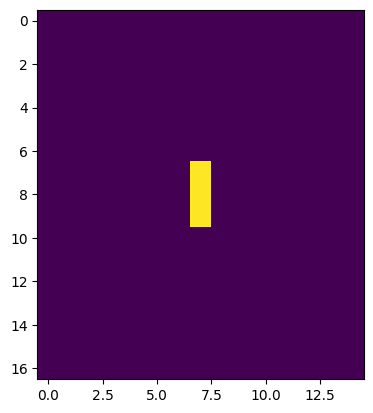

perimeter 4.0
here noise


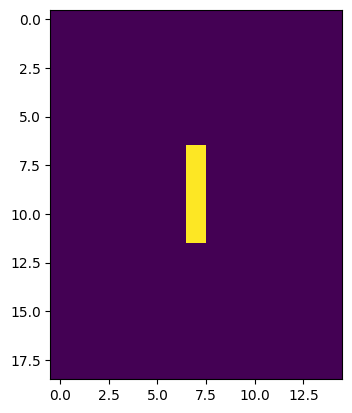

perimeter 8.0
here noise


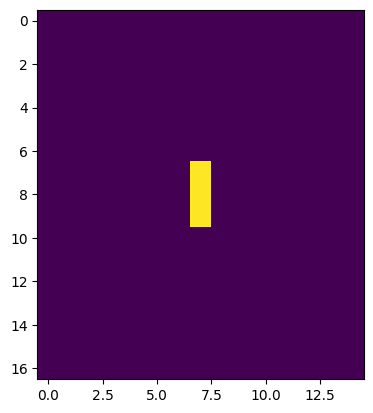

perimeter 4.0
here noise


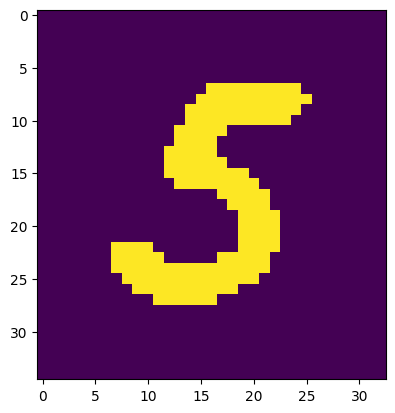

perimeter 89.01219248771667
1/1 [==============================] - 0s 47ms/step
symbol 5


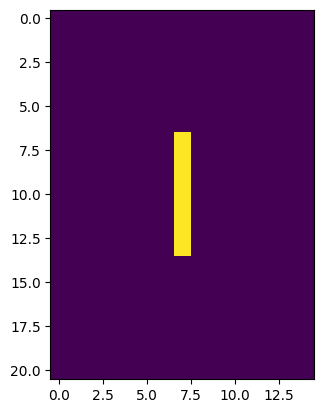

perimeter 12.0
here noise


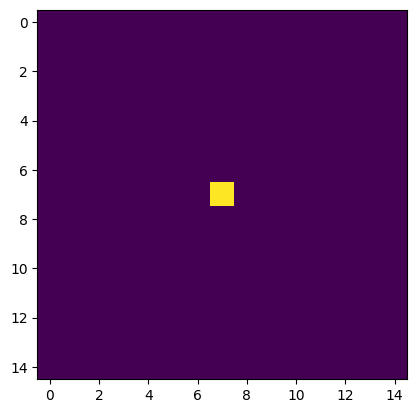

perimeter 0.0
here noise


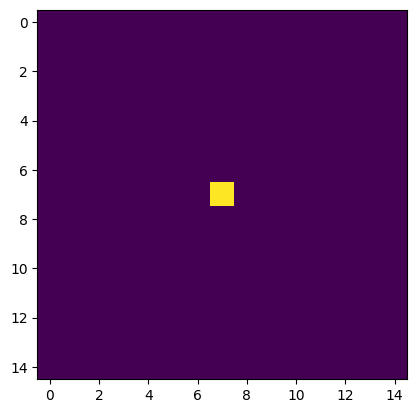

perimeter 0.0
here noise


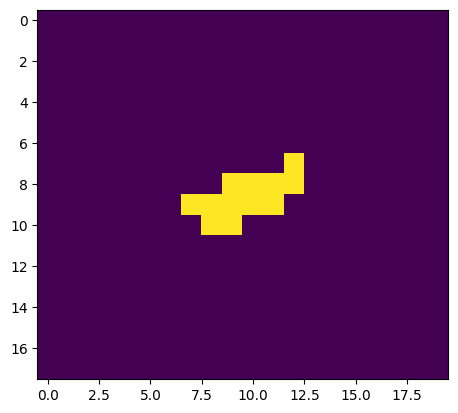

perimeter 13.071067690849304
here noise


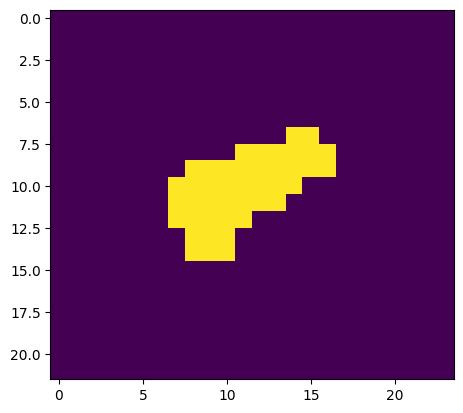

perimeter 26.727921843528748
here noise


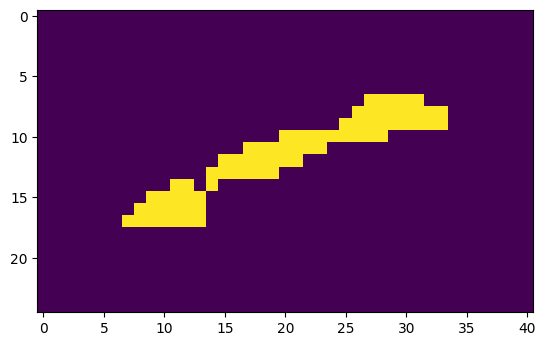

perimeter 63.455843567848206
here minus


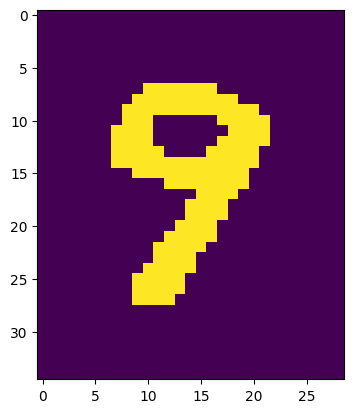

perimeter 65.94112479686737
1/1 [==============================] - 0s 36ms/step
symbol -9


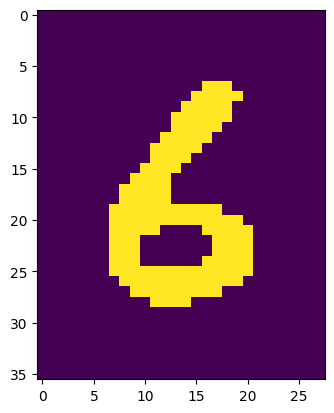

perimeter 66.76955151557922
1/1 [==============================] - 0s 37ms/step
symbol -96


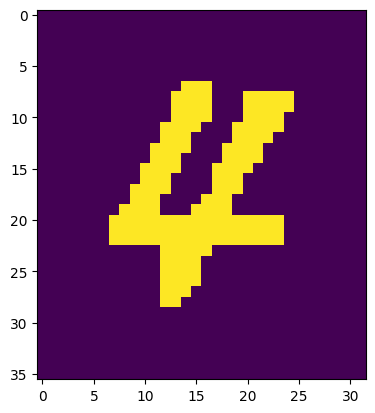

perimeter 101.8406195640564
1/1 [==============================] - 0s 41ms/step
symbol -964


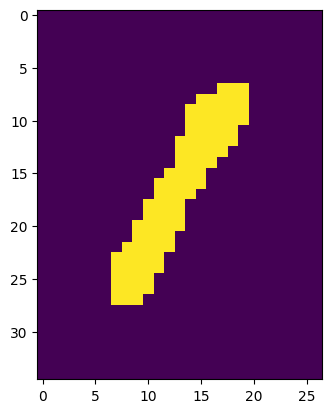

perimeter 52.870057106018066
1/1 [==============================] - 0s 42ms/step
symbol -9641


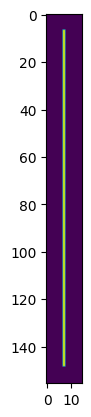

perimeter 282.0
1/1 [==============================] - 0s 47ms/step
symbol -96411
[7, 5, 0, -96411]


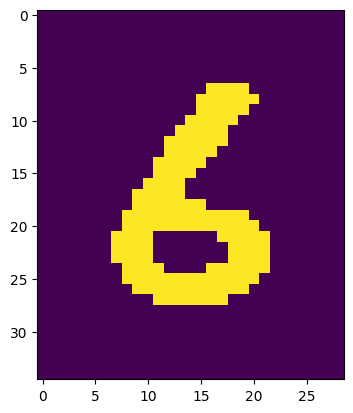

perimeter 66.18376529216766
1/1 [==============================] - 0s 34ms/step
symbol 6


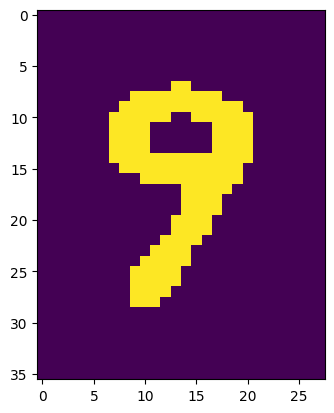

perimeter 64.5269113779068
1/1 [==============================] - 0s 33ms/step
symbol 69


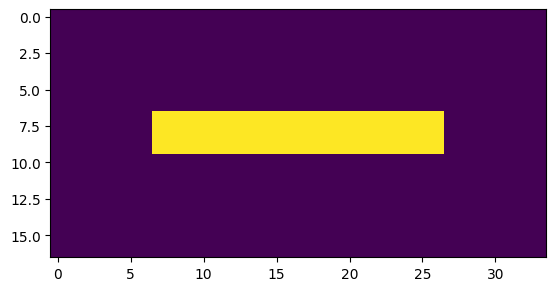

perimeter 42.0
here minus


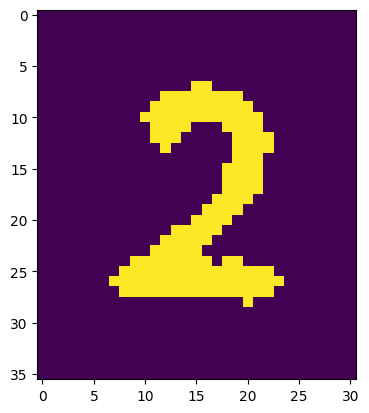

perimeter 90.56854104995728
1/1 [==============================] - 0s 61ms/step
symbol -2


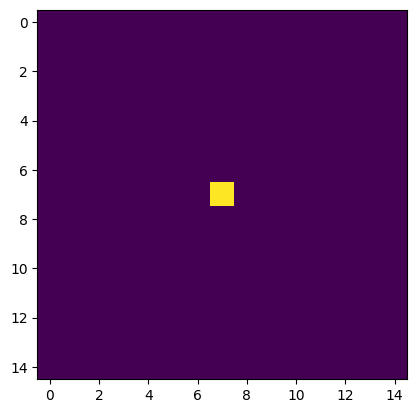

perimeter 0.0
here noise


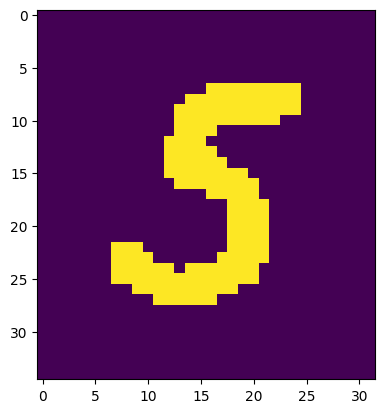

perimeter 89.35533833503723
1/1 [==============================] - 0s 47ms/step
symbol 5


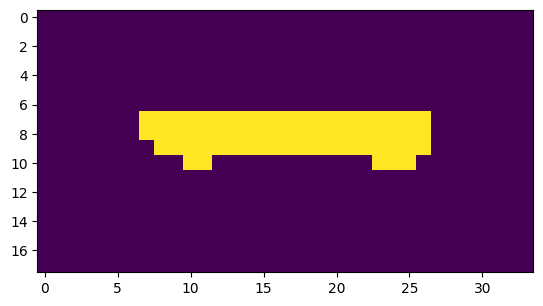

perimeter 43.071067690849304
here minus


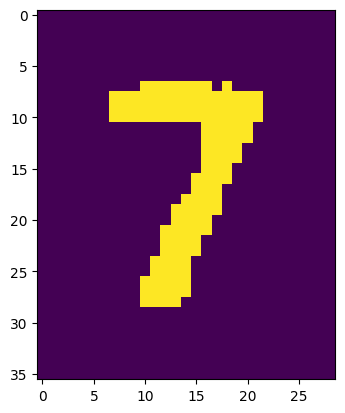

perimeter 72.87005722522736
1/1 [==============================] - 0s 39ms/step
symbol -7


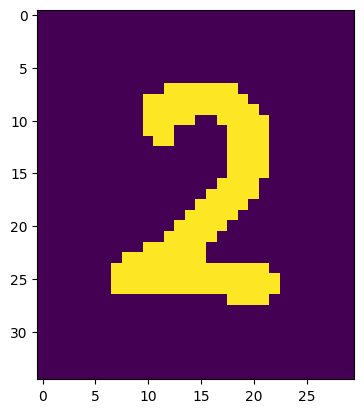

perimeter 87.59797942638397
1/1 [==============================] - 0s 33ms/step
symbol 2
[69, -2, 5, -7, 2]


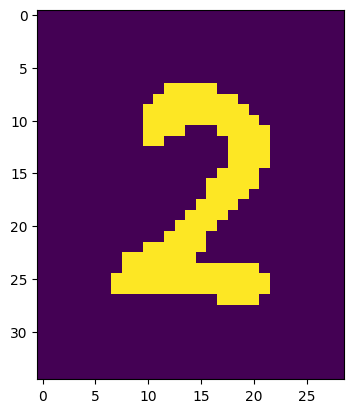

perimeter 84.42640626430511
1/1 [==============================] - 0s 36ms/step
symbol 2


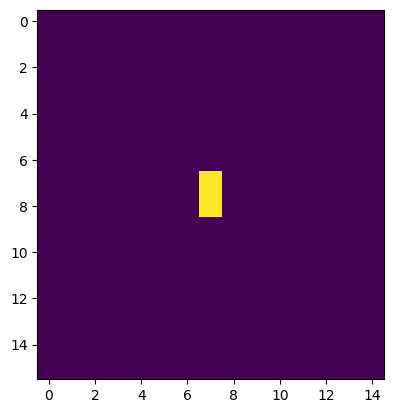

perimeter 2.0
here noise


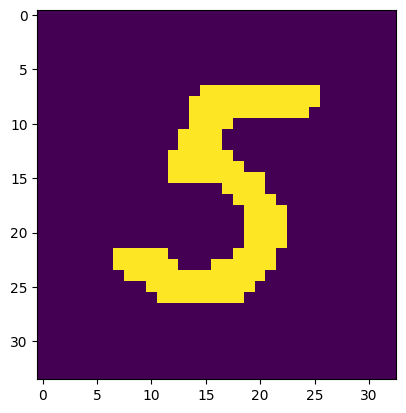

perimeter 88.76955163478851
1/1 [==============================] - 0s 35ms/step
symbol 5


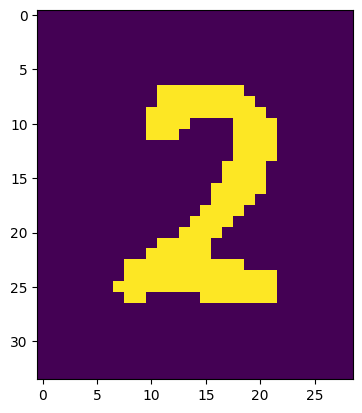

perimeter 84.18376553058624
1/1 [==============================] - 0s 34ms/step
symbol 2


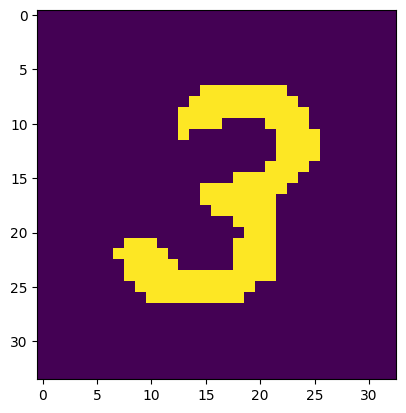

perimeter 92.42640602588654
1/1 [==============================] - 0s 40ms/step
symbol 3


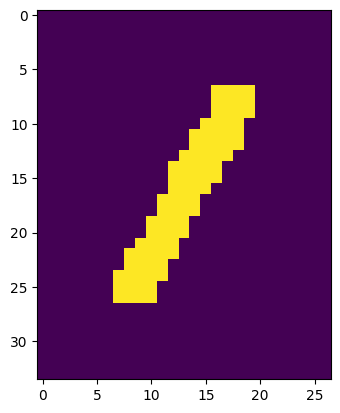

perimeter 51.455843687057495
1/1 [==============================] - 0s 45ms/step
symbol 1


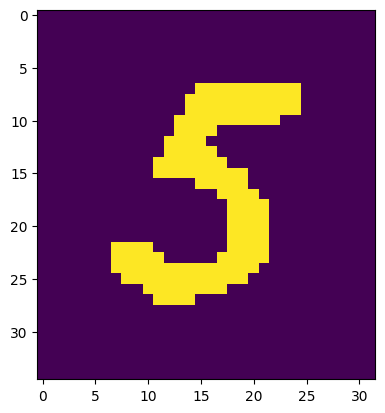

perimeter 88.76955187320709
1/1 [==============================] - 0s 40ms/step
symbol 15
[2, 0, 5, 2, 3, 15]


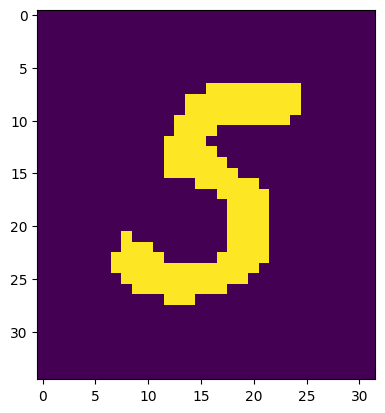

perimeter 88.18376553058624
1/1 [==============================] - 0s 35ms/step
symbol 5


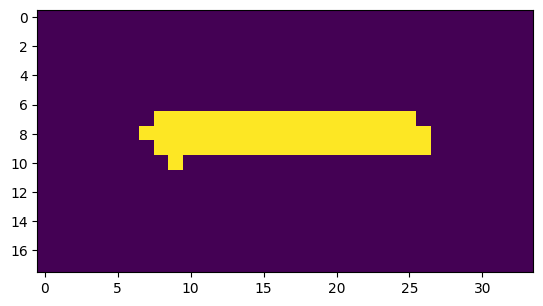

perimeter 41.071067690849304
here minus


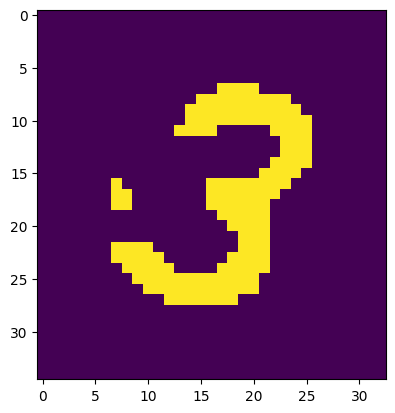

perimeter 91.84061908721924
1/1 [==============================] - 0s 41ms/step
symbol -3


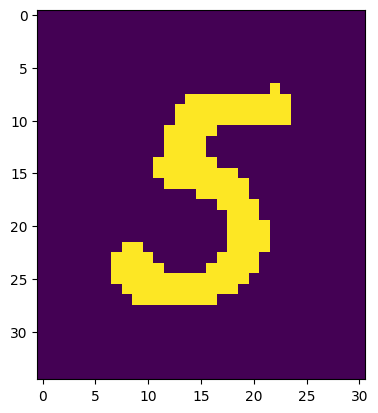

perimeter 87.01219236850739
1/1 [==============================] - 0s 57ms/step
symbol 5


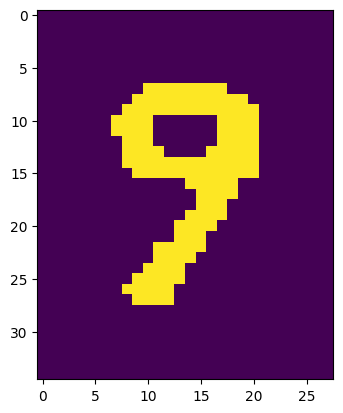

perimeter 66.52691113948822
1/1 [==============================] - 0s 41ms/step
symbol 59


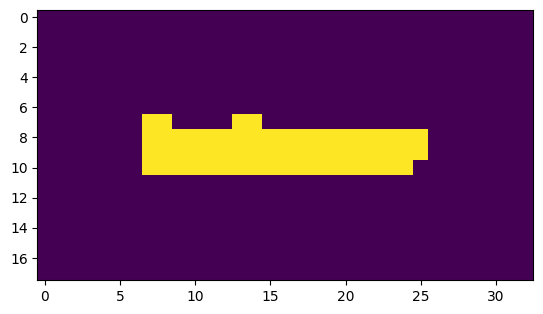

perimeter 41.65685415267944
here minus


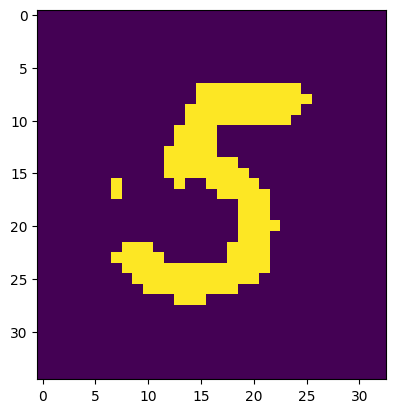

perimeter 90.42640590667725
1/1 [==============================] - 0s 39ms/step
symbol -5


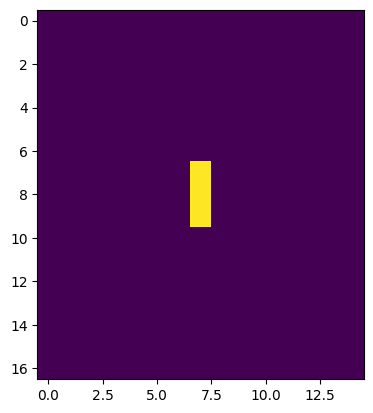

perimeter 4.0
here noise


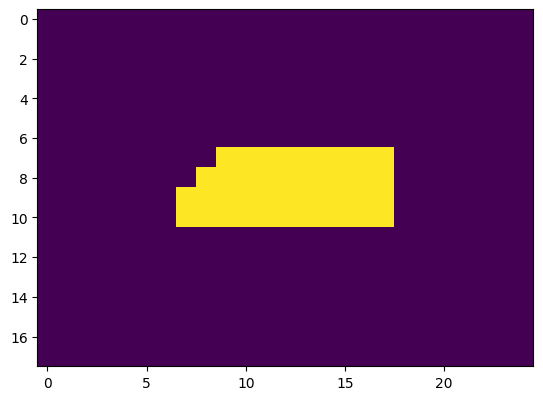

perimeter 24.82842707633972
here noise


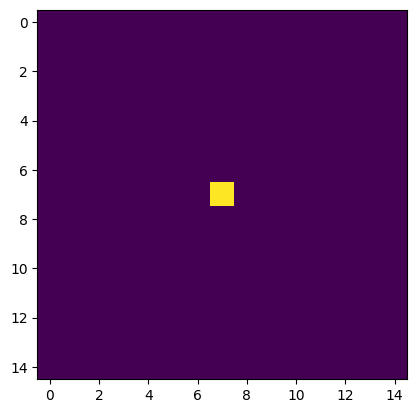

perimeter 0.0
here noise


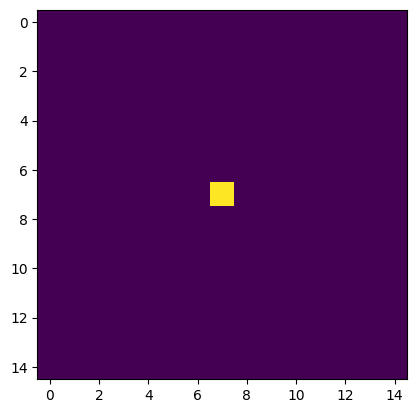

perimeter 0.0
here noise


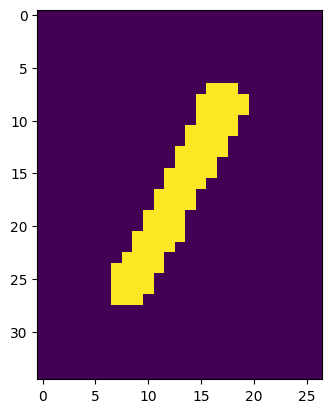

perimeter 52.28427076339722
1/1 [==============================] - 0s 53ms/step
symbol 1


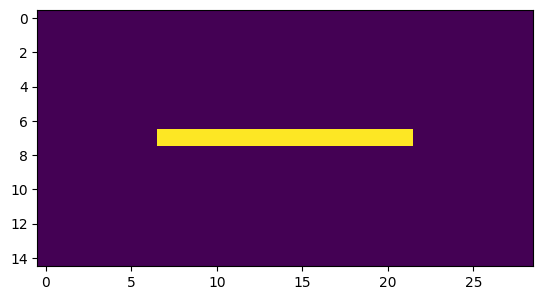

perimeter 28.0
here noise


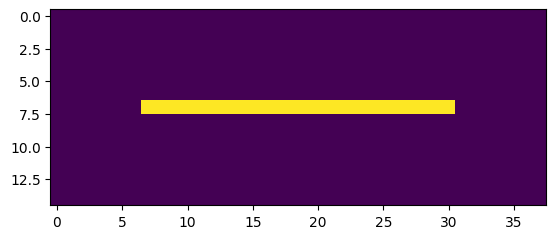

perimeter 46.0
here minus


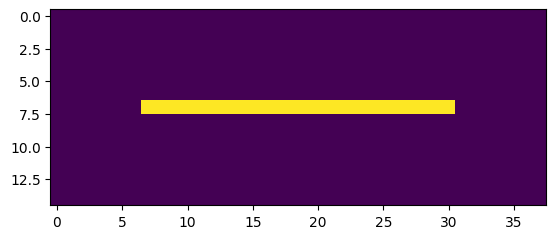

perimeter 46.0
here minus


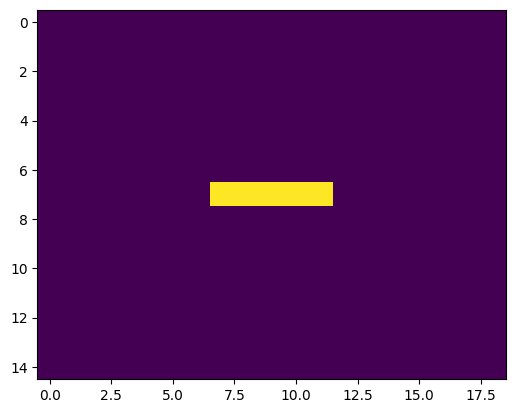

perimeter 8.0
here noise


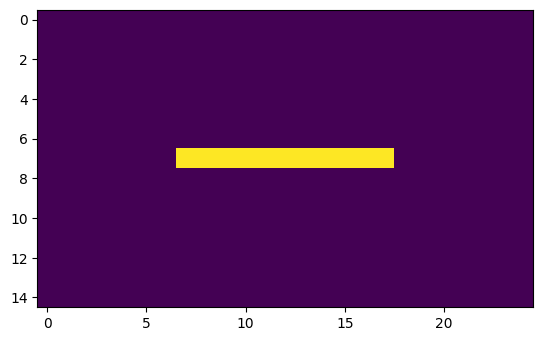

perimeter 20.0
here noise
[5, -3, 59, -5, 1, 0]


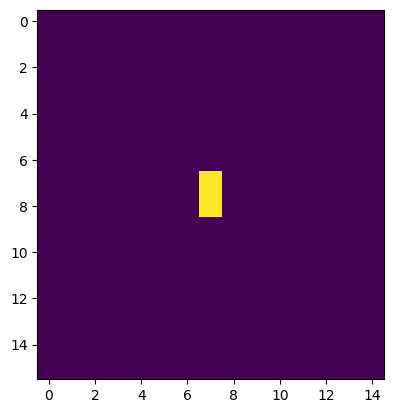

perimeter 2.0
here noise


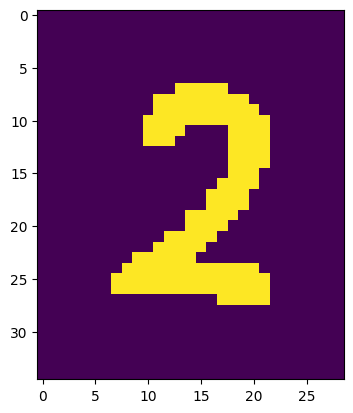

perimeter 86.76955211162567
1/1 [==============================] - 0s 35ms/step
symbol 2


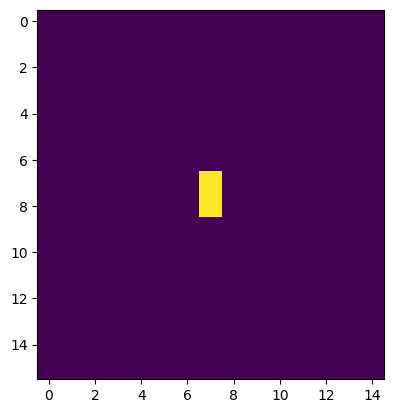

perimeter 2.0
here noise


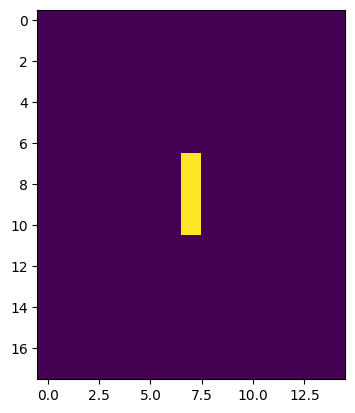

perimeter 6.0
here noise


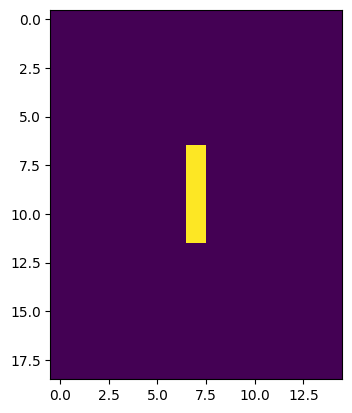

perimeter 8.0
here noise


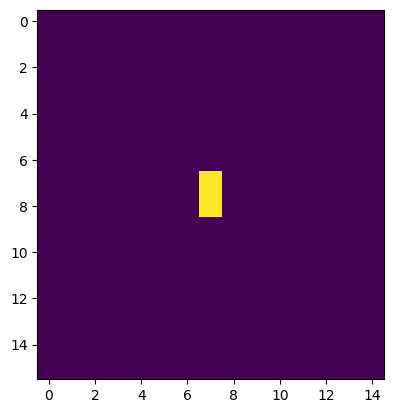

perimeter 2.0
here noise


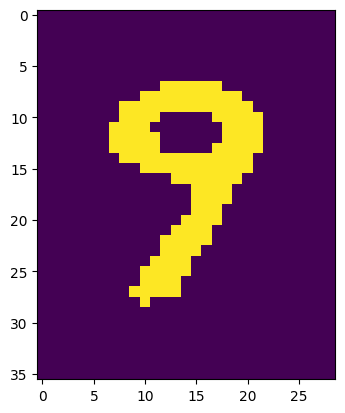

perimeter 66.76955187320709
1/1 [==============================] - 0s 59ms/step
symbol 9


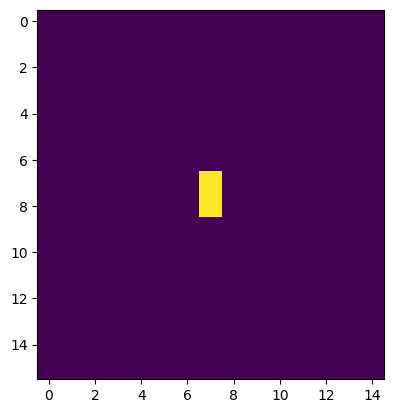

perimeter 2.0
here noise


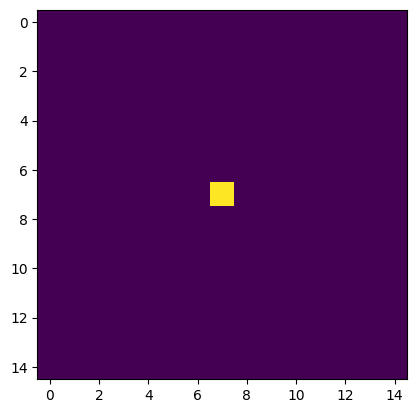

perimeter 0.0
here noise


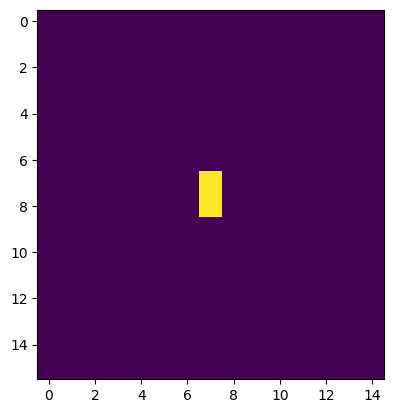

perimeter 2.0
here noise


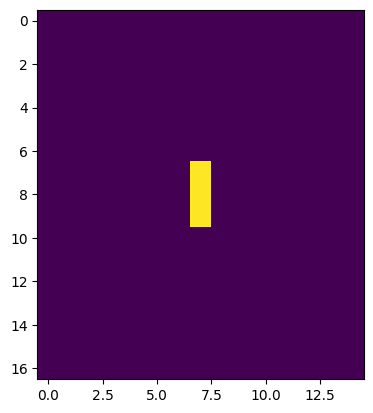

perimeter 4.0
here noise


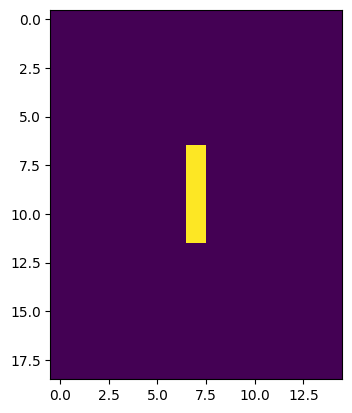

perimeter 8.0
here noise


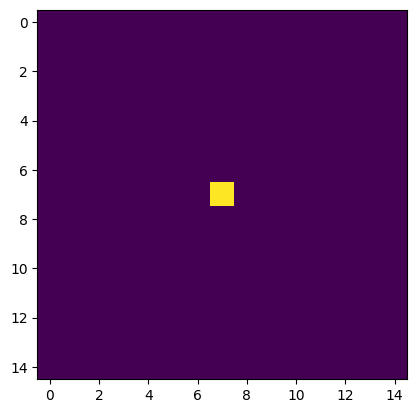

perimeter 0.0
here noise


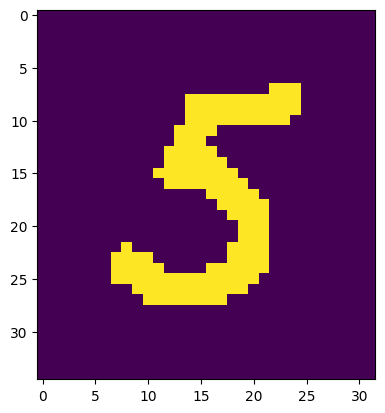

perimeter 90.42640590667725
1/1 [==============================] - 0s 42ms/step
symbol 5


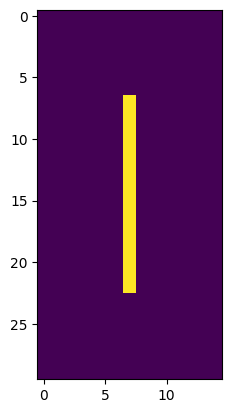

perimeter 30.0
1/1 [==============================] - 0s 68ms/step
symbol 1


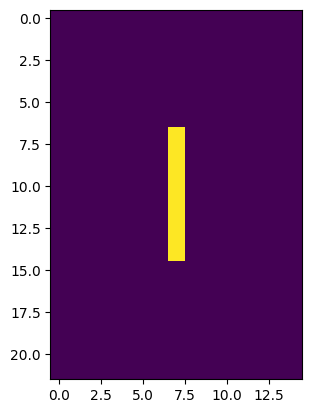

perimeter 14.0
here noise


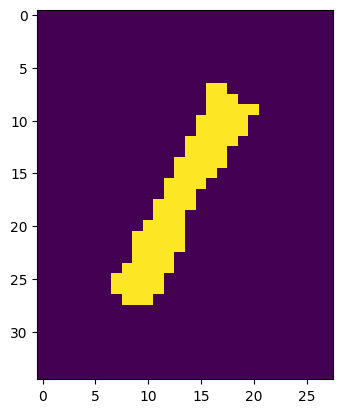

perimeter 53.11269772052765
1/1 [==============================] - 0s 69ms/step
symbol 11


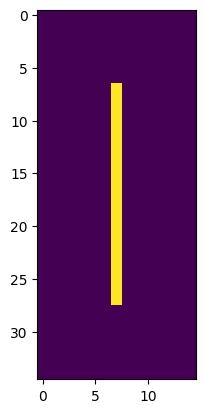

perimeter 40.0
1/1 [==============================] - 0s 35ms/step
symbol 111


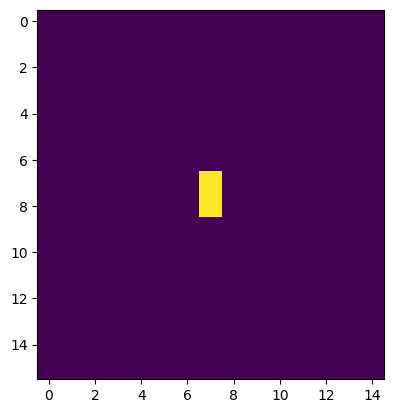

perimeter 2.0
here noise


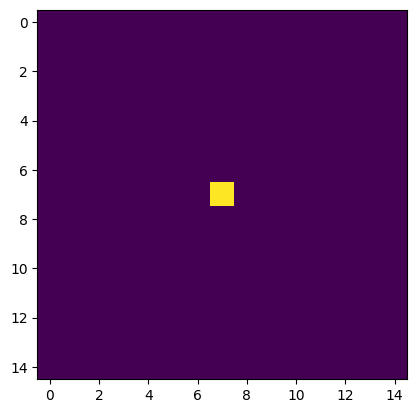

perimeter 0.0
here noise


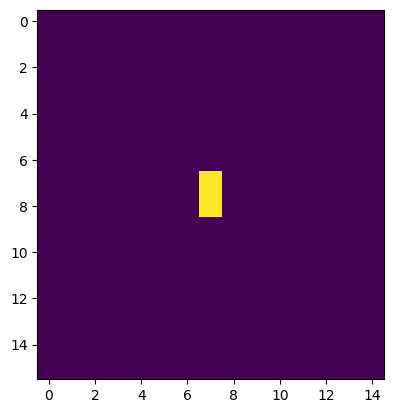

perimeter 2.0
here noise


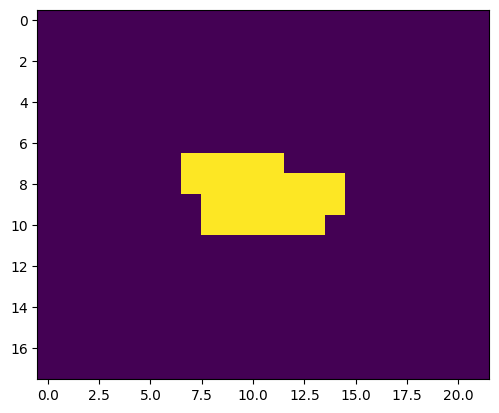

perimeter 18.242640614509583
here noise


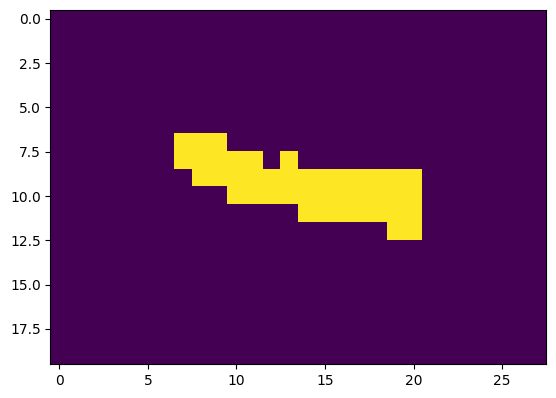

perimeter 33.31370830535889
here minus


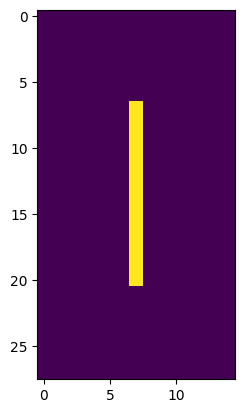

perimeter 26.0
here noise


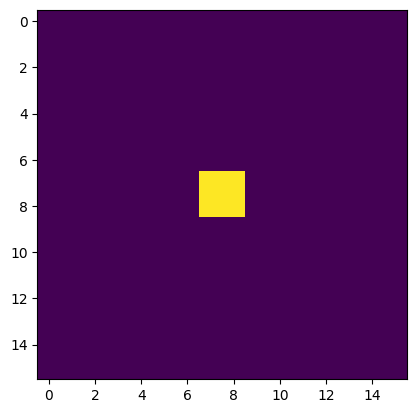

perimeter 4.0
here noise


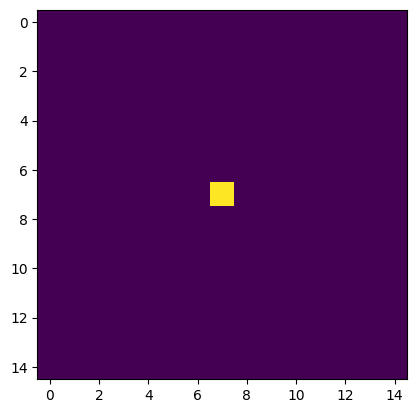

perimeter 0.0
here noise


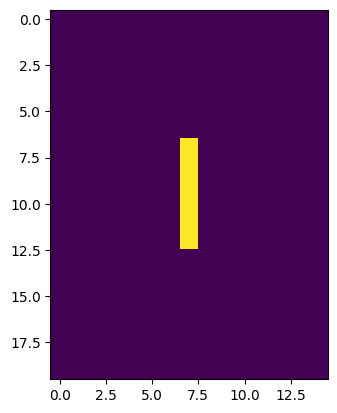

perimeter 10.0
here noise


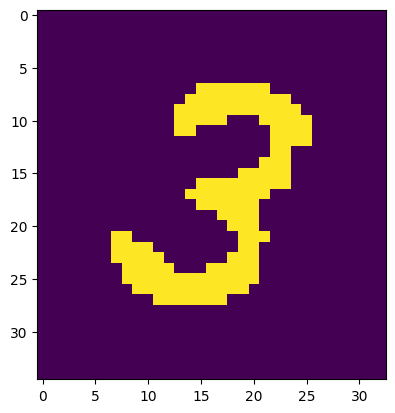

perimeter 98.08326005935669
1/1 [==============================] - 0s 35ms/step
symbol -3


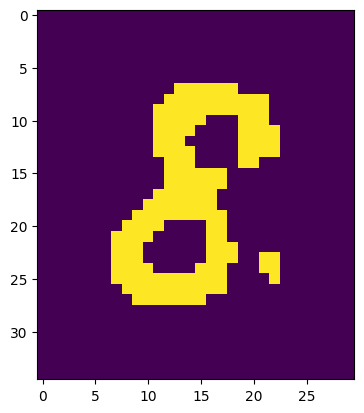

perimeter 79.94112491607666
1/1 [==============================] - 0s 37ms/step
symbol -38


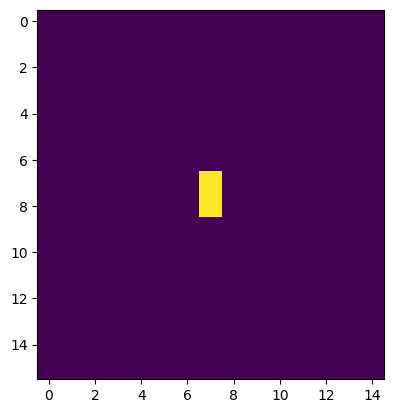

perimeter 2.0
here noise


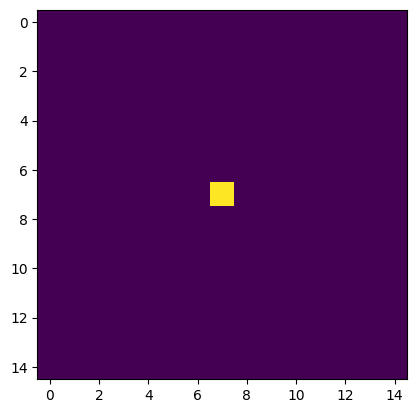

perimeter 0.0
here noise


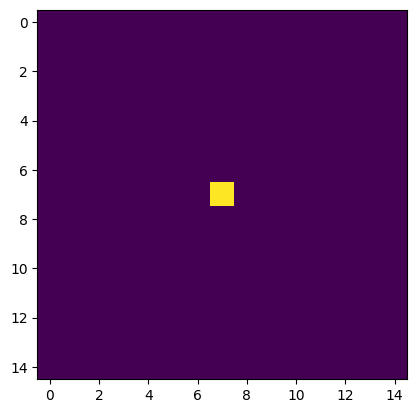

perimeter 0.0
here noise


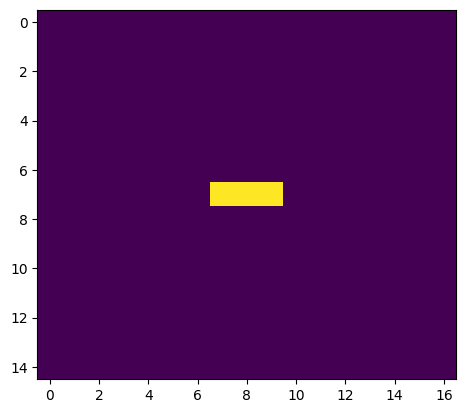

perimeter 4.0
here noise


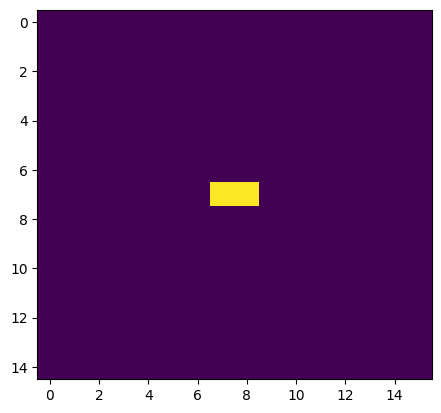

perimeter 2.0
here noise


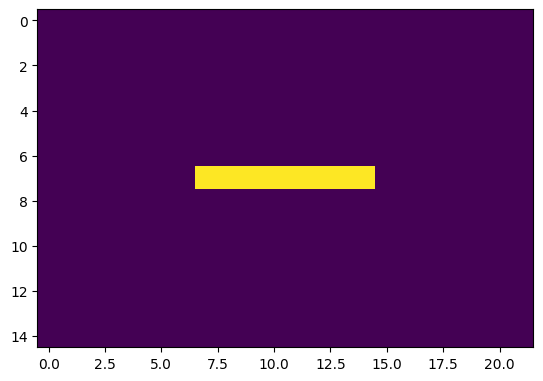

perimeter 14.0
here noise


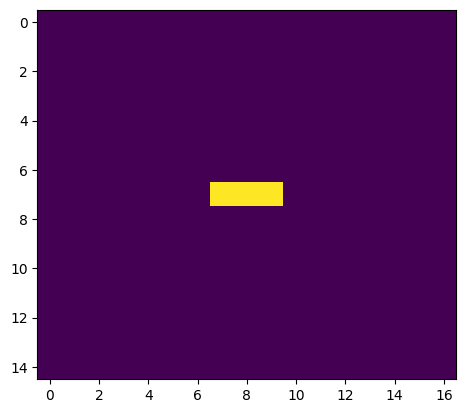

perimeter 4.0
here noise


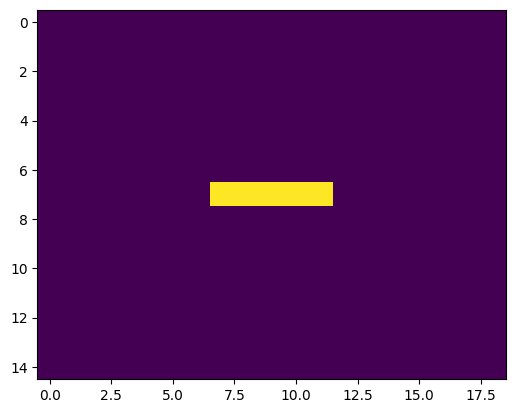

perimeter 8.0
here noise


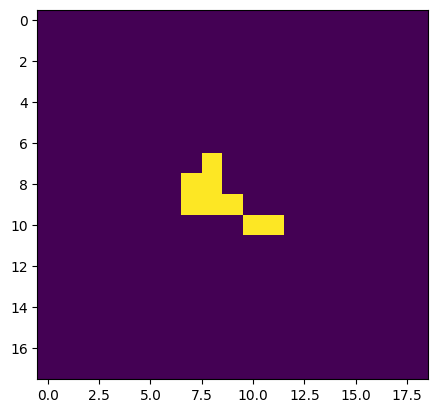

perimeter 11.656854152679443
here noise


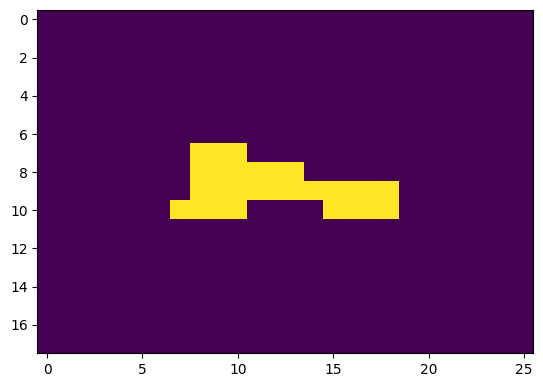

perimeter 27.071067690849304
here noise


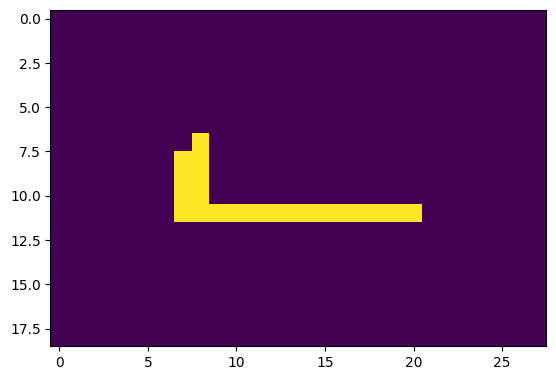

perimeter 32.82842707633972
here minus
[2, 0, 0, 9, 0, 0, 0, 5, 111, 0, 0, 0, -38, 0]


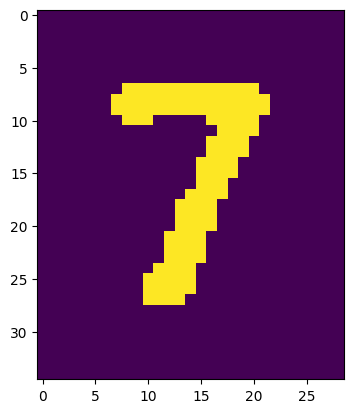

perimeter 71.69848430156708
1/1 [==============================] - 0s 36ms/step
symbol 7


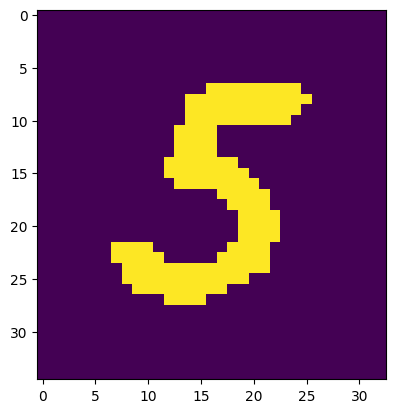

perimeter 89.59797871112823
1/1 [==============================] - 0s 65ms/step
symbol 75


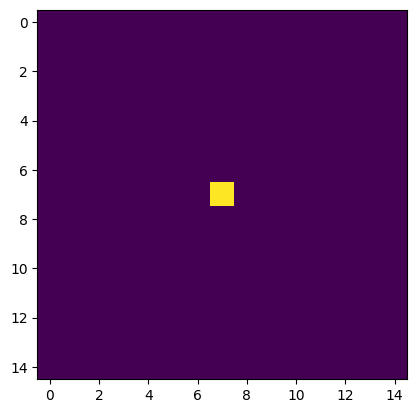

perimeter 0.0
here noise


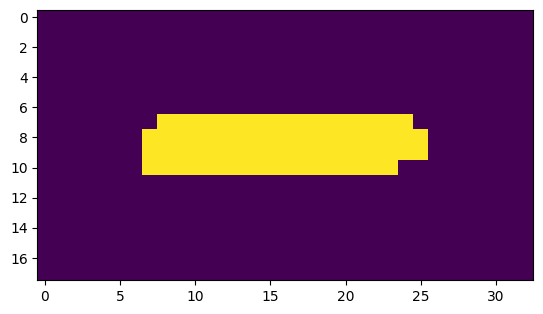

perimeter 40.24264061450958
here minus


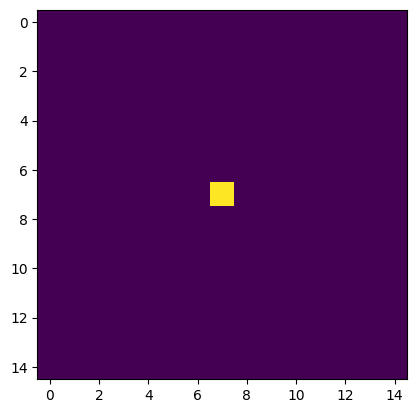

perimeter 0.0
here noise


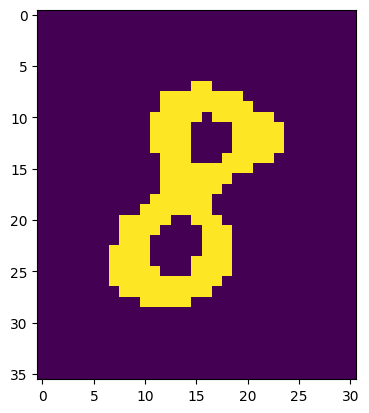

perimeter 66.52691113948822
1/1 [==============================] - 0s 36ms/step
symbol -8


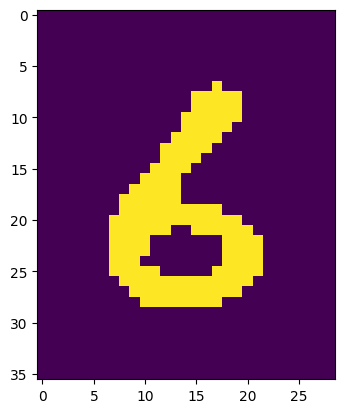

perimeter 66.76955163478851
1/1 [==============================] - 0s 70ms/step
symbol 6


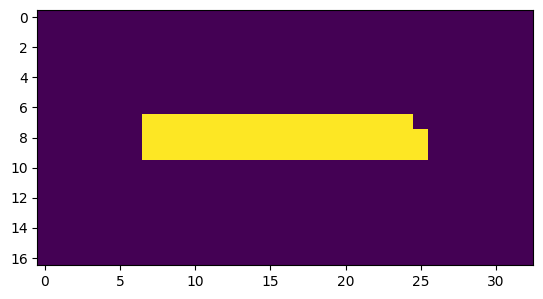

perimeter 39.41421353816986
here minus


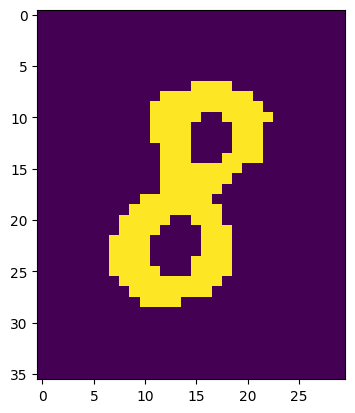

perimeter 64.52691125869751
1/1 [==============================] - 0s 37ms/step
symbol -8


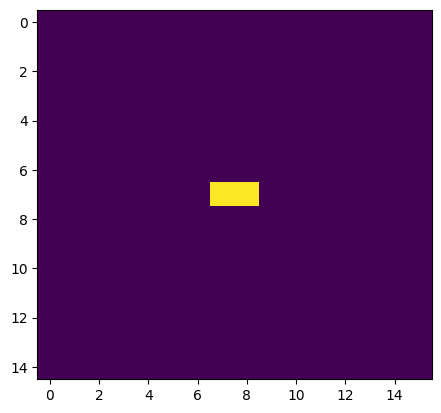

perimeter 2.0
here noise


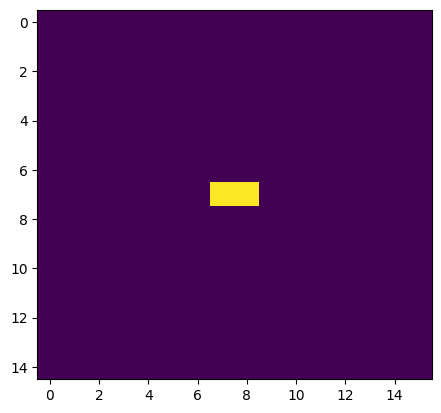

perimeter 2.0
here noise


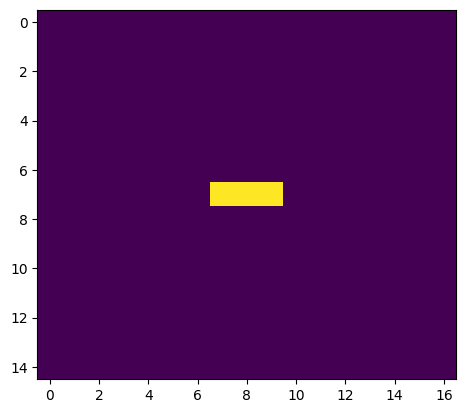

perimeter 4.0
here noise


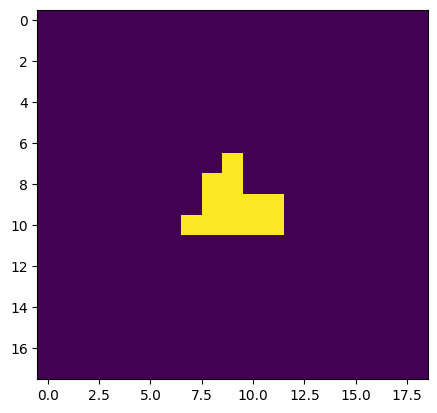

perimeter 12.242640614509583
here noise


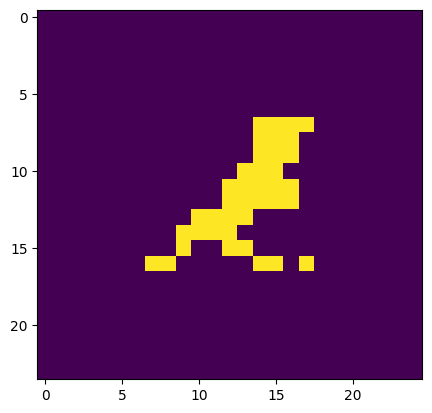

perimeter 40.62741661071777
here minus


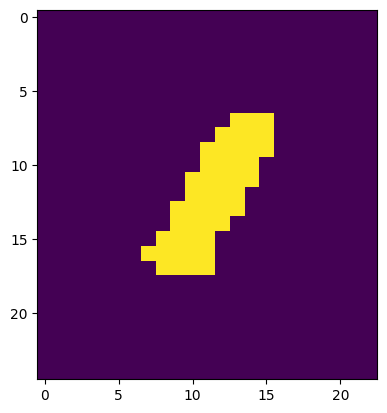

perimeter 29.55634891986847
here noise


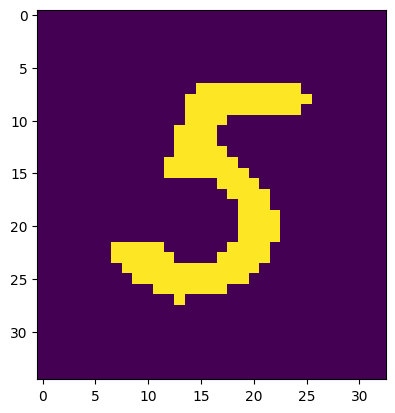

perimeter 88.42640602588654
1/1 [==============================] - 0s 34ms/step
symbol -5
[75, -8, 6, -8, -5]


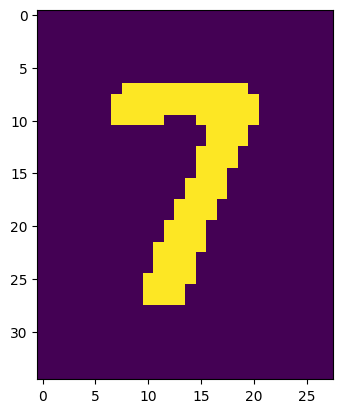

perimeter 69.4558436870575
1/1 [==============================] - 0s 56ms/step
symbol 7


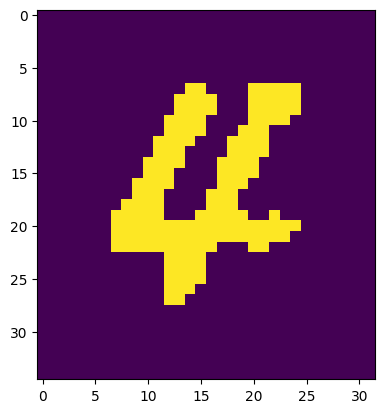

perimeter 104.32590091228485
1/1 [==============================] - 0s 39ms/step
symbol 4


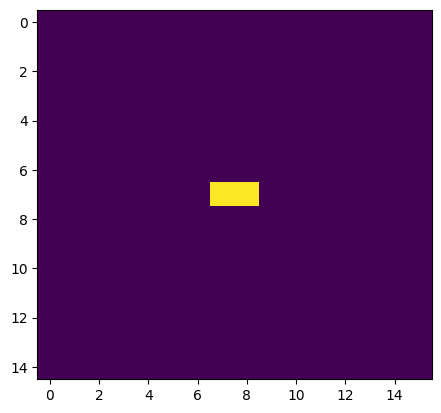

perimeter 2.0
here noise


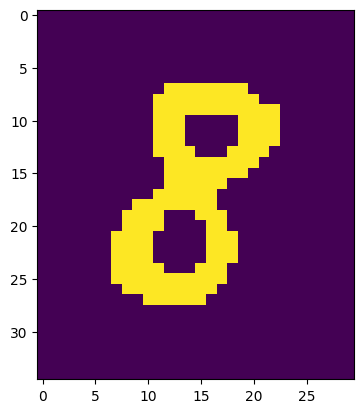

perimeter 64.28427064418793
1/1 [==============================] - 0s 34ms/step
symbol 8


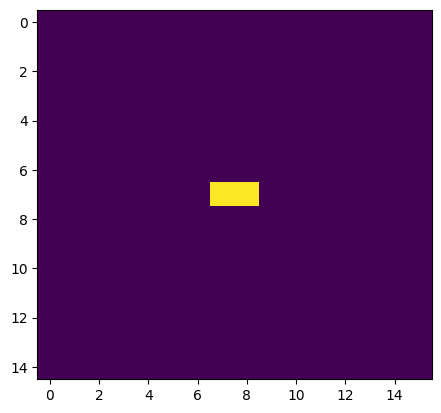

perimeter 2.0
here noise


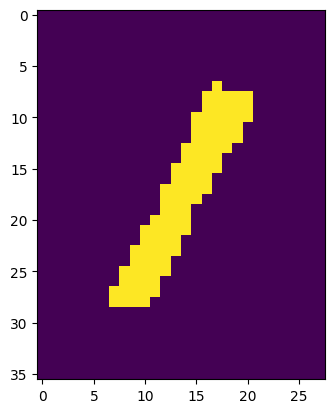

perimeter 55.69848430156708
1/1 [==============================] - 0s 52ms/step
symbol 1


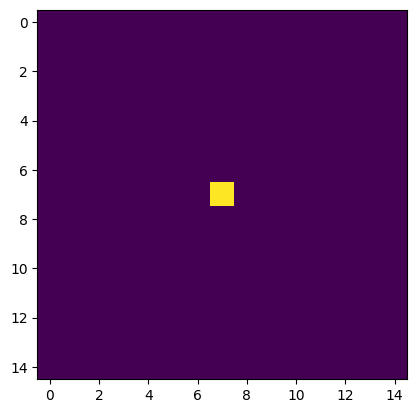

perimeter 0.0
here noise


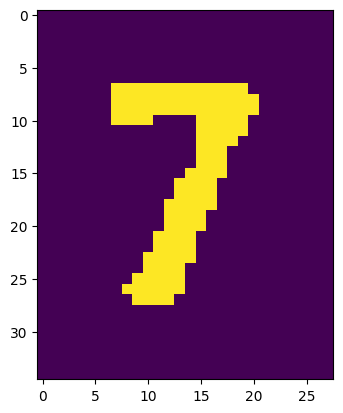

perimeter 70.87005722522736
1/1 [==============================] - 0s 61ms/step
symbol 7


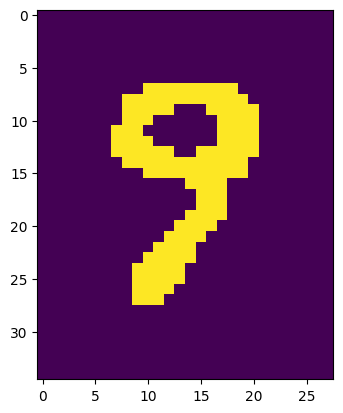

perimeter 65.11269748210907
1/1 [==============================] - 0s 37ms/step
symbol 79


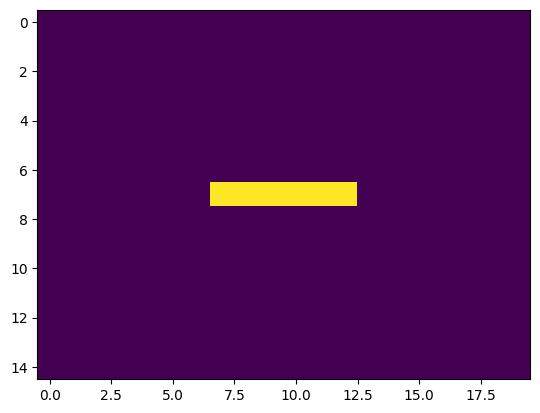

perimeter 10.0
here noise


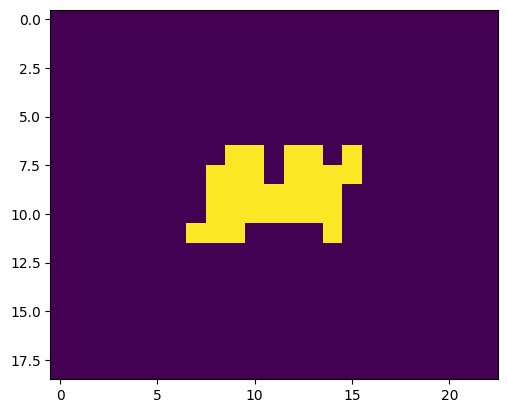

perimeter 26.727921843528748
here noise


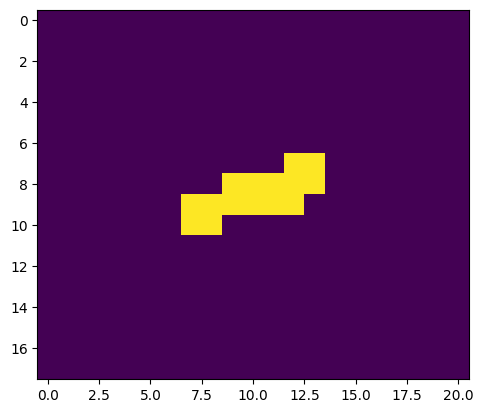

perimeter 15.656854152679443
here noise


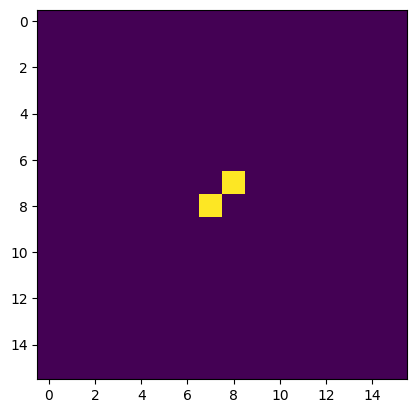

perimeter 2.8284270763397217
here noise
[7, 4, 0, 8, 1, 0, 79, 0]


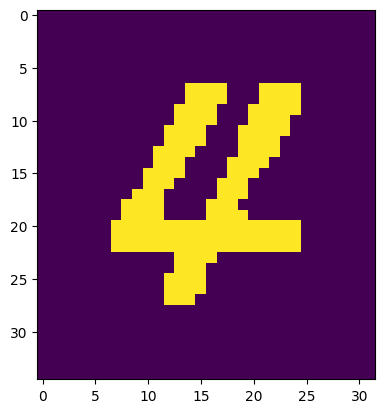

perimeter 106.66904664039612
1/1 [==============================] - 0s 42ms/step
symbol 4


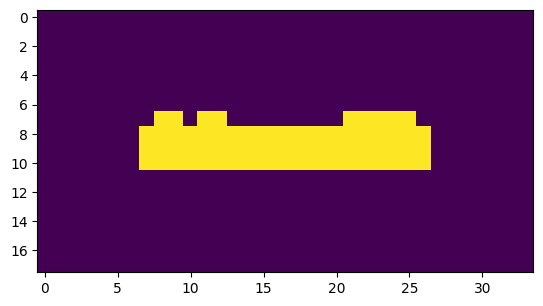

perimeter 44.485281229019165
here minus


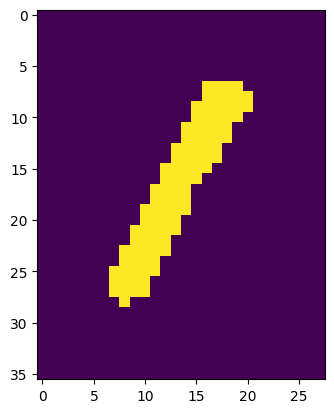

perimeter 55.11269772052765
1/1 [==============================] - 0s 37ms/step
symbol -1


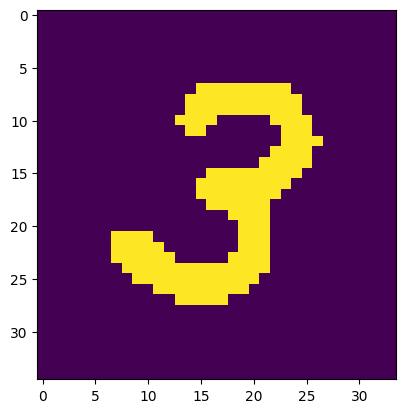

perimeter 96.08326005935669
1/1 [==============================] - 0s 37ms/step
symbol 3


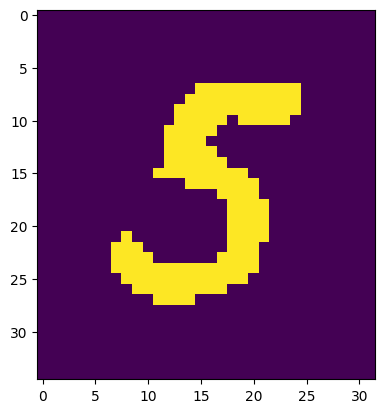

perimeter 90.42640578746796
1/1 [==============================] - 0s 33ms/step
symbol 35


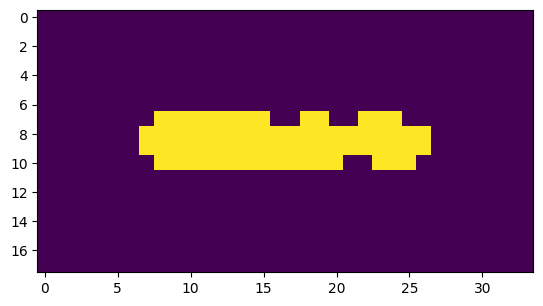

perimeter 44.14213538169861
here minus


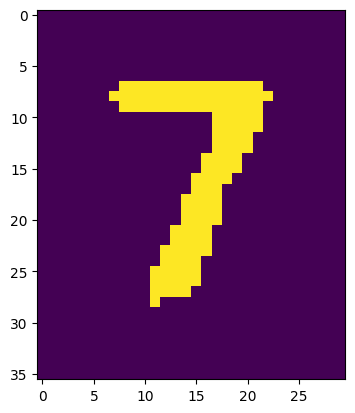

perimeter 72.87005722522736
1/1 [==============================] - 0s 37ms/step
symbol -7


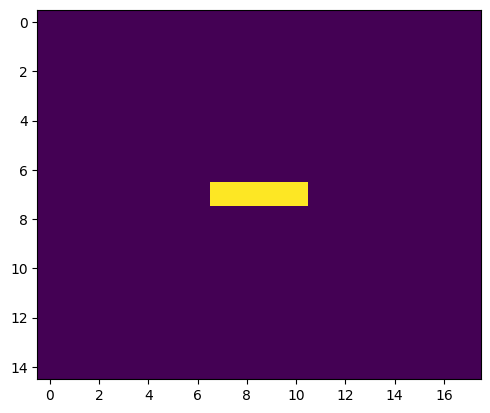

perimeter 6.0
here noise


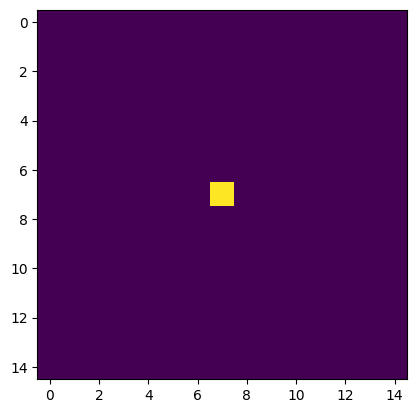

perimeter 0.0
here noise


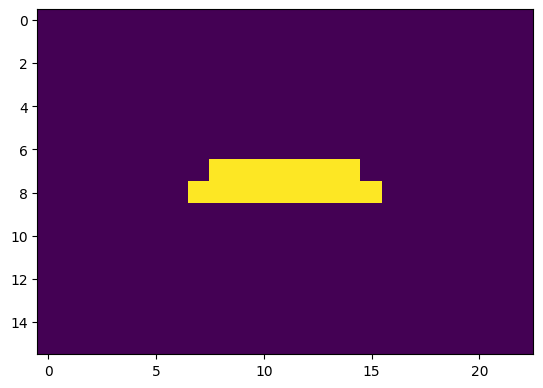

perimeter 16.82842707633972
here noise


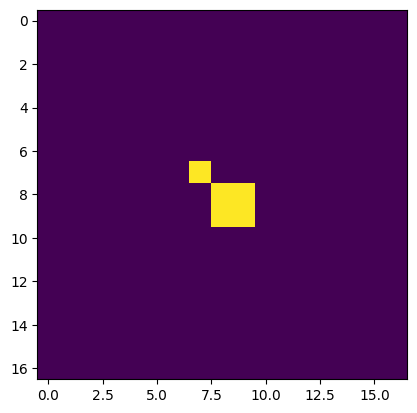

perimeter 6.828427076339722
here noise


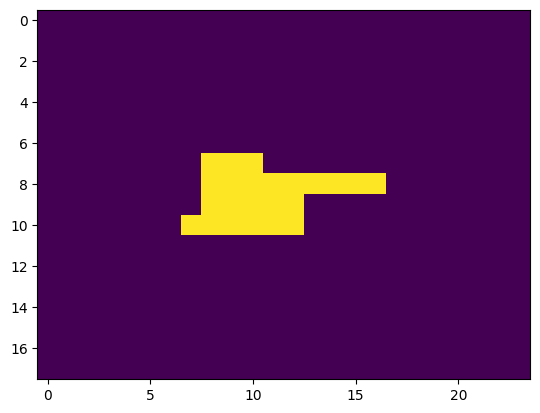

perimeter 22.242640614509583
here noise


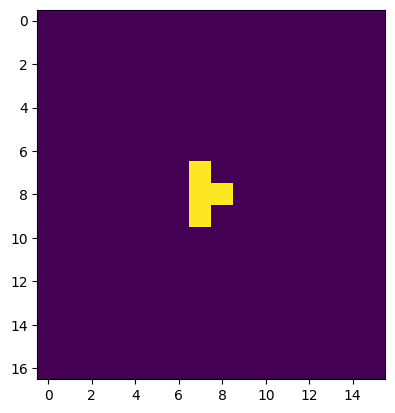

perimeter 4.828427076339722
here noise


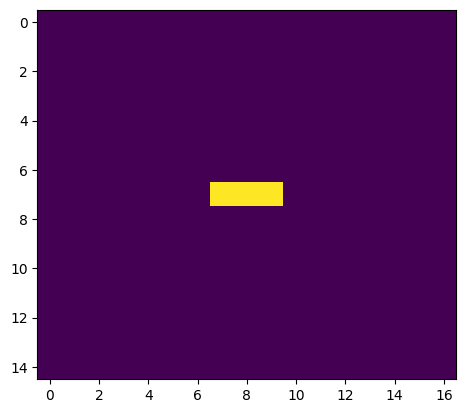

perimeter 4.0
here noise


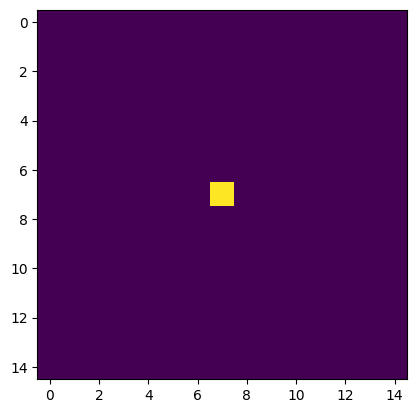

perimeter 0.0
here noise


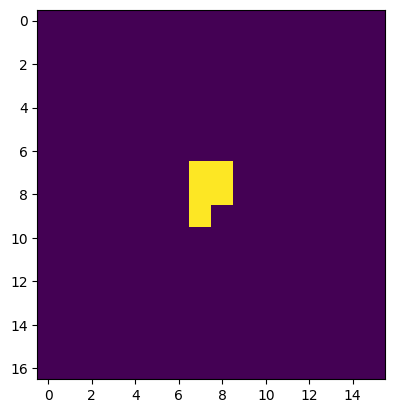

perimeter 5.414213538169861
here noise


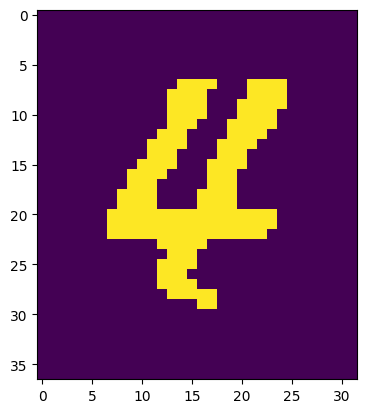

perimeter 110.32590079307556
1/1 [==============================] - 0s 82ms/step
symbol 4
[4, -1, 35, -7, 4]


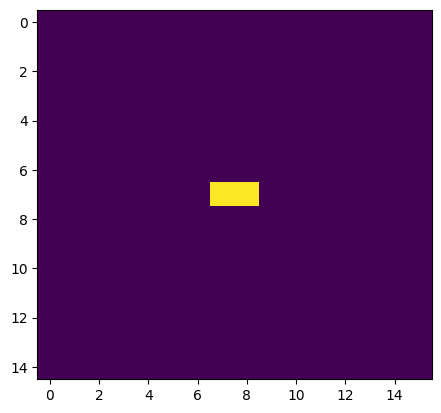

perimeter 2.0
here noise


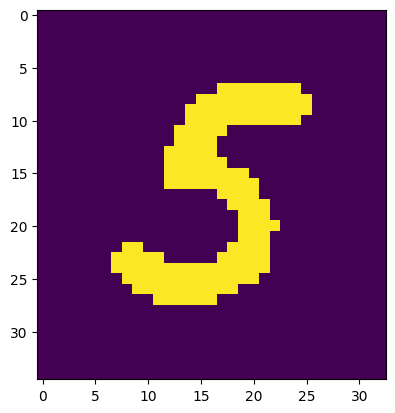

perimeter 89.01219236850739
1/1 [==============================] - 0s 49ms/step
symbol 5


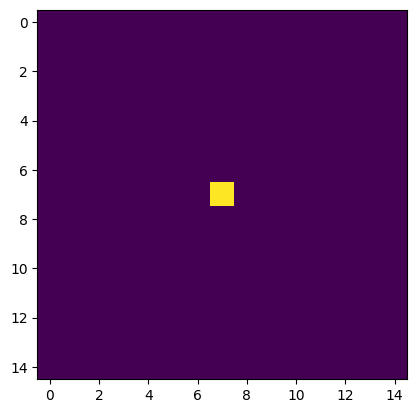

perimeter 0.0
here noise


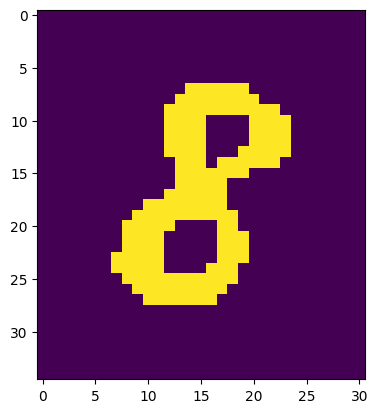

perimeter 65.11269772052765
1/1 [==============================] - 0s 55ms/step
symbol 8


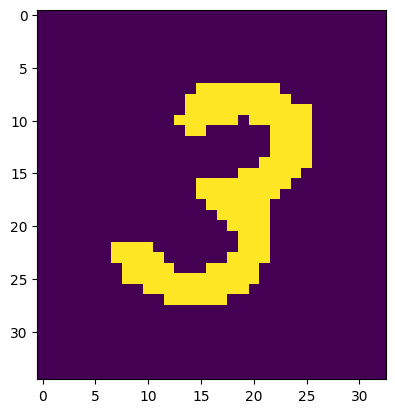

perimeter 93.25483310222626
1/1 [==============================] - 0s 81ms/step
symbol 3


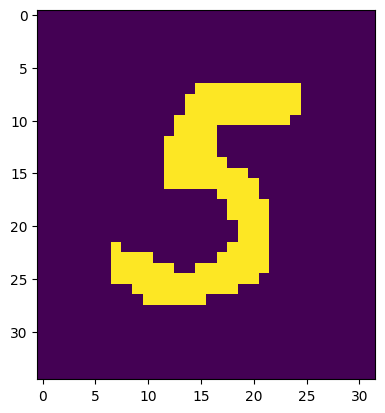

perimeter 89.94112479686737
1/1 [==============================] - 0s 47ms/step
symbol 5


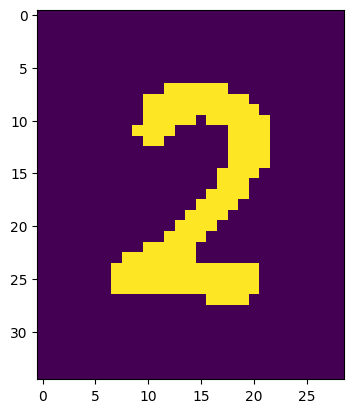

perimeter 86.42640602588654
1/1 [==============================] - 0s 44ms/step
symbol 2


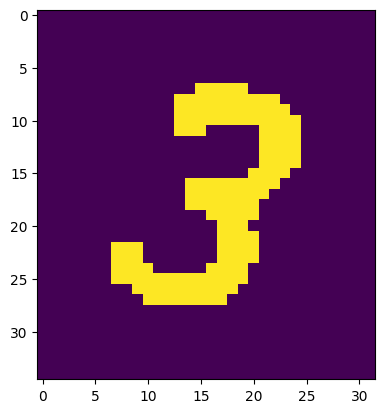

perimeter 91.35533845424652
1/1 [==============================] - 0s 49ms/step
symbol 23


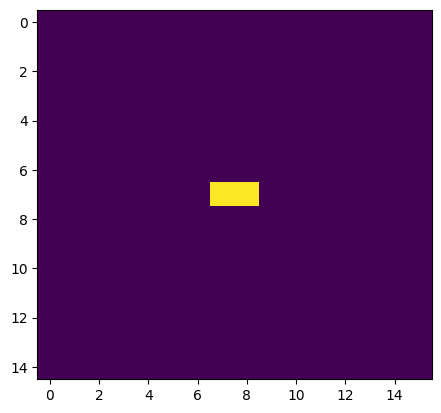

perimeter 2.0
here noise


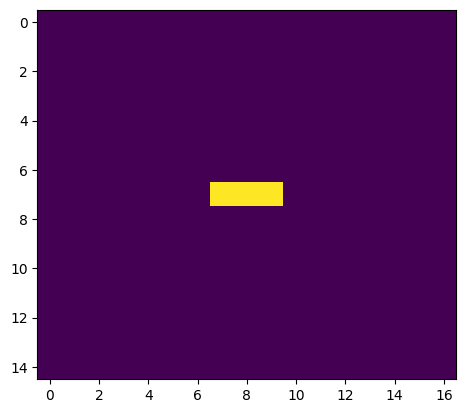

perimeter 4.0
here noise


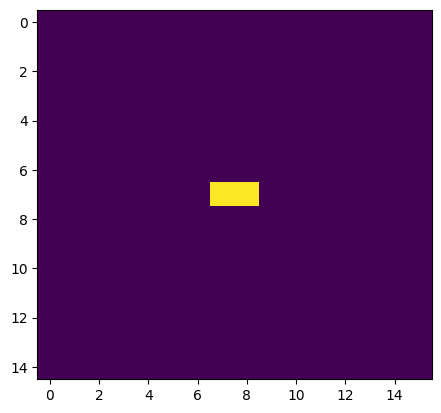

perimeter 2.0
here noise


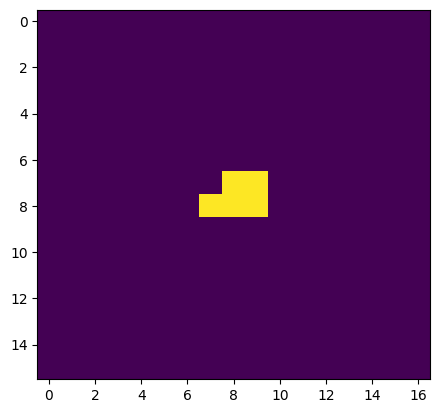

perimeter 5.414213538169861
here noise


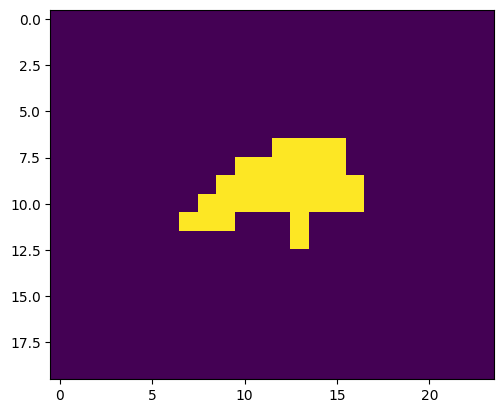

perimeter 25.313708186149597
here noise
[5, 0, 8, 3, 5, 23, 0]


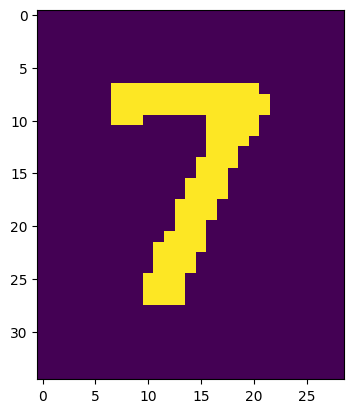

perimeter 72.04163014888763
1/1 [==============================] - 0s 50ms/step
symbol 7


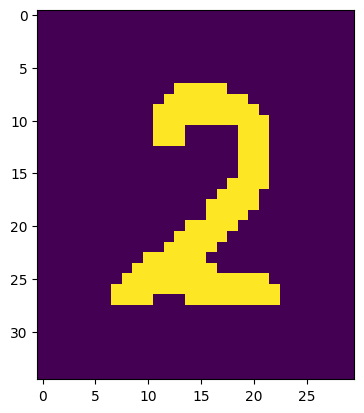

perimeter 87.59797883033752
1/1 [==============================] - 0s 57ms/step
symbol 72


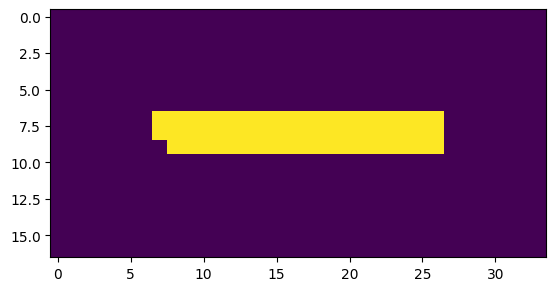

perimeter 41.41421353816986
here minus


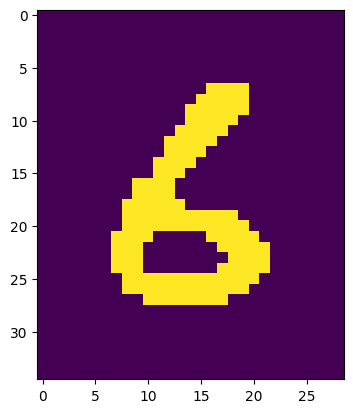

perimeter 67.3553386926651
1/1 [==============================] - 0s 54ms/step
symbol -6


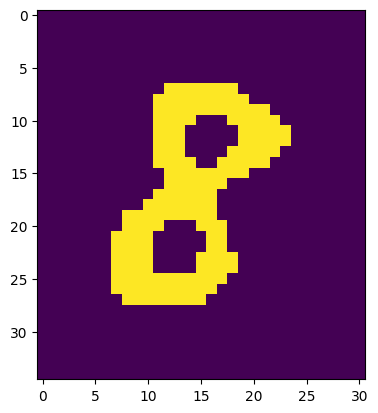

perimeter 65.6984840631485
1/1 [==============================] - 0s 35ms/step
symbol 8


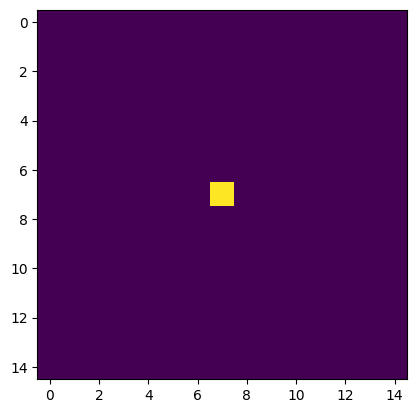

perimeter 0.0
here noise


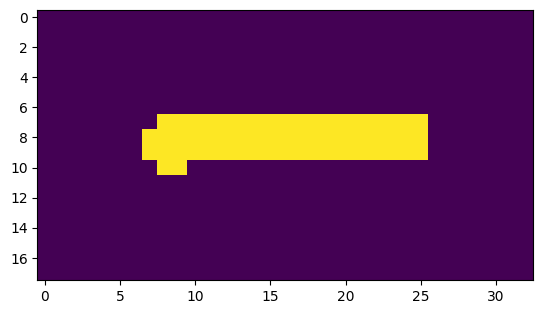

perimeter 40.24264061450958
here minus


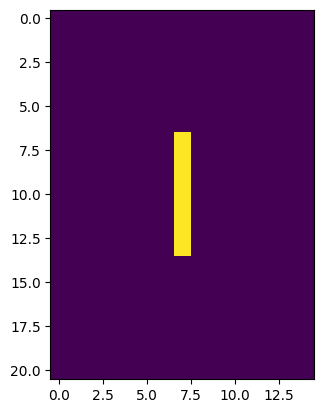

perimeter 12.0
here noise


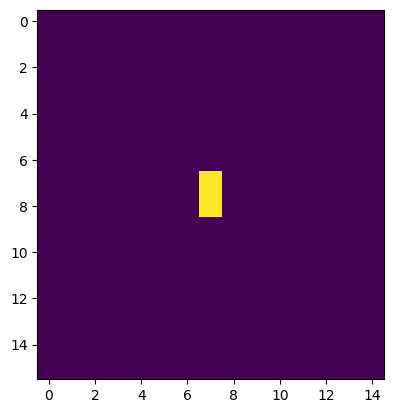

perimeter 2.0
here noise


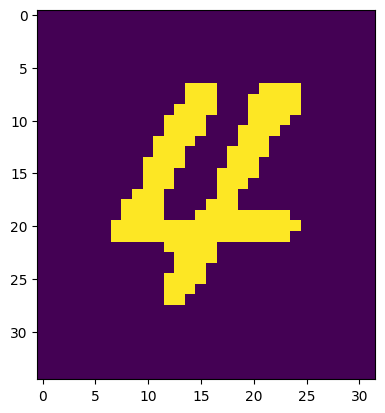

perimeter 102.91168713569641
1/1 [==============================] - 0s 69ms/step
symbol -4


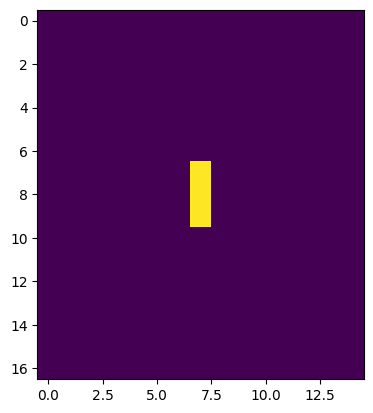

perimeter 4.0
here noise


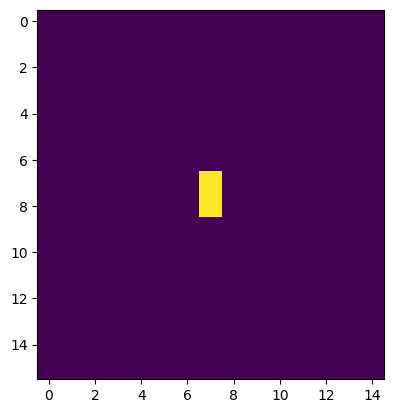

perimeter 2.0
here noise


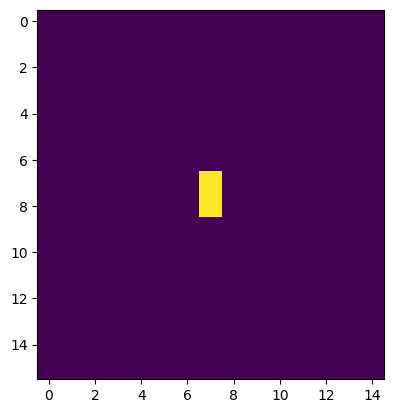

perimeter 2.0
here noise


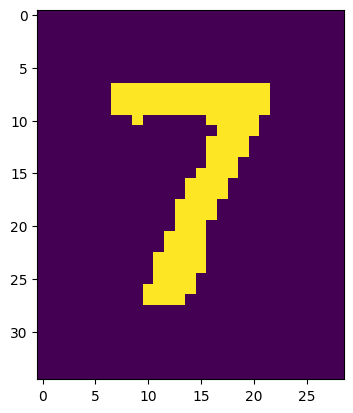

perimeter 72.87005722522736
1/1 [==============================] - 0s 45ms/step
symbol 7


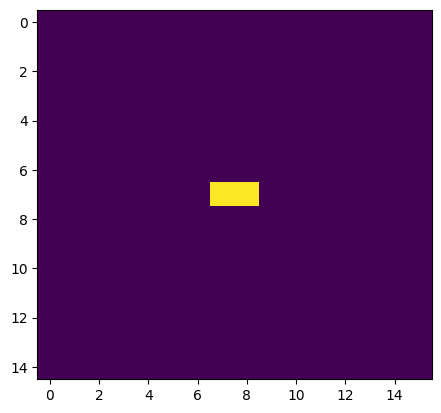

perimeter 2.0
here noise


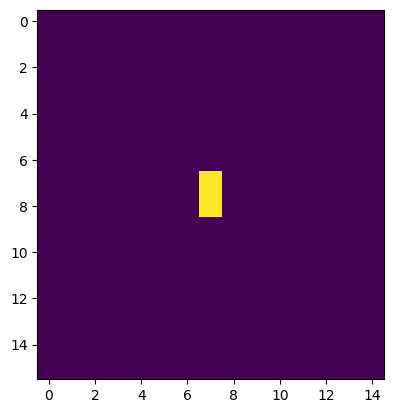

perimeter 2.0
here noise


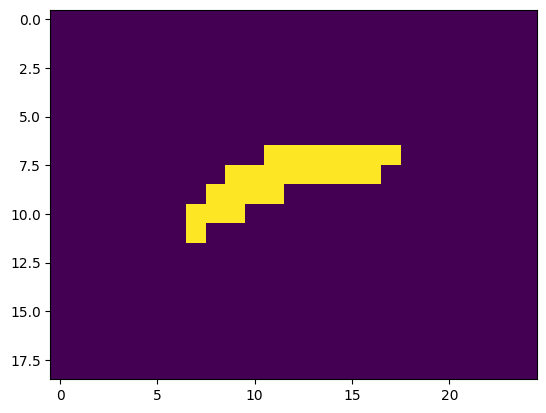

perimeter 23.899494767189026
here noise


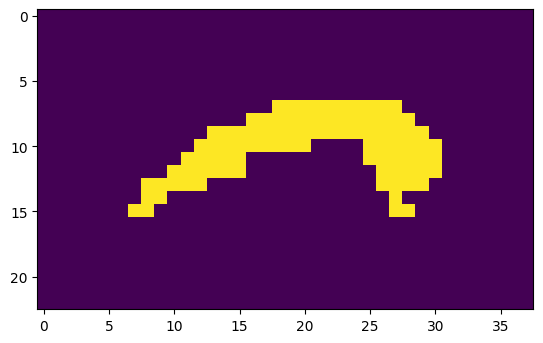

perimeter 63.69848418235779
here minus


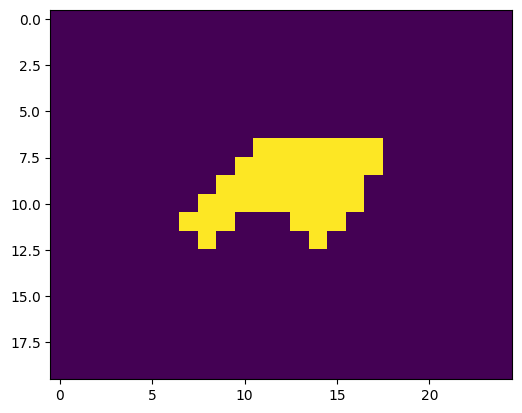

perimeter 26.97056245803833
here noise
[72, -6, 8, -4, 0, 0, 0, 7, 0]


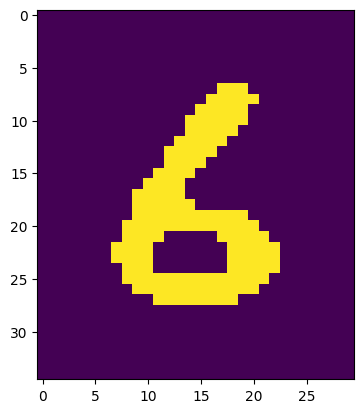

perimeter 67.01219201087952
1/1 [==============================] - 0s 39ms/step
symbol 6


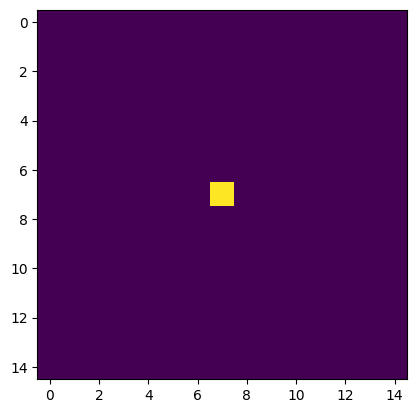

perimeter 0.0
here noise


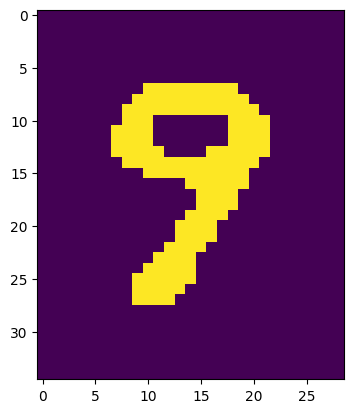

perimeter 65.35533833503723
1/1 [==============================] - 0s 37ms/step
symbol 9


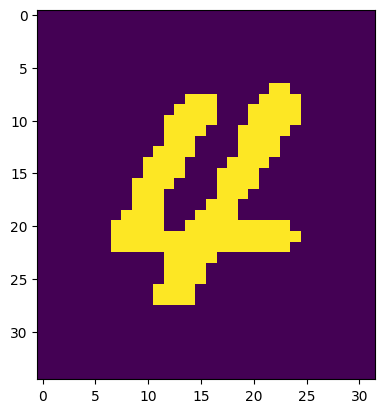

perimeter 102.32590091228485
1/1 [==============================] - 0s 51ms/step
symbol 4


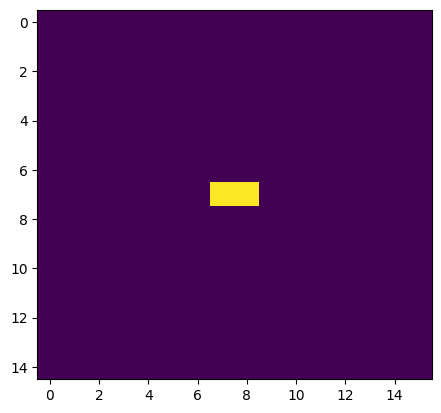

perimeter 2.0
here noise


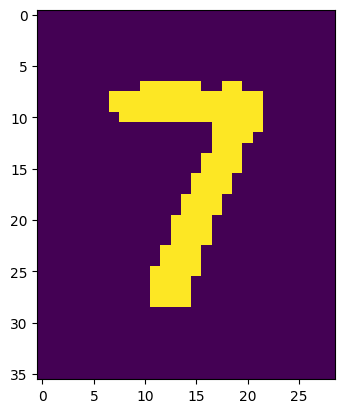

perimeter 72.87005722522736
1/1 [==============================] - 0s 36ms/step
symbol 7


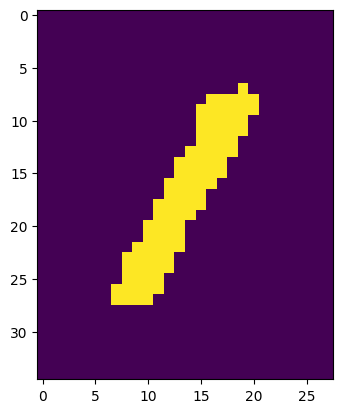

perimeter 53.69848430156708
1/1 [==============================] - 0s 34ms/step
symbol 1


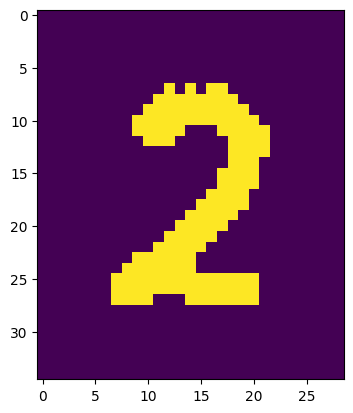

perimeter 86.91168773174286
1/1 [==============================] - 0s 35ms/step
symbol 12
[6, 9, 4, 0, 7, 12]


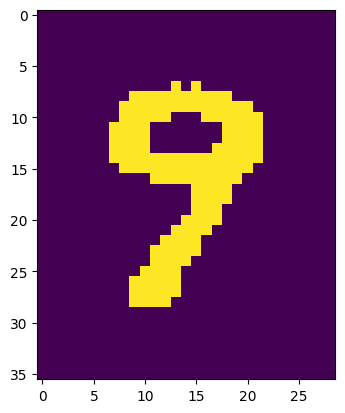

perimeter 68.76955187320709
1/1 [==============================] - 0s 46ms/step
symbol 9


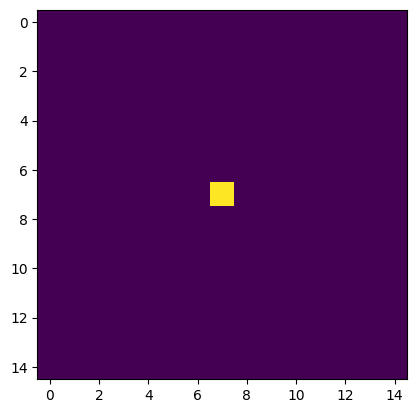

perimeter 0.0
here noise


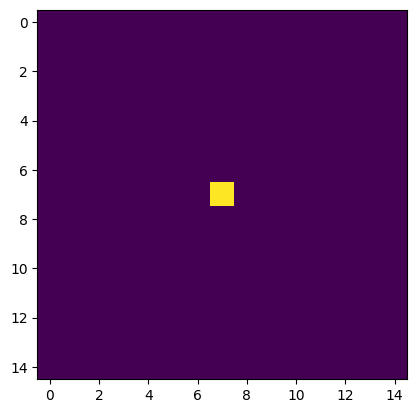

perimeter 0.0
here noise


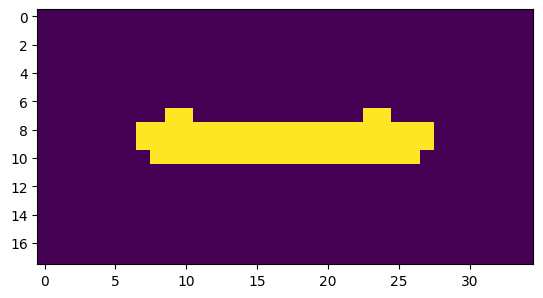

perimeter 44.485281229019165
here minus


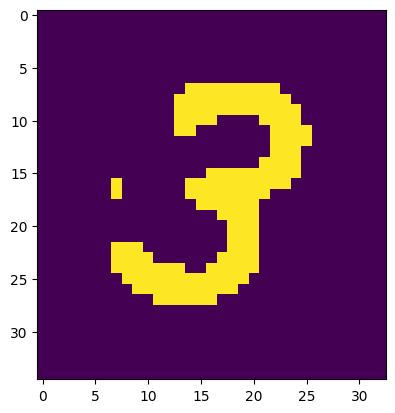

perimeter 94.42640602588654
1/1 [==============================] - 0s 37ms/step
symbol -3


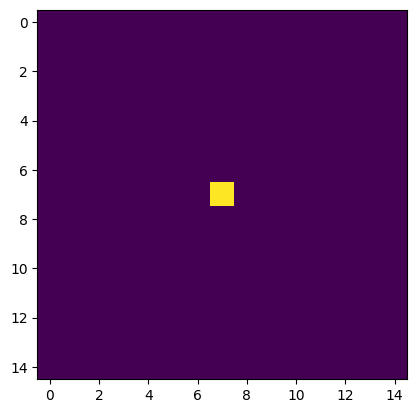

perimeter 0.0
here noise


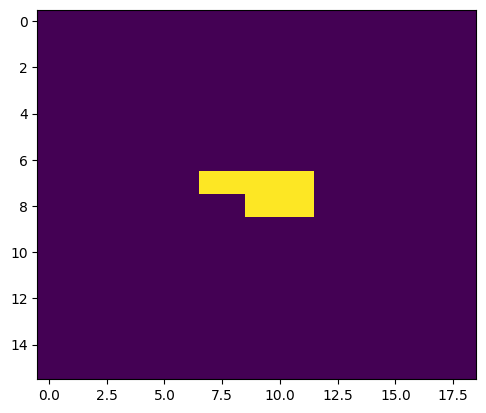

perimeter 9.41421353816986
here noise


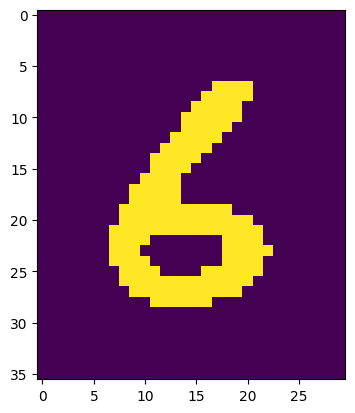

perimeter 69.59797859191895
1/1 [==============================] - 0s 35ms/step
symbol 6


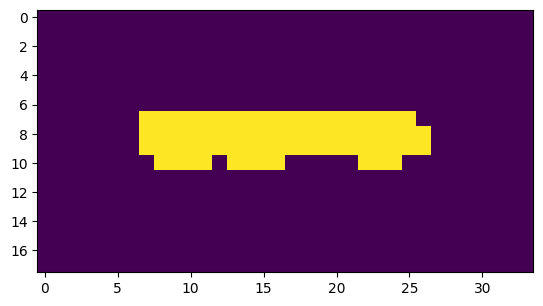

perimeter 43.899494767189026
here minus


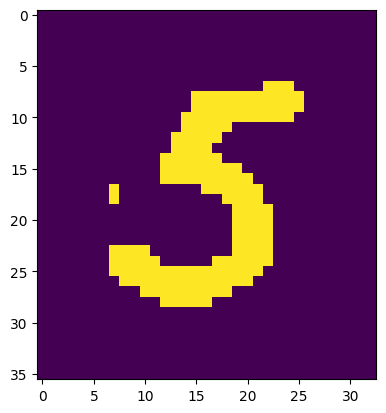

perimeter 91.59797894954681
1/1 [==============================] - 0s 35ms/step
symbol 6-5


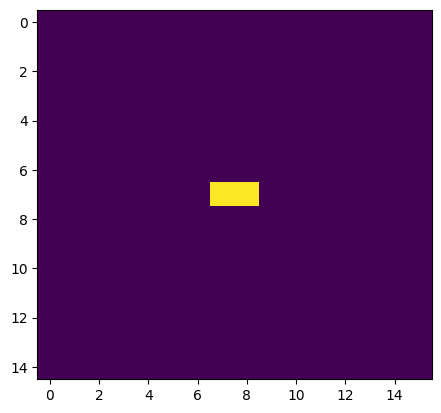

perimeter 2.0
here noise


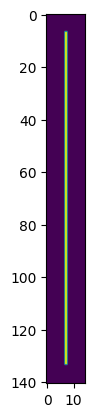

perimeter 252.0
1/1 [==============================] - 0s 34ms/step
symbol 6-51


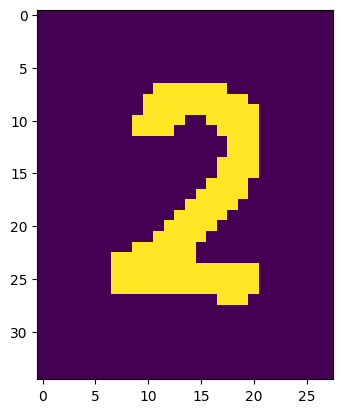

perimeter 84.18376588821411
1/1 [==============================] - 0s 34ms/step
symbol 6-512


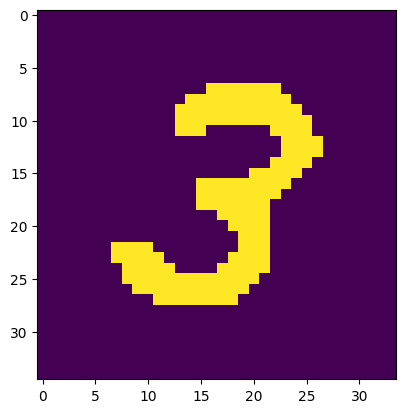

perimeter 95.25483274459839
1/1 [==============================] - 0s 35ms/step
symbol 6-5123


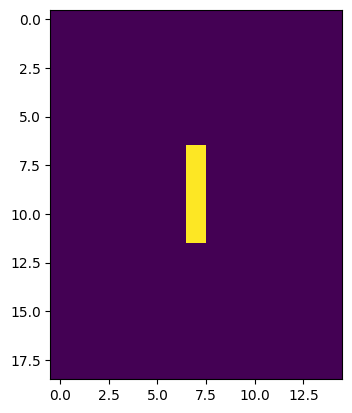

perimeter 8.0
here noise
[9, 0, 0, -3, 0, 0]


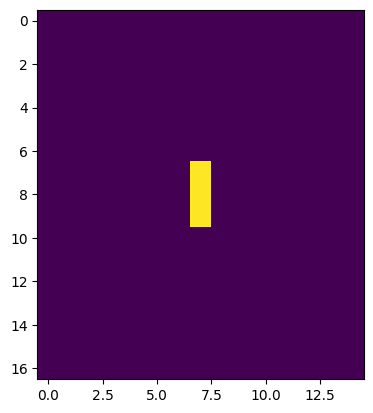

perimeter 4.0
here noise


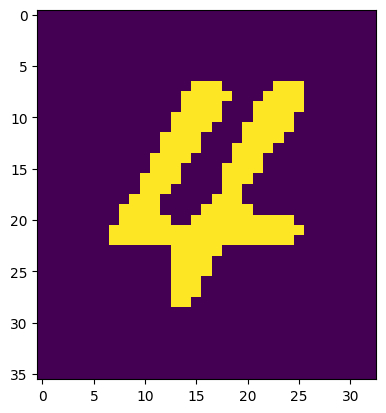

perimeter 107.39696848392487
1/1 [==============================] - 0s 35ms/step
symbol 4


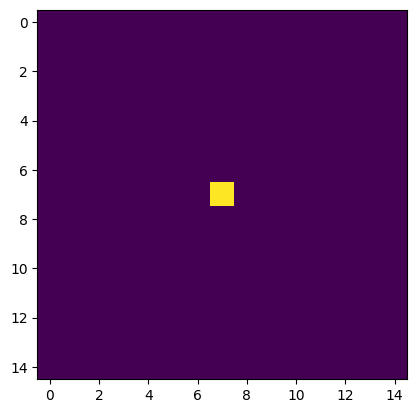

perimeter 0.0
here noise


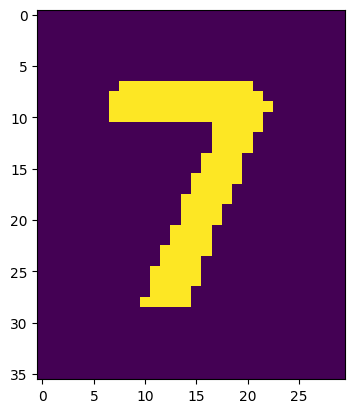

perimeter 74.87005722522736
1/1 [==============================] - 0s 33ms/step
symbol 47


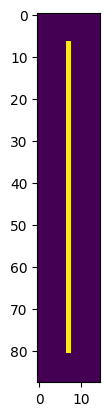

perimeter 146.0
1/1 [==============================] - 0s 34ms/step
symbol 471


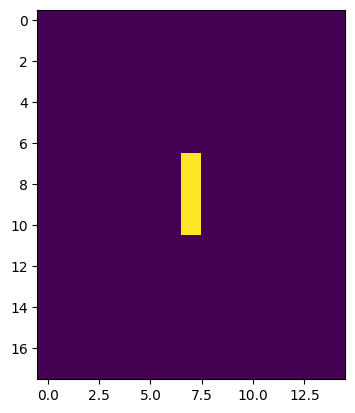

perimeter 6.0
here noise


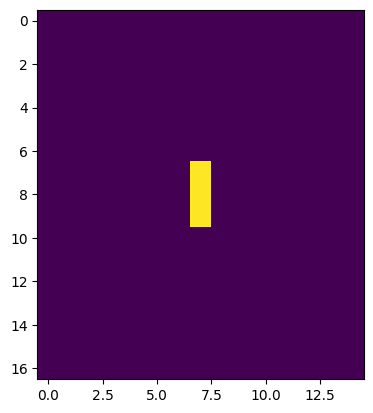

perimeter 4.0
here noise


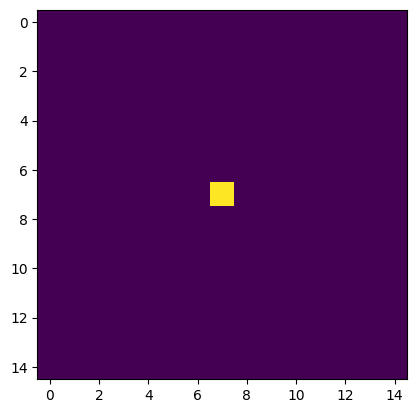

perimeter 0.0
here noise


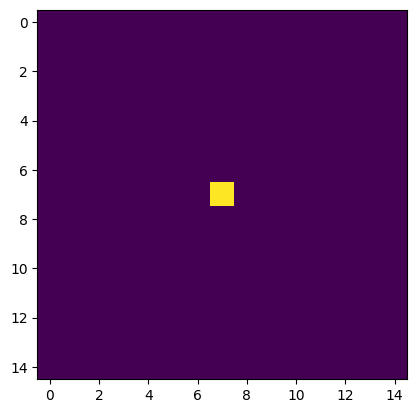

perimeter 0.0
here noise


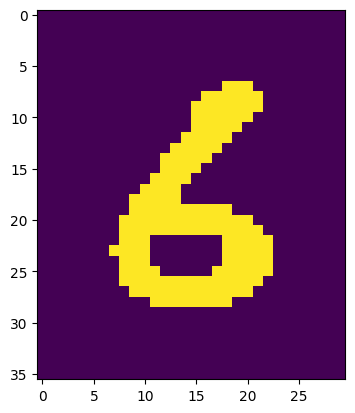

perimeter 71.01219236850739
1/1 [==============================] - 0s 38ms/step
symbol 6


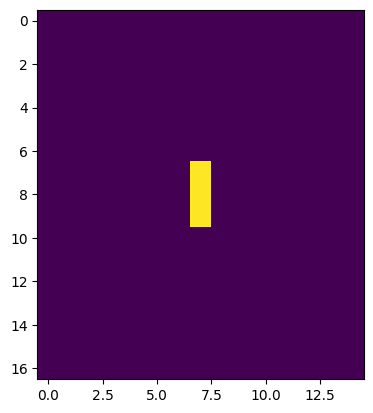

perimeter 4.0
here noise


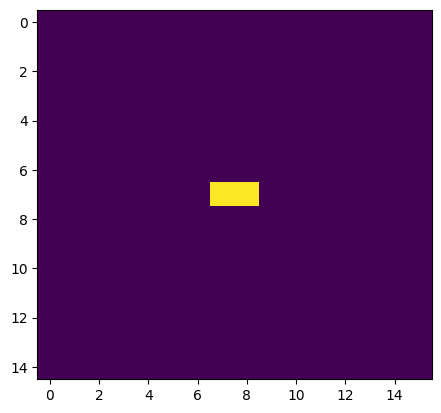

perimeter 2.0
here noise


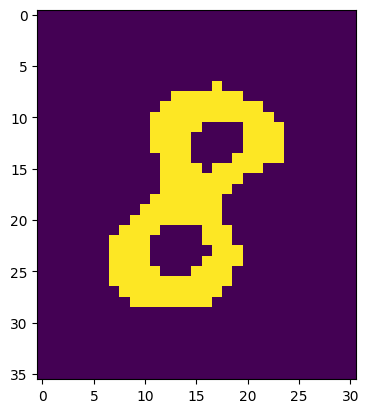

perimeter 65.94112491607666
1/1 [==============================] - 0s 45ms/step
symbol 8


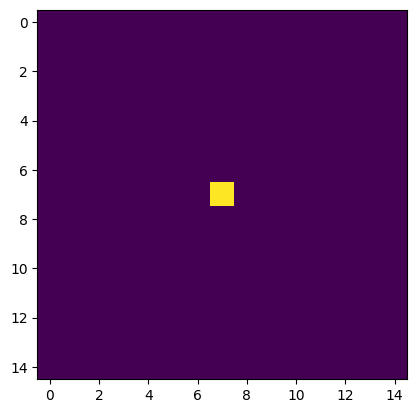

perimeter 0.0
here noise


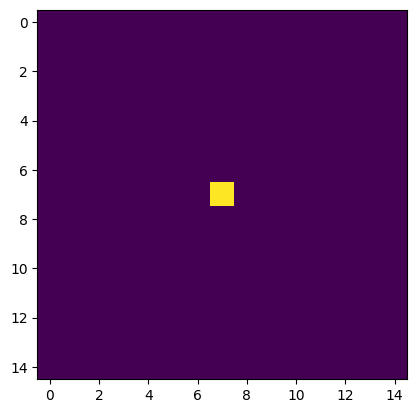

perimeter 0.0
here noise


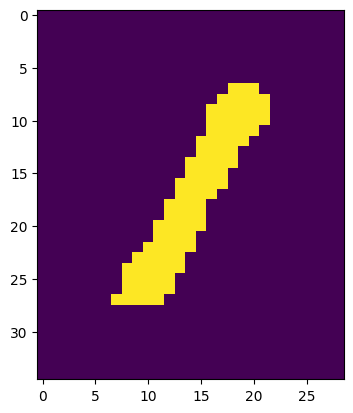

perimeter 55.11269760131836
1/1 [==============================] - 0s 36ms/step
symbol 1


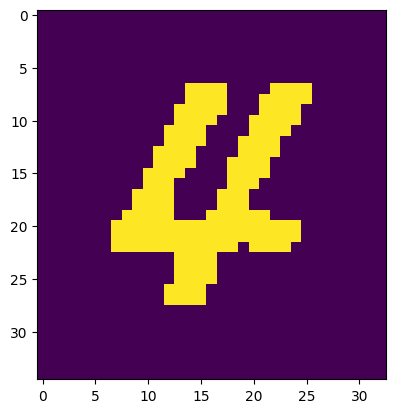

perimeter 105.49747383594513
1/1 [==============================] - 0s 38ms/step
symbol 14


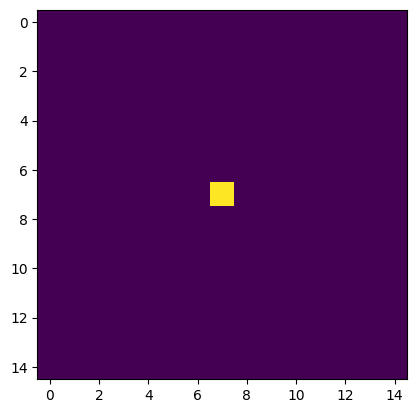

perimeter 0.0
here noise


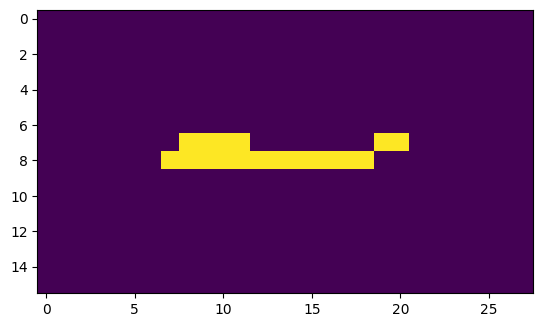

perimeter 27.656854152679443
here noise


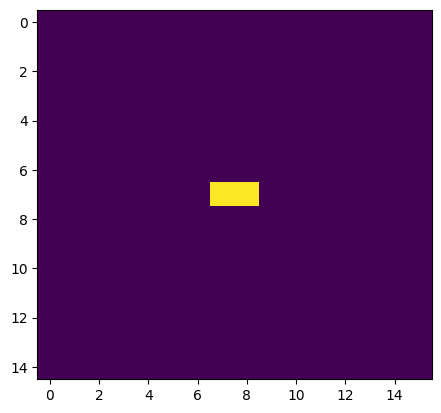

perimeter 2.0
here noise


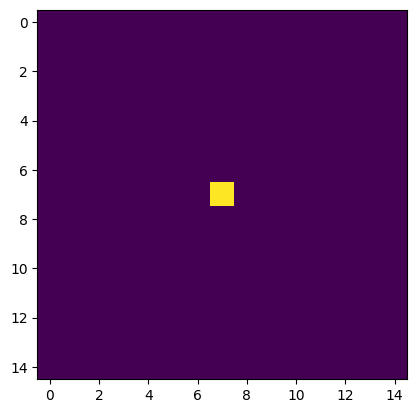

perimeter 0.0
here noise


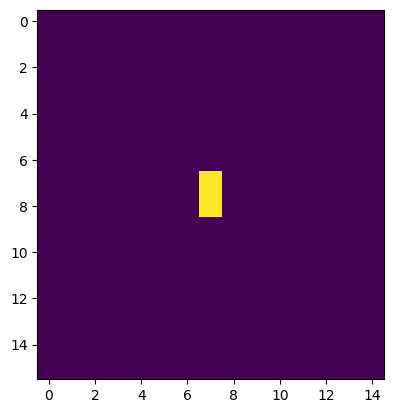

perimeter 2.0
here noise


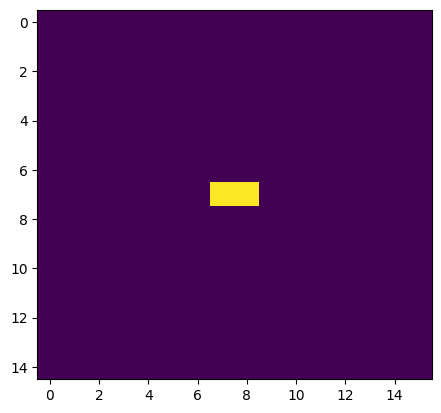

perimeter 2.0
here noise


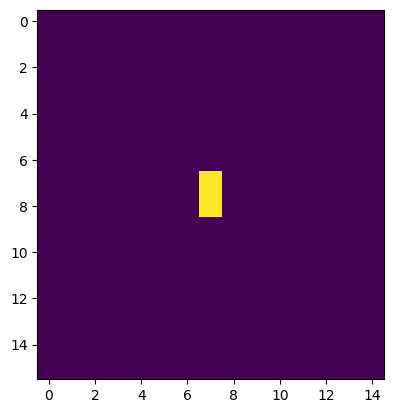

perimeter 2.0
here noise
[471, 0, 0, 0, 6, 8, 14, 0]


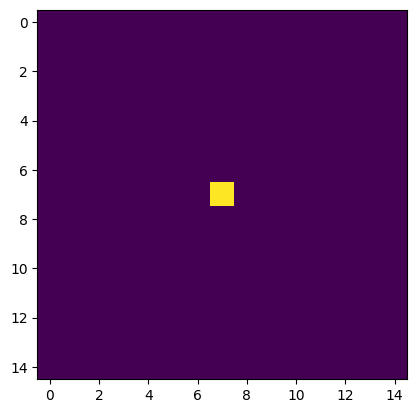

perimeter 0.0
here noise


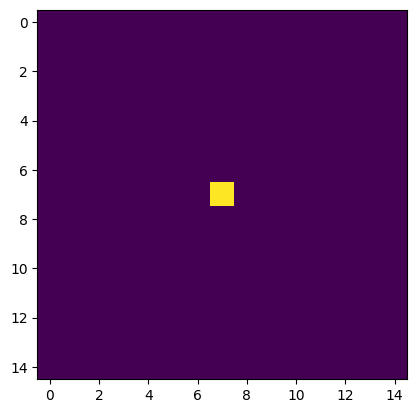

perimeter 0.0
here noise


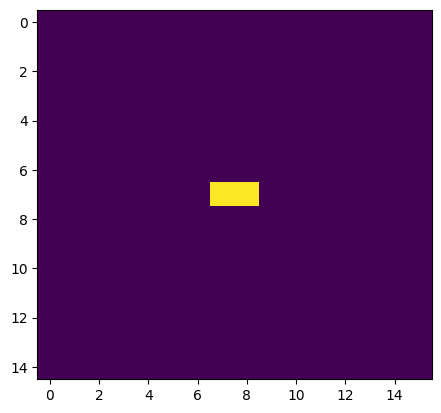

perimeter 2.0
here noise


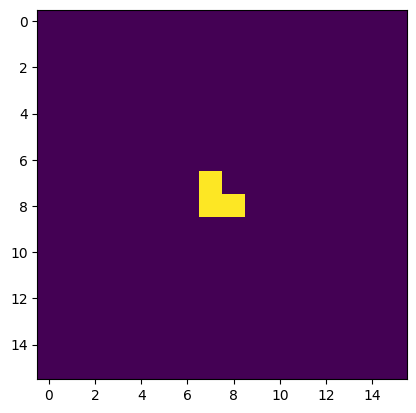

perimeter 3.414213538169861
here noise


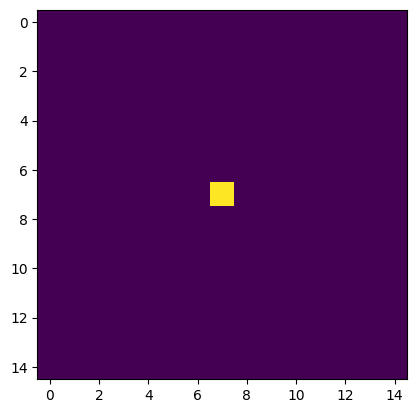

perimeter 0.0
here noise


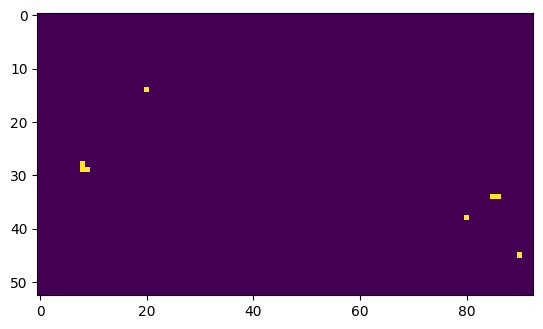

written_answer 0


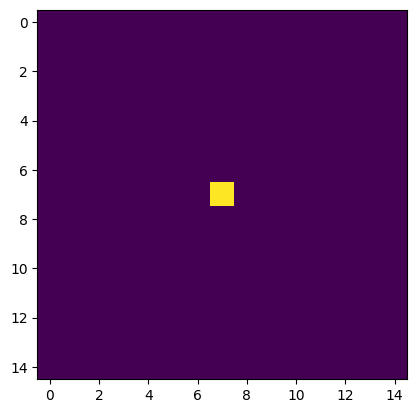

perimeter 0.0
here noise


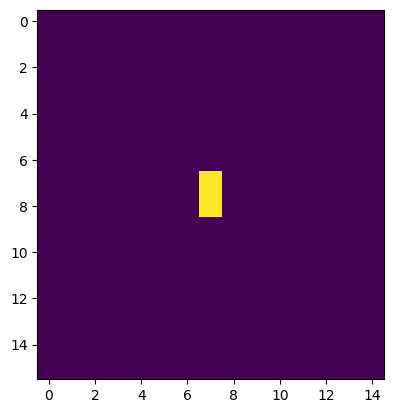

perimeter 2.0
here noise


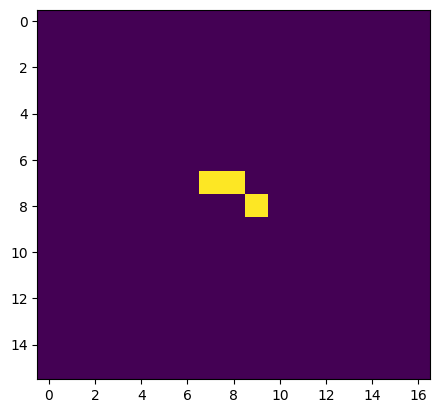

perimeter 4.828427076339722
here noise


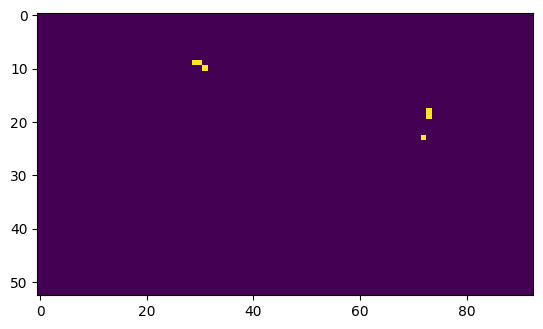

written_answer 0


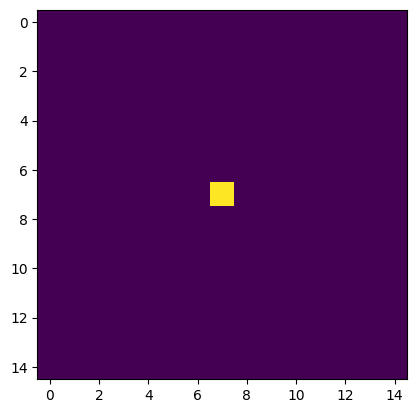

perimeter 0.0
here noise


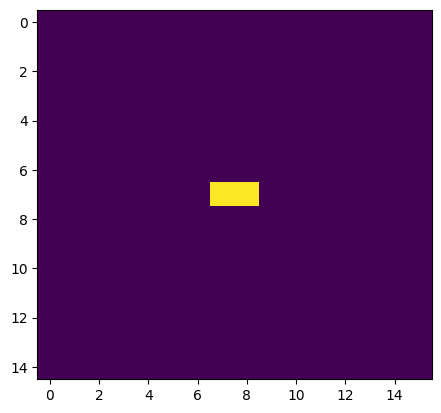

perimeter 2.0
here noise


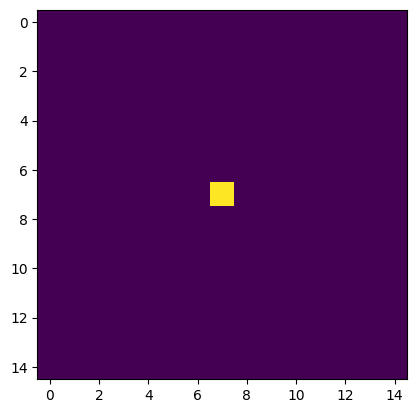

perimeter 0.0
here noise


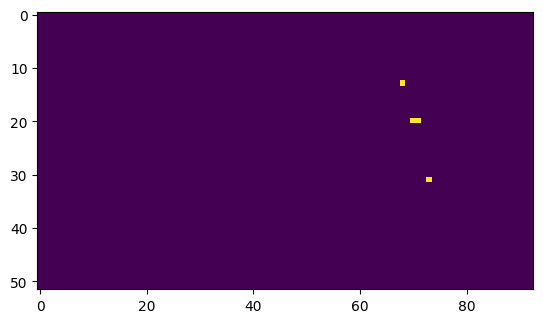

written_answer 0


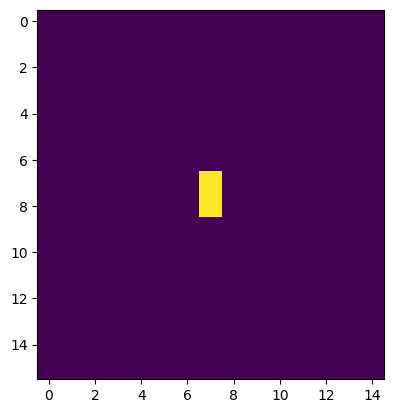

perimeter 2.0
here noise


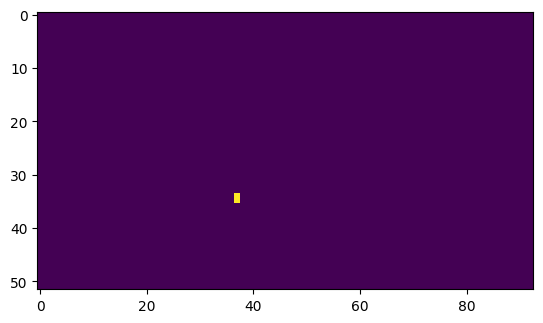

written_answer 0


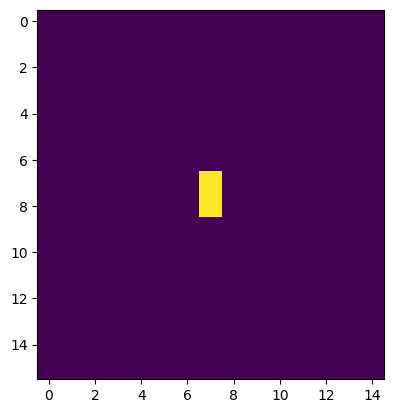

perimeter 2.0
here noise


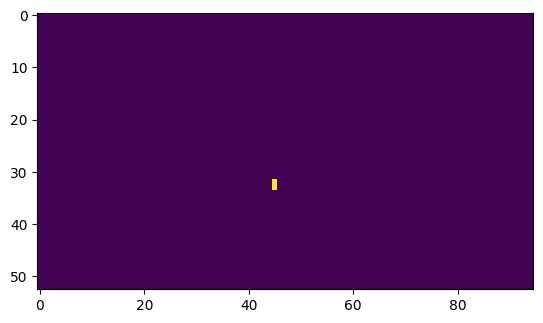

written_answer 0


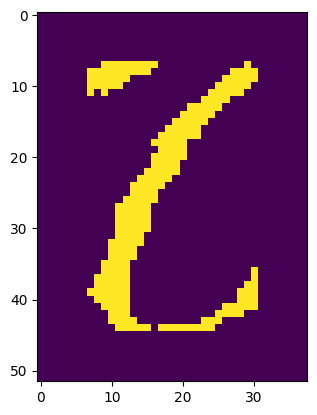

perimeter 101.63960921764374
1/1 [==============================] - 0s 38ms/step
symbol 8


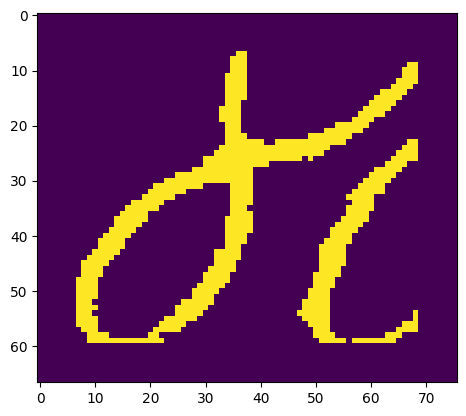

perimeter 220.30865442752838
here minus


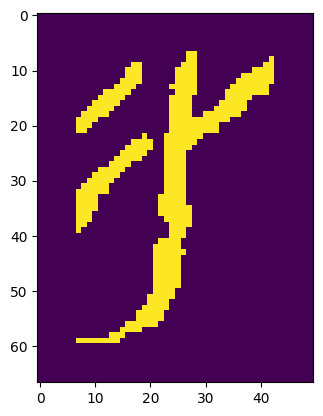

perimeter 177.53910374641418
1/1 [==============================] - 0s 33ms/step
symbol 8-2


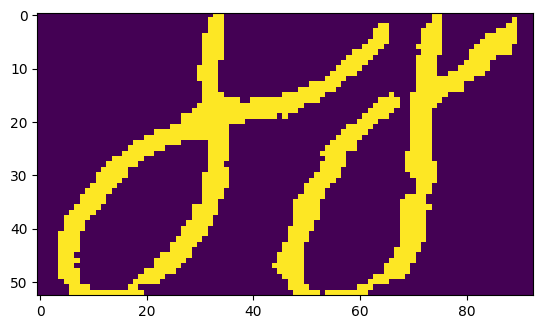

written_answer 0


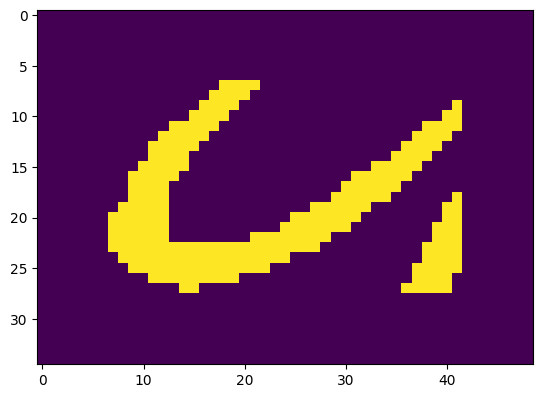

perimeter 122.36753153800964
here minus


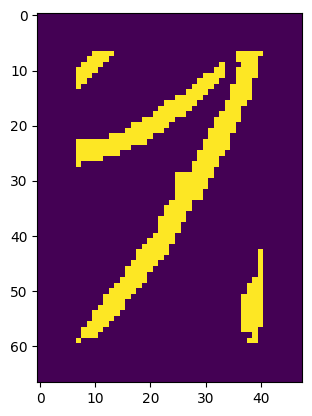

perimeter 137.43859887123108
1/1 [==============================] - 0s 33ms/step
symbol -2


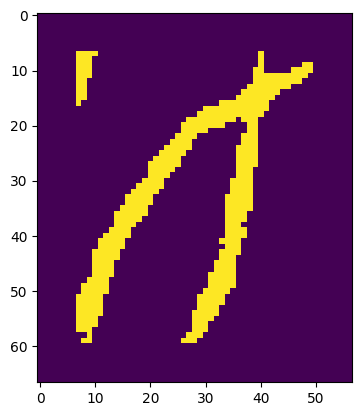

perimeter 249.52185833454132
1/1 [==============================] - 0s 35ms/step
symbol -24


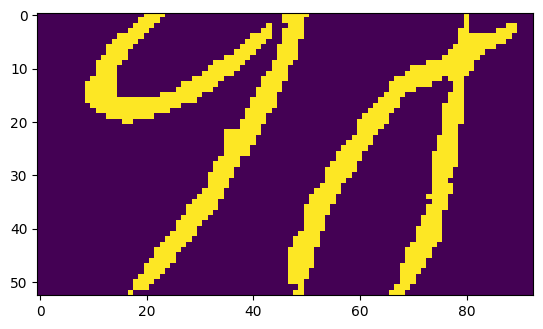

written_answer -24


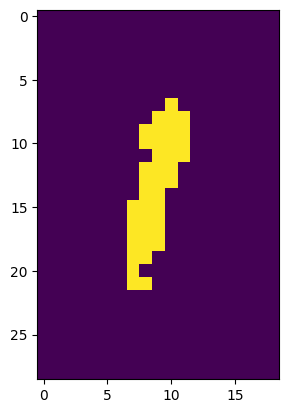

perimeter 33.55634891986847
1/1 [==============================] - 0s 33ms/step
symbol 1


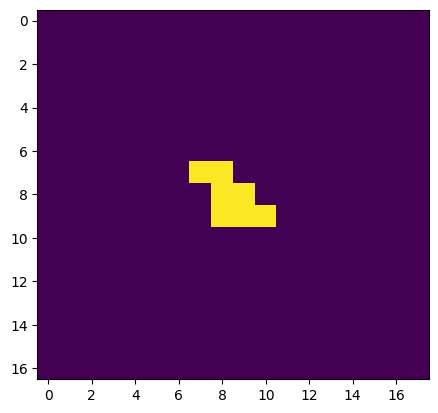

perimeter 8.242640614509583
here noise


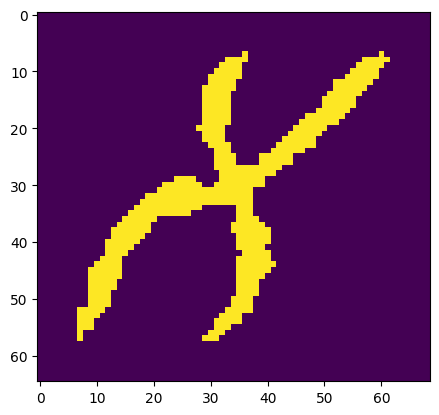

perimeter 276.9777019023895
here minus


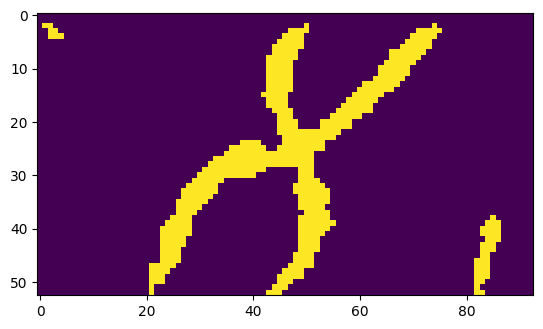

written_answer 0


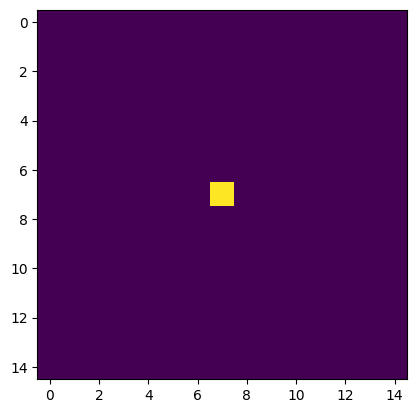

perimeter 0.0
here noise


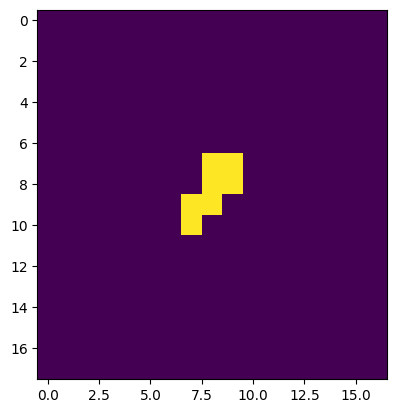

perimeter 8.242640614509583
here noise


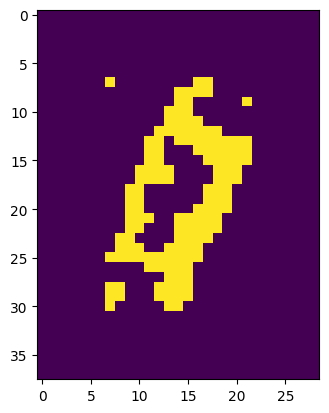

perimeter 66.5269113779068
1/1 [==============================] - 0s 34ms/step
symbol 9


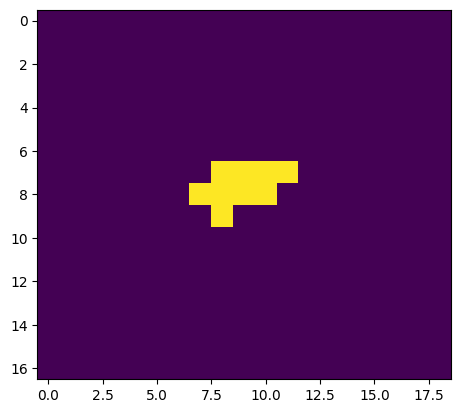

perimeter 9.656854152679443
here noise


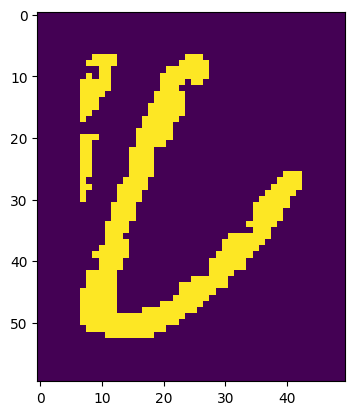

perimeter 202.651801943779
1/1 [==============================] - 0s 46ms/step
symbol 90


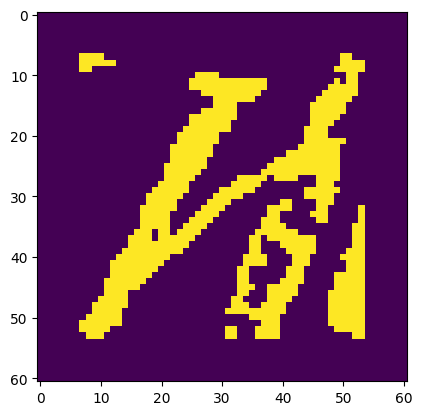

perimeter 253.32084822654724
1/1 [==============================] - 0s 40ms/step
symbol 902


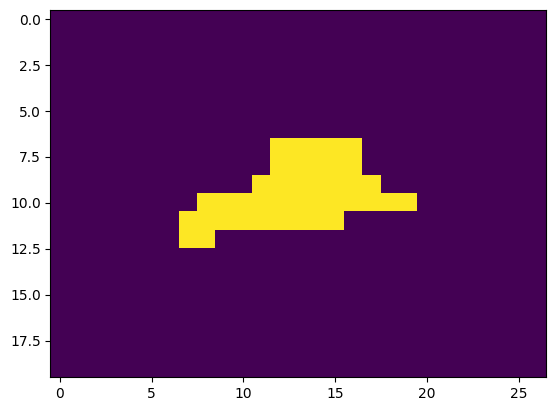

perimeter 29.899494767189026
here noise


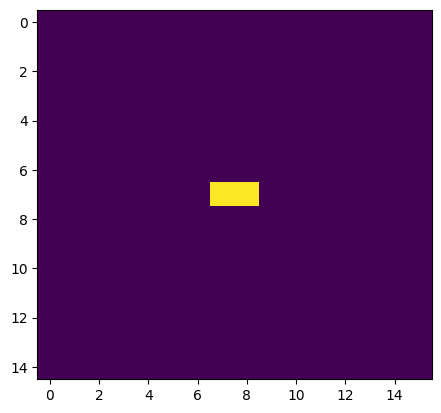

perimeter 2.0
here noise


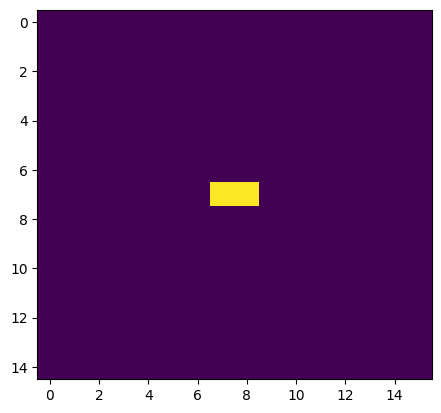

perimeter 2.0
here noise


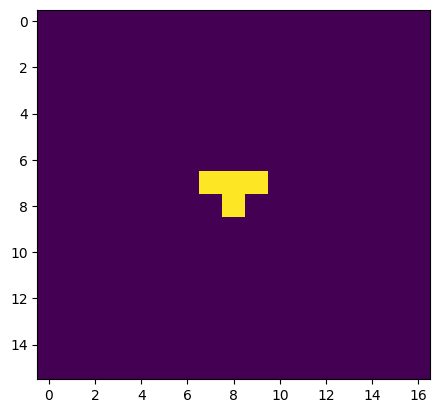

perimeter 4.828427076339722
here noise


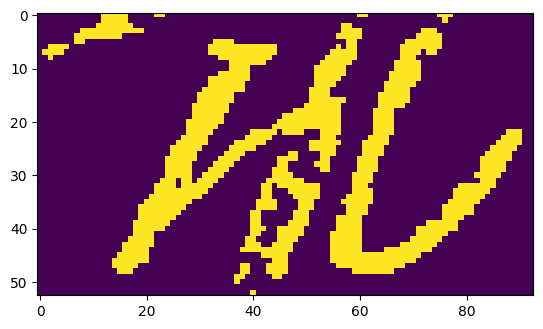

written_answer 902


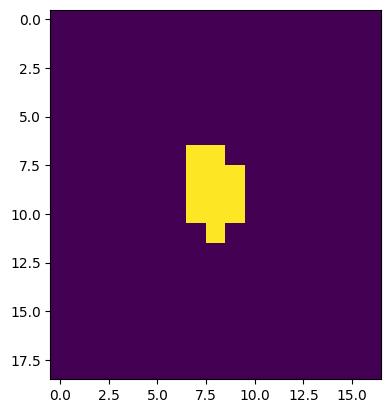

perimeter 10.242640614509583
here noise


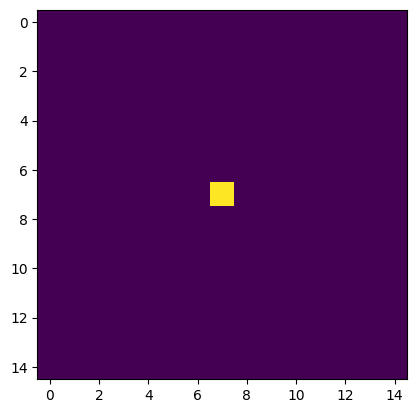

perimeter 0.0
here noise


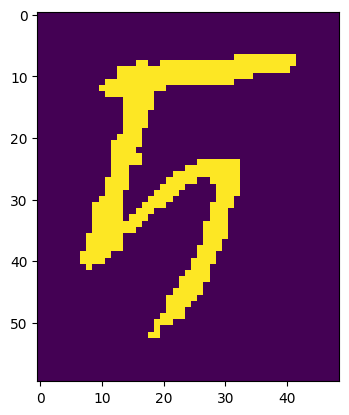

perimeter 236.06601524353027
1/1 [==============================] - 0s 46ms/step
symbol 5


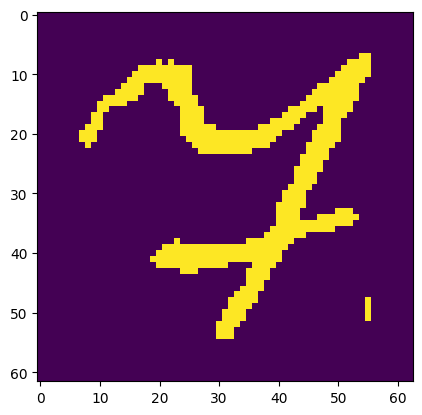

perimeter 288.9777021408081
here minus


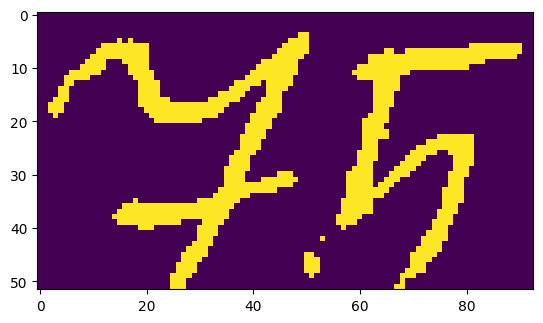

written_answer 0


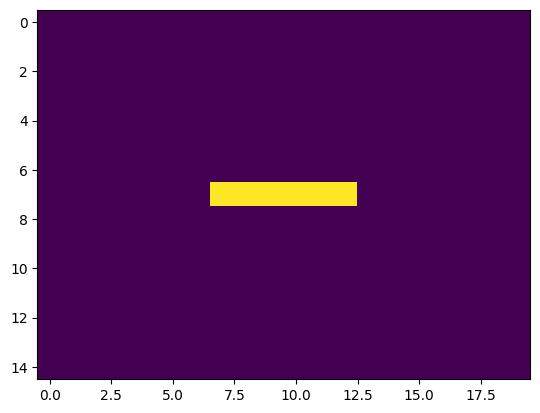

perimeter 10.0
here noise


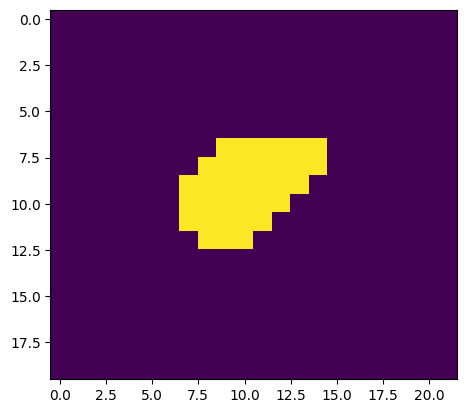

perimeter 19.899494767189026
here noise


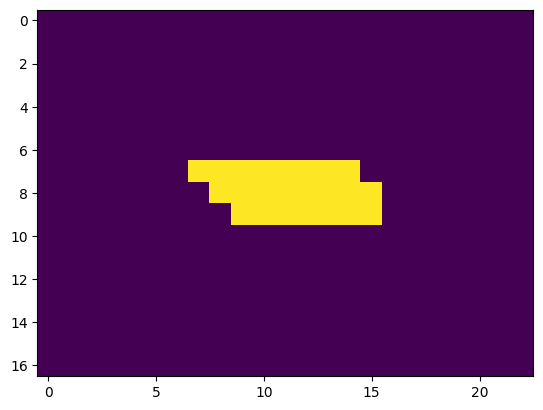

perimeter 18.242640614509583
here noise


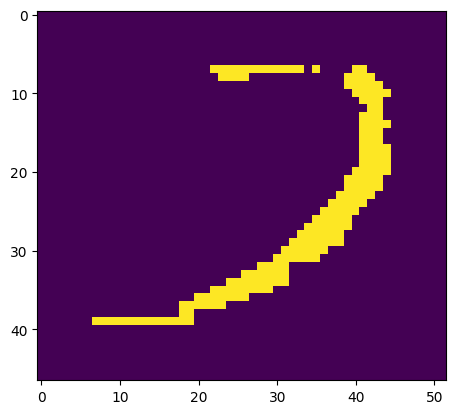

perimeter 122.81118214130402
here minus


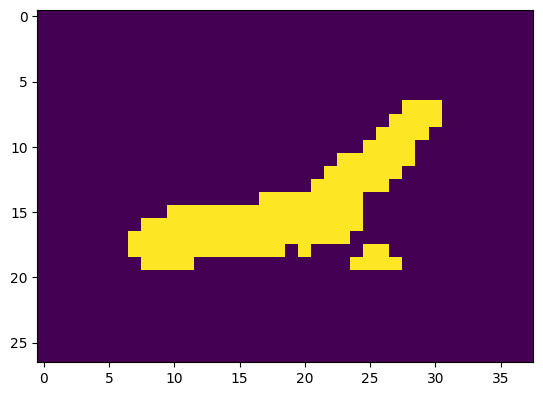

perimeter 59.69848418235779
here minus


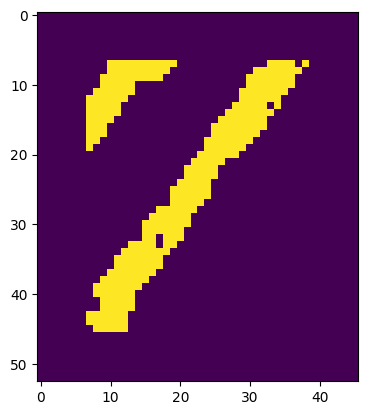

perimeter 111.5391035079956
1/1 [==============================] - 0s 134ms/step
symbol --1


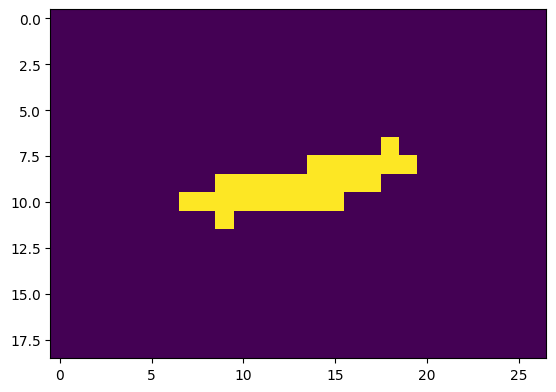

perimeter 27.313708305358887
here noise


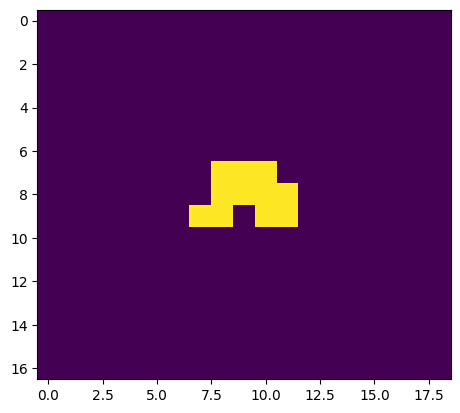

perimeter 11.656854152679443
here noise


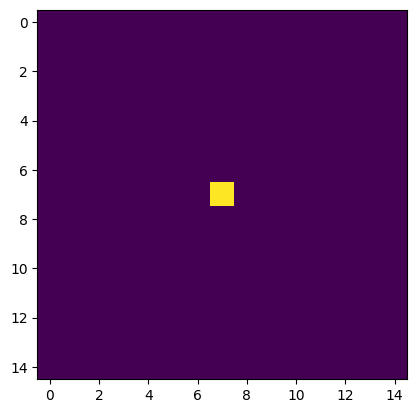

perimeter 0.0
here noise


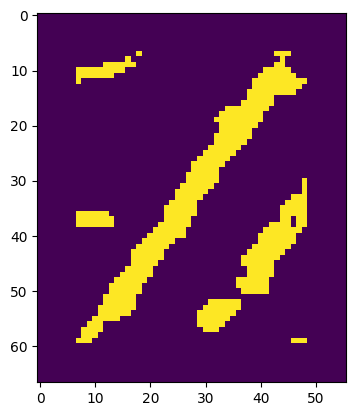

perimeter 149.23758745193481
1/1 [==============================] - 0s 43ms/step
symbol --13


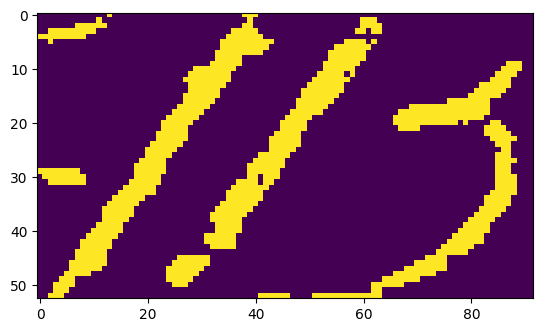

written_answer 0


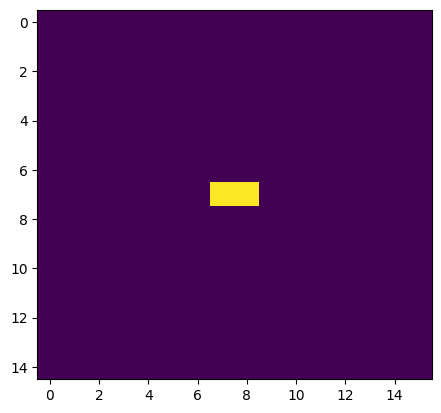

perimeter 2.0
here noise


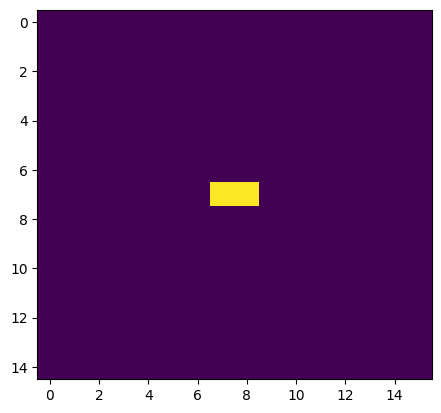

perimeter 2.0
here noise


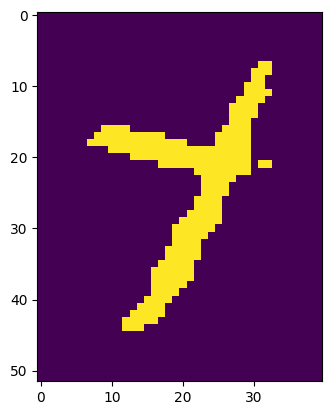

perimeter 127.05382251739502
1/1 [==============================] - 0s 34ms/step
symbol 7


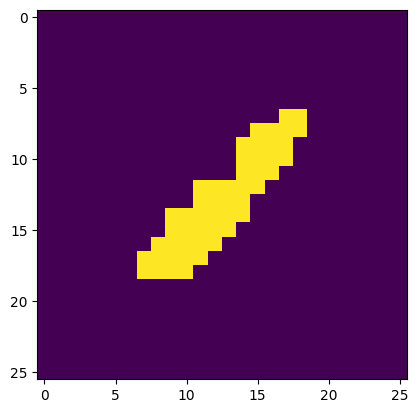

perimeter 35.79898941516876
1/1 [==============================] - 0s 50ms/step
symbol 71


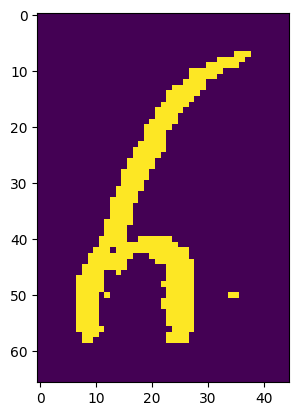

perimeter 194.16652071475983
1/1 [==============================] - 0s 41ms/step
symbol 716


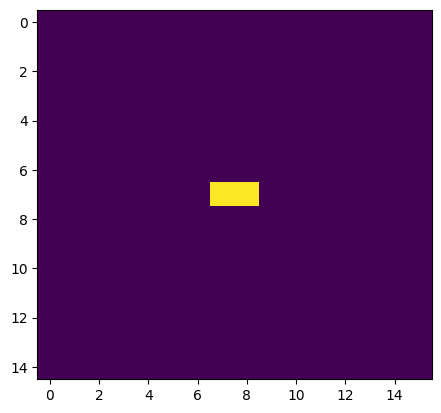

perimeter 2.0
here noise


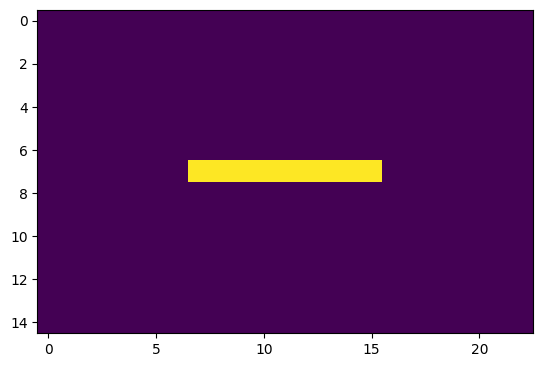

perimeter 16.0
here noise


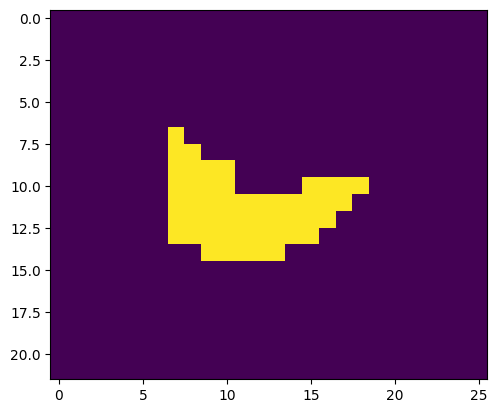

perimeter 32.72792172431946
here minus


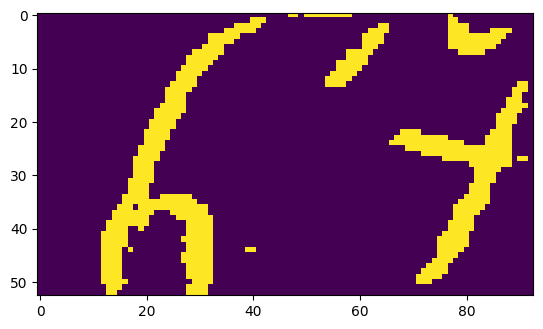

written_answer 0


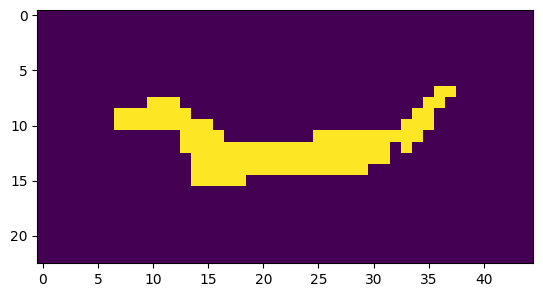

perimeter 74.28427076339722
here minus


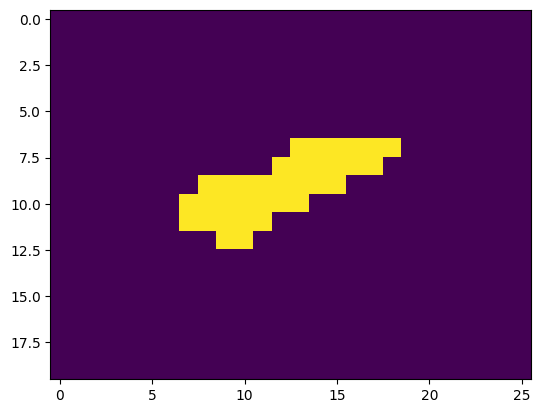

perimeter 26.727921843528748
here noise


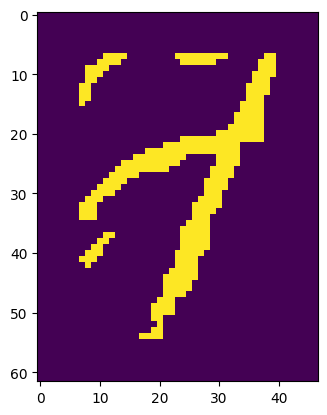

perimeter 174.61017191410065
1/1 [==============================] - 0s 37ms/step
symbol -7


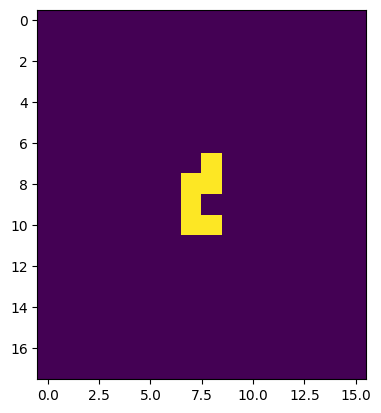

perimeter 8.242640614509583
here noise


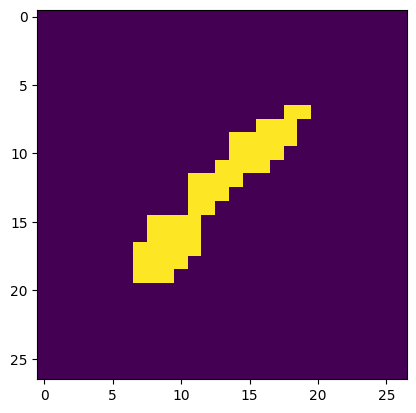

perimeter 39.21320307254791
1/1 [==============================] - 0s 37ms/step
symbol -71


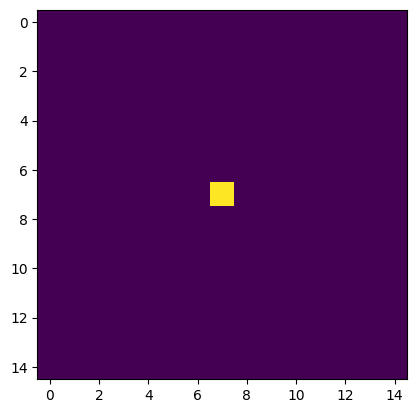

perimeter 0.0
here noise


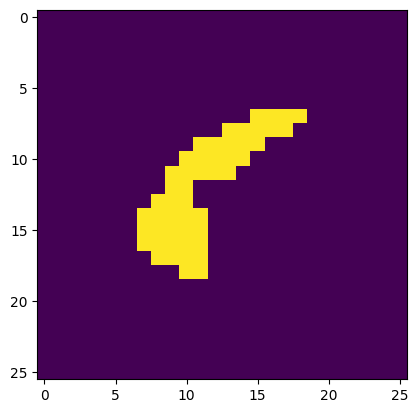

perimeter 37.79898941516876
1/1 [==============================] - 0s 40ms/step
symbol -715


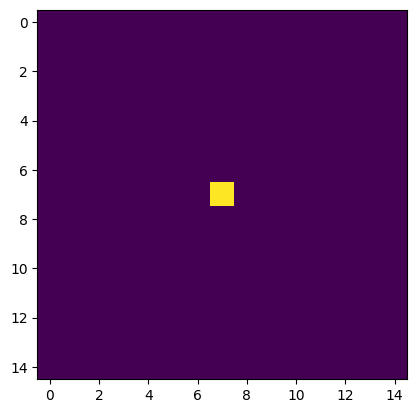

perimeter 0.0
here noise


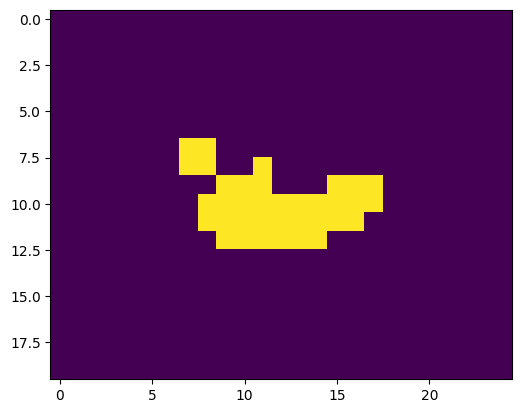

perimeter 30.727921843528748
here minus


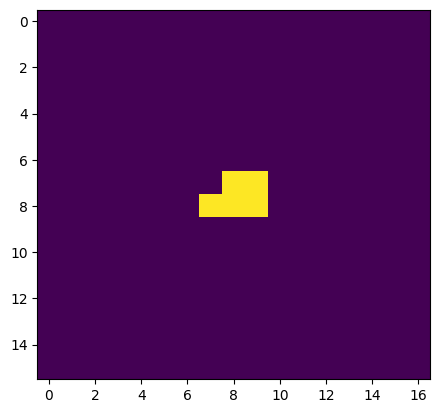

perimeter 5.414213538169861
here noise


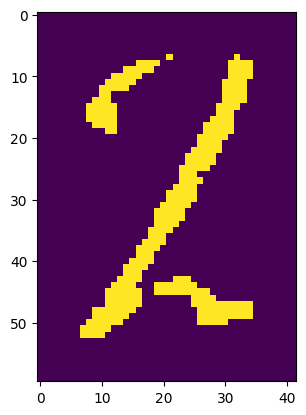

perimeter 118.12489008903503
1/1 [==============================] - 0s 43ms/step
symbol -715-1


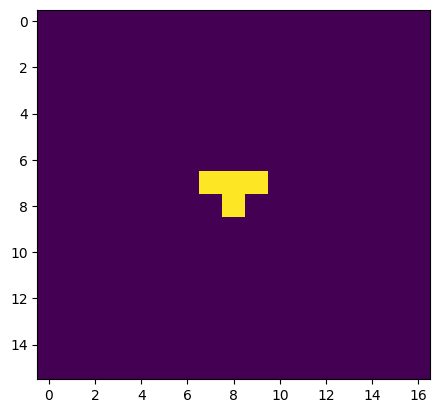

perimeter 4.828427076339722
here noise


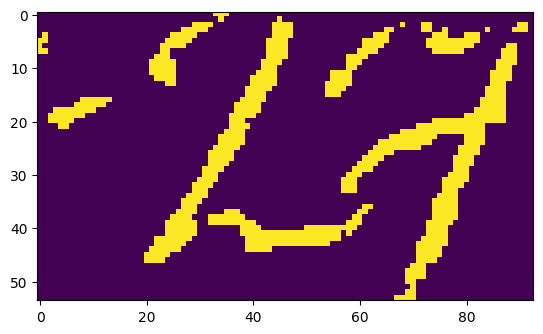

written_answer 0


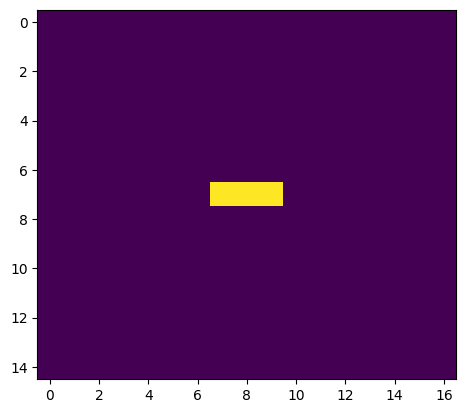

perimeter 4.0
here noise


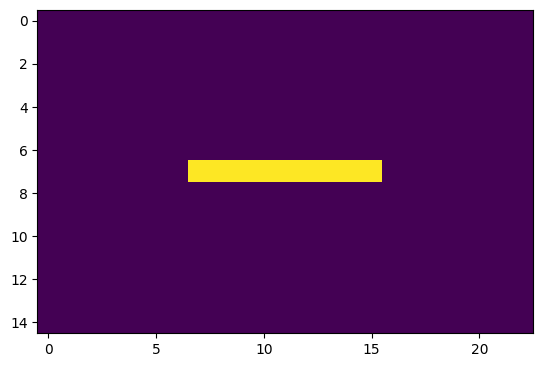

perimeter 16.0
here noise


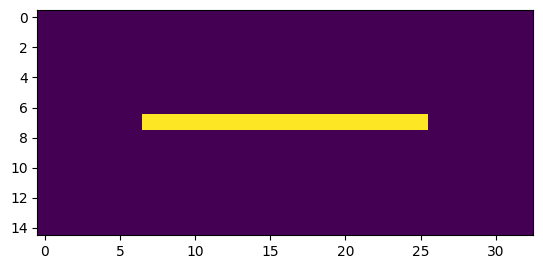

perimeter 36.0
here minus


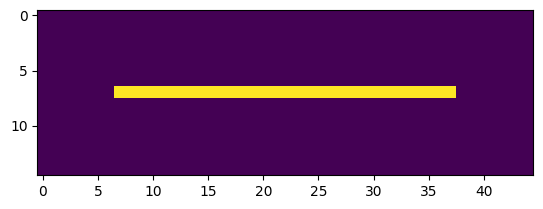

perimeter 60.0
here minus


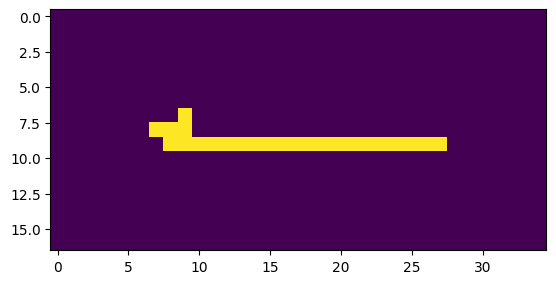

perimeter 42.24264061450958
here minus


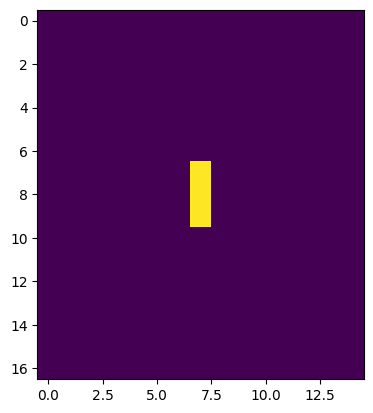

perimeter 4.0
here noise


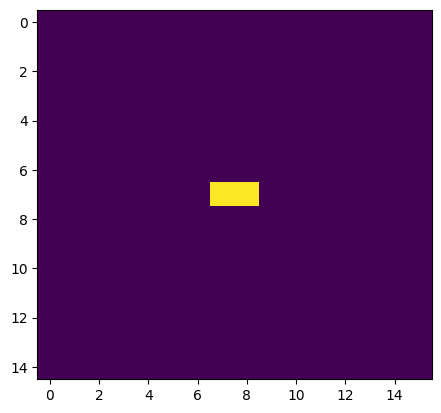

perimeter 2.0
here noise


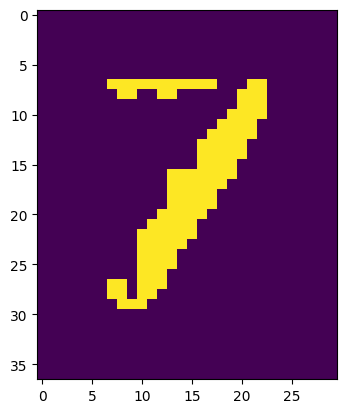

perimeter 63.94112479686737
1/1 [==============================] - 0s 43ms/step
symbol ---1


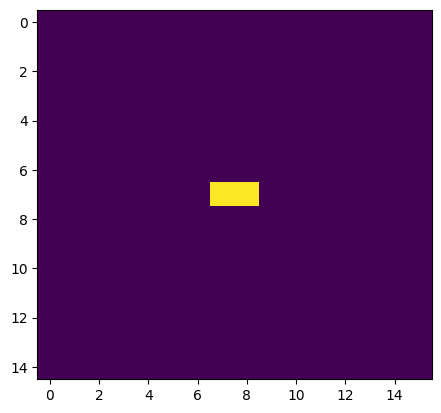

perimeter 2.0
here noise


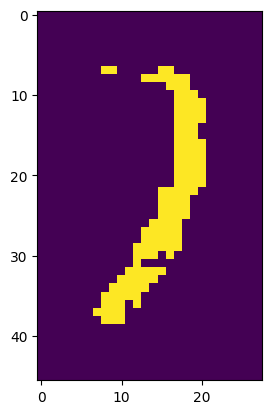

perimeter 89.8406195640564
1/1 [==============================] - 0s 44ms/step
symbol ---12


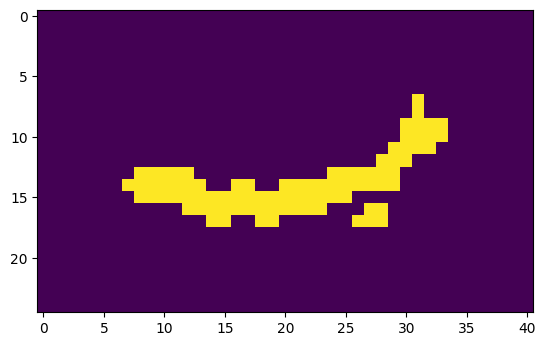

perimeter 66.52691125869751
here minus


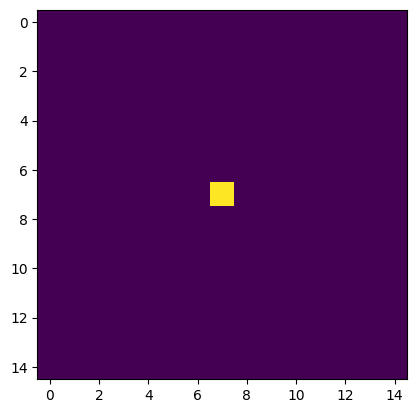

perimeter 0.0
here noise


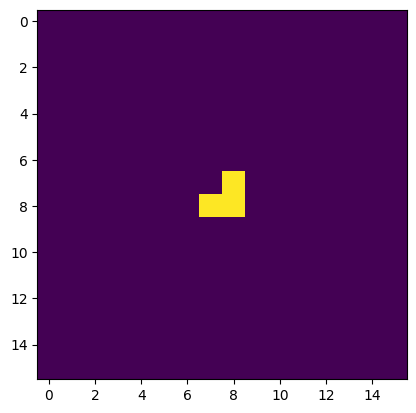

perimeter 3.414213538169861
here noise


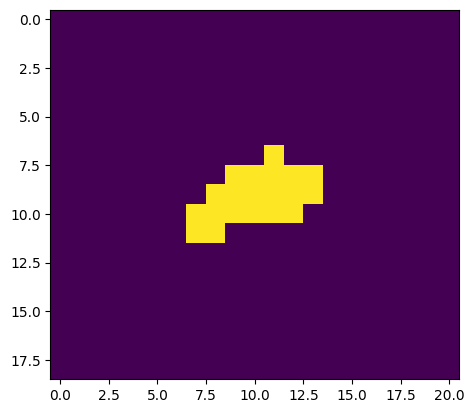

perimeter 16.485281229019165
here noise


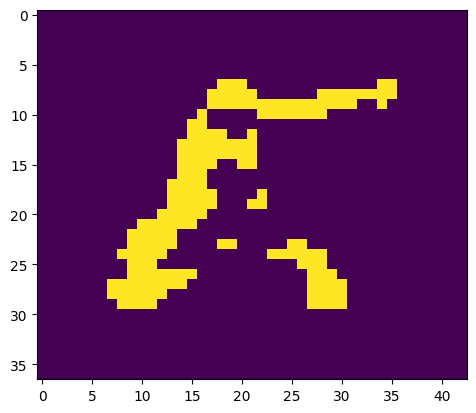

perimeter 111.74011445045471
here minus


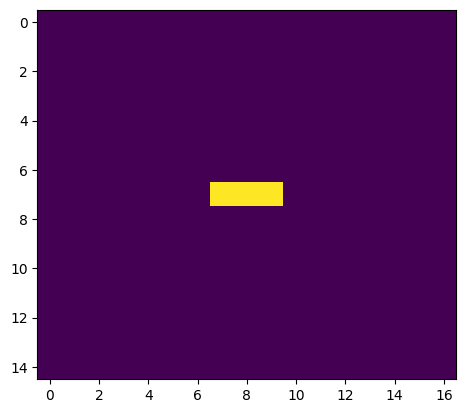

perimeter 4.0
here noise


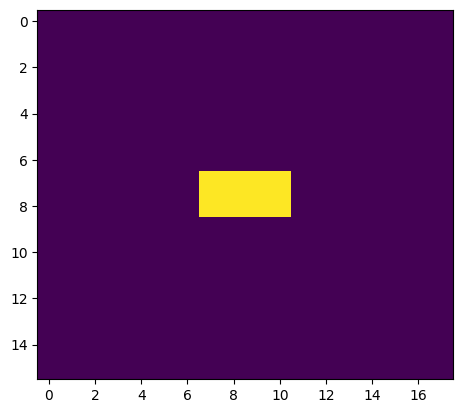

perimeter 8.0
here noise


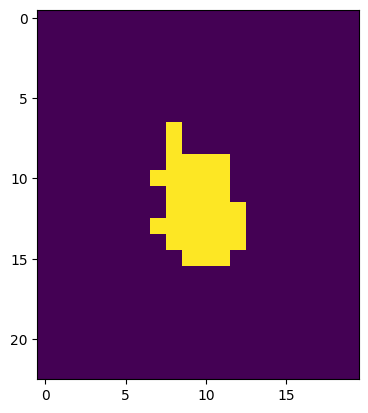

perimeter 23.313708305358887
here noise


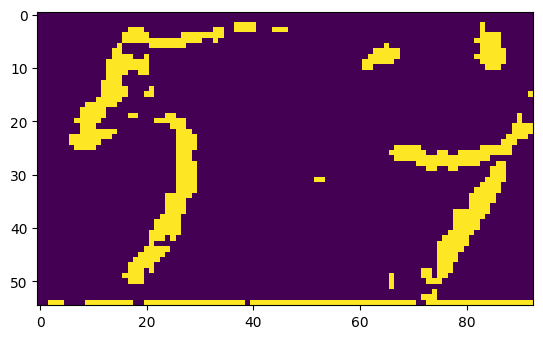

written_answer 0


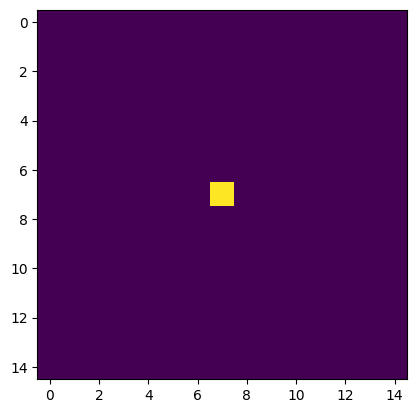

perimeter 0.0
here noise


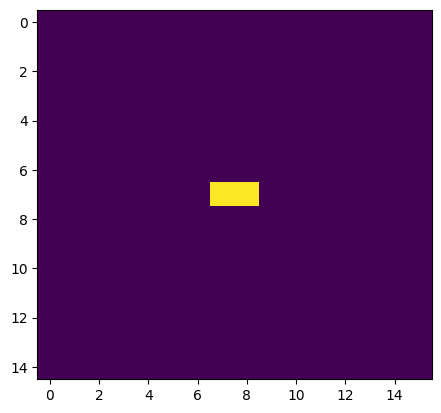

perimeter 2.0
here noise


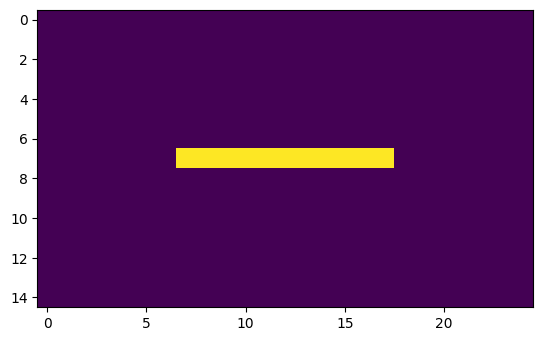

perimeter 20.0
here noise


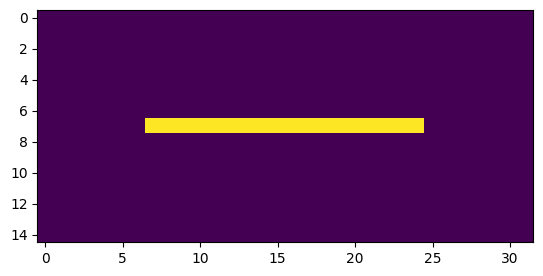

perimeter 34.0
here minus


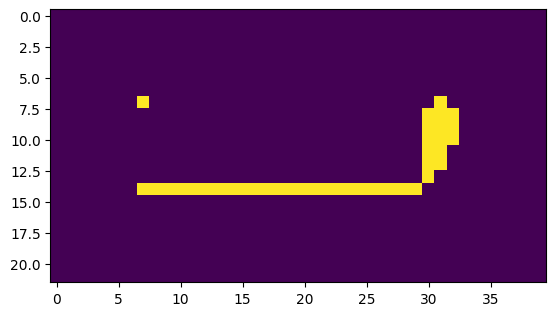

perimeter 60.485281229019165
here minus


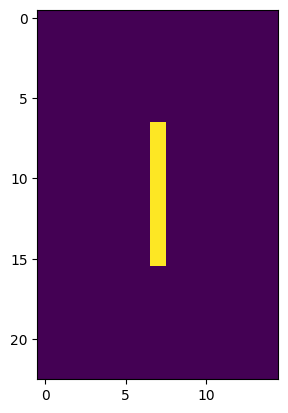

perimeter 16.0
here noise


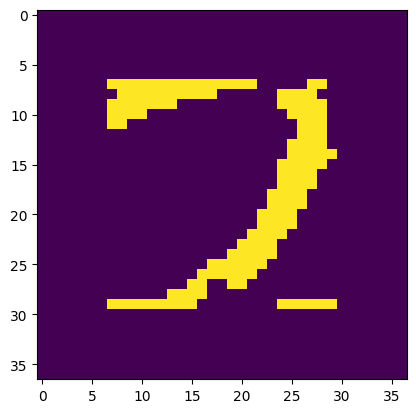

perimeter 78.42640590667725
1/1 [==============================] - 0s 38ms/step
symbol --7


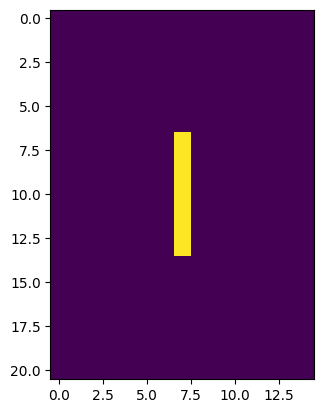

perimeter 12.0
here noise


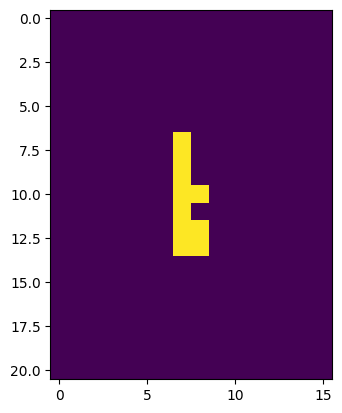

perimeter 14.242640614509583
here noise


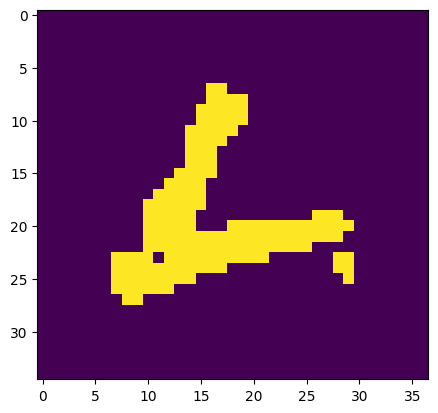

perimeter 83.35533833503723
here minus


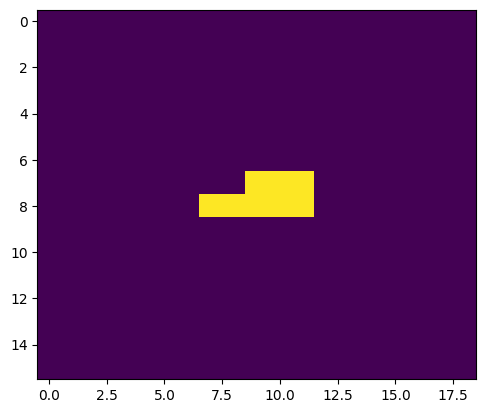

perimeter 9.41421353816986
here noise


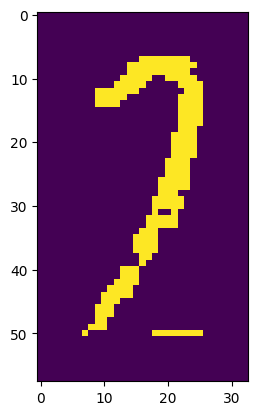

perimeter 139.05382227897644
1/1 [==============================] - 0s 38ms/step
symbol --7-2


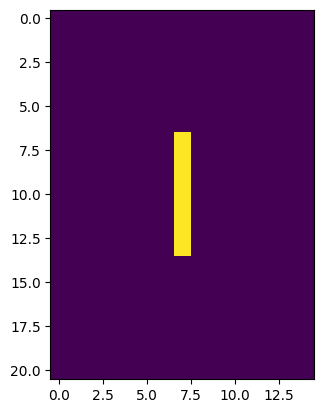

perimeter 12.0
here noise


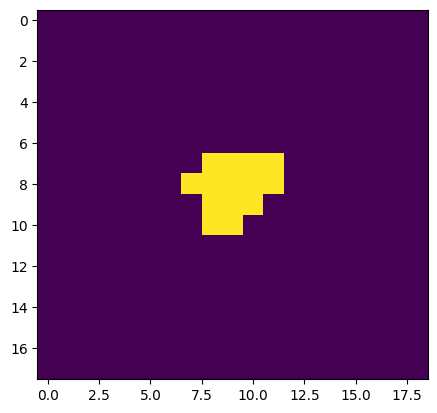

perimeter 11.656854152679443
here noise


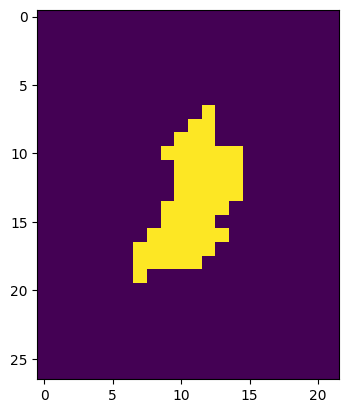

perimeter 33.79898941516876
1/1 [==============================] - 0s 35ms/step
symbol --7-22


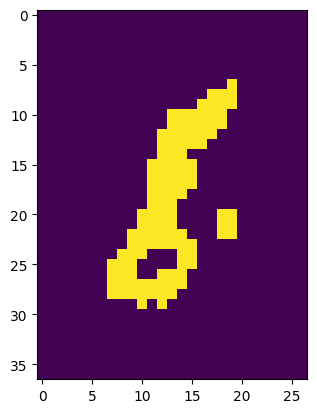

perimeter 61.94112491607666
1/1 [==============================] - 0s 51ms/step
symbol --7-228


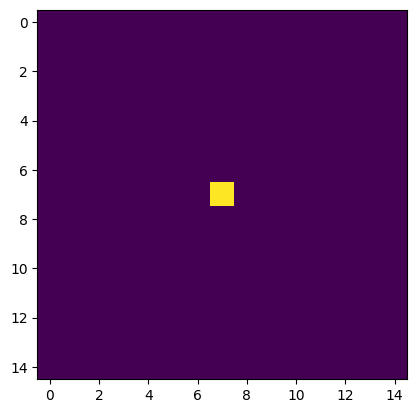

perimeter 0.0
here noise


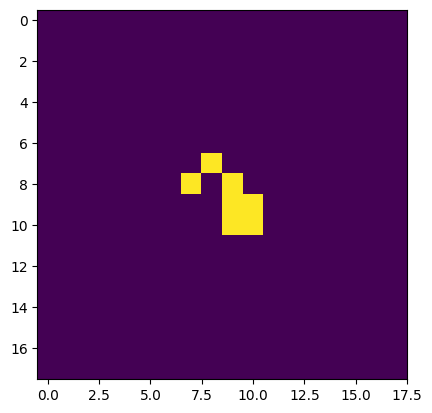

perimeter 11.071067690849304
here noise


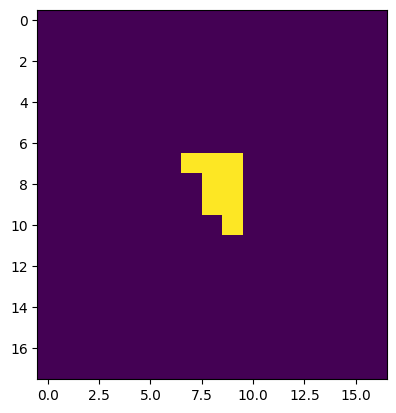

perimeter 8.828427076339722
here noise


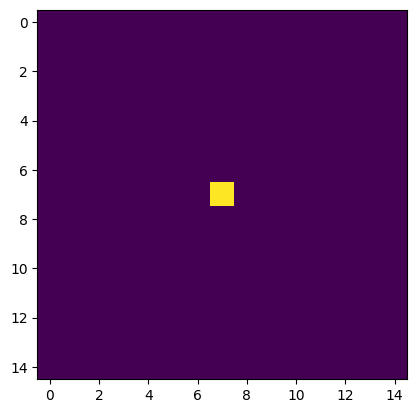

perimeter 0.0
here noise


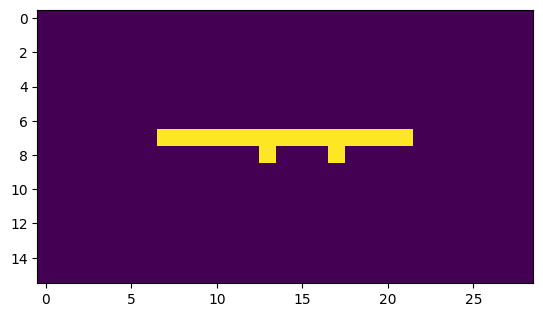

perimeter 29.656854152679443
here noise


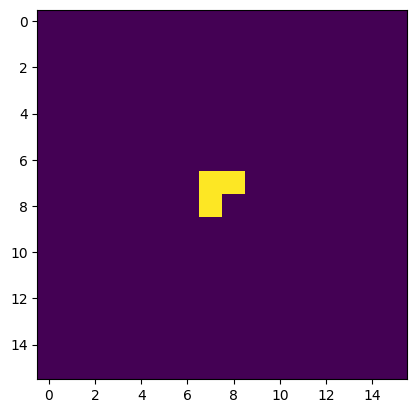

perimeter 3.414213538169861
here noise


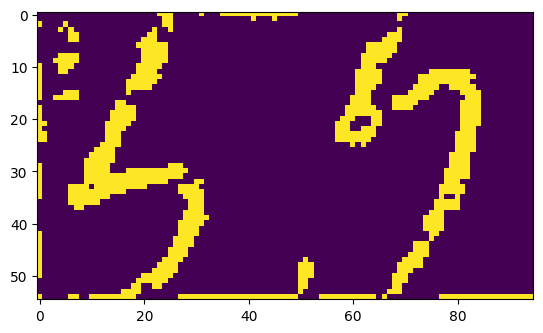

written_answer 0


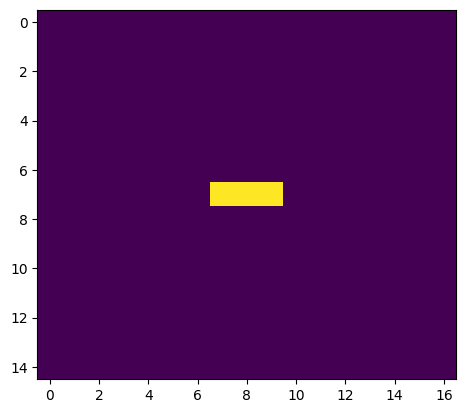

perimeter 4.0
here noise


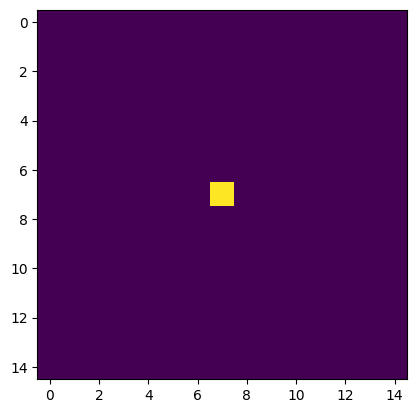

perimeter 0.0
here noise


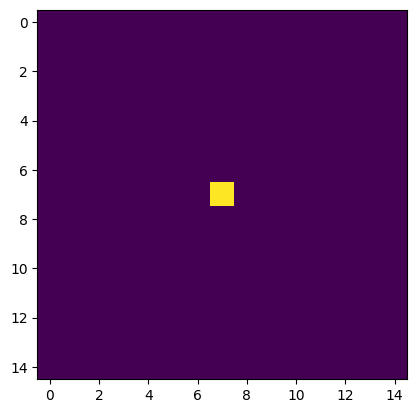

perimeter 0.0
here noise


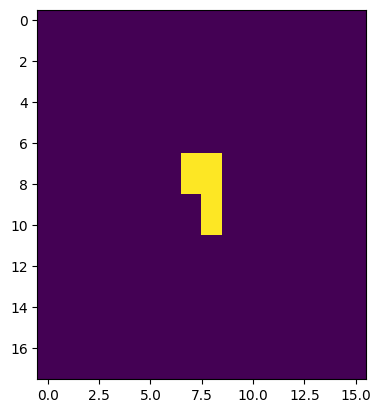

perimeter 7.414213538169861
here noise


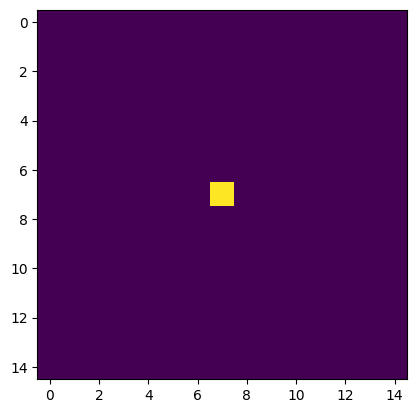

perimeter 0.0
here noise


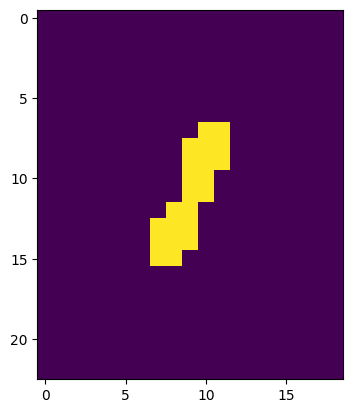

perimeter 20.485281229019165
here noise


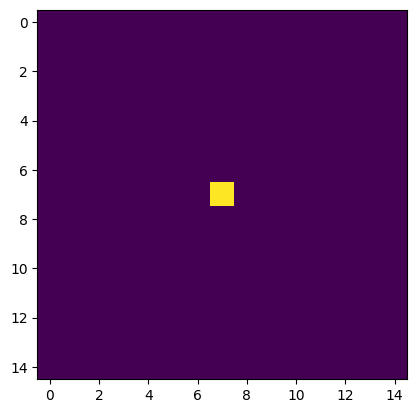

perimeter 0.0
here noise


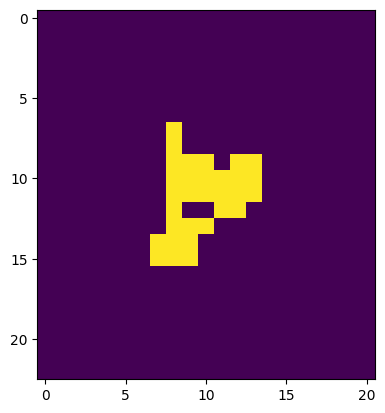

perimeter 25.899494767189026
here noise


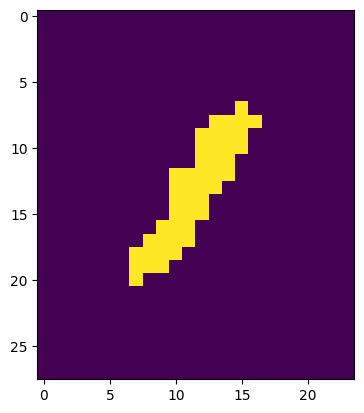

perimeter 35.21320295333862
1/1 [==============================] - 0s 42ms/step
symbol 1


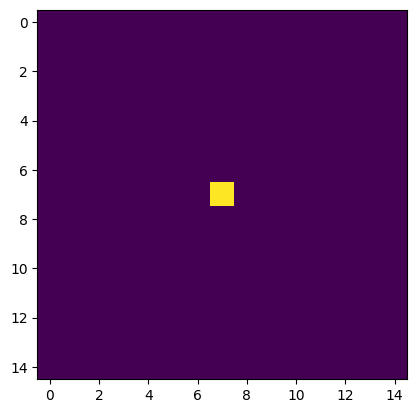

perimeter 0.0
here noise


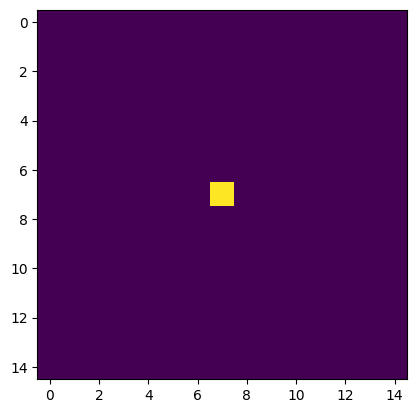

perimeter 0.0
here noise


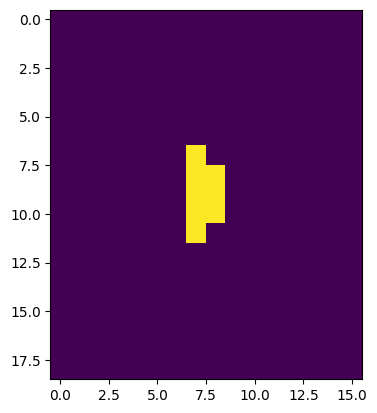

perimeter 8.828427076339722
here noise


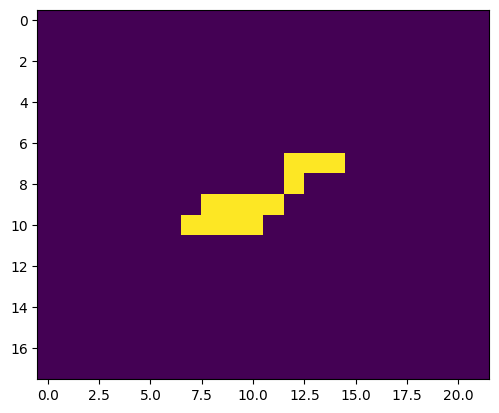

perimeter 17.071067571640015
here noise


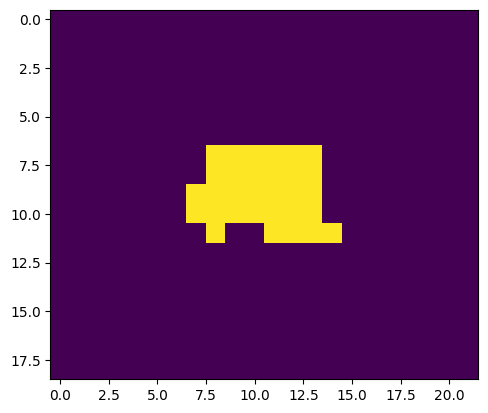

perimeter 21.071067690849304
here noise


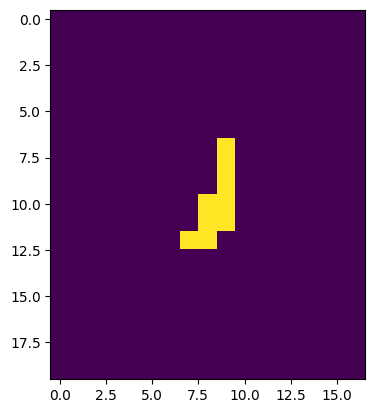

perimeter 12.242640614509583
here noise


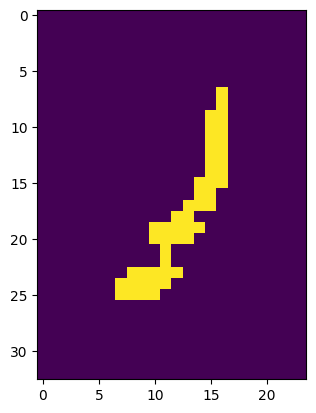

perimeter 50.627416491508484
1/1 [==============================] - 0s 40ms/step
symbol 12


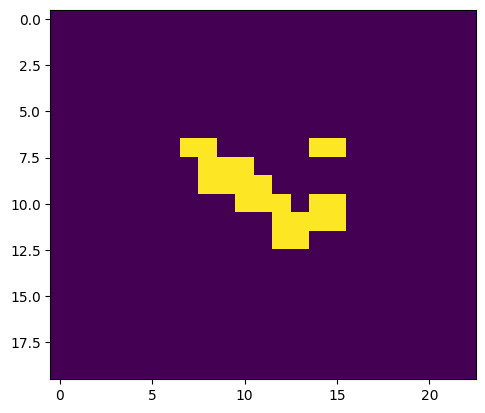

perimeter 22.727921724319458
here noise


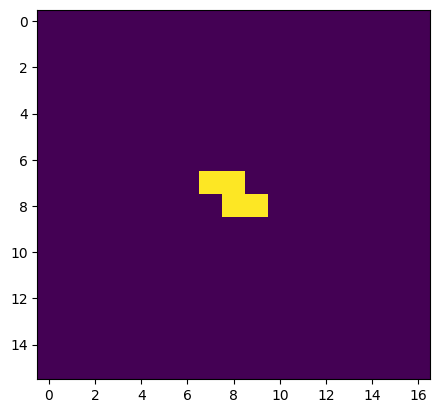

perimeter 4.828427076339722
here noise


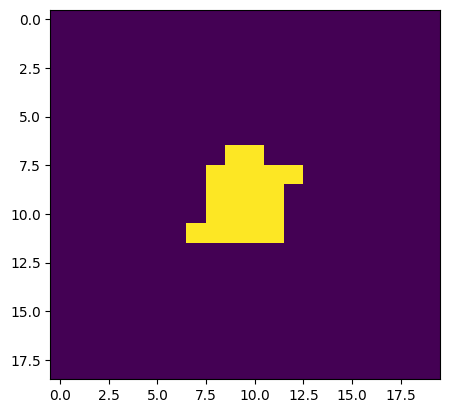

perimeter 15.656854152679443
here noise


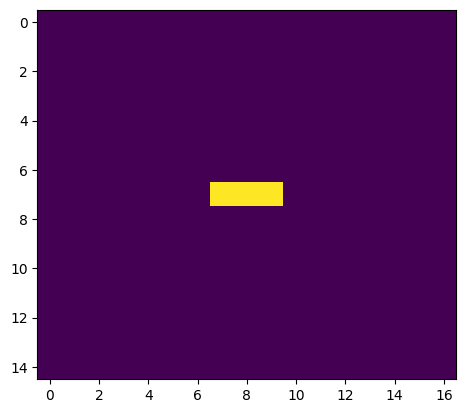

perimeter 4.0
here noise


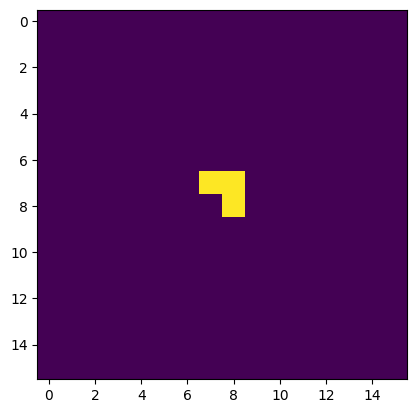

perimeter 3.414213538169861
here noise


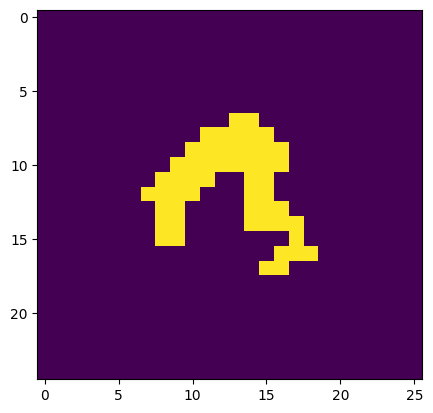

perimeter 46.28427064418793
here minus


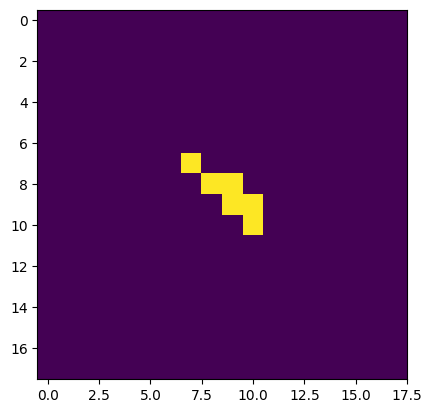

perimeter 9.071067571640015
here noise


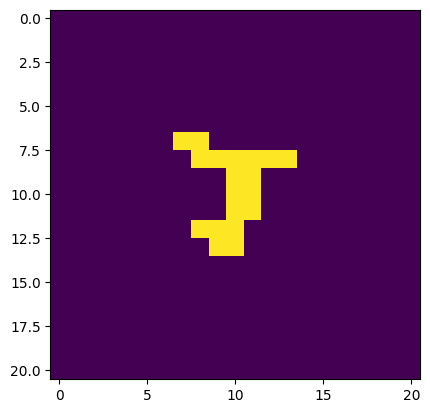

perimeter 23.899494767189026
here noise


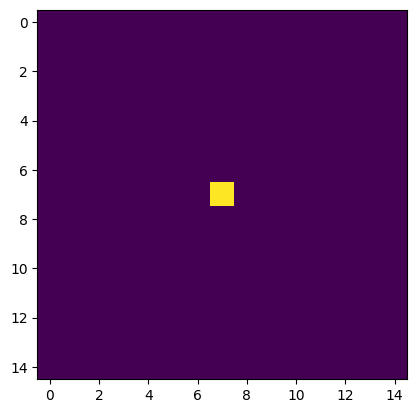

perimeter 0.0
here noise


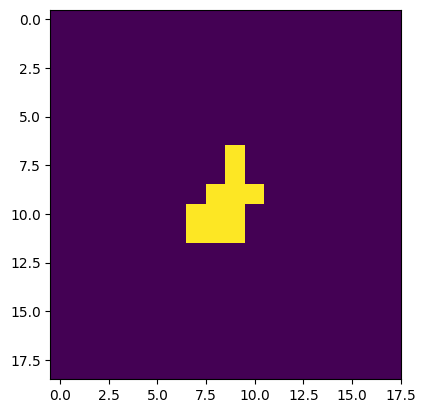

perimeter 11.656854152679443
here noise


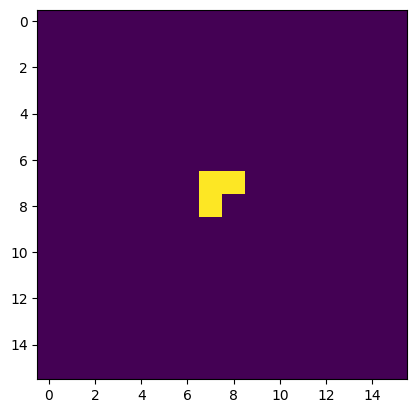

perimeter 3.414213538169861
here noise


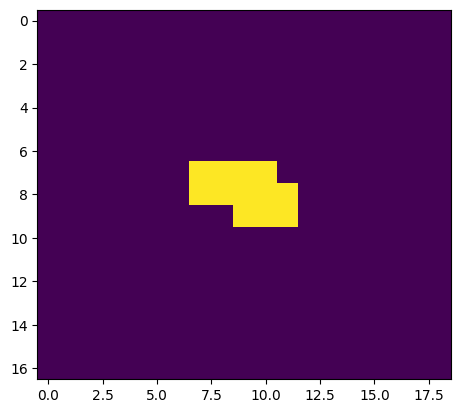

perimeter 10.828427076339722
here noise


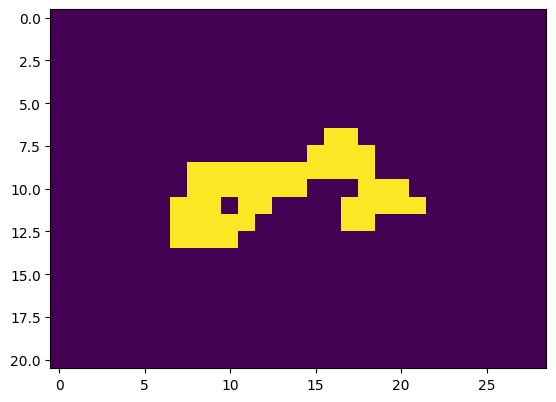

perimeter 40.3847758769989
here minus


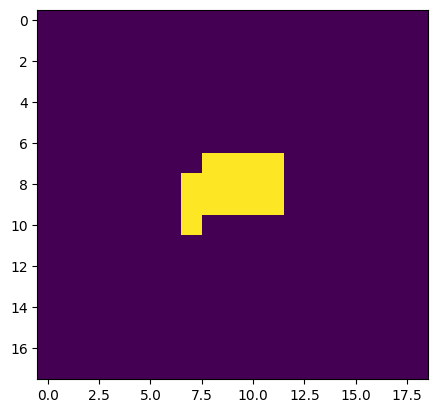

perimeter 12.828427076339722
here noise


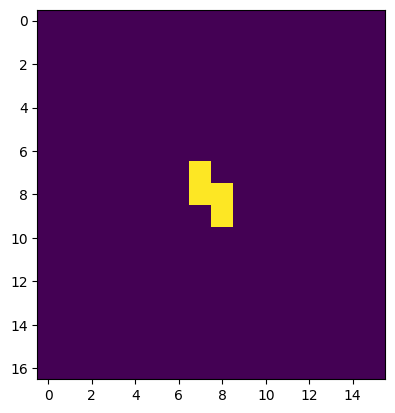

perimeter 4.828427076339722
here noise


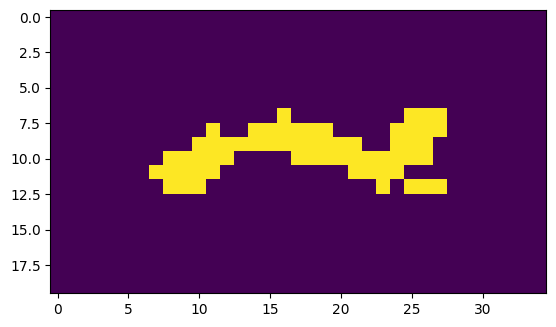

perimeter 58.52691125869751
here minus


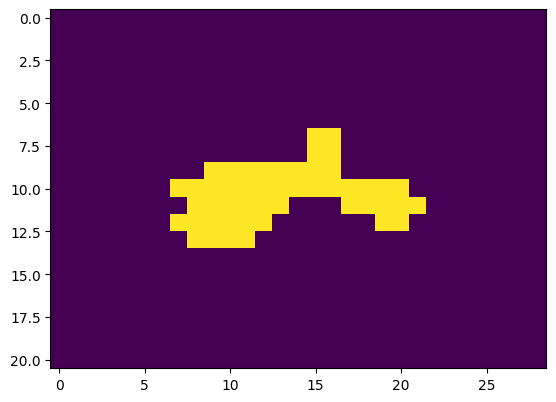

perimeter 38.3847758769989
here minus


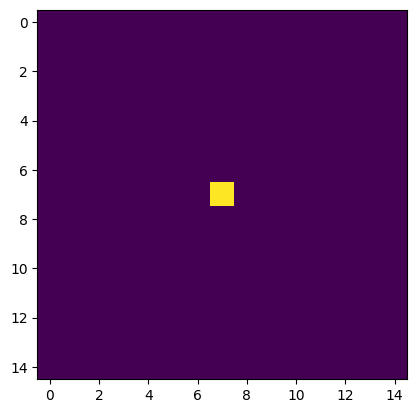

perimeter 0.0
here noise


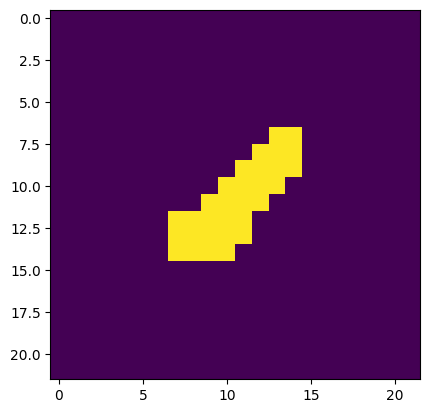

perimeter 22.727921843528748
here noise


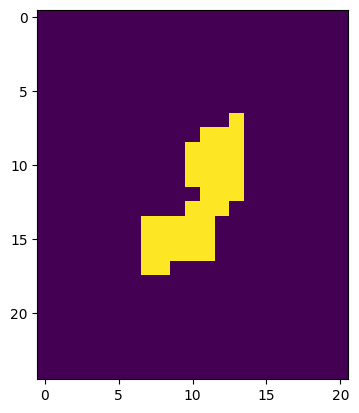

perimeter 29.313708305358887
here noise


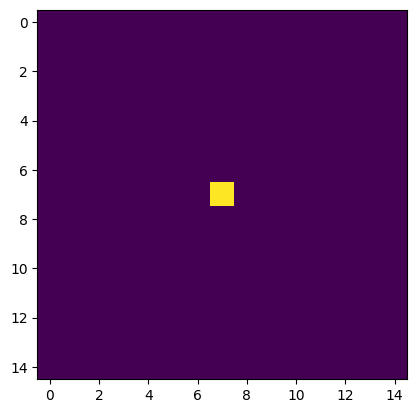

perimeter 0.0
here noise


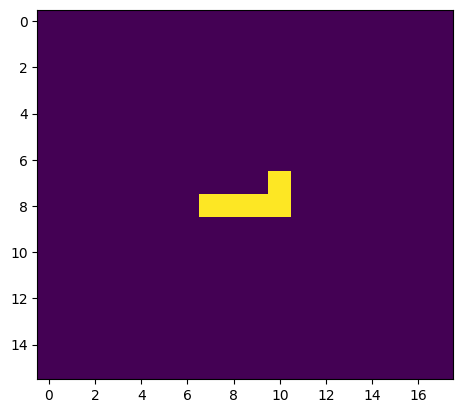

perimeter 7.414213538169861
here noise


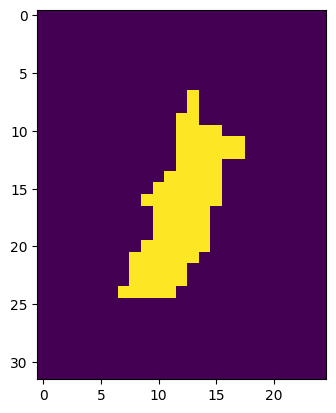

perimeter 47.21320295333862
1/1 [==============================] - 0s 56ms/step
symbol 12----1


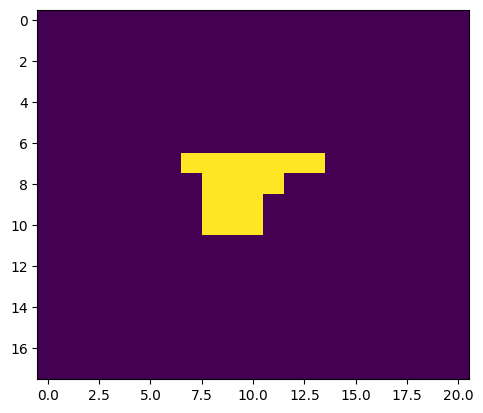

perimeter 16.242640614509583
here noise


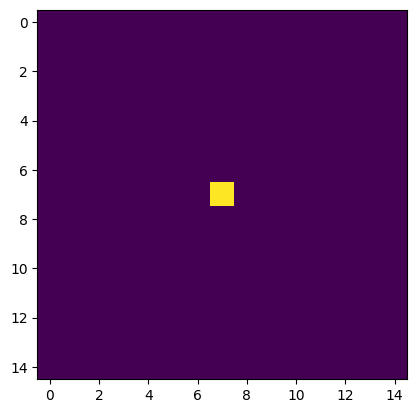

perimeter 0.0
here noise


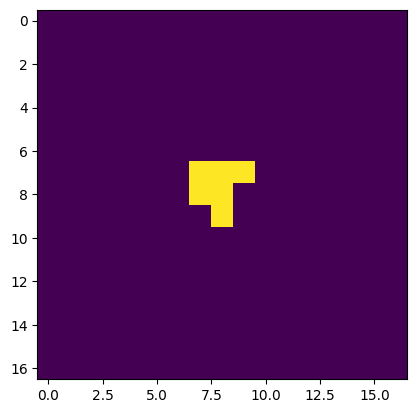

perimeter 6.828427076339722
here noise


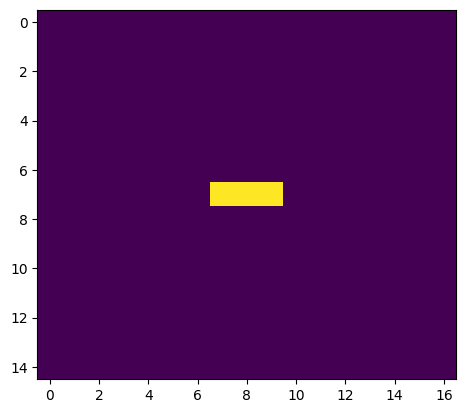

perimeter 4.0
here noise


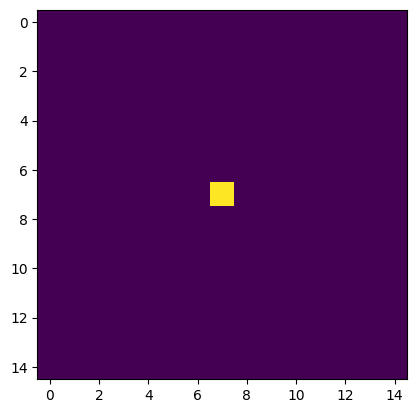

perimeter 0.0
here noise


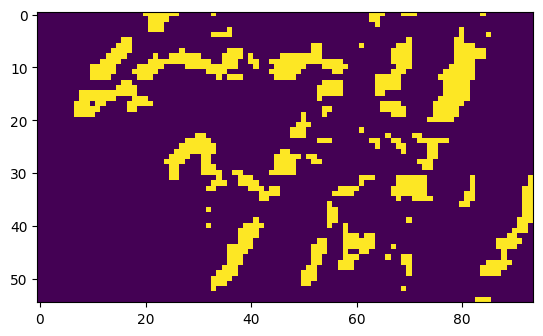

written_answer 0


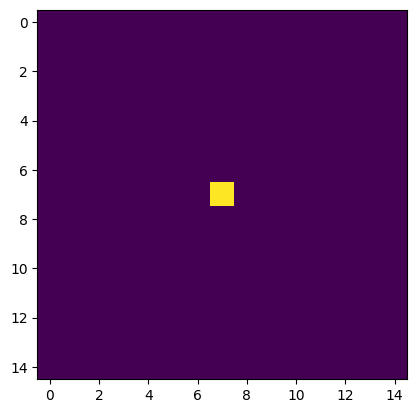

perimeter 0.0
here noise


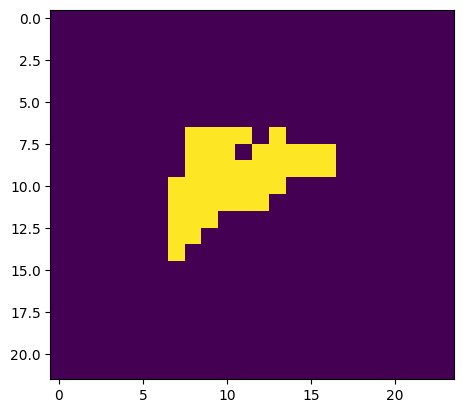

perimeter 28.727921724319458
here noise


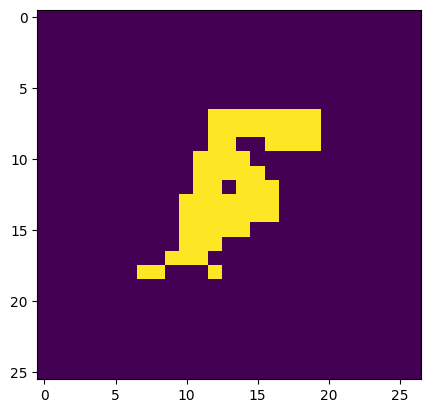

perimeter 49.21320295333862
here minus


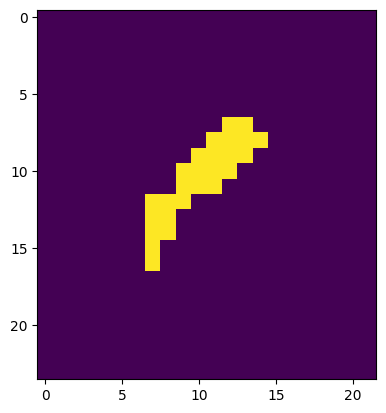

perimeter 25.55634868144989
here noise


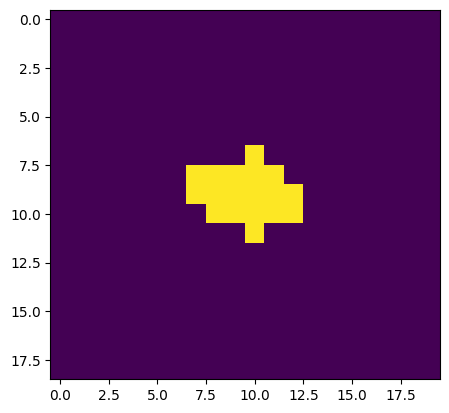

perimeter 14.485281229019165
here noise


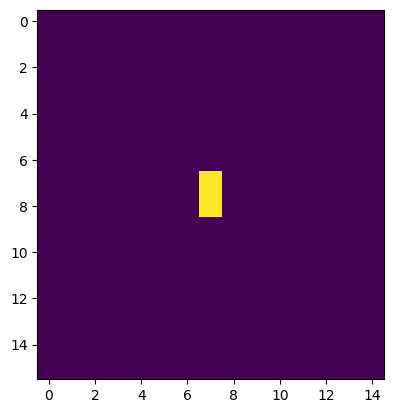

perimeter 2.0
here noise


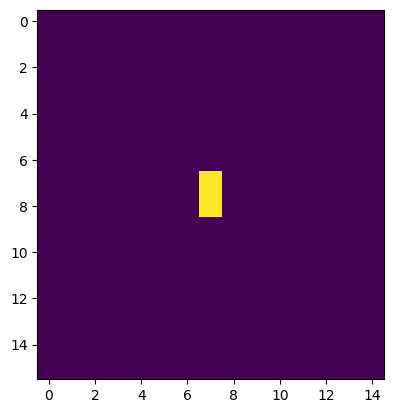

perimeter 2.0
here noise


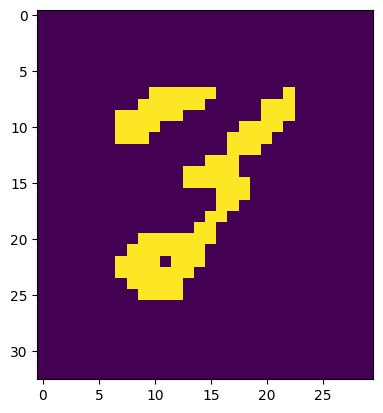

perimeter 59.94112455844879
1/1 [==============================] - 0s 49ms/step
symbol -2


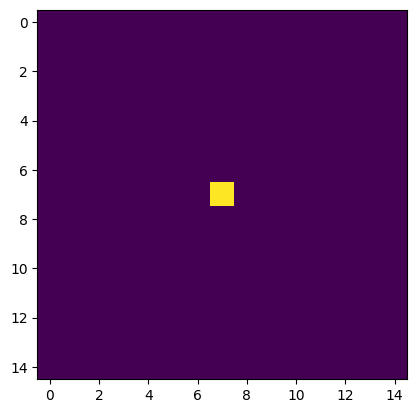

perimeter 0.0
here noise


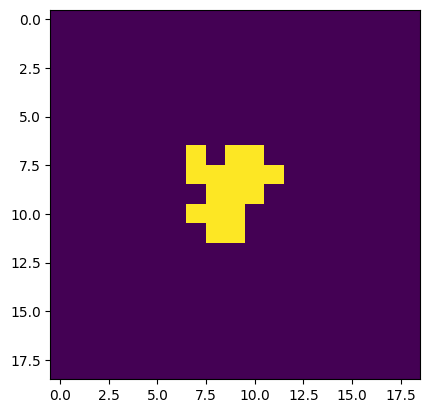

perimeter 15.313708305358887
here noise


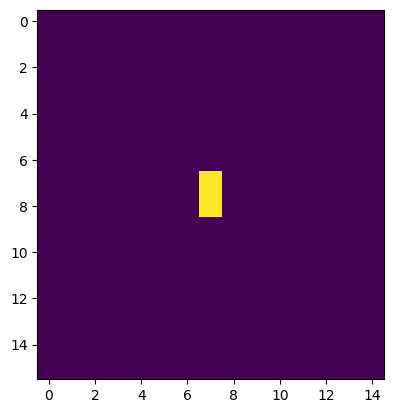

perimeter 2.0
here noise


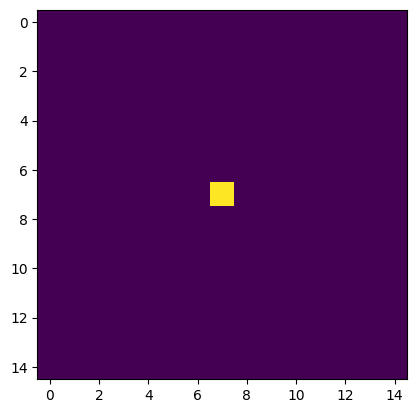

perimeter 0.0
here noise


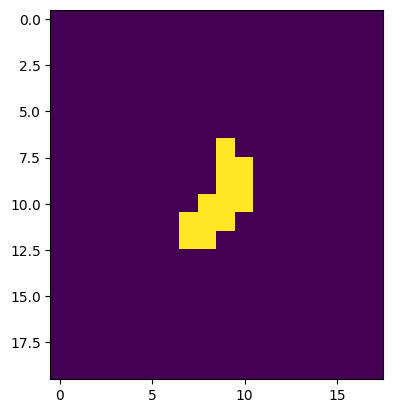

perimeter 13.071067690849304
here noise


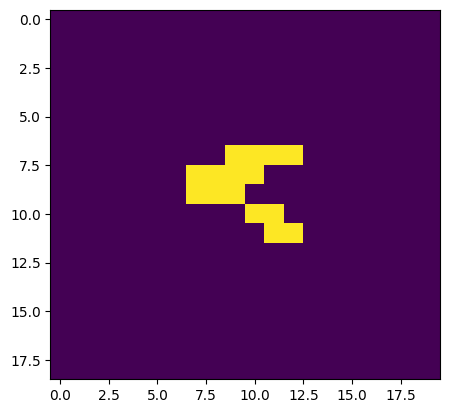

perimeter 19.899494767189026
here noise


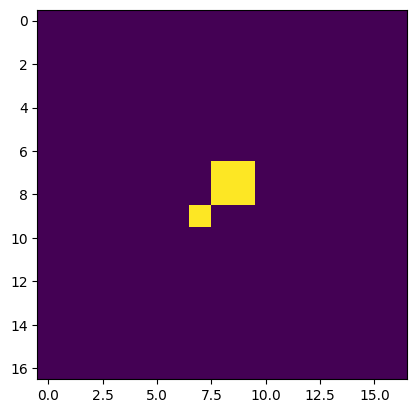

perimeter 6.828427076339722
here noise


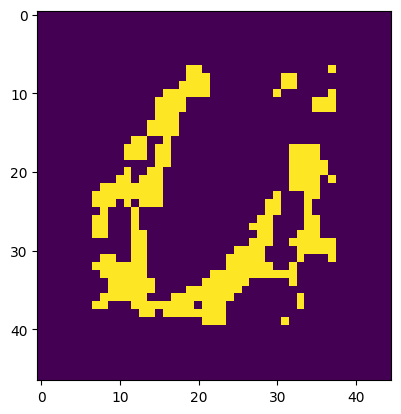

perimeter 231.9655100107193
1/1 [==============================] - 0s 36ms/step
symbol -20


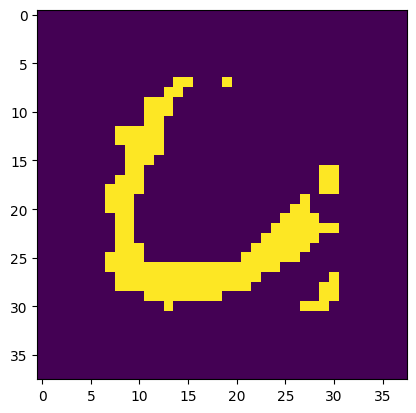

perimeter 100.91168761253357
1/1 [==============================] - 0s 47ms/step
symbol -209


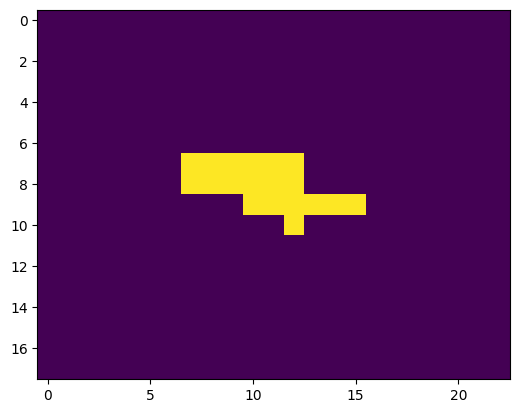

perimeter 19.656854152679443
here noise


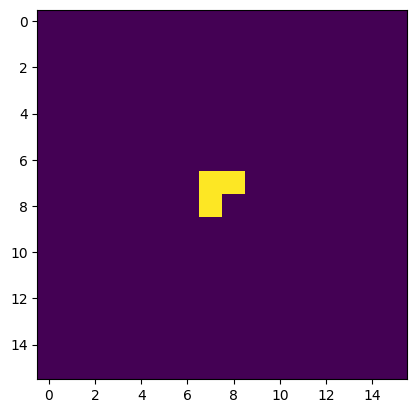

perimeter 3.414213538169861
here noise


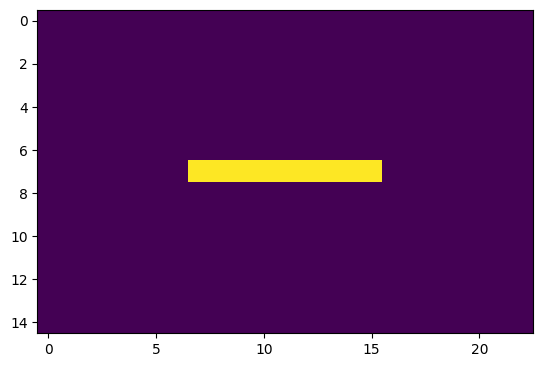

perimeter 16.0
here noise


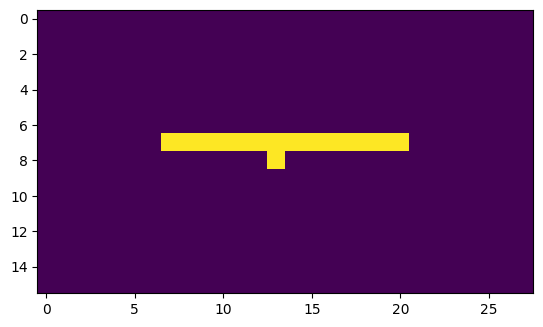

perimeter 26.82842707633972
here noise


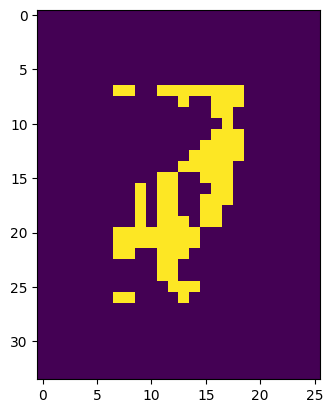

perimeter 75.35533857345581
1/1 [==============================] - 0s 43ms/step
symbol -2092


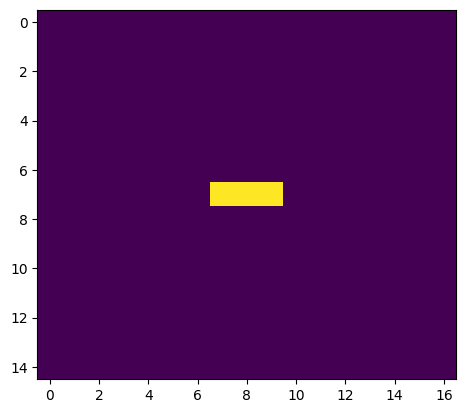

perimeter 4.0
here noise


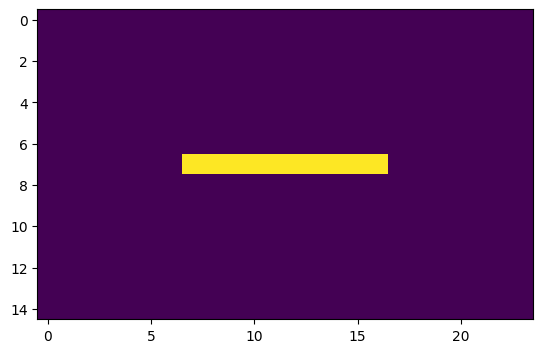

perimeter 18.0
here noise


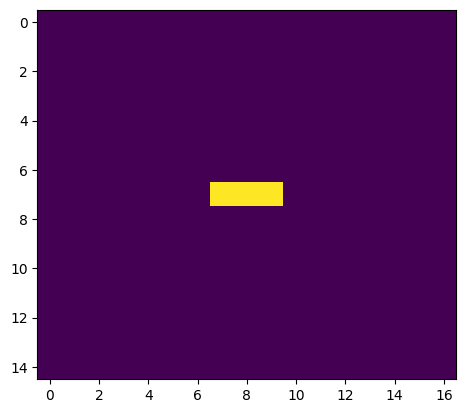

perimeter 4.0
here noise


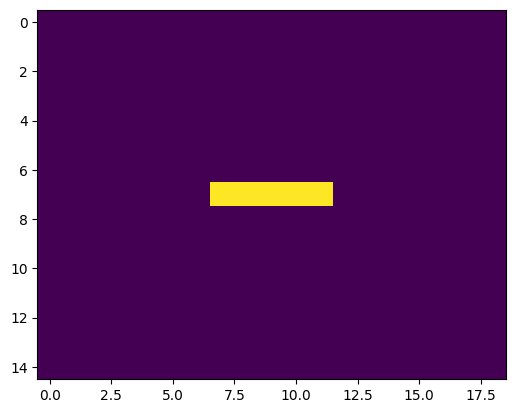

perimeter 8.0
here noise


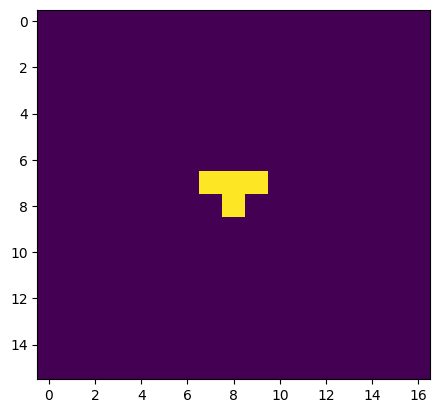

perimeter 4.828427076339722
here noise


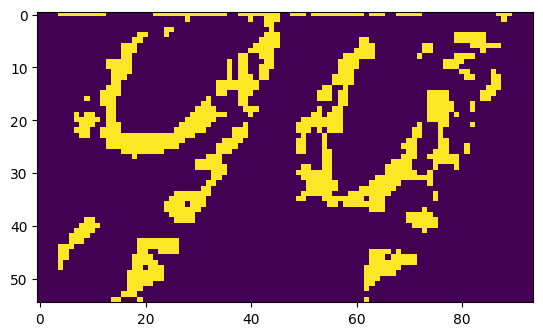

written_answer -2092


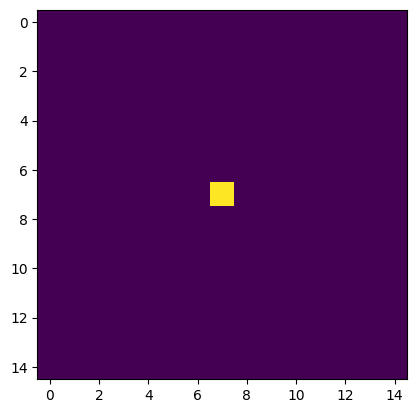

perimeter 0.0
here noise


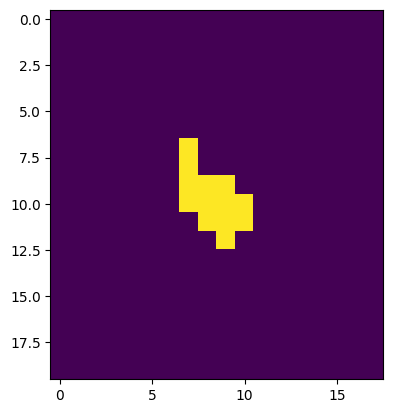

perimeter 13.071067690849304
here noise


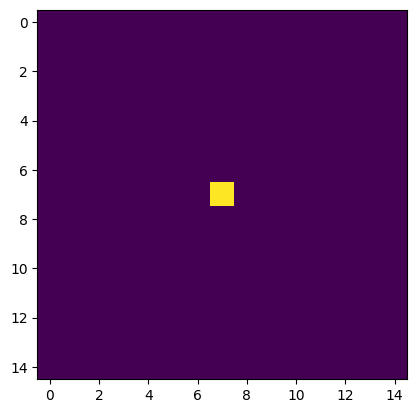

perimeter 0.0
here noise


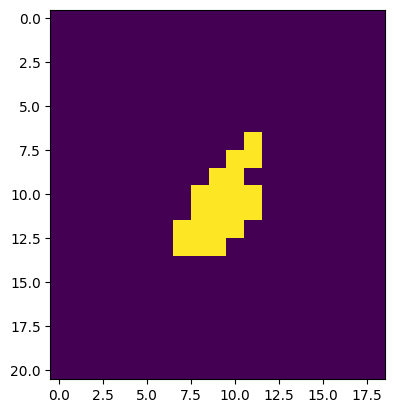

perimeter 17.313708186149597
here noise


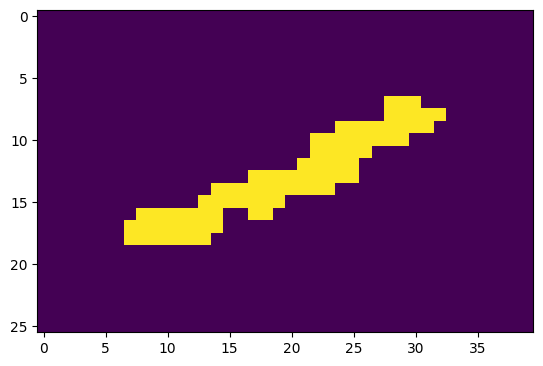

perimeter 62.870057225227356
here minus


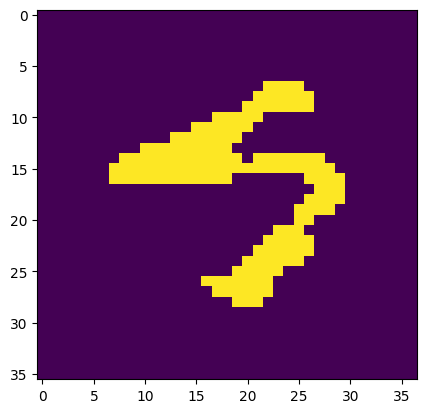

perimeter 107.15432798862457
here minus


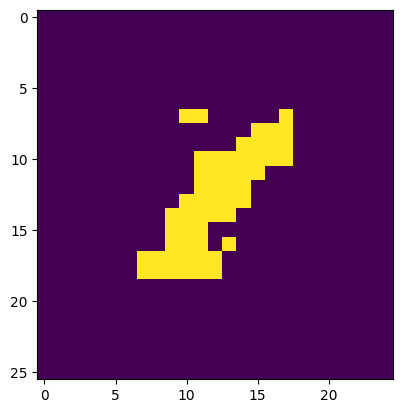

perimeter 40.38477599620819
1/1 [==============================] - 0s 46ms/step
symbol --1


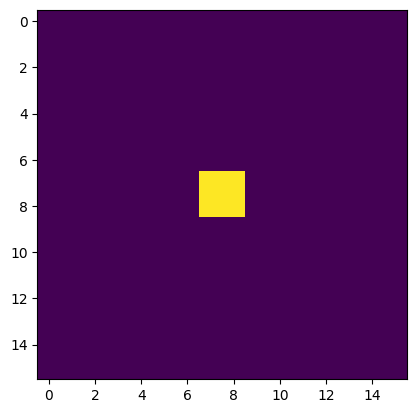

perimeter 4.0
here noise


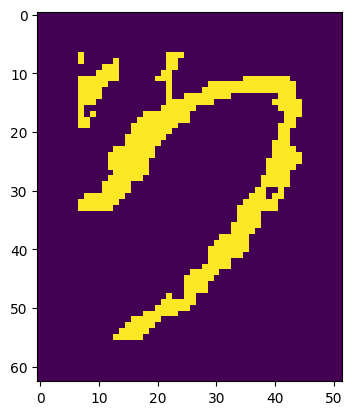

perimeter 241.2792180776596
1/1 [==============================] - 0s 34ms/step
symbol --17


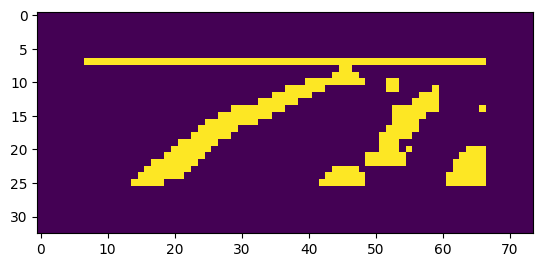

perimeter 198.91168677806854
here minus


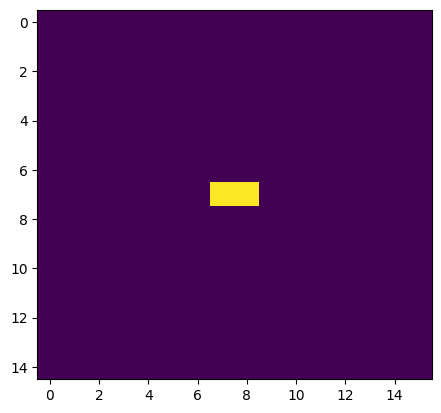

perimeter 2.0
here noise


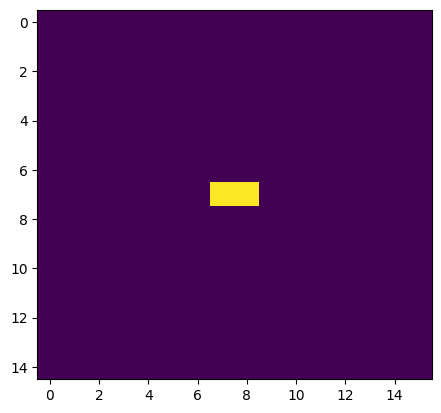

perimeter 2.0
here noise


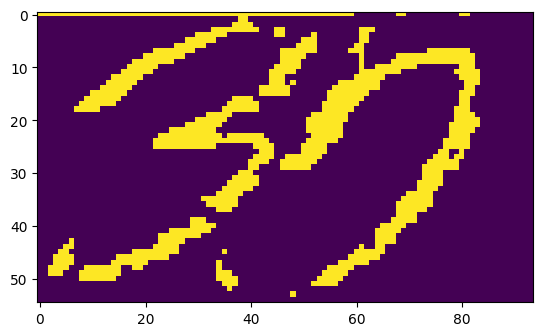

written_answer 0


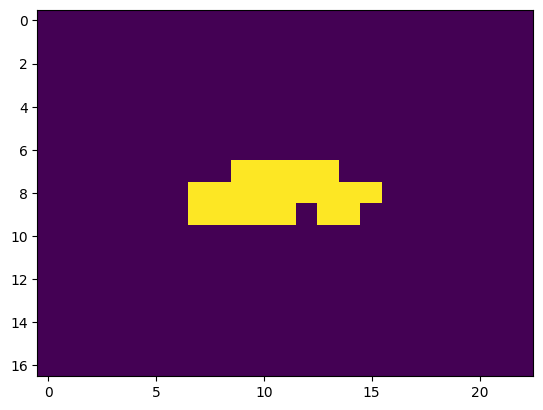

perimeter 19.071067690849304
here noise


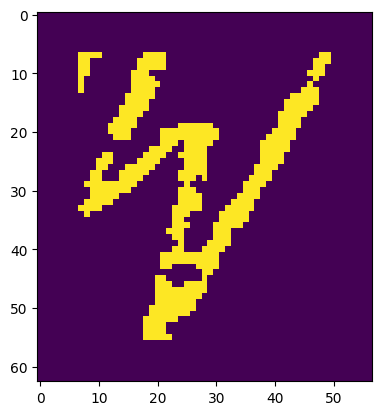

perimeter 267.22034335136414
1/1 [==============================] - 0s 53ms/step
symbol 8


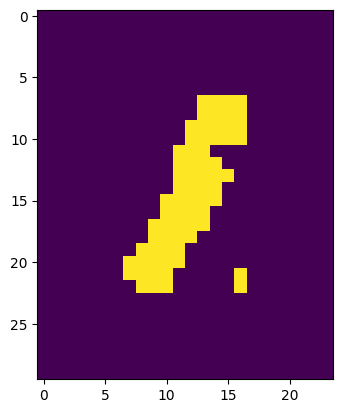

perimeter 43.21320307254791
1/1 [==============================] - 0s 36ms/step
symbol 81


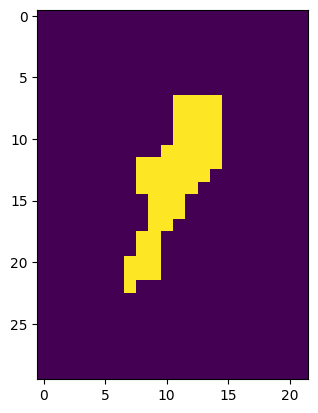

perimeter 39.55634880065918
1/1 [==============================] - 0s 57ms/step
symbol 814


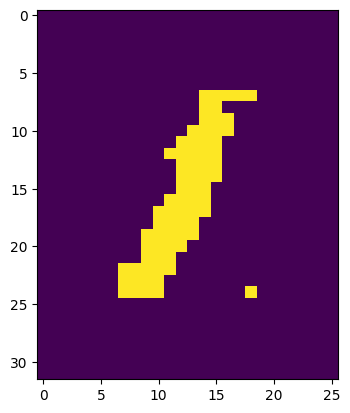

perimeter 50.627416491508484
1/1 [==============================] - 0s 35ms/step
symbol 8141


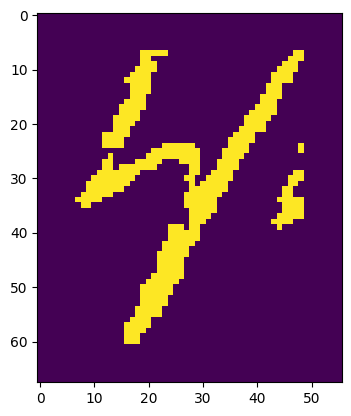

perimeter 209.62236368656158
1/1 [==============================] - 0s 34ms/step
symbol 81417


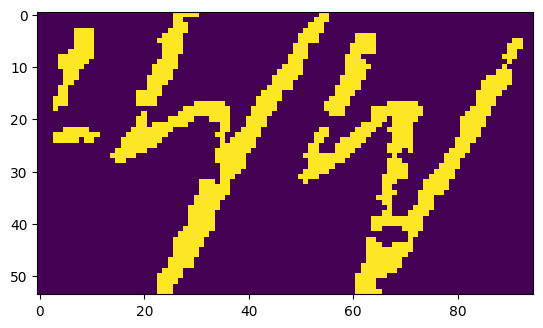

written_answer 81417


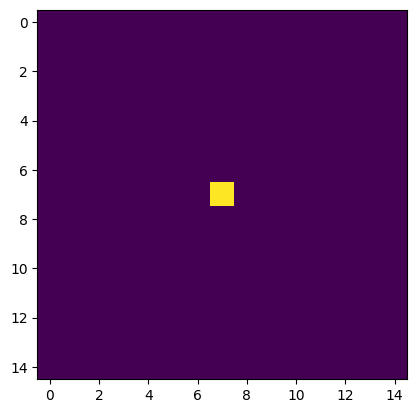

perimeter 0.0
here noise


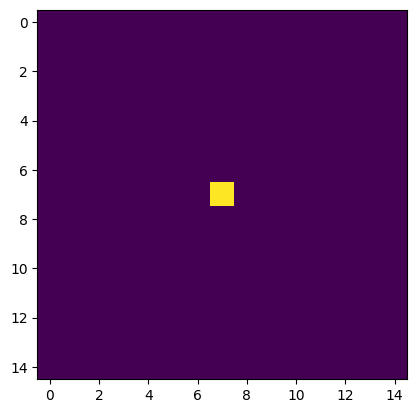

perimeter 0.0
here noise


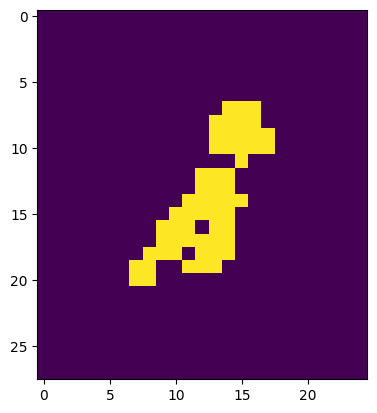

perimeter 44.627416491508484
1/1 [==============================] - 0s 40ms/step
symbol 1


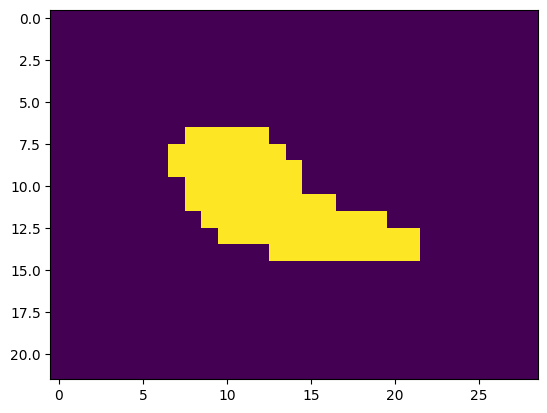

perimeter 36.14213538169861
here minus


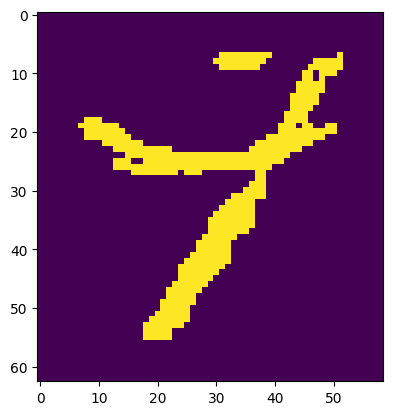

perimeter 210.65180110931396
1/1 [==============================] - 0s 50ms/step
symbol 1-7


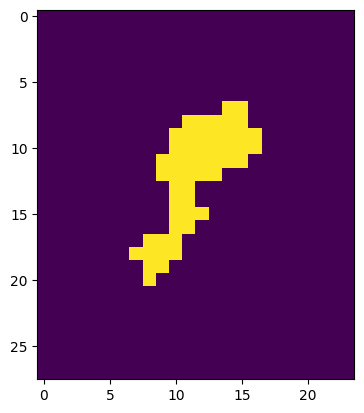

perimeter 38.62741661071777
1/1 [==============================] - 0s 36ms/step
symbol 1-72


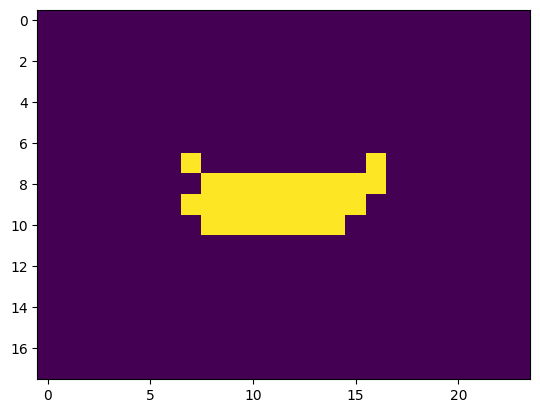

perimeter 23.899494767189026
here noise


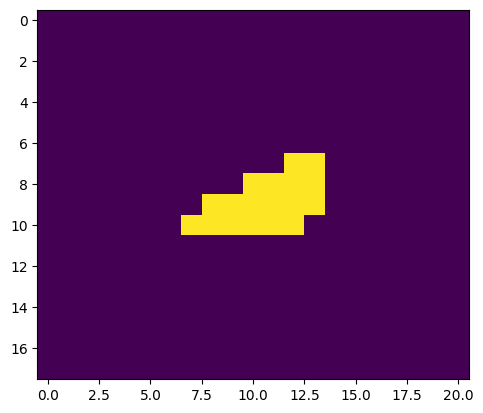

perimeter 15.656854152679443
here noise


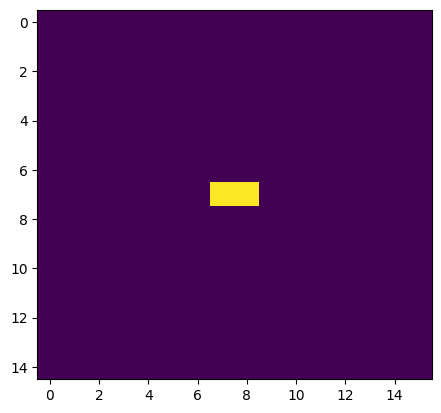

perimeter 2.0
here noise


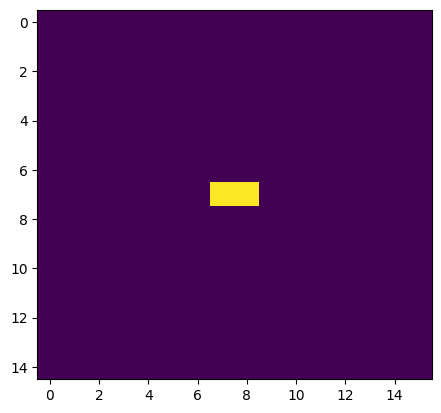

perimeter 2.0
here noise


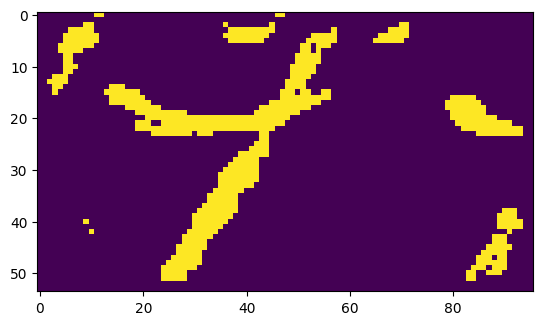

written_answer 0


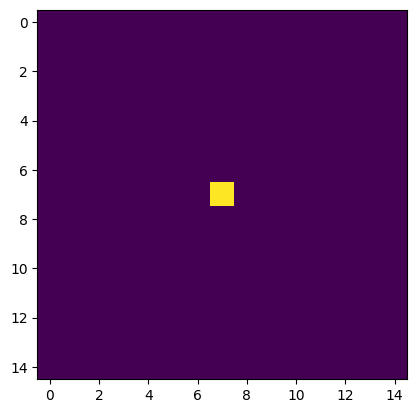

perimeter 0.0
here noise


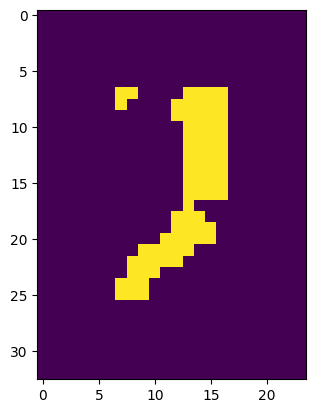

perimeter 51.79898953437805
1/1 [==============================] - 0s 62ms/step
symbol 7


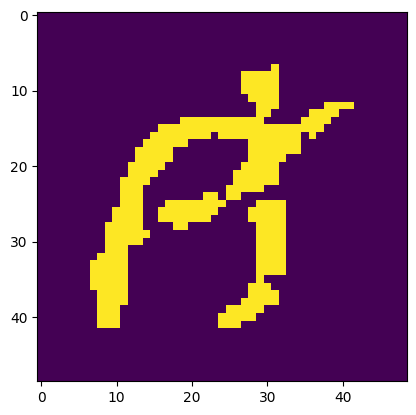

perimeter 173.19595789909363
1/1 [==============================] - 0s 61ms/step
symbol 79


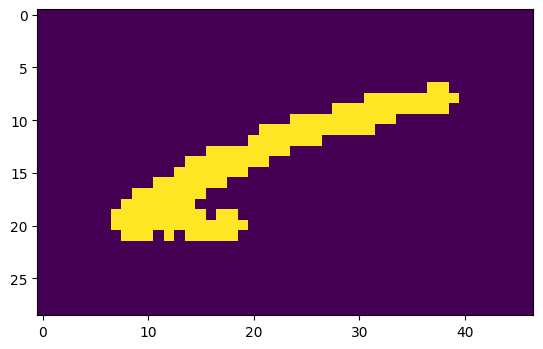

perimeter 88.66904675960541
here minus


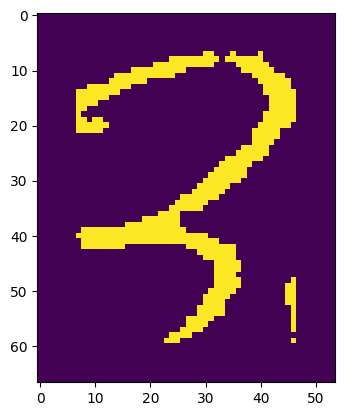

perimeter 199.48022854328156
1/1 [==============================] - 0s 42ms/step
symbol 79-3


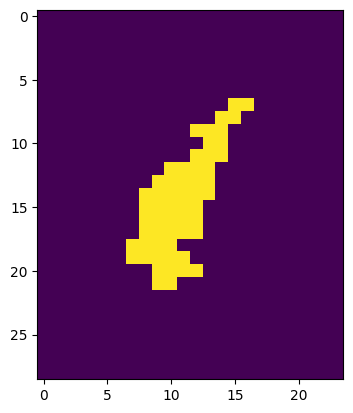

perimeter 42.041630148887634
1/1 [==============================] - 0s 37ms/step
symbol 79-31


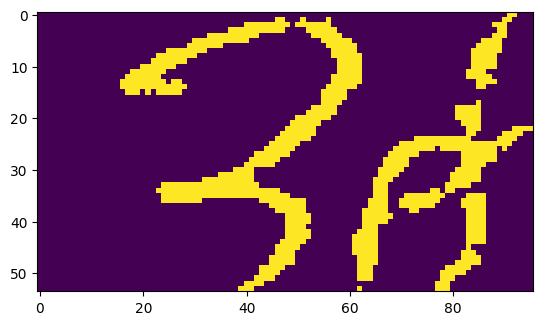

written_answer 0


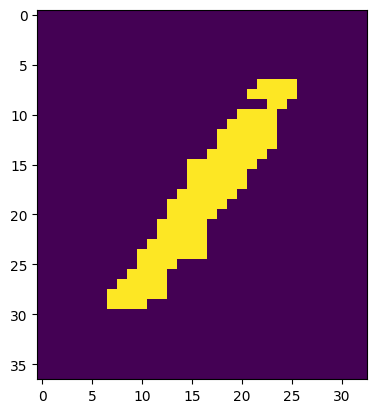

perimeter 68.18376529216766
1/1 [==============================] - 0s 47ms/step
symbol 1


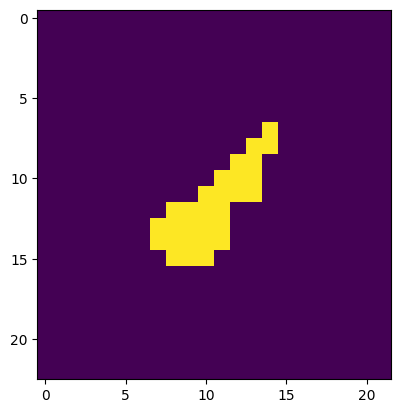

perimeter 24.142135500907898
here noise


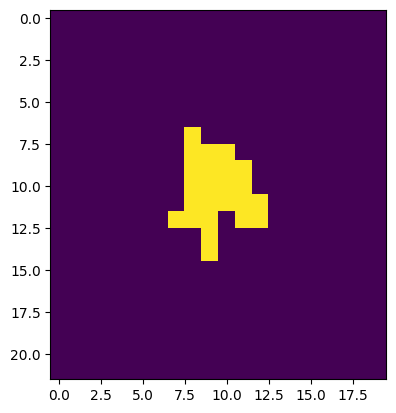

perimeter 21.899494767189026
here noise


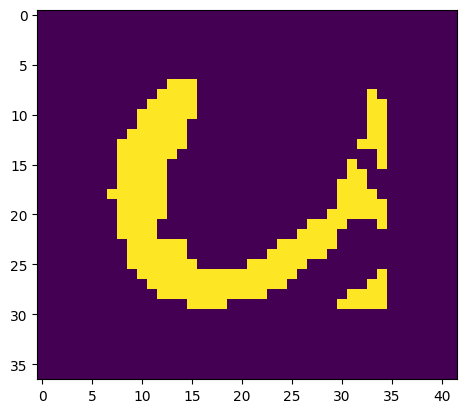

perimeter 107.1543276309967
here minus


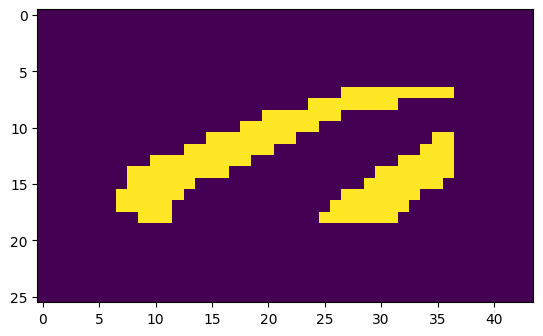

perimeter 68.87005710601807
here minus


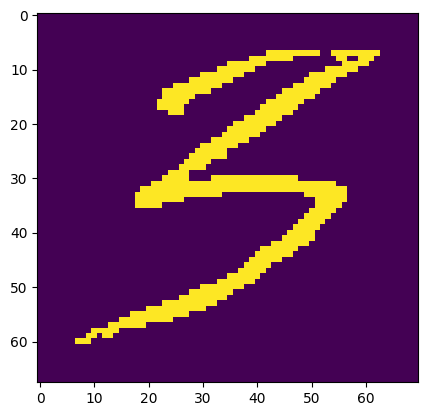

perimeter 290.73506212234497
here minus


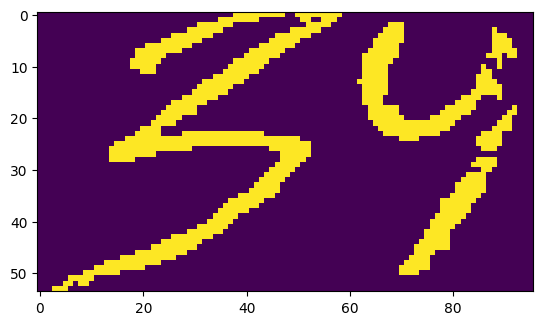

written_answer 0


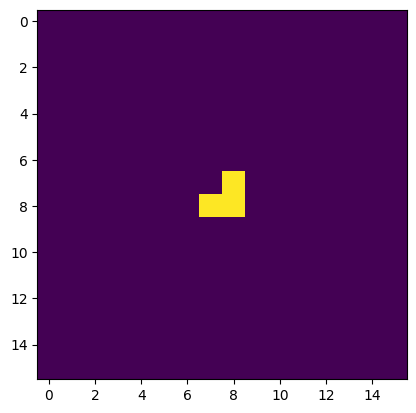

perimeter 3.414213538169861
here noise


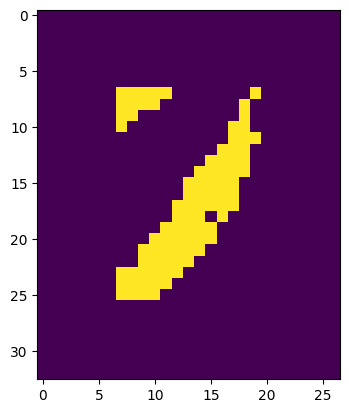

perimeter 49.11269783973694
1/1 [==============================] - 0s 33ms/step
symbol 1


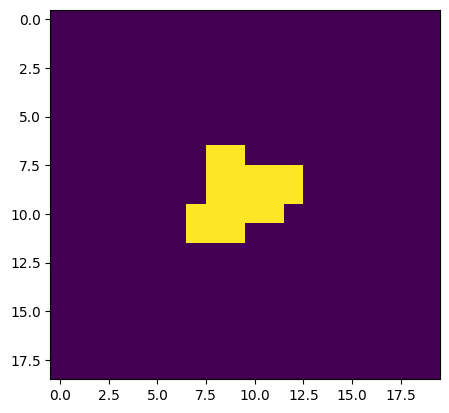

perimeter 15.656854152679443
here noise


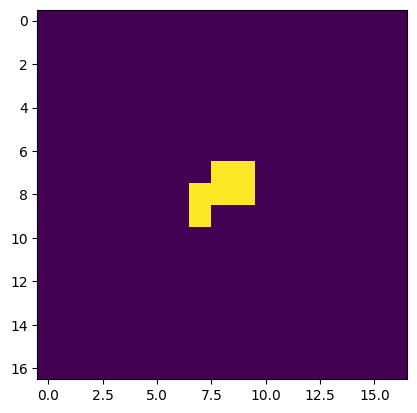

perimeter 6.828427076339722
here noise


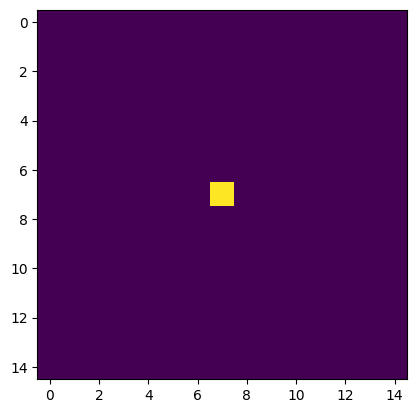

perimeter 0.0
here noise


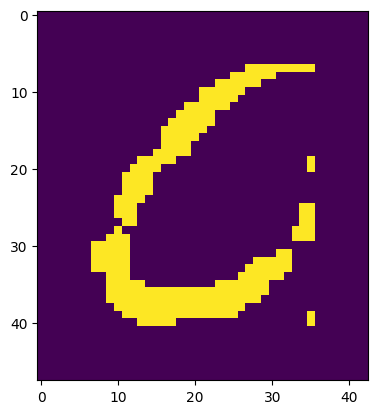

perimeter 149.29646277427673
1/1 [==============================] - 0s 32ms/step
symbol 10


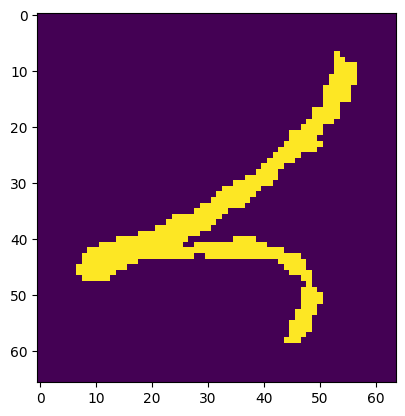

perimeter 225.37972366809845
1/1 [==============================] - 0s 33ms/step
symbol 102


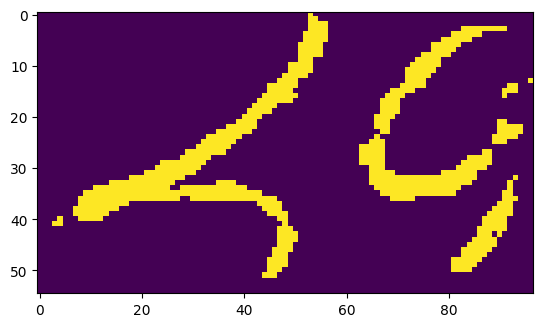

written_answer 102


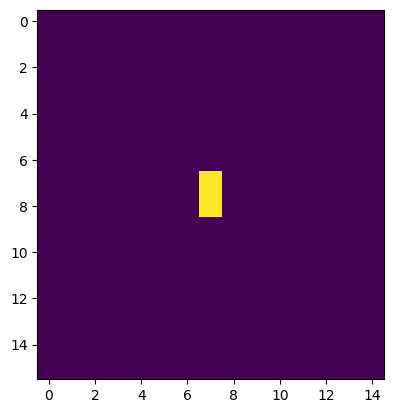

perimeter 2.0
here noise


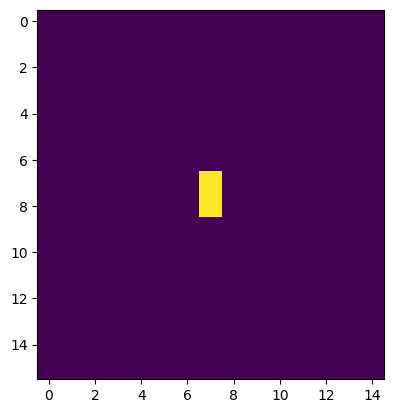

perimeter 2.0
here noise


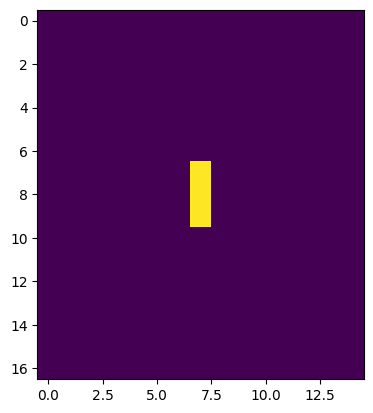

perimeter 4.0
here noise


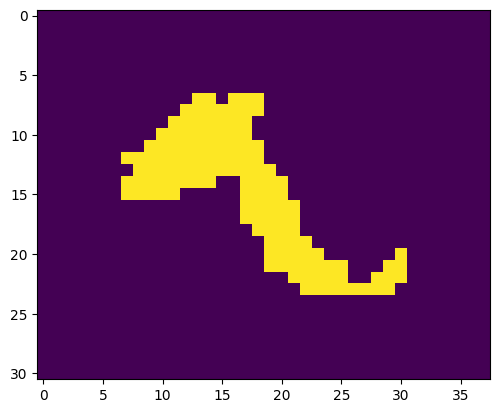

perimeter 77.01219248771667
here minus


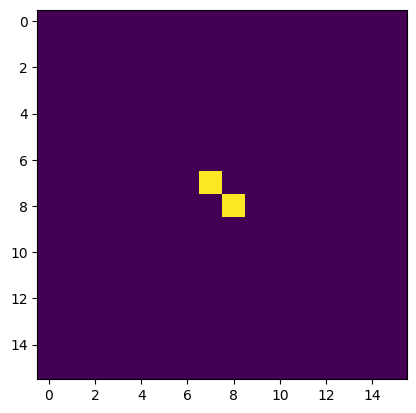

perimeter 2.8284270763397217
here noise


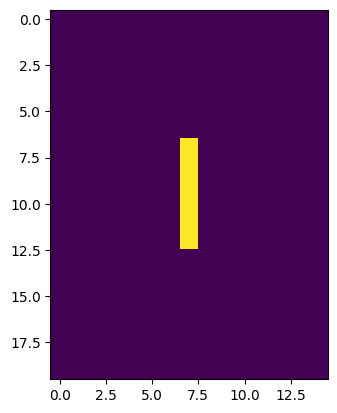

perimeter 10.0
here noise


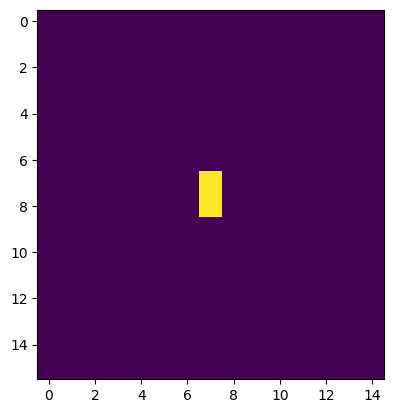

perimeter 2.0
here noise


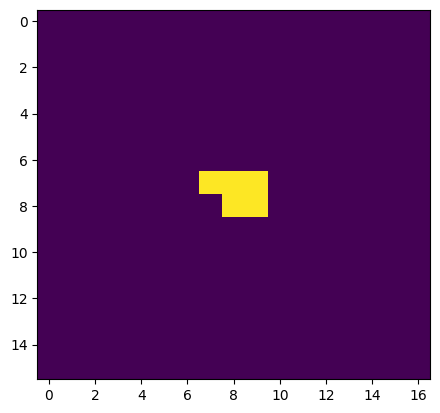

perimeter 5.414213538169861
here noise


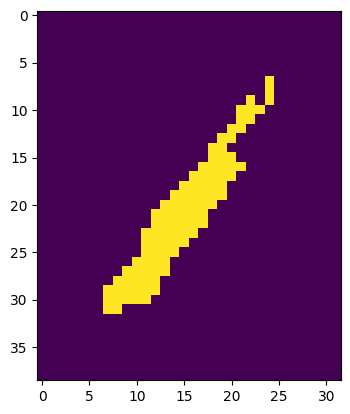

perimeter 67.49747359752655
1/1 [==============================] - 0s 33ms/step
symbol -1


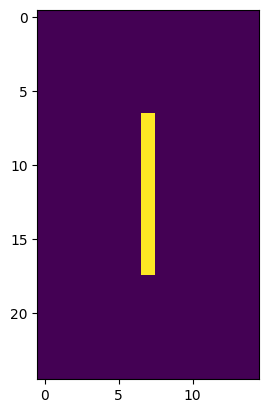

perimeter 20.0
here noise


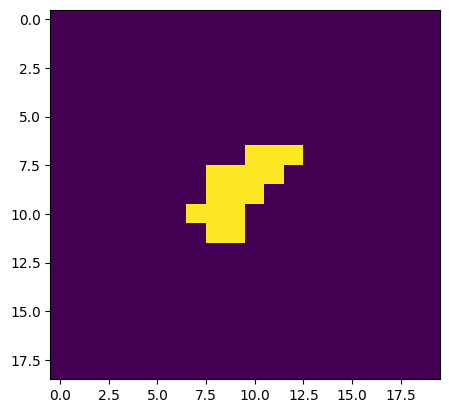

perimeter 14.485281109809875
here noise


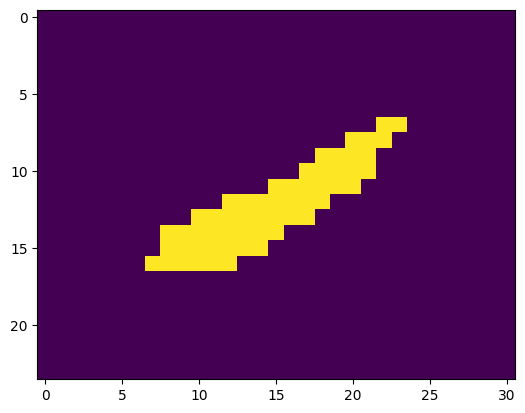

perimeter 40.62741661071777
here minus


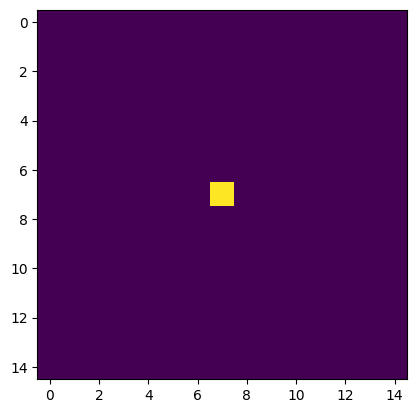

perimeter 0.0
here noise


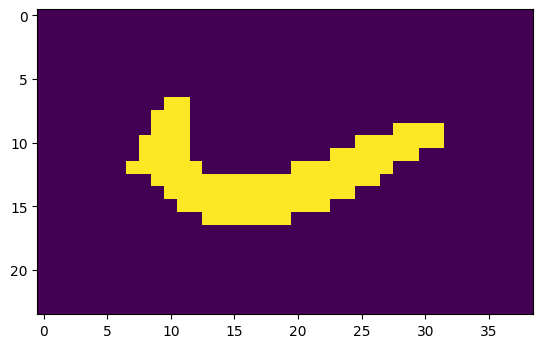

perimeter 62.870057106018066
here minus


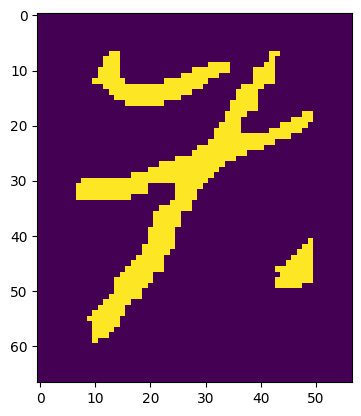

perimeter 205.23758828639984
1/1 [==============================] - 0s 34ms/step
symbol -1--2


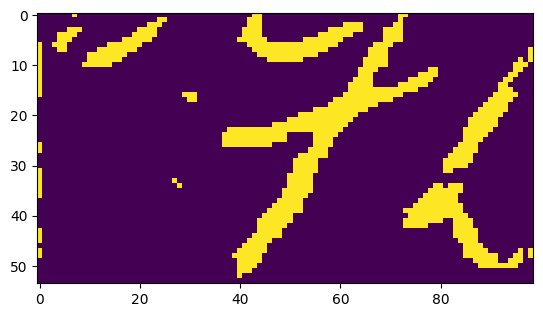

written_answer 0


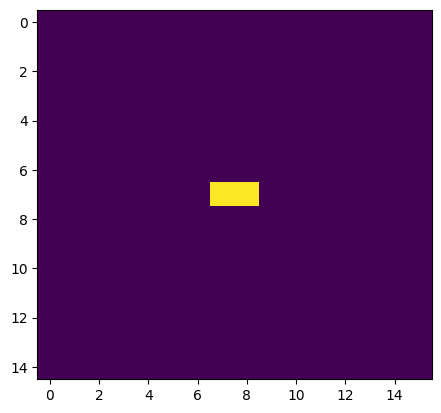

perimeter 2.0
here noise


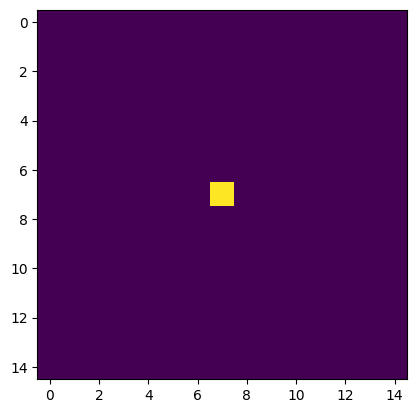

perimeter 0.0
here noise


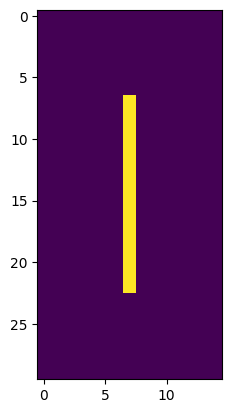

perimeter 30.0
1/1 [==============================] - 0s 53ms/step
symbol 1


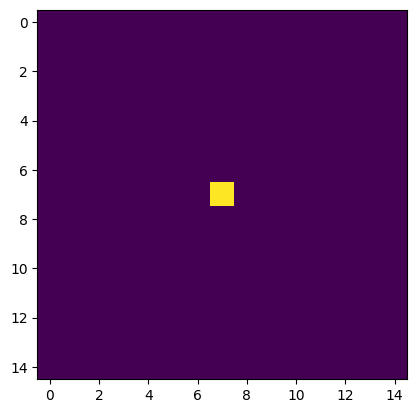

perimeter 0.0
here noise


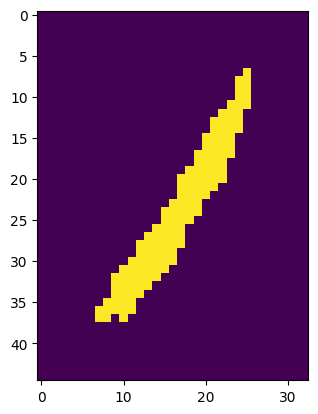

perimeter 77.49747347831726
1/1 [==============================] - 0s 54ms/step
symbol 11


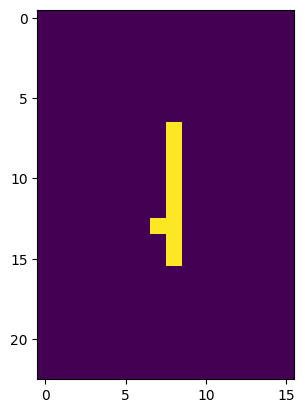

perimeter 16.82842707633972
here noise


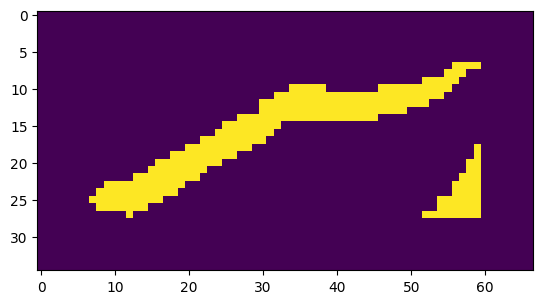

perimeter 121.982754945755
here minus


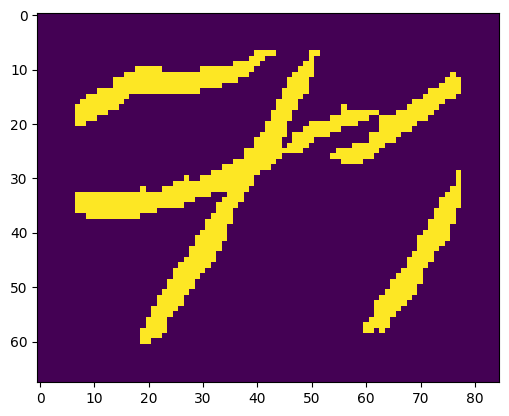

perimeter 304.2914103269577
here minus


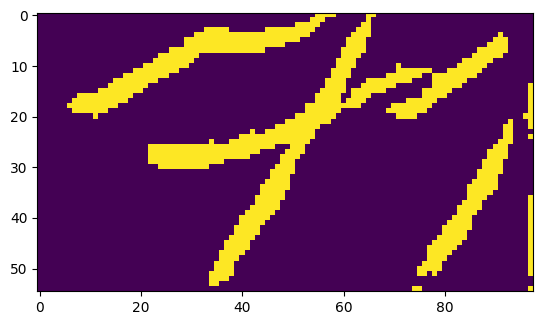

written_answer 0
[]
[]
[]
[]
[]
[]
[]
[]


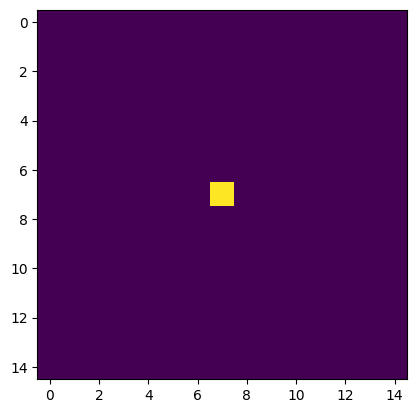

perimeter 0.0
here noise


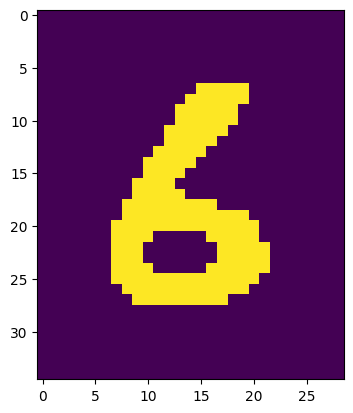

perimeter 67.35533821582794
1/1 [==============================] - 0s 41ms/step
symbol 6


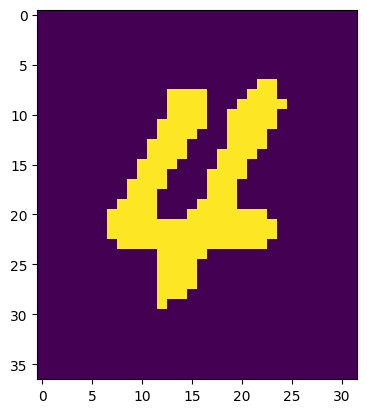

perimeter 101.49747359752655
1/1 [==============================] - 0s 51ms/step
symbol 64


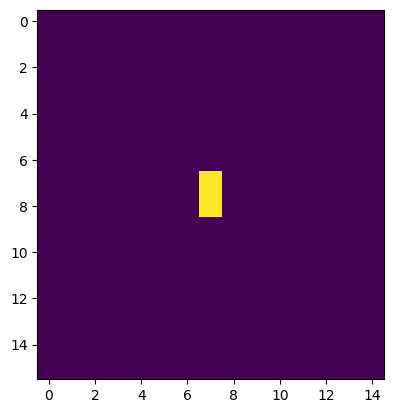

perimeter 2.0
here noise


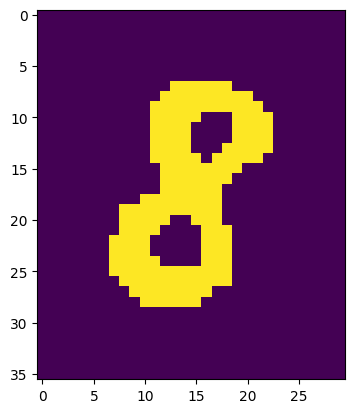

perimeter 64.87005698680878
1/1 [==============================] - 0s 62ms/step
symbol 8


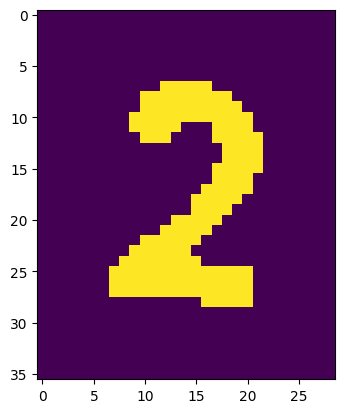

perimeter 86.42640578746796
1/1 [==============================] - 0s 40ms/step
symbol 82


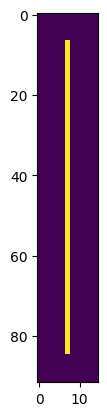

perimeter 154.0
1/1 [==============================] - 0s 37ms/step
symbol 821


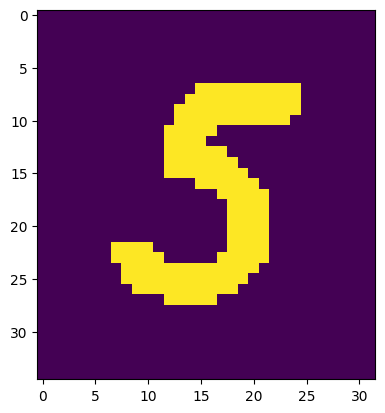

perimeter 87.35533833503723
1/1 [==============================] - 0s 51ms/step
symbol 8215


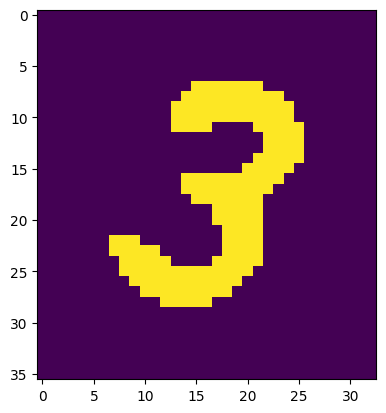

perimeter 93.8406194448471
1/1 [==============================] - 0s 58ms/step
symbol 82153


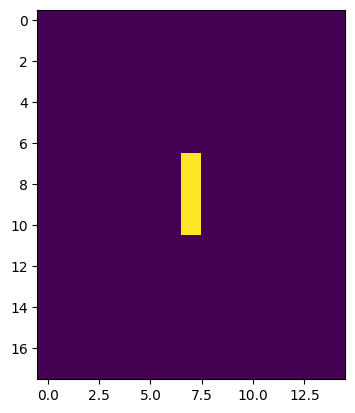

perimeter 6.0
here noise
[0, 64, 0, 82153]


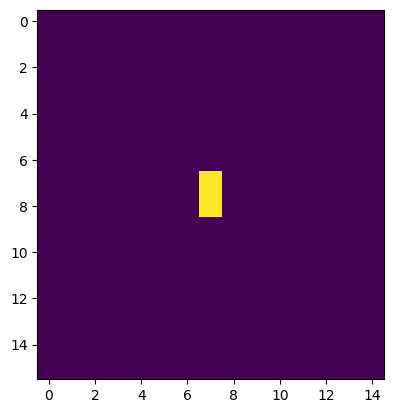

perimeter 2.0
here noise


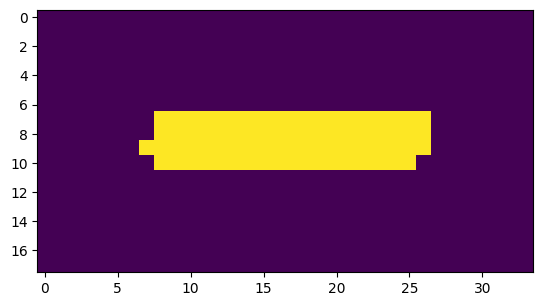

perimeter 42.24264061450958
here minus


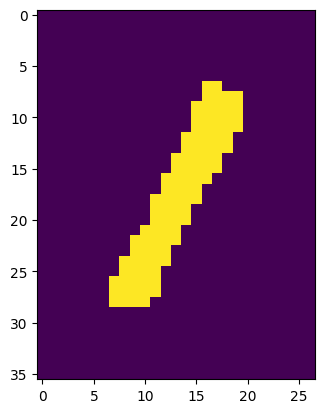

perimeter 54.870057225227356
1/1 [==============================] - 0s 40ms/step
symbol -1


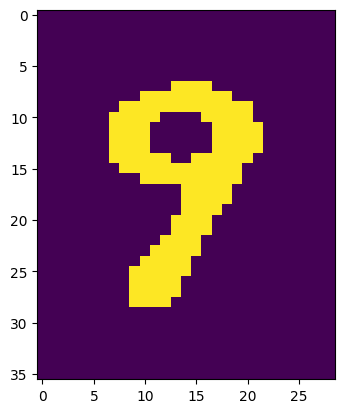

perimeter 66.5269113779068
1/1 [==============================] - 0s 63ms/step
symbol -18


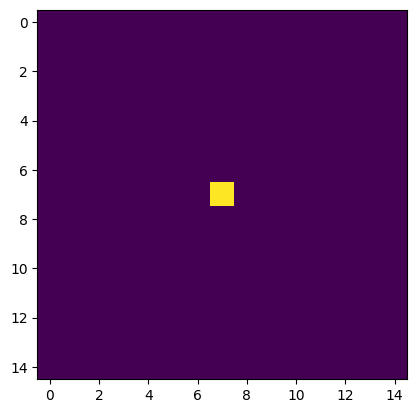

perimeter 0.0
here noise


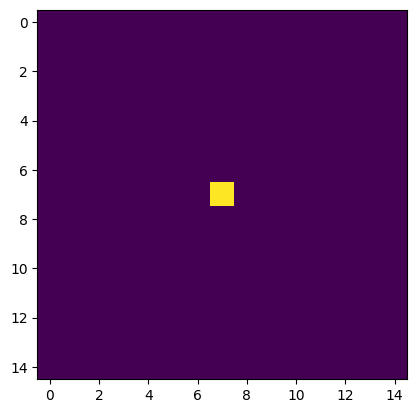

perimeter 0.0
here noise


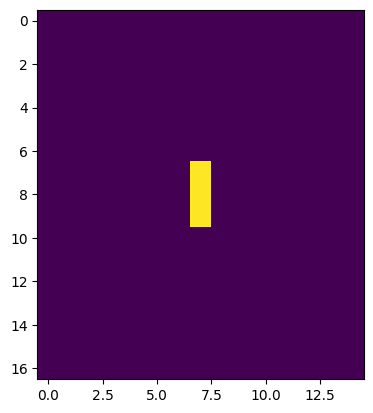

perimeter 4.0
here noise


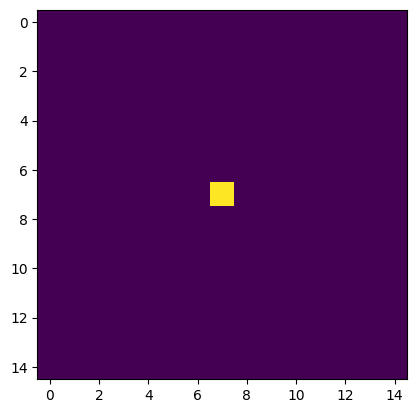

perimeter 0.0
here noise


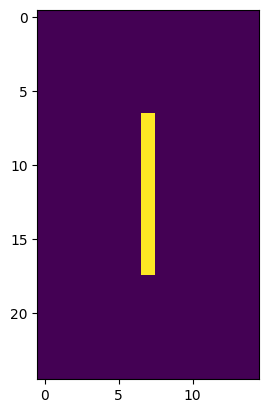

perimeter 20.0
here noise


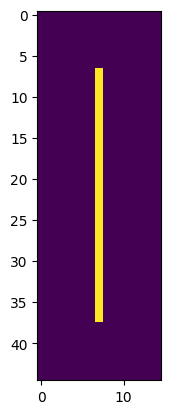

perimeter 60.0
1/1 [==============================] - 0s 34ms/step
symbol 1


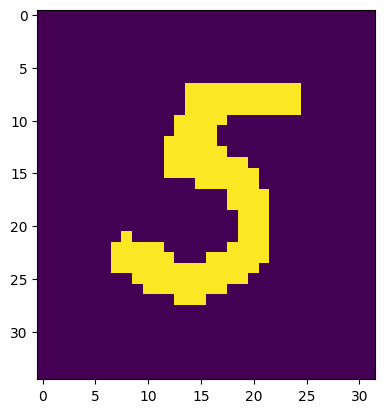

perimeter 89.35533845424652
1/1 [==============================] - 0s 33ms/step
symbol 15


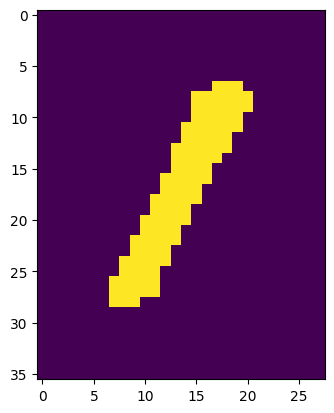

perimeter 56.28427076339722
1/1 [==============================] - 0s 34ms/step
symbol 151


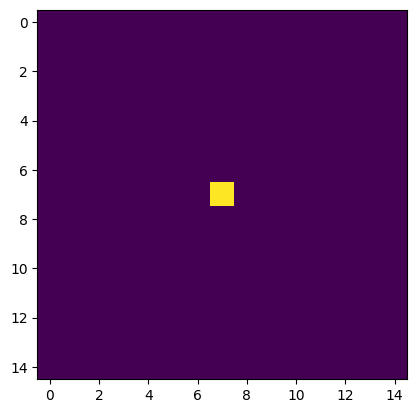

perimeter 0.0
here noise
[0, -18, 0, 0, 0, 151, 0]


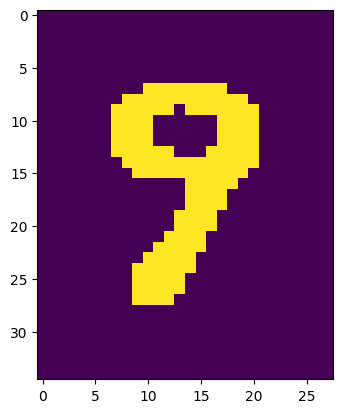

perimeter 64.28427064418793
1/1 [==============================] - 0s 33ms/step
symbol 9


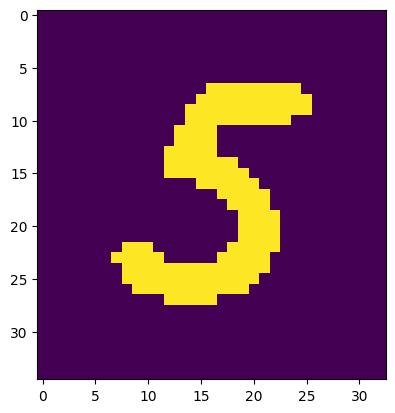

perimeter 89.0121922492981
1/1 [==============================] - 0s 38ms/step
symbol 95


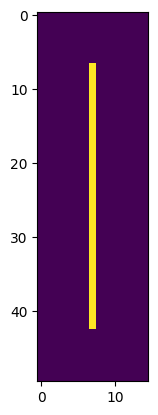

perimeter 70.0
1/1 [==============================] - 0s 38ms/step
symbol 951


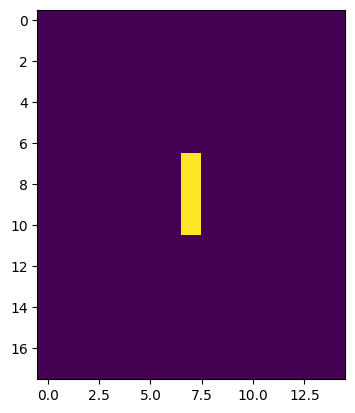

perimeter 6.0
here noise


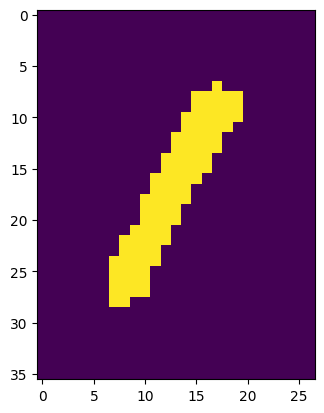

perimeter 54.28427076339722
1/1 [==============================] - 0s 35ms/step
symbol 1


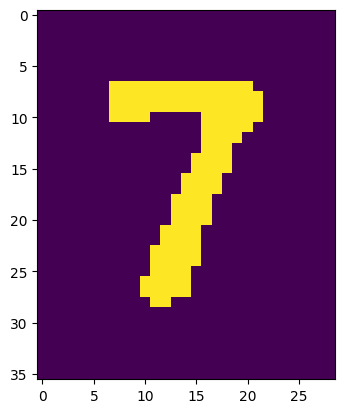

perimeter 73.4558435678482
1/1 [==============================] - 0s 36ms/step
symbol 17


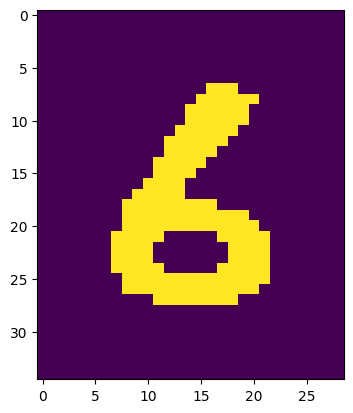

perimeter 67.35533809661865
1/1 [==============================] - 0s 39ms/step
symbol 6


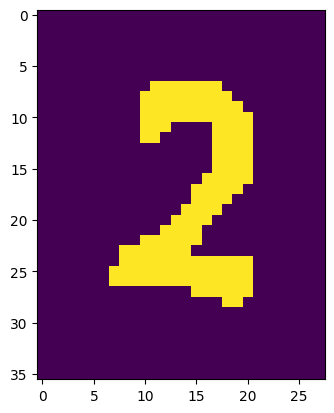

perimeter 83.35533845424652
1/1 [==============================] - 0s 34ms/step
symbol 62


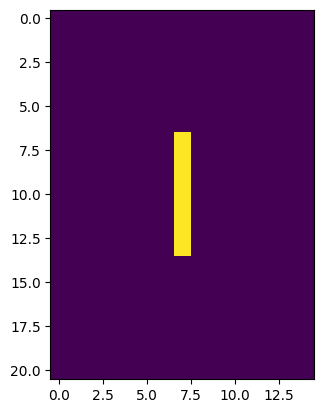

perimeter 12.0
here noise


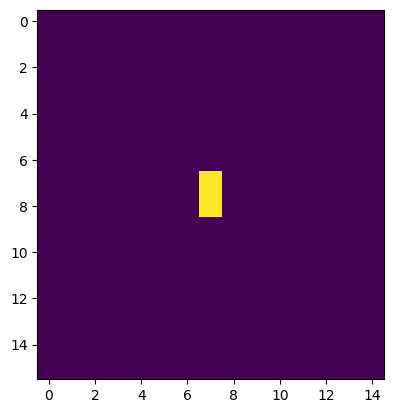

perimeter 2.0
here noise


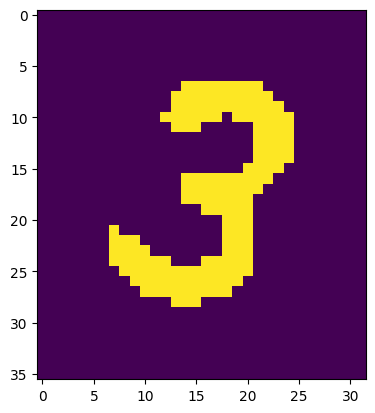

perimeter 95.8406194448471
1/1 [==============================] - 0s 33ms/step
symbol 3


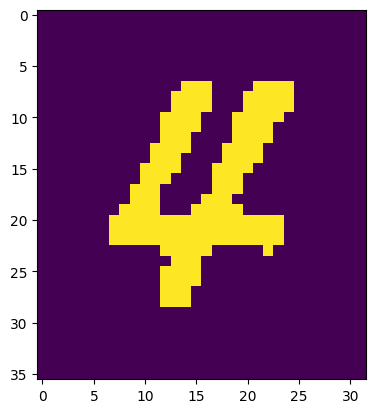

perimeter 104.9116872549057
1/1 [==============================] - 0s 39ms/step
symbol 34
[951, 0, 17, 62, 34]


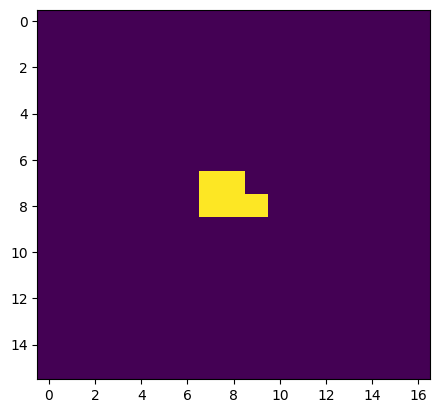

perimeter 5.414213538169861
here noise


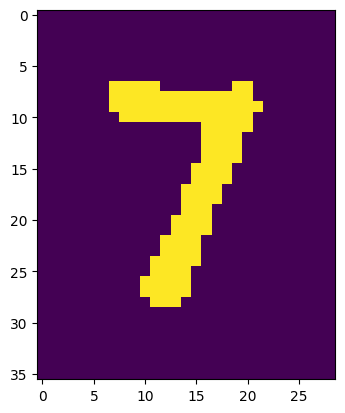

perimeter 72.28427076339722
1/1 [==============================] - 0s 39ms/step
symbol 7


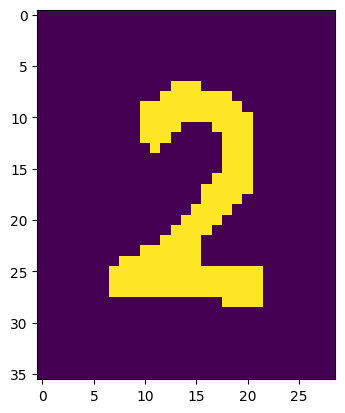

perimeter 86.18376564979553
1/1 [==============================] - 0s 41ms/step
symbol 72


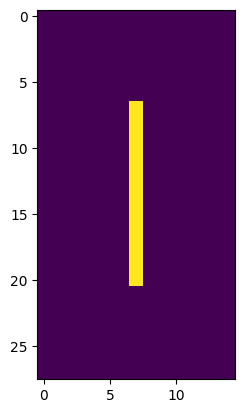

perimeter 26.0
here noise


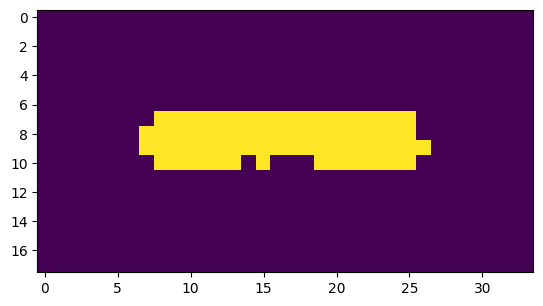

perimeter 43.31370830535889
here minus


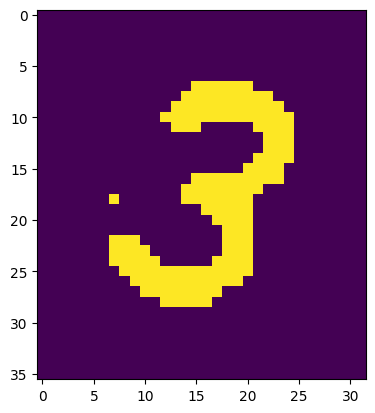

perimeter 93.2548326253891
1/1 [==============================] - 0s 35ms/step
symbol -3


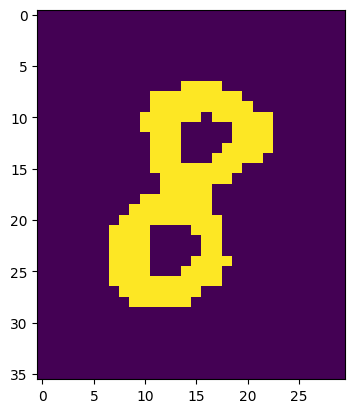

perimeter 67.11269772052765
1/1 [==============================] - 0s 42ms/step
symbol -38


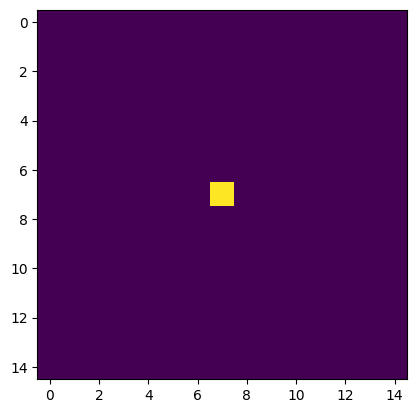

perimeter 0.0
here noise


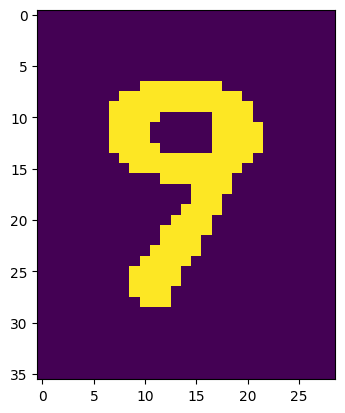

perimeter 67.35533809661865
1/1 [==============================] - 0s 36ms/step
symbol 8


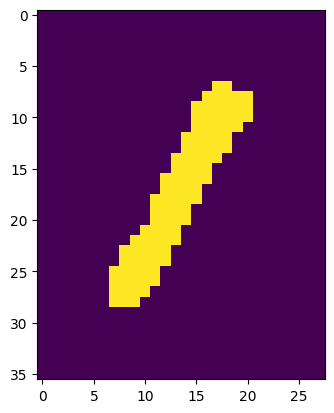

perimeter 55.11269772052765
1/1 [==============================] - 0s 40ms/step
symbol 81


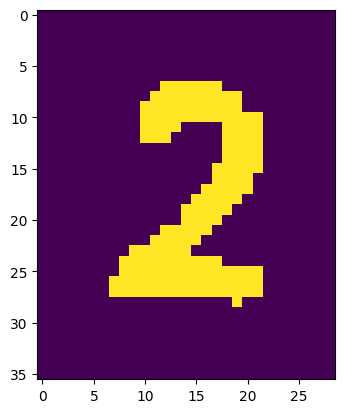

perimeter 88.18376517295837
1/1 [==============================] - 0s 46ms/step
symbol 2


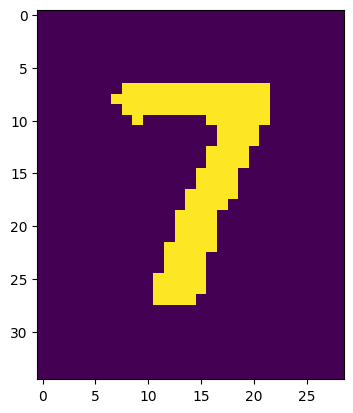

perimeter 70.87005722522736
1/1 [==============================] - 0s 42ms/step
symbol 27


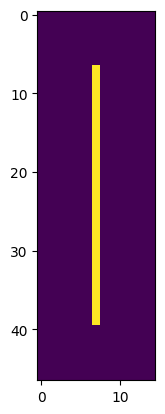

perimeter 64.0
1/1 [==============================] - 0s 46ms/step
symbol 271
[72, -38, 81, 271]


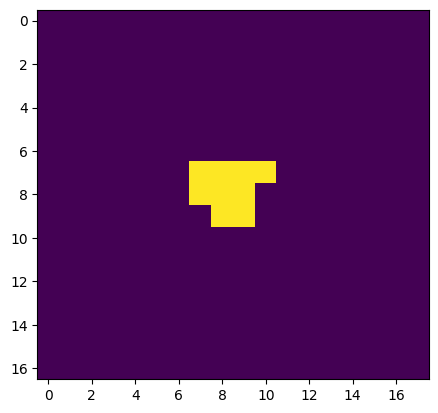

perimeter 8.828427076339722
here noise


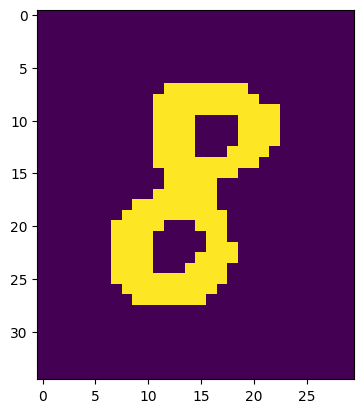

perimeter 64.87005722522736
1/1 [==============================] - 0s 98ms/step
symbol 8


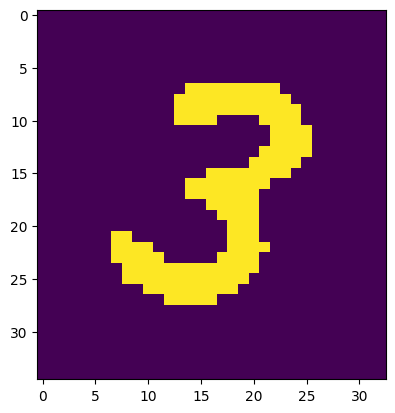

perimeter 93.8406194448471
1/1 [==============================] - 0s 40ms/step
symbol 83


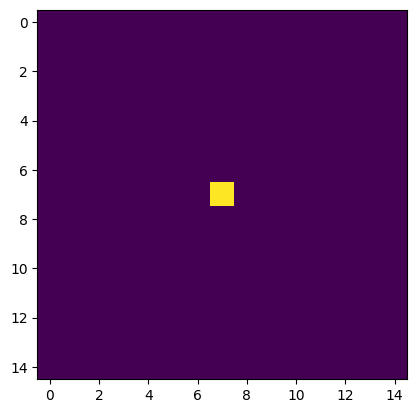

perimeter 0.0
here noise


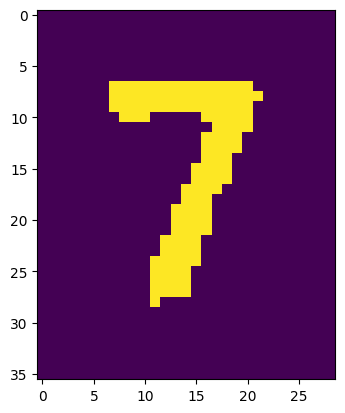

perimeter 72.87005722522736
1/1 [==============================] - 0s 44ms/step
symbol 7


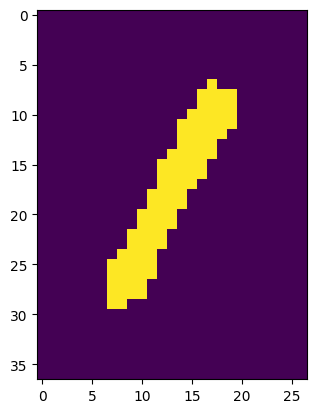

perimeter 55.69848430156708
1/1 [==============================] - 0s 86ms/step
symbol 71


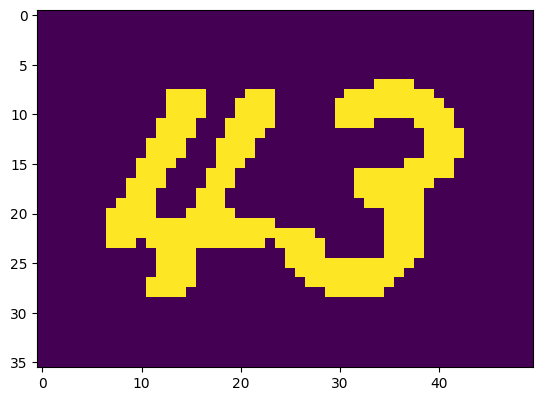

perimeter 197.68123936653137
here minus


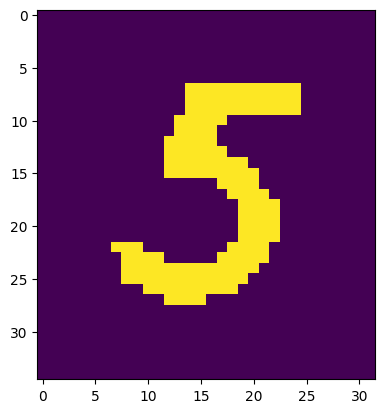

perimeter 89.35533809661865
1/1 [==============================] - 0s 48ms/step
symbol 5


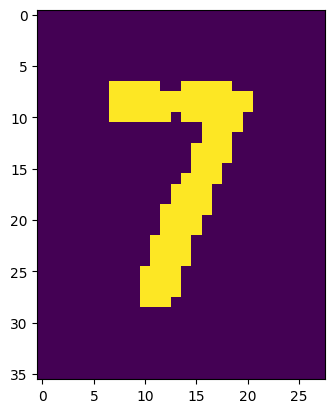

perimeter 72.28427076339722
1/1 [==============================] - 0s 47ms/step
symbol 57
[0, 83, 0, 71, 0, 57]


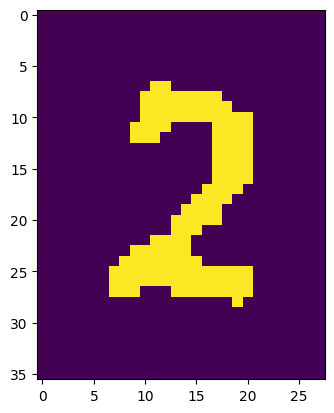

perimeter 86.18376541137695
1/1 [==============================] - 0s 57ms/step
symbol 2


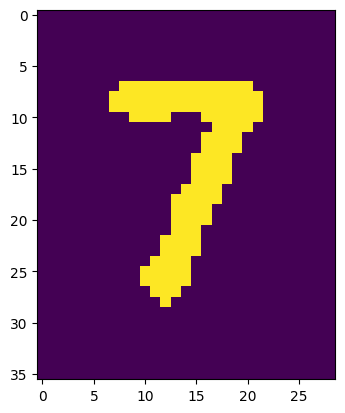

perimeter 71.94112491607666
1/1 [==============================] - 0s 36ms/step
symbol 27


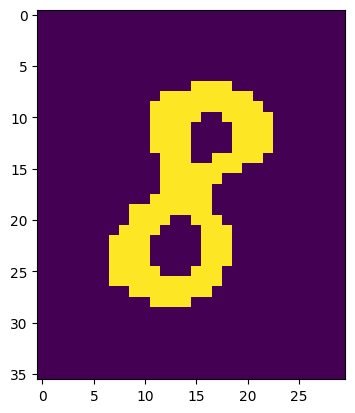

perimeter 65.69848430156708
1/1 [==============================] - 0s 36ms/step
symbol 8


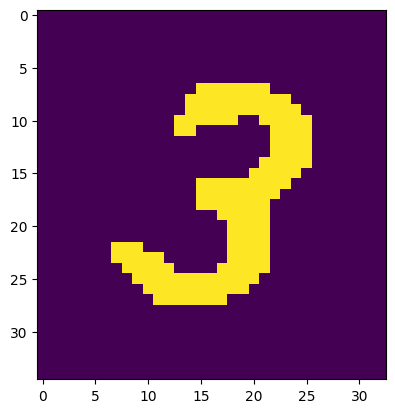

perimeter 92.42640602588654
1/1 [==============================] - 0s 41ms/step
symbol 83


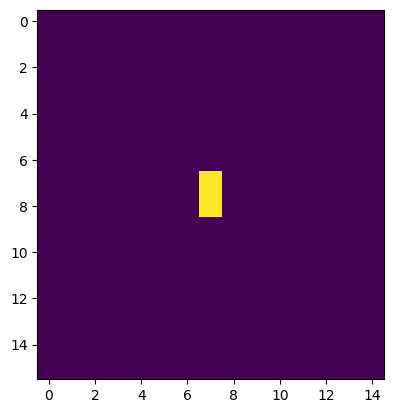

perimeter 2.0
here noise


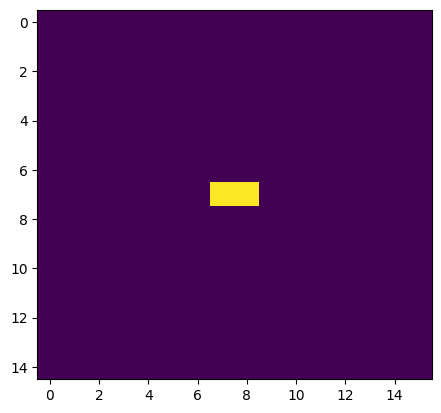

perimeter 2.0
here noise


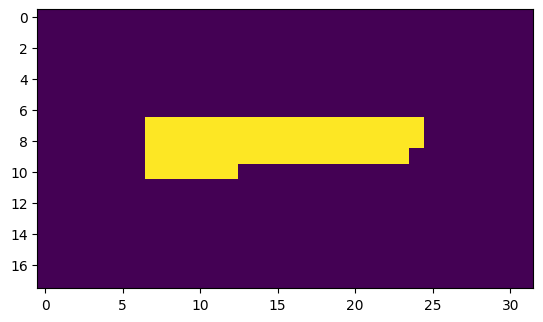

perimeter 38.82842707633972
here minus


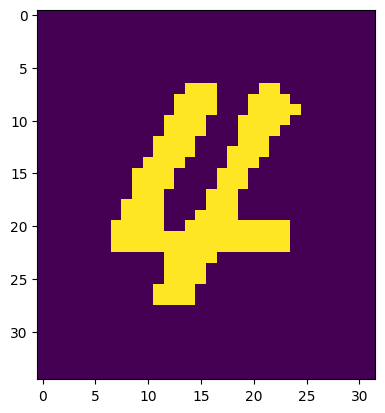

perimeter 103.49747359752655
1/1 [==============================] - 0s 35ms/step
symbol -4


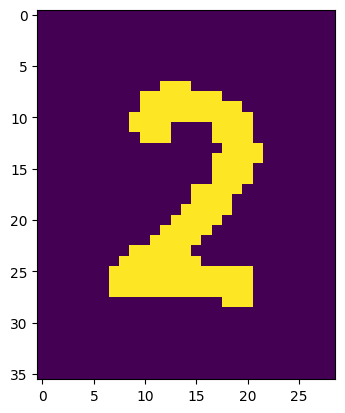

perimeter 87.01219272613525
1/1 [==============================] - 0s 47ms/step
symbol -42


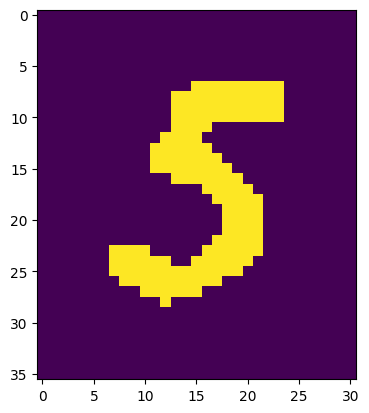

perimeter 87.0121922492981
1/1 [==============================] - 0s 41ms/step
symbol 5


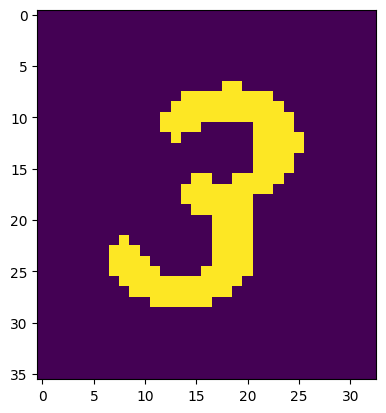

perimeter 96.08326029777527
1/1 [==============================] - 0s 51ms/step
symbol 53
[27, 83, 0, 0, -42, 53]


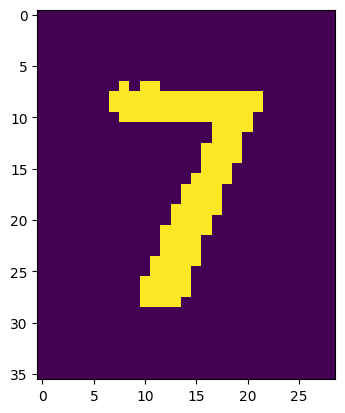

perimeter 73.69848430156708
1/1 [==============================] - 0s 39ms/step
symbol 7


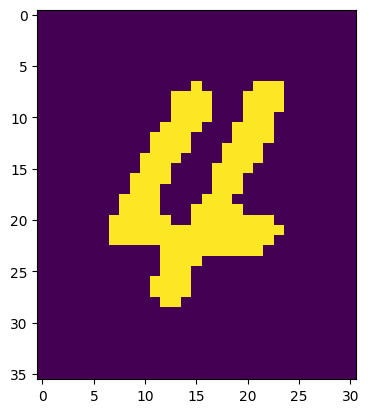

perimeter 101.74011445045471
1/1 [==============================] - 0s 38ms/step
symbol 74


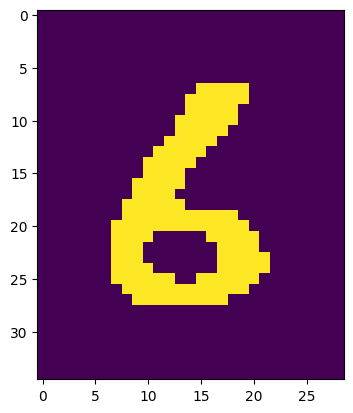

perimeter 67.35533845424652
1/1 [==============================] - 0s 38ms/step
symbol 6


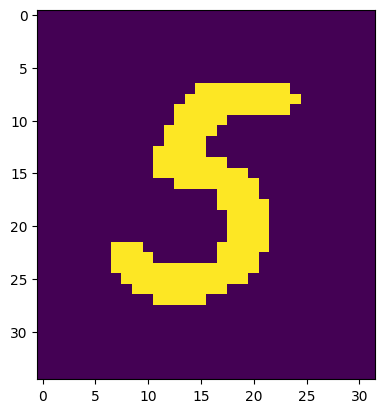

perimeter 88.18376541137695
1/1 [==============================] - 0s 38ms/step
symbol 65


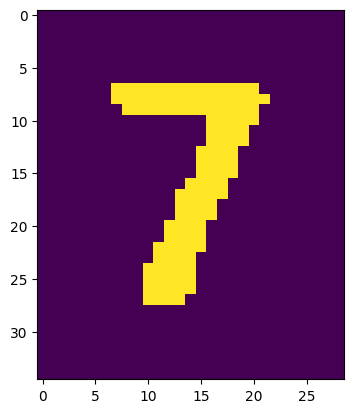

perimeter 70.04163014888763
1/1 [==============================] - 0s 37ms/step
symbol 7


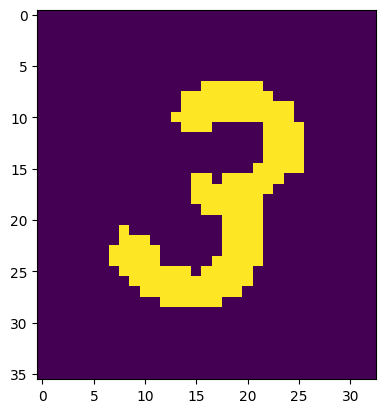

perimeter 97.25483286380768
1/1 [==============================] - 0s 37ms/step
symbol 73


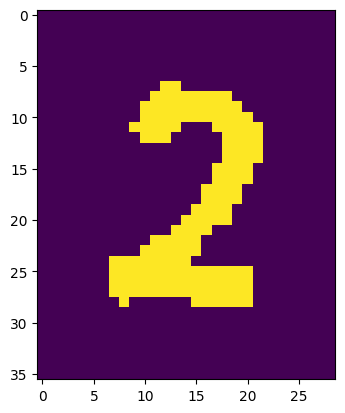

perimeter 88.42640602588654
1/1 [==============================] - 0s 40ms/step
symbol 2


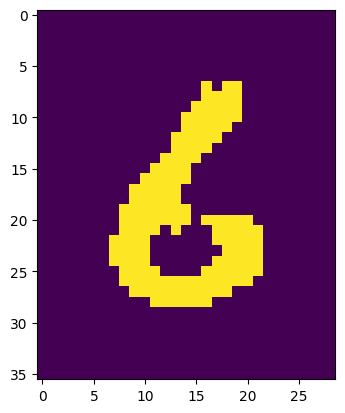

perimeter 88.91168737411499
1/1 [==============================] - 0s 36ms/step
symbol 26
[74, 65, 73, 26]


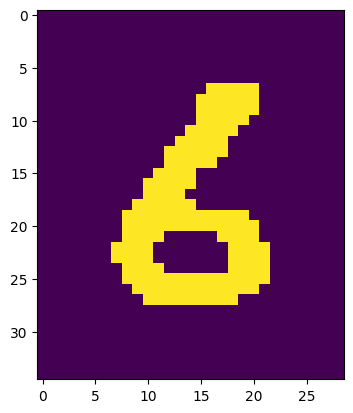

perimeter 67.94112467765808
1/1 [==============================] - 0s 38ms/step
symbol 6


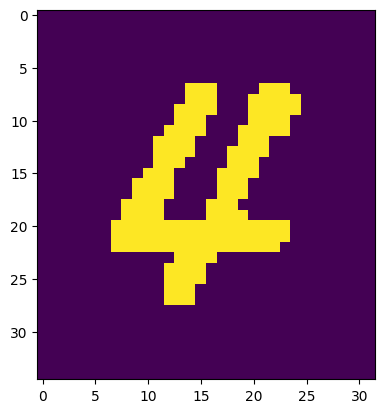

perimeter 102.66904675960541
1/1 [==============================] - 0s 39ms/step
symbol 64


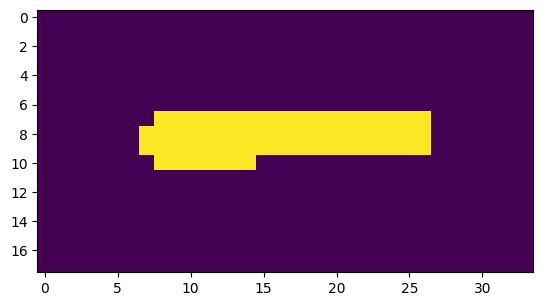

perimeter 42.24264061450958
here minus


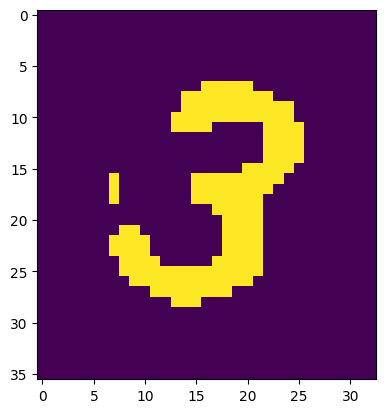

perimeter 95.5979790687561
1/1 [==============================] - 0s 34ms/step
symbol -3


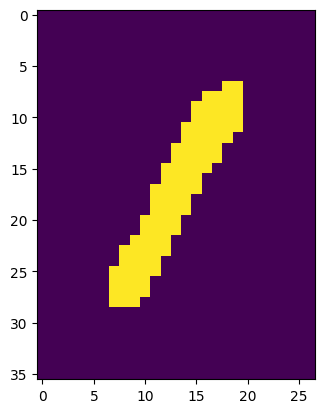

perimeter 54.28427076339722
1/1 [==============================] - 0s 34ms/step
symbol -31


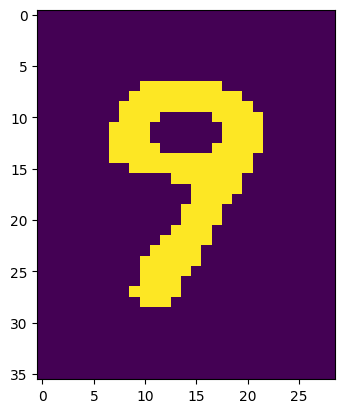

perimeter 67.35533845424652
1/1 [==============================] - 0s 40ms/step
symbol 9


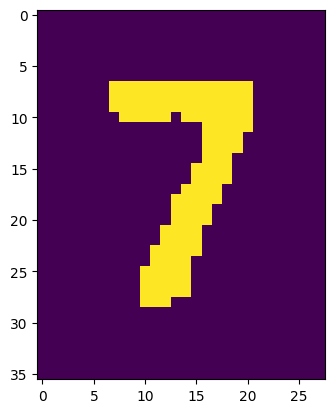

perimeter 72.04163014888763
1/1 [==============================] - 0s 71ms/step
symbol 97


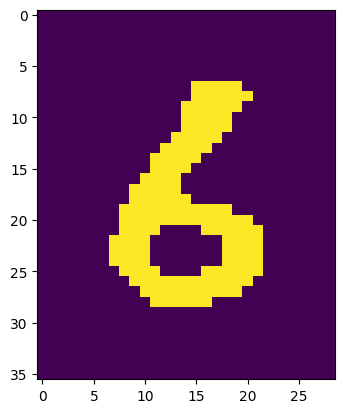

perimeter 68.18376553058624
1/1 [==============================] - 0s 44ms/step
symbol 6


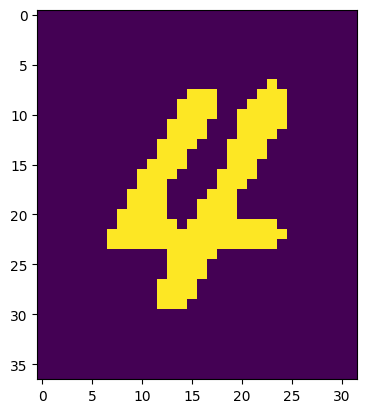

perimeter 105.15432786941528
1/1 [==============================] - 0s 34ms/step
symbol 64


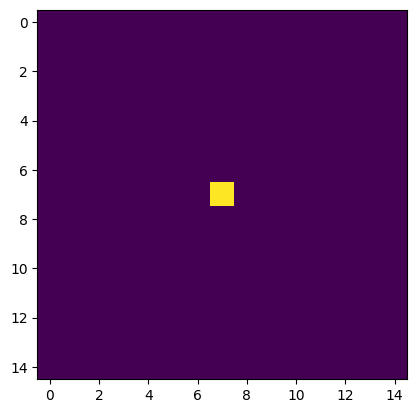

perimeter 0.0
here noise


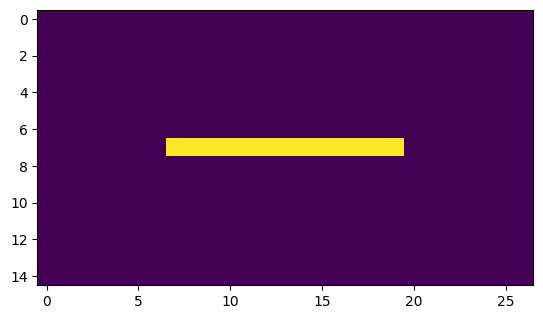

perimeter 24.0
here noise


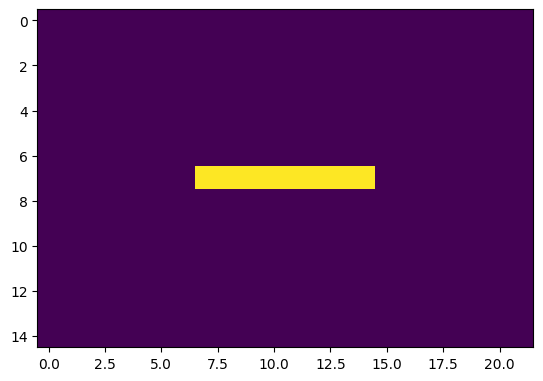

perimeter 14.0
here noise


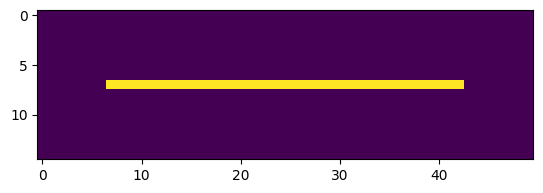

perimeter 70.0
here minus


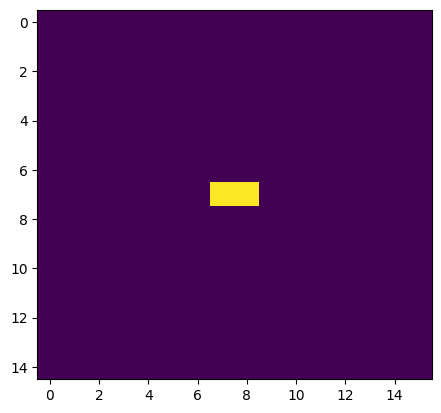

perimeter 2.0
here noise
[64, -31, 97, 64, 0]


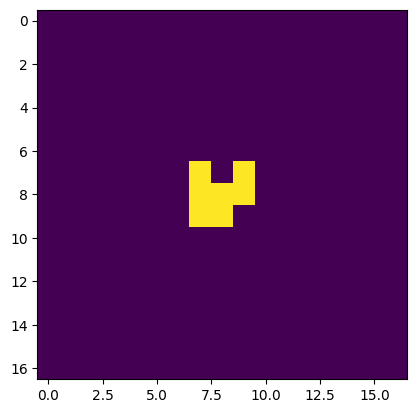

perimeter 8.242640614509583
here noise


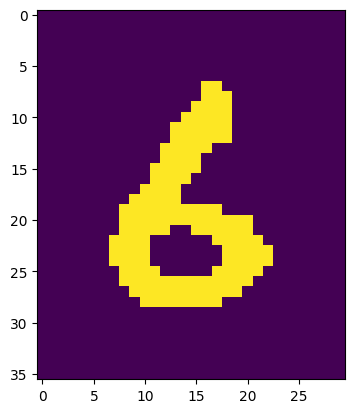

perimeter 67.35533809661865
1/1 [==============================] - 0s 40ms/step
symbol 6


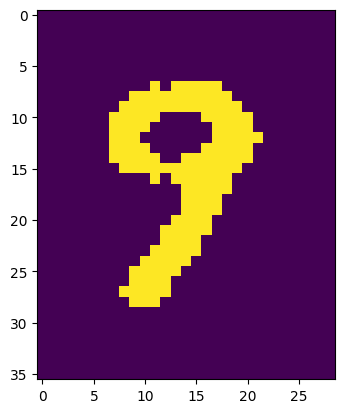

perimeter 67.84061932563782
1/1 [==============================] - 0s 37ms/step
symbol 68


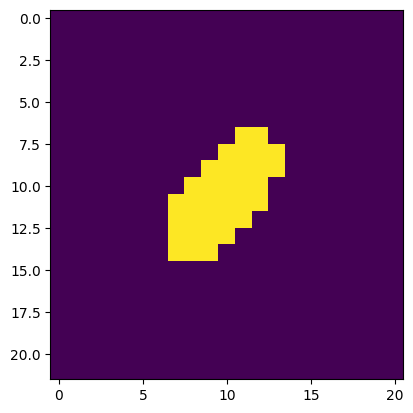

perimeter 20.727921724319458
here noise


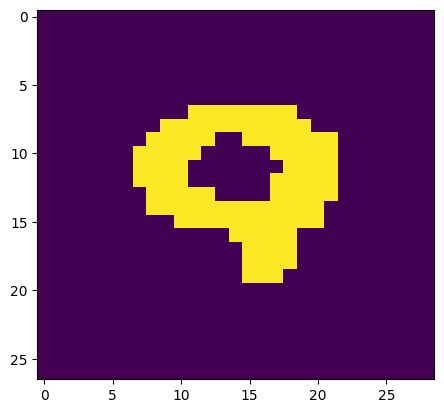

perimeter 44.97056245803833
here minus


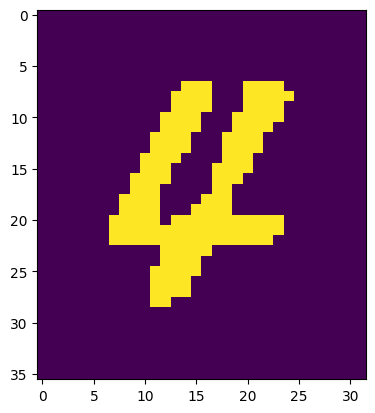

perimeter 105.49747371673584
1/1 [==============================] - 0s 45ms/step
symbol -4


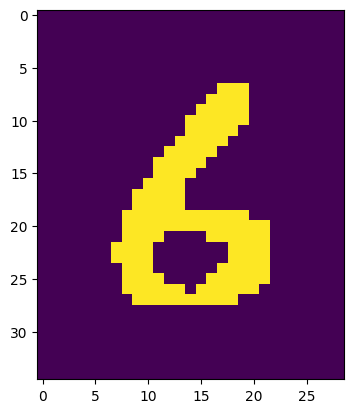

perimeter 67.11269736289978
1/1 [==============================] - 0s 43ms/step
symbol 6


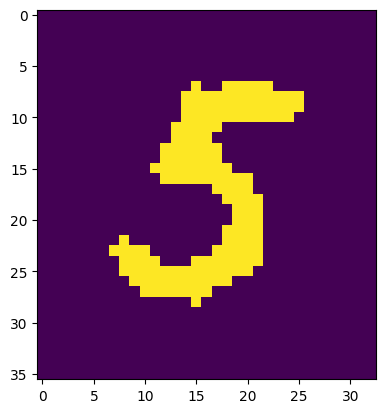

perimeter 92.08326017856598
1/1 [==============================] - 0s 49ms/step
symbol 65


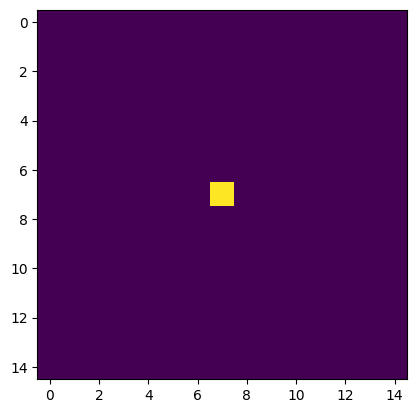

perimeter 0.0
here noise


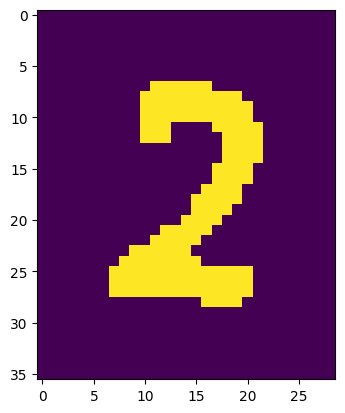

perimeter 86.18376564979553
1/1 [==============================] - 0s 44ms/step
symbol 2


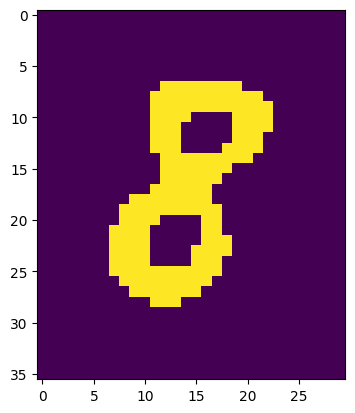

perimeter 65.11269772052765
1/1 [==============================] - 0s 34ms/step
symbol 28


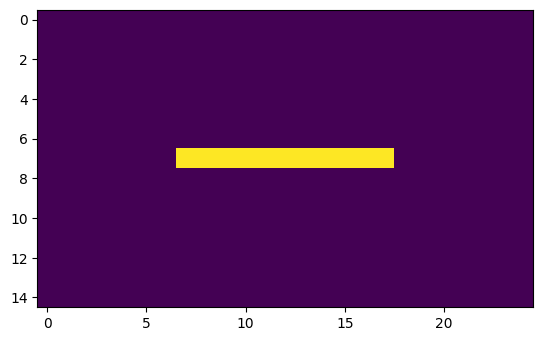

perimeter 20.0
here noise


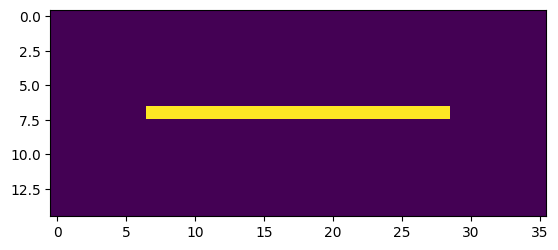

perimeter 42.0
here minus


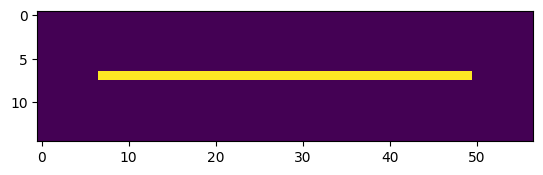

perimeter 84.0
here minus


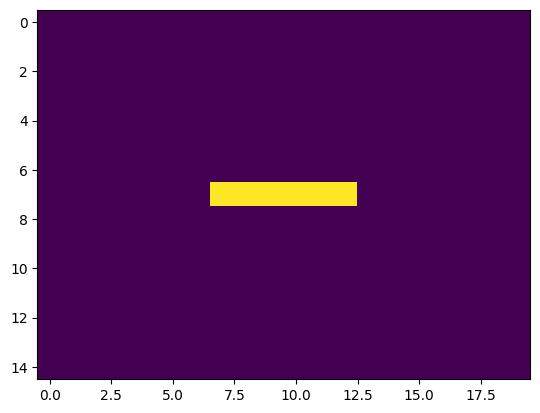

perimeter 10.0
here noise
[68, -4, 65, 28, 0]


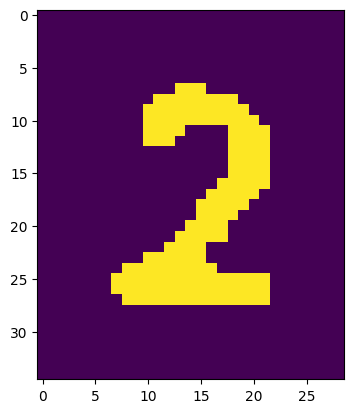

perimeter 84.7695517539978
1/1 [==============================] - 0s 52ms/step
symbol 2


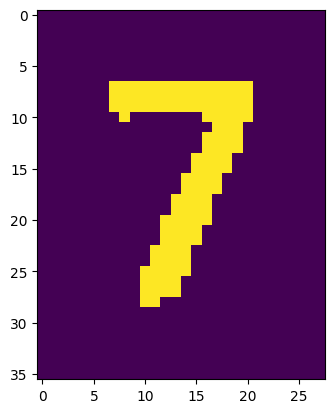

perimeter 72.87005722522736
1/1 [==============================] - 0s 45ms/step
symbol 27


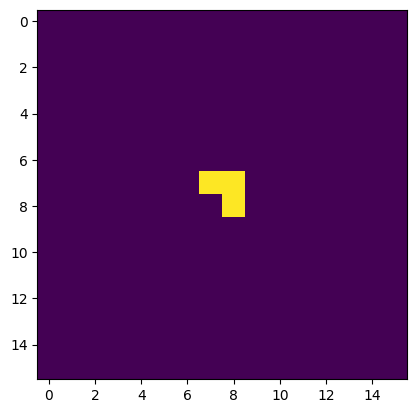

perimeter 3.414213538169861
here noise


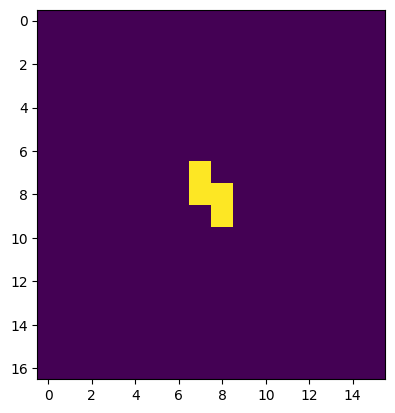

perimeter 4.828427076339722
here noise


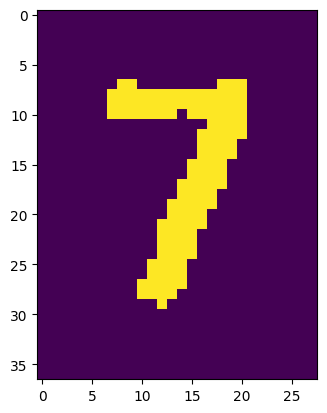

perimeter 75.11269783973694
1/1 [==============================] - 0s 42ms/step
symbol 7


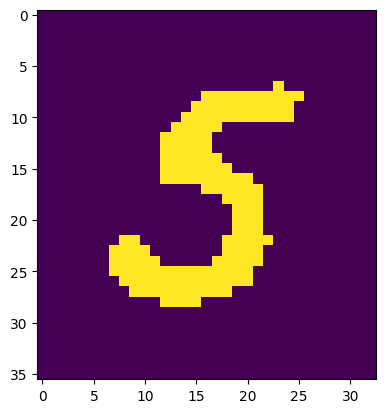

perimeter 91.8406194448471
1/1 [==============================] - 0s 43ms/step
symbol 75


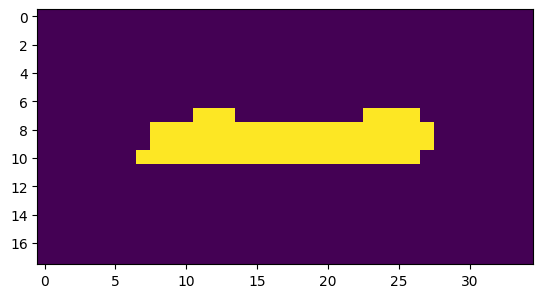

perimeter 44.485281229019165
here minus


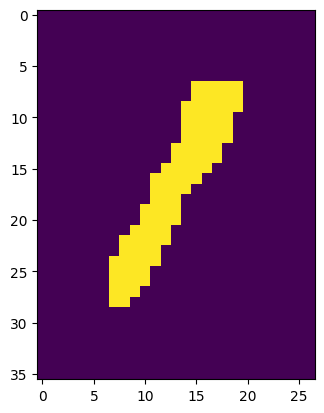

perimeter 54.870057225227356
1/1 [==============================] - 0s 43ms/step
symbol -1


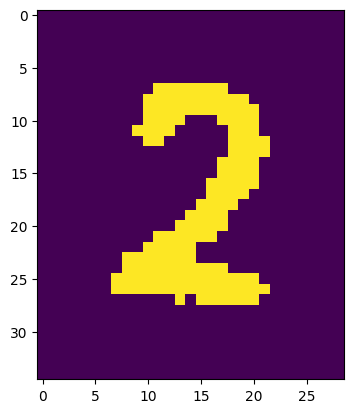

perimeter 88.66904652118683
1/1 [==============================] - 0s 43ms/step
symbol -12


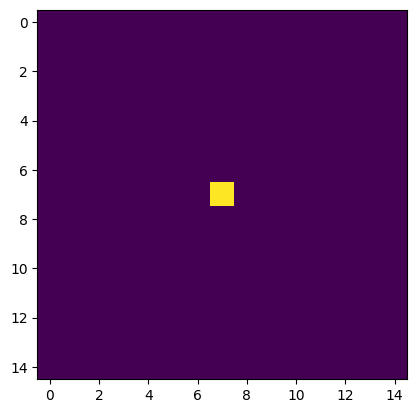

perimeter 0.0
here noise


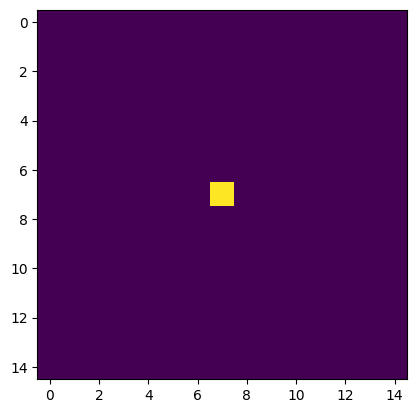

perimeter 0.0
here noise


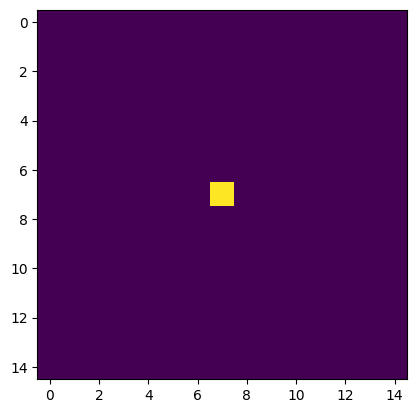

perimeter 0.0
here noise


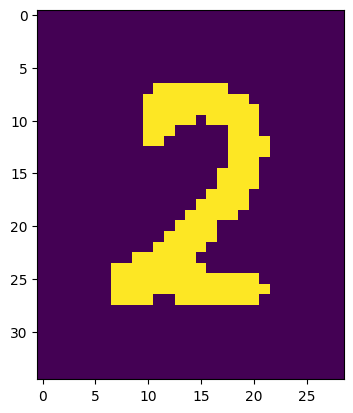

perimeter 88.4264065027237
1/1 [==============================] - 0s 43ms/step
symbol 2


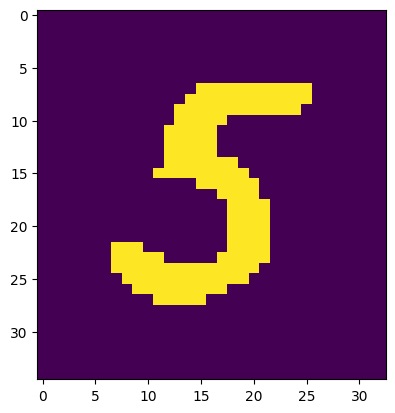

perimeter 89.35533845424652
1/1 [==============================] - 0s 38ms/step
symbol 25


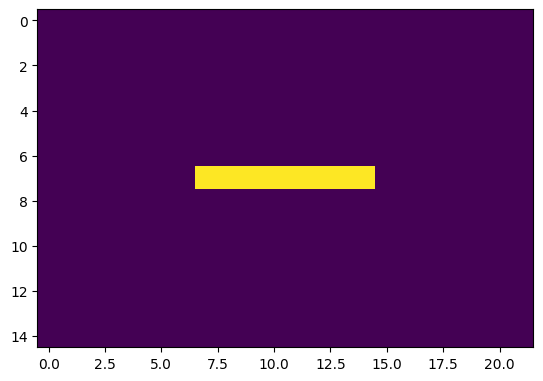

perimeter 14.0
here noise


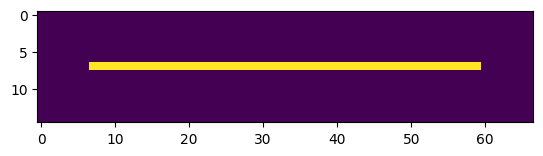

perimeter 104.0
here minus


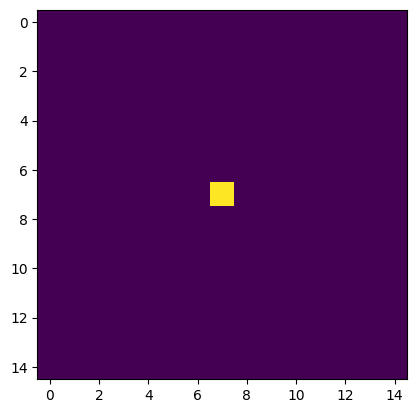

perimeter 0.0
here noise


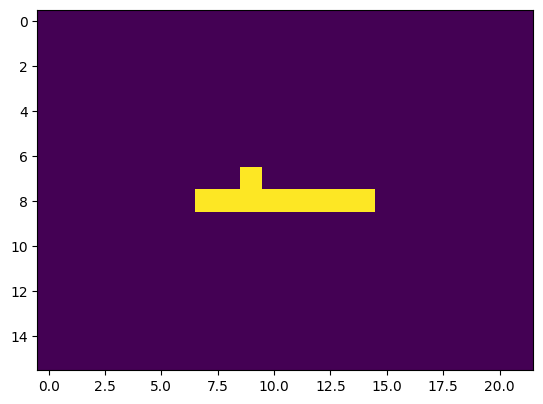

perimeter 14.828427076339722
here noise
[27, 0, 75, -12, 0, 25, 0]


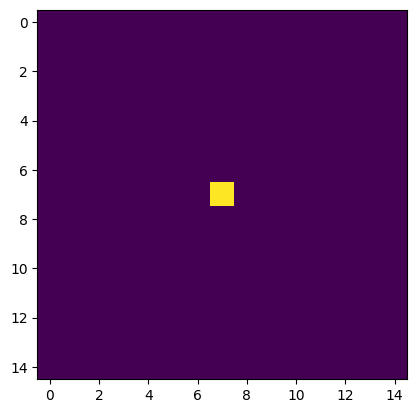

perimeter 0.0
here noise


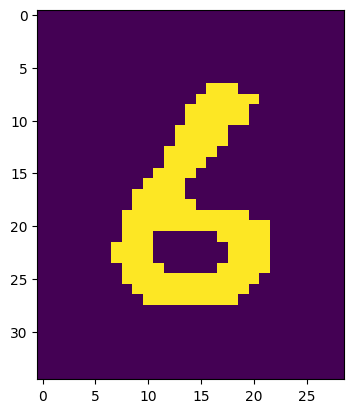

perimeter 67.35533821582794
1/1 [==============================] - 0s 72ms/step
symbol 6


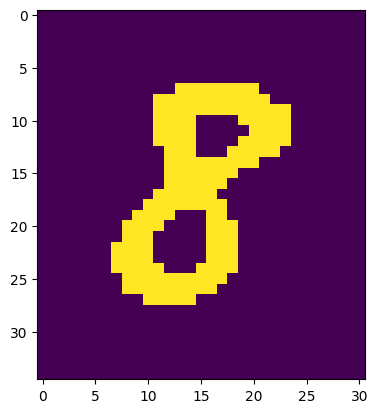

perimeter 65.69848418235779
1/1 [==============================] - 0s 44ms/step
symbol 68


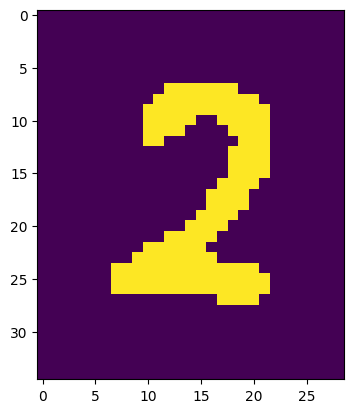

perimeter 86.42640590667725
1/1 [==============================] - 0s 42ms/step
symbol 2


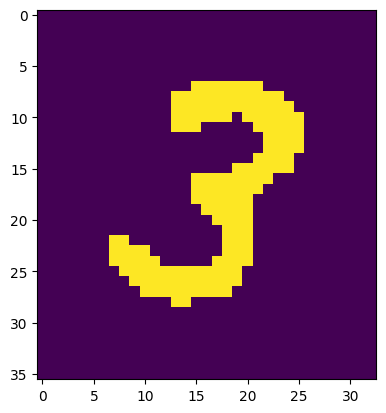

perimeter 93.84061920642853
1/1 [==============================] - 0s 56ms/step
symbol 23


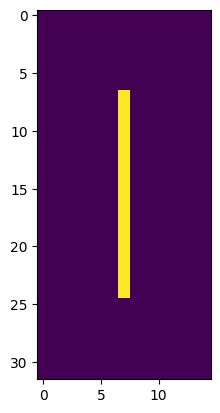

perimeter 34.0
1/1 [==============================] - 0s 35ms/step
symbol 1


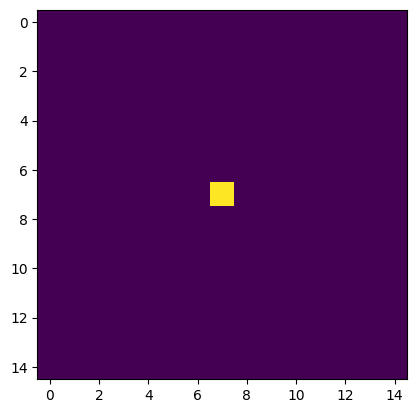

perimeter 0.0
here noise


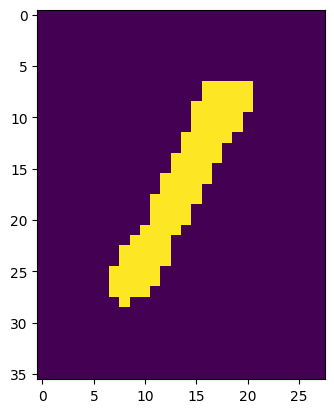

perimeter 55.69848418235779
1/1 [==============================] - 0s 86ms/step
symbol 11


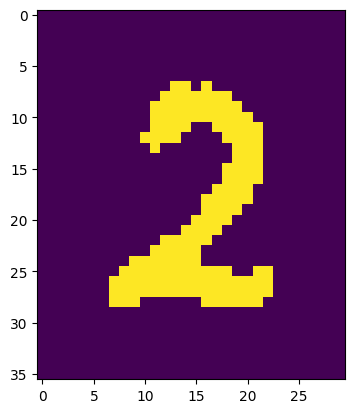

perimeter 91.74011421203613
1/1 [==============================] - 0s 54ms/step
symbol 112


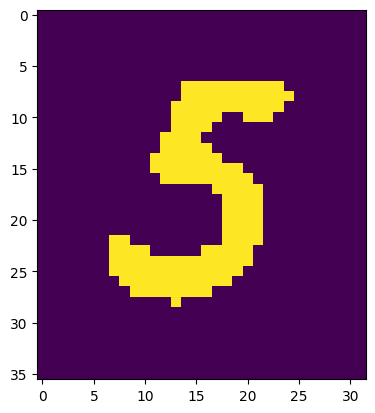

perimeter 90.42640590667725
1/1 [==============================] - 0s 41ms/step
symbol 5


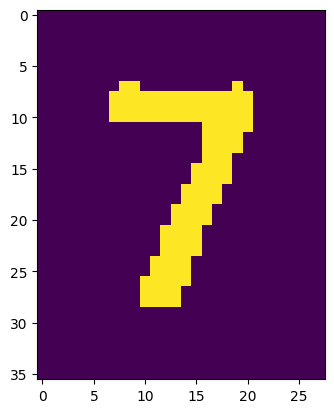

perimeter 71.4558436870575
1/1 [==============================] - 0s 42ms/step
symbol 57


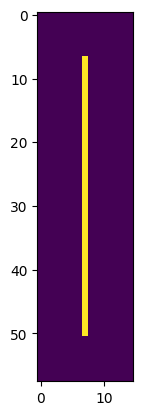

perimeter 86.0
1/1 [==============================] - 0s 50ms/step
symbol 571
[68, 23, 112, 571]


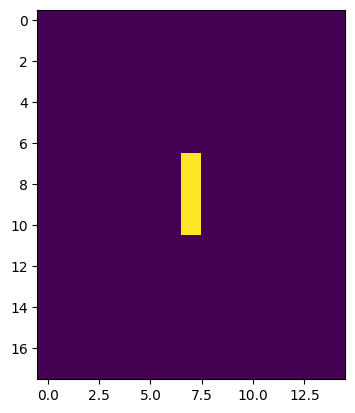

perimeter 6.0
here noise


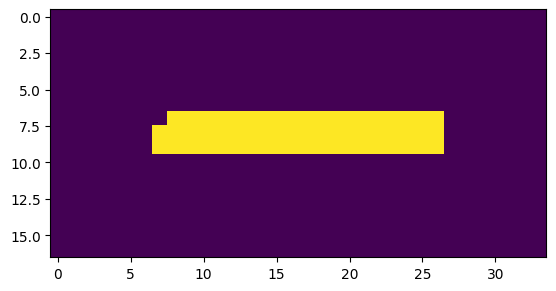

perimeter 41.41421353816986
here minus


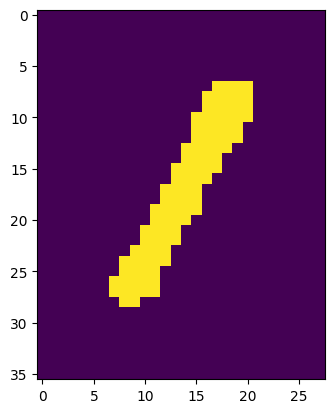

perimeter 55.69848430156708
1/1 [==============================] - 0s 56ms/step
symbol -1


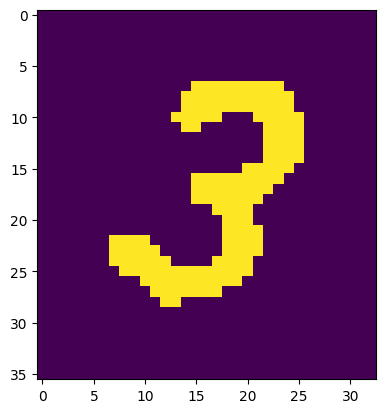

perimeter 95.25483310222626
1/1 [==============================] - 0s 56ms/step
symbol -13


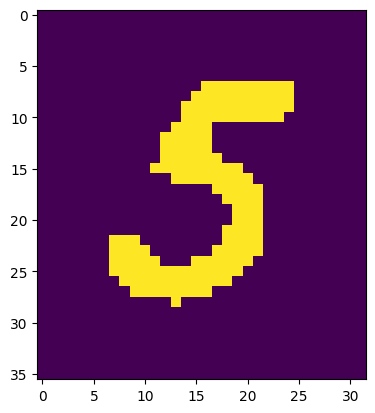

perimeter 90.42640578746796
1/1 [==============================] - 0s 48ms/step
symbol 5


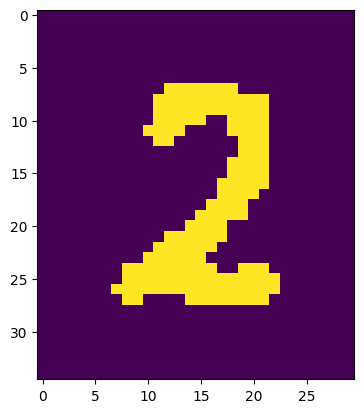

perimeter 91.25483310222626
1/1 [==============================] - 0s 41ms/step
symbol 52


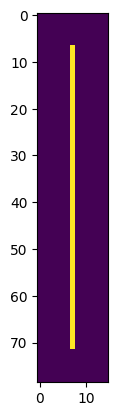

perimeter 128.0
1/1 [==============================] - 0s 42ms/step
symbol 521


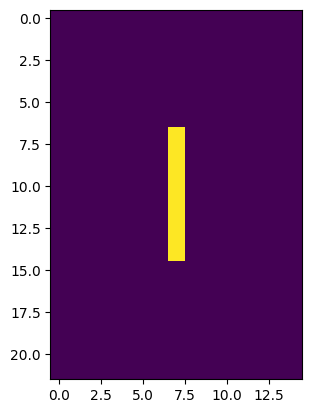

perimeter 14.0
here noise


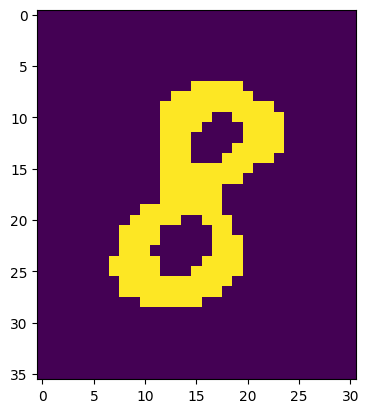

perimeter 66.28427076339722
1/1 [==============================] - 0s 64ms/step
symbol 5218


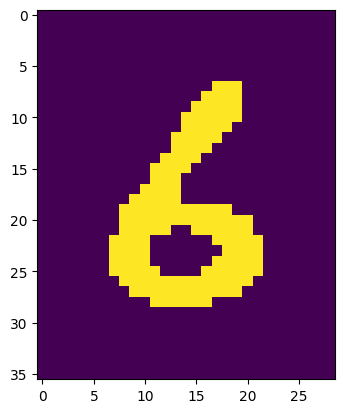

perimeter 67.35533797740936
1/1 [==============================] - 0s 47ms/step
symbol 52186


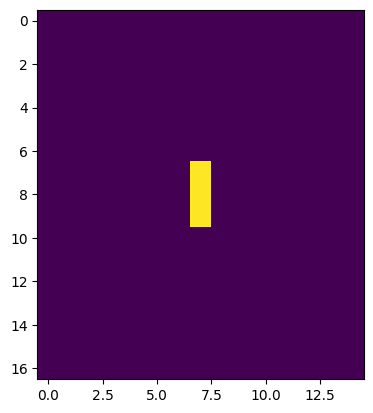

perimeter 4.0
here noise
[0, -13, 52186]


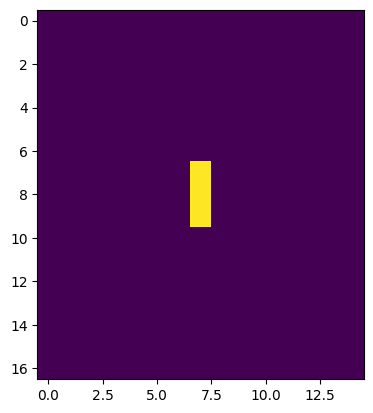

perimeter 4.0
here noise


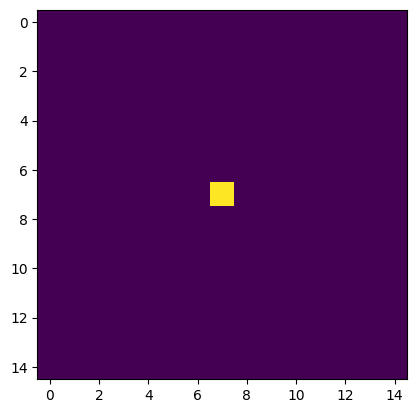

perimeter 0.0
here noise


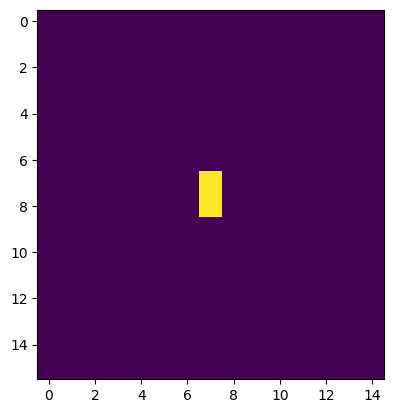

perimeter 2.0
here noise


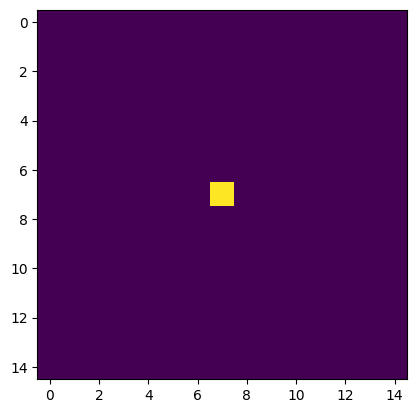

perimeter 0.0
here noise


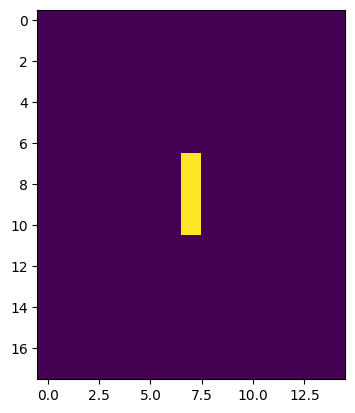

perimeter 6.0
here noise


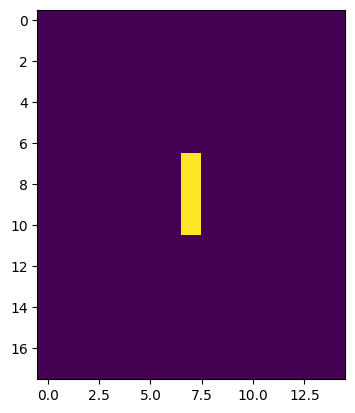

perimeter 6.0
here noise


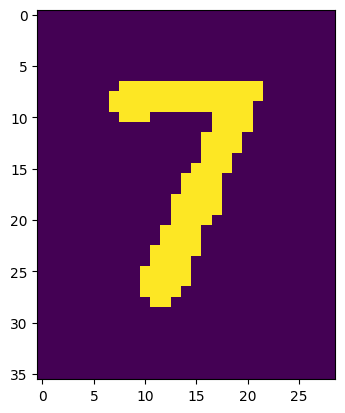

perimeter 73.69848430156708
1/1 [==============================] - 0s 44ms/step
symbol 7


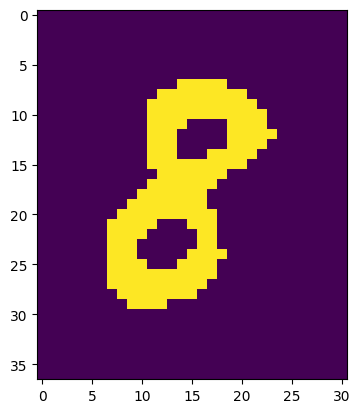

perimeter 66.76955187320709
1/1 [==============================] - 0s 36ms/step
symbol 78


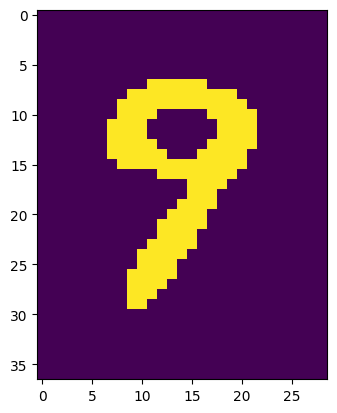

perimeter 68.76955163478851
1/1 [==============================] - 0s 45ms/step
symbol 788


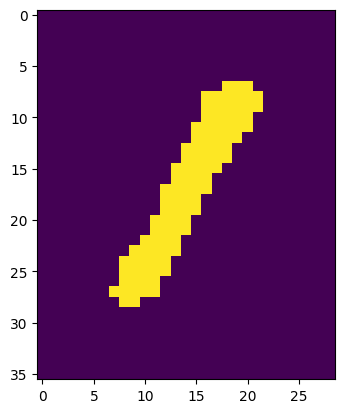

perimeter 56.52691125869751
1/1 [==============================] - 0s 42ms/step
symbol 7881


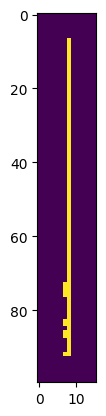

perimeter 173.89949476718903
1/1 [==============================] - 0s 35ms/step
symbol 78811
[0, 0, 0, 0, 0, 78811]


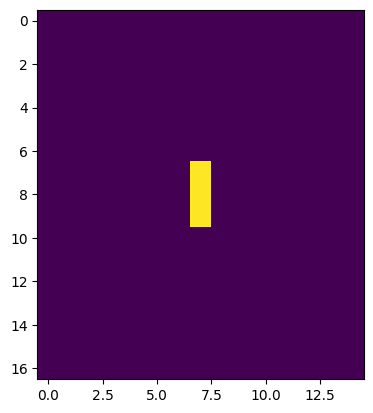

perimeter 4.0
here noise


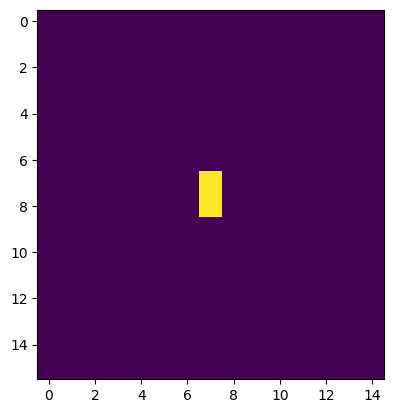

perimeter 2.0
here noise


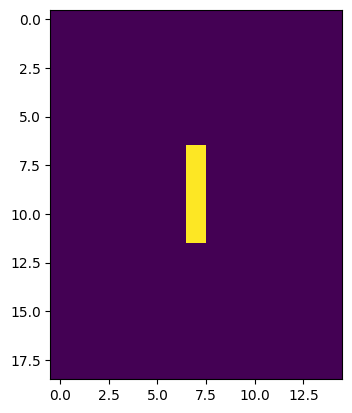

perimeter 8.0
here noise


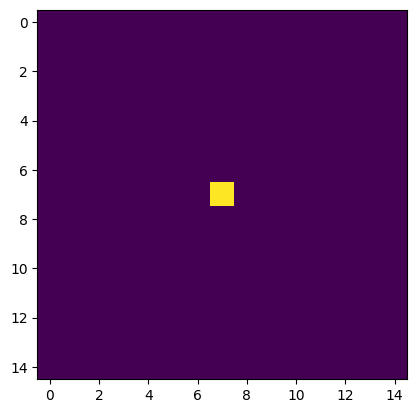

perimeter 0.0
here noise


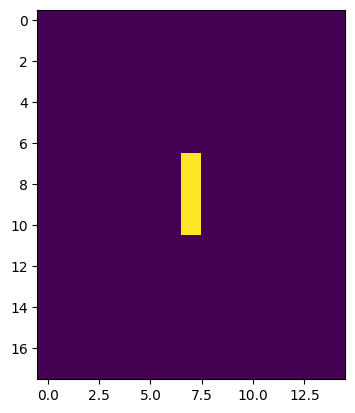

perimeter 6.0
here noise


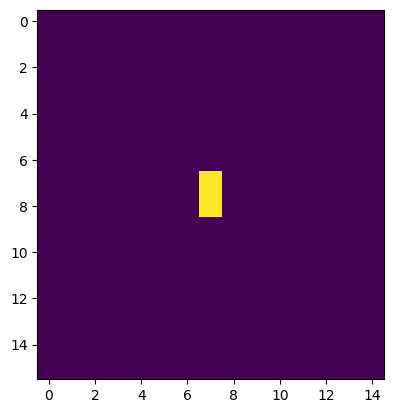

perimeter 2.0
here noise


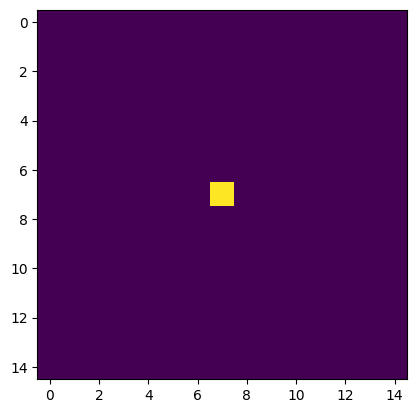

perimeter 0.0
here noise


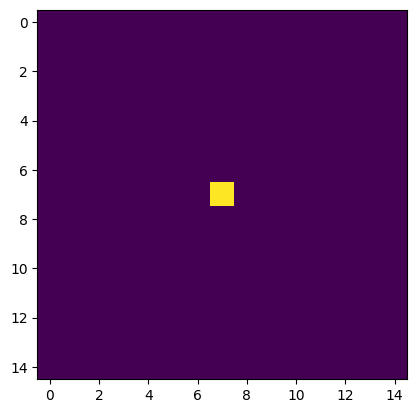

perimeter 0.0
here noise


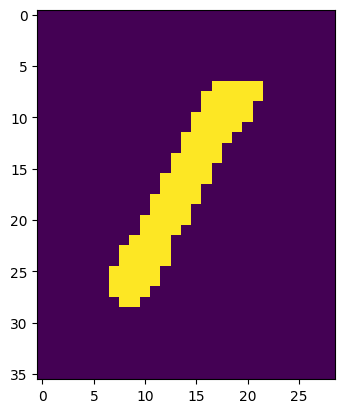

perimeter 56.52691125869751
1/1 [==============================] - 0s 47ms/step
symbol 1


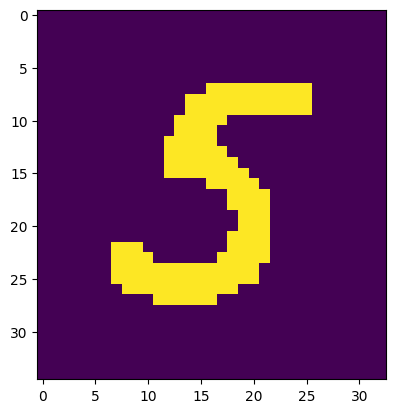

perimeter 90.52691149711609
1/1 [==============================] - 0s 86ms/step
symbol 15


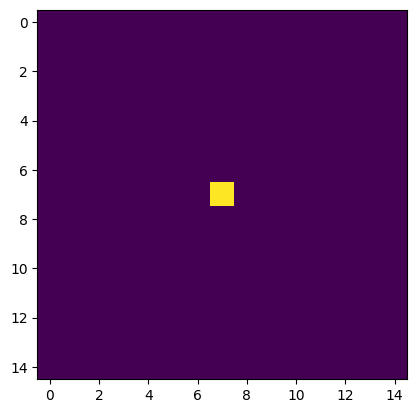

perimeter 0.0
here noise


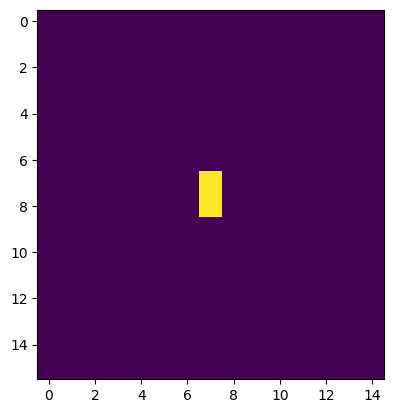

perimeter 2.0
here noise


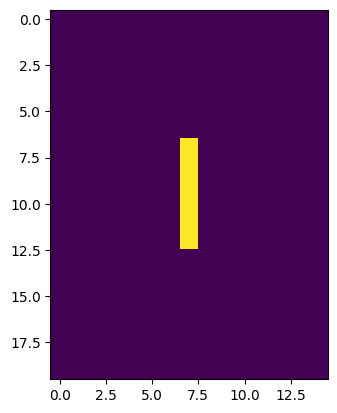

perimeter 10.0
here noise


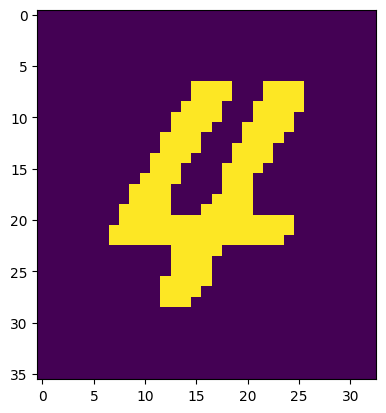

perimeter 105.49747371673584
1/1 [==============================] - 0s 48ms/step
symbol 4


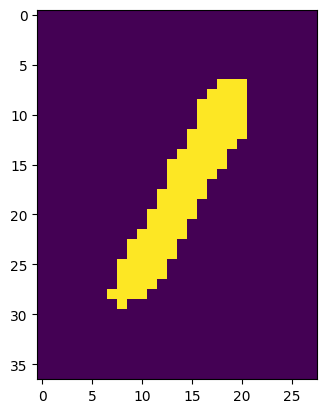

perimeter 56.5269113779068
1/1 [==============================] - 0s 51ms/step
symbol 41


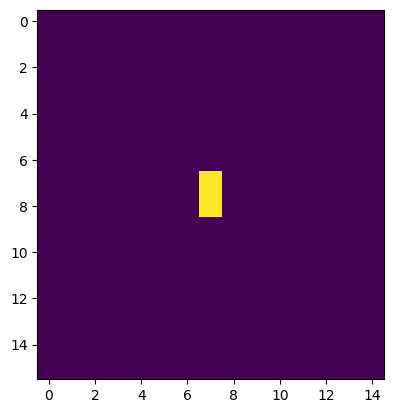

perimeter 2.0
here noise


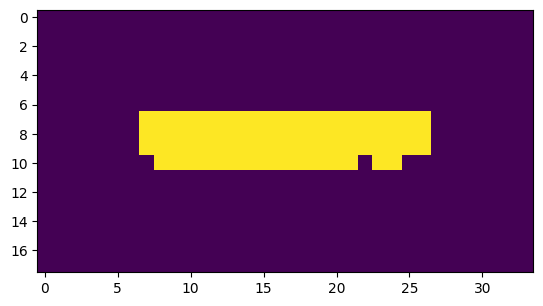

perimeter 43.65685415267944
here minus


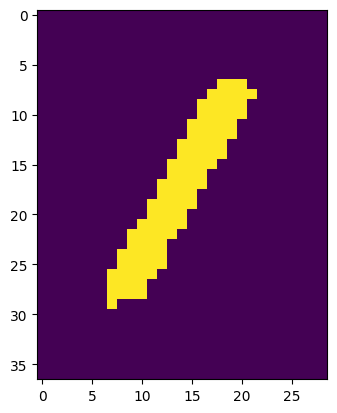

perimeter 57.94112491607666
1/1 [==============================] - 0s 64ms/step
symbol 41-1


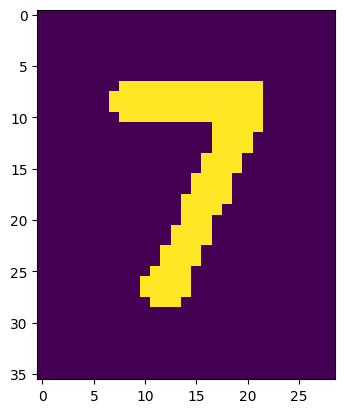

perimeter 72.87005722522736
1/1 [==============================] - 0s 39ms/step
symbol 41-17


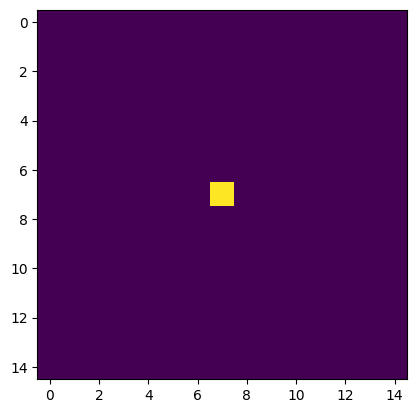

perimeter 0.0
here noise


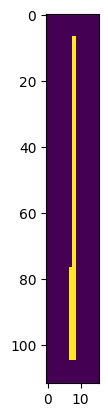

perimeter 195.41421353816986
1/1 [==============================] - 0s 35ms/step
symbol 41-171
[0, 0, 0, 0, 15, 0, 0, 0]
[]
[]
[]


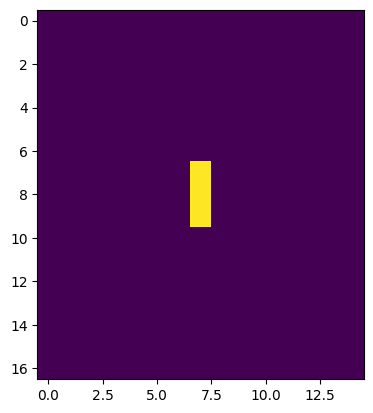

perimeter 4.0
here noise


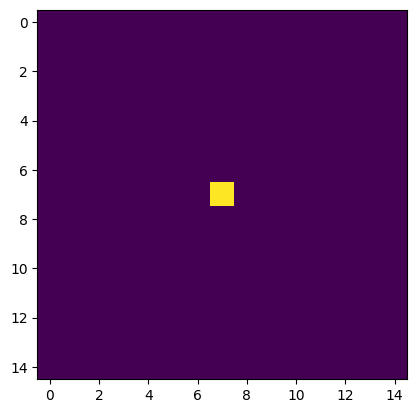

perimeter 0.0
here noise


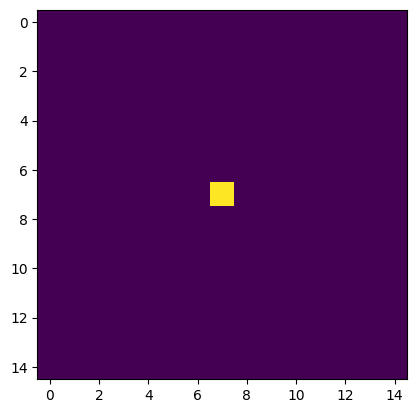

perimeter 0.0
here noise


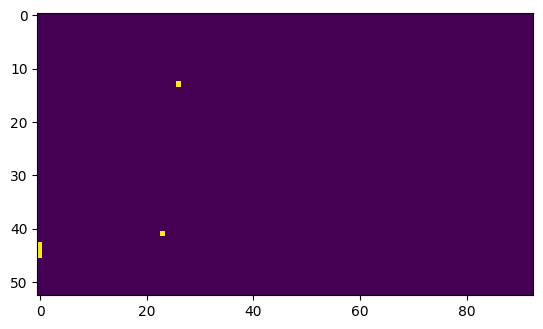

written_answer 0


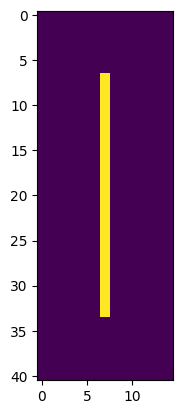

perimeter 52.0
1/1 [==============================] - 0s 37ms/step
symbol 1


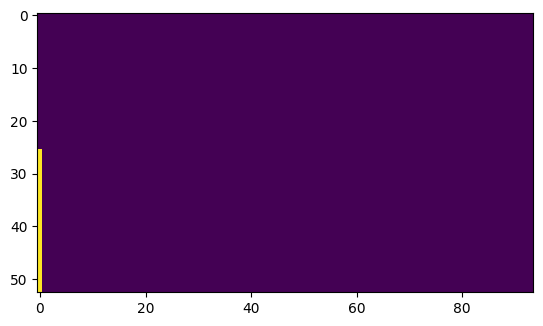

written_answer 1


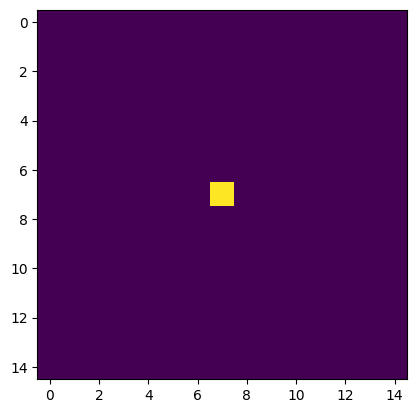

perimeter 0.0
here noise


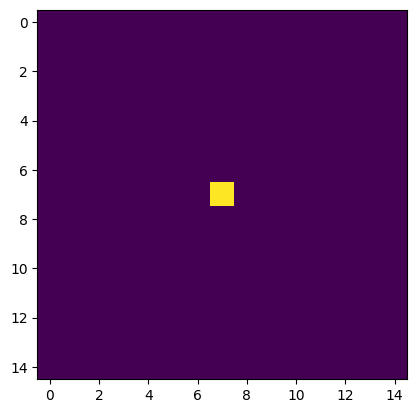

perimeter 0.0
here noise


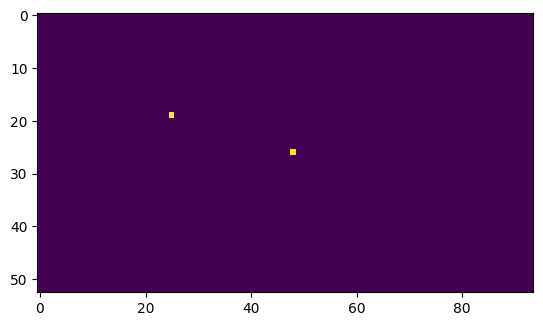

written_answer 0


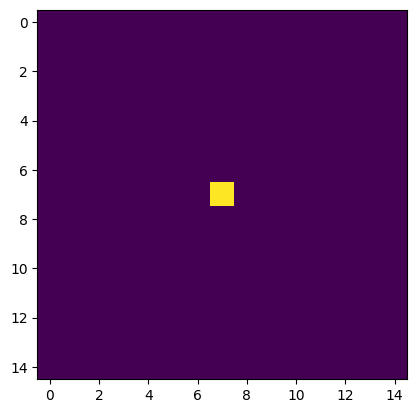

perimeter 0.0
here noise


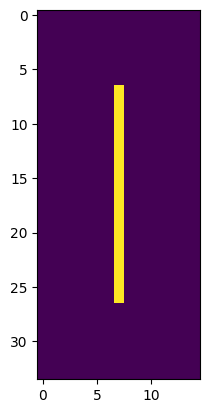

perimeter 38.0
1/1 [==============================] - 0s 35ms/step
symbol 1


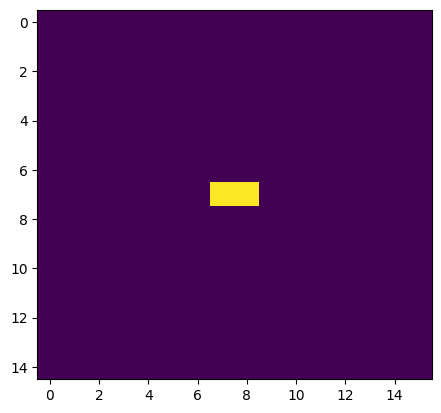

perimeter 2.0
here noise


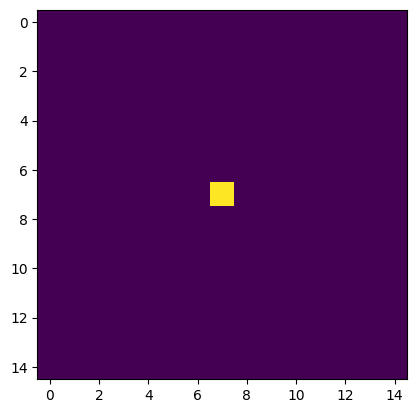

perimeter 0.0
here noise


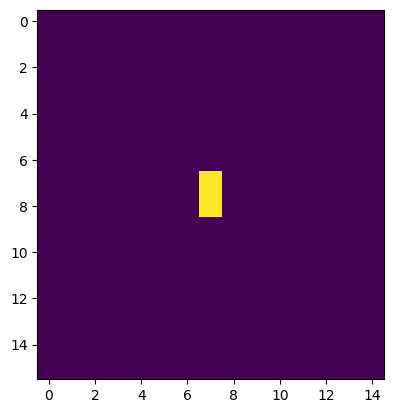

perimeter 2.0
here noise


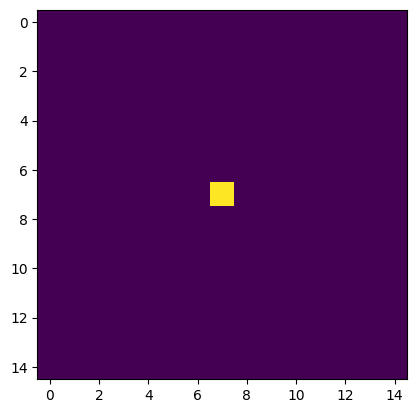

perimeter 0.0
here noise


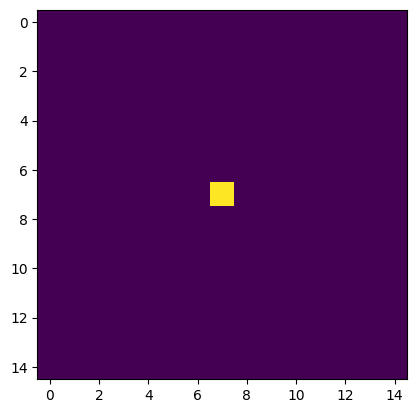

perimeter 0.0
here noise


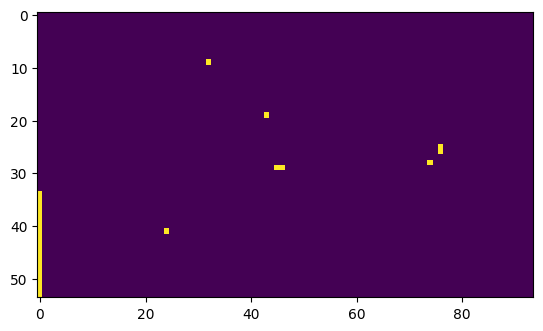

written_answer 1


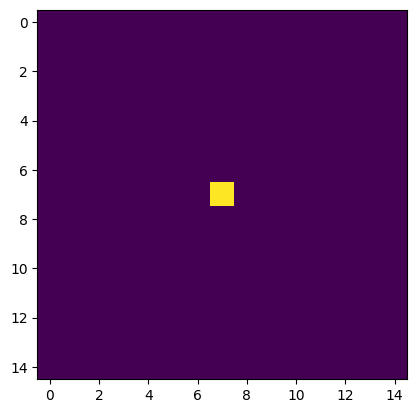

perimeter 0.0
here noise


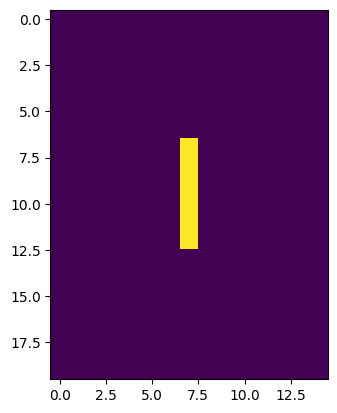

perimeter 10.0
here noise


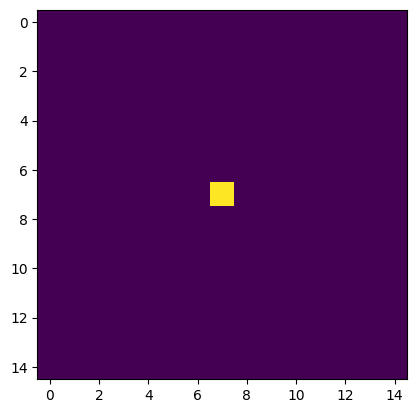

perimeter 0.0
here noise


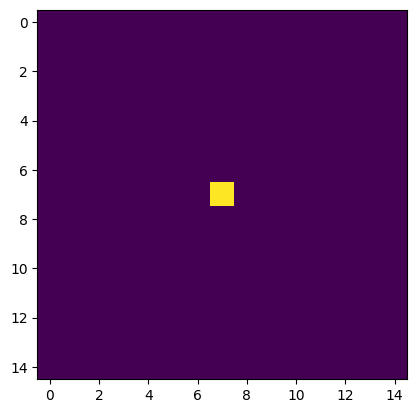

perimeter 0.0
here noise


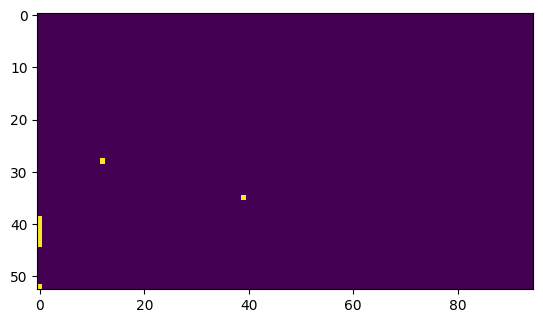

written_answer 0


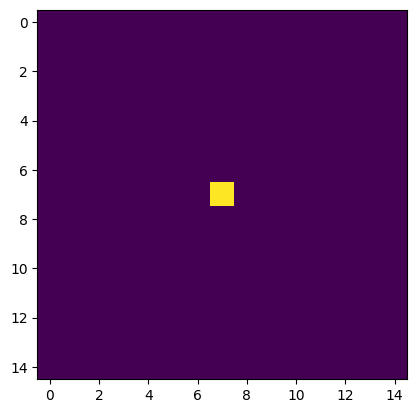

perimeter 0.0
here noise


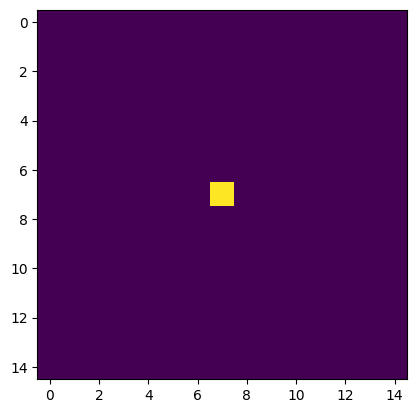

perimeter 0.0
here noise


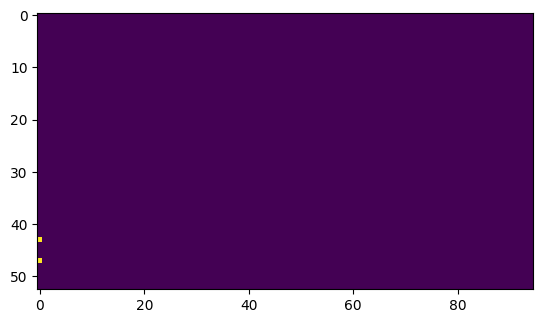

written_answer 0


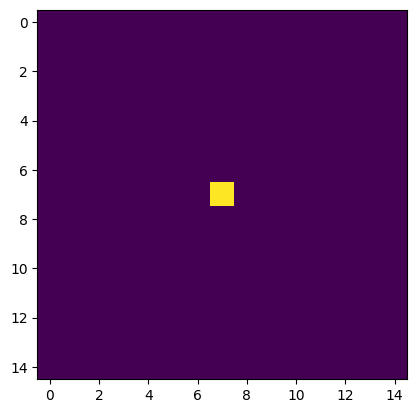

perimeter 0.0
here noise


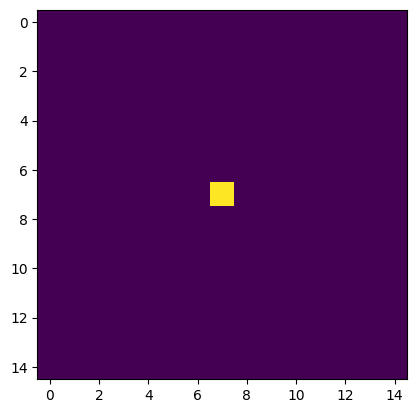

perimeter 0.0
here noise


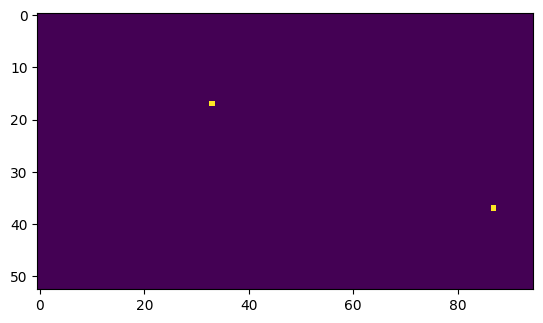

written_answer 0


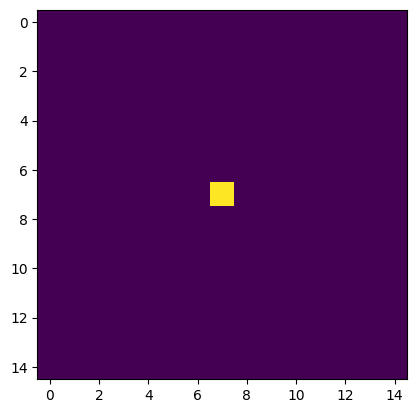

perimeter 0.0
here noise


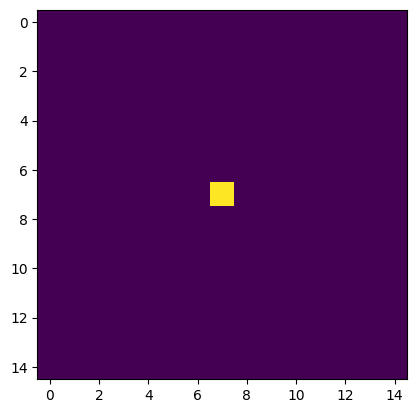

perimeter 0.0
here noise


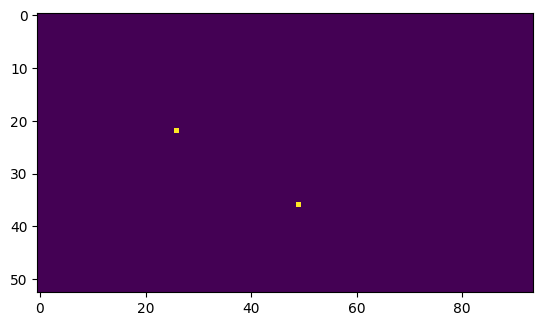

written_answer 0


ValueError: ignored

In [ ]:
sums_tasks = [] 
sums_answers = []

# gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# (thresh, img_bin) = cv2.threshold(gray, 0, 255,cv2.THRESH_BINARY_INV|cv2.THRESH_OTSU)
  #-----------------------------------------------------------------------
  #-------- для отобранных ячеек считаем суммы или определяем ответ ------
  #-----------------------------------------------------------------------
for en, c in enumerate(cells):
  # получаем номер строки
  id_row = en//(len(cells)/(num_rows*2))+1 
  x, y, w, h = cv2.boundingRect(c)
  if id_row%2 != 0: # нечетная строка
    new_img = img_rotated[y:y+h, x:x+w]
    sum_c = get_real_sums(new_img)
    print(sum_c)
    sums_tasks.append(sum(sum_c))    
  else: # четная строка
  # если нет ответа, то указываем результат, который даст false при сравнении
    if np.sum(img_rotated[y:y+h, x:x+w] <= 30) == 0:
      sums_answers.append(1e20)     
    else:
      new_img = img_rotated[y:y+h, x:x+w]  #расширить немного(на 2px) потом, потому что заезжают за ячейки?
      # new_img = np.expand_dims(new_img, axis=2)
      sum_c = get_written_sums(new_img)
      sums_answers.append(sum_c)     

wrong_answers = [i for i in range(len(sums_tasks)) if sums_tasks[i]!= sums_answers[i]]
score = len(sums_tasks) - len(wrong_answers)

In [ ]:
# отмечаем на скане, какие ответы неверные
written_contours = [c for en, c in enumerate(cells) if (en//(len(cells)/(num_rows*2))+1) %2 == 0]
wrong_contours = [i for en, i in enumerate(written_contours) if wrong_answers[en] == en]

cv2.drawContours(img, wrong_contours, -1, (0,0,255), 2)
cv2_imshow(img) # выводим итоговое изображение в окно

IndexError: ignored

In [ ]:
score

37